In [1]:
import numpy as np 
import pandas as pd 
import seaborn as sns
import sklearn 
import matplotlib.pyplot as plt
%matplotlib inline
from scipy import stats
from sklearn import linear_model

In [2]:
df = pd.read_csv("prepared_data.csv")
df=df.drop(columns=['Count','Unnamed: 0','CouncilArea'])
df.head()


,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,Bathroom,Car,Landsize,YearBuilt,Regionname,Age,Historic
0,Abbotsford,85 Turner St,2,h,1480000.0,S,Biggin,3/12/2016,2.5,3067.0,1.0,1.0,202.0,[[1954.09294906]],Northern Metropolitan,[[66.90705094]],Historic
1,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,4/02/2016,2.5,3067.0,1.0,0.0,156.0,1900.0,Northern Metropolitan,121.0,Historic
2,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,4/03/2017,2.5,3067.0,2.0,0.0,134.0,1900.0,Northern Metropolitan,121.0,Historic
3,Abbotsford,40 Federation La,3,h,850000.0,PI,Biggin,4/03/2017,2.5,3067.0,2.0,1.0,94.0,[[1954.09294906]],Northern Metropolitan,[[66.90705094]],Historic
4,Abbotsford,55a Park St,4,h,1600000.0,VB,Nelson,4/06/2016,2.5,3067.0,1.0,2.0,120.0,2014.0,Northern Metropolitan,7.0,Contemporary


In [3]:
#unique values of each of the features to check for duplication, here you can see the address column has some duplicates.
df.nunique()

Suburb          312
Address       12864
Rooms             5
Type              3
Price          2040
Method            5
SellerG         264
Date             58
Distance        200
Postcode        196
Bathroom          7
Car               5
Landsize       1388
YearBuilt       322
Regionname        8
Age             322
Historic          2
dtype: int64

In [4]:
df.isnull().sum()

Suburb        0
Address       0
Rooms         0
Type          0
Price         0
Method        0
SellerG       0
Date          0
Distance      0
Postcode      0
Bathroom      0
Car           0
Landsize      0
YearBuilt     0
Regionname    0
Age           0
Historic      0
dtype: int64

# IMPLEMENTATION OF CLASSIFICATION ALGORITHMS
There are few classification problems identified for the experiment which includes, binary and multiclass classification.
1) BINARY CLASSIFICATION: There is a new feature in dataset Historic, which labels house as 'Historic' if it is 55 years old or older, and rest of the houses are labelled as 'Contemporary'.

2)MULTICLASS CLASSIFICATION: There is a feature 'Type' which is the type of the house is, which is of three type ['h':house,'t':townhouse,'u':unit], the algorithms are used to predict the type of house based on various features.

# DECISION TREE TO CLASSIFY HOUSES BASED ON LABEL ['HISTORIC','CONTEMPORARY']
The main goal using this algorithm is the creation of a model which predicts the value of a target variable using the training data provided to it. It uses simple learning decision rules on the training data.  
The model uses a tree representation model for it’s working. For predicting a class label, the start is from the root of a tree. Then for every attribute of the record, comparison is done with the root of the tree and based on the result of comparison, the branch corresponding to that value is followed. 
Decision Tree makes use of different algorithms for decision of splitting a node into multiple sub-nodes. The purity of a node increases with respect to the target variable. The decision tree splits the nodes on all available variables and then on basis of which split results in most homogenous sub-nodes, it selects them.

In [5]:
dt_df =df

In [6]:
dt_df.head()

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,Bathroom,Car,Landsize,YearBuilt,Regionname,Age,Historic
0,Abbotsford,85 Turner St,2,h,1480000.0,S,Biggin,3/12/2016,2.5,3067.0,1.0,1.0,202.0,[[1954.09294906]],Northern Metropolitan,[[66.90705094]],Historic
1,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,4/02/2016,2.5,3067.0,1.0,0.0,156.0,1900.0,Northern Metropolitan,121.0,Historic
2,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,4/03/2017,2.5,3067.0,2.0,0.0,134.0,1900.0,Northern Metropolitan,121.0,Historic
3,Abbotsford,40 Federation La,3,h,850000.0,PI,Biggin,4/03/2017,2.5,3067.0,2.0,1.0,94.0,[[1954.09294906]],Northern Metropolitan,[[66.90705094]],Historic
4,Abbotsford,55a Park St,4,h,1600000.0,VB,Nelson,4/06/2016,2.5,3067.0,1.0,2.0,120.0,2014.0,Northern Metropolitan,7.0,Contemporary


In [7]:
dt_df.Type.unique()

<StringArray>
['h', 'u', 't']
Length: 3, dtype: str

In [8]:
dt_df.Historic.unique()

<StringArray>
['Historic', 'Contemporary']
Length: 2, dtype: str

# LABEL ENCODING:
This means convert the data from labels to numeric form, so that the machine can process the data and make decisions. For example label encoding for 'Historic' column work as such:
Historic:1, Contemporary:0

In [9]:
from sklearn.preprocessing import LabelEncoder 
#initializing an object of class LabelEncoder
labelencoder= LabelEncoder() 
 #fitting and transforming the desired categorical column.
dt_df['Historic'] = labelencoder.fit_transform(dt_df['Historic'])
 #fitting and transforming the desired categorical column.
dt_df['Type'] = labelencoder.fit_transform(dt_df['Type']) 
 #fitting and transforming the desired categorical column.
dt_df['Suburb'] = labelencoder.fit_transform(dt_df['Suburb'])
 #fitting and transforming the desired categorical column.
dt_df['Address'] = labelencoder.fit_transform(dt_df['Address'])
 #fitting and transforming the desired categorical column.
dt_df['Method'] = labelencoder.fit_transform(dt_df['Method']) 
#fitting and transforming the desired categorical column.
dt_df['Regionname'] = labelencoder.fit_transform(dt_df['Regionname'])
#fitting and transforming the desired categorical column.
dt_df['SellerG'] = labelencoder.fit_transform(dt_df['SellerG'])



In [10]:
#drop few columns for better results
dt_df=dt_df.drop(columns=['YearBuilt','Date','Age'])
dt_df.info()

<class 'pandas.DataFrame'>
RangeIndex: 12864 entries, 0 to 12863
Data columns (total 14 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Suburb      12864 non-null  int64  
 1   Address     12864 non-null  int64  
 2   Rooms       12864 non-null  int64  
 3   Type        12864 non-null  int64  
 4   Price       12864 non-null  float64
 5   Method      12864 non-null  int64  
 6   SellerG     12864 non-null  int64  
 7   Distance    12864 non-null  float64
 8   Postcode    12864 non-null  float64
 9   Bathroom    12864 non-null  float64
 10  Car         12864 non-null  float64
 11  Landsize    12864 non-null  float64
 12  Regionname  12864 non-null  int64  
 13  Historic    12864 non-null  int64  
dtypes: float64(6), int64(8)
memory usage: 1.4 MB


In [11]:
l=[]
for i in dt_df:
    if i != 'Historic':
        l.append(i)
print(dt_df['Type'].unique())
print(dt_df['Historic'].unique())

print(l)

[0 2 1]
[1 0]
['Suburb', 'Address', 'Rooms', 'Type', 'Price', 'Method', 'SellerG', 'Distance', 'Postcode', 'Bathroom', 'Car', 'Landsize', 'Regionname']


## FEATURE SELECTION:

### INFORMATION GAIN METHOD:

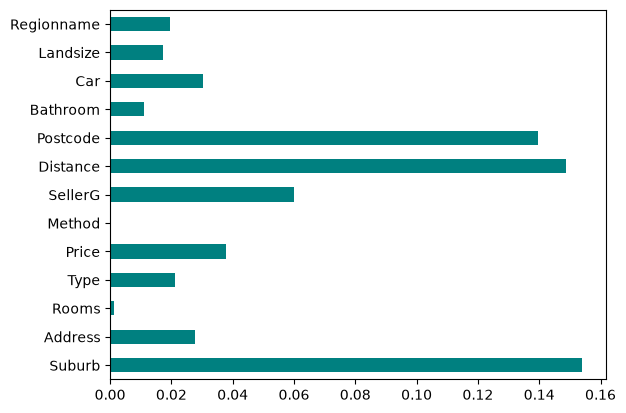

In [12]:
#graph shows all the features with highest information gain ratio.
feature_cols=l
X = dt_df[feature_cols]
y = dt_df.Historic
from sklearn.feature_selection import mutual_info_classif
import matplotlib.pyplot as plt
%matplotlib inline
importance=mutual_info_classif(X,y)
feat_importances=pd.Series(importance,dt_df.columns[0:len(dt_df.columns)-1])
feat_importances.plot(kind='barh',color='teal')
plt.show()

# Chi Squared Test for Feature Selection:
For 2 different variables we can get the expected and the observed value. By applying the below formula, we can get the chi-square value. When we try to get the best feature, the feature tends to be highly dependent on another feature. 
Mathematically speaking, the chi square indicates the value of dependency of one feature on another feature and vice- versa. So, simply if the chi square value is higher between 2 variables it implies that one of the variables is highly dependent on the another and one of those can be used in the machine learning model to predict the other feature. 

In [13]:
# the data is tranformed such that only desired features are picked
from sklearn.feature_selection import chi2
from sklearn.feature_selection import SelectKBest
X_new = pd.DataFrame(SelectKBest(chi2, k=6).fit_transform(X, y))
X_new.head()


,0,1,2,3,4,5
0,12310.0,0.0,1480000.0,2.5,3067.0,202.0
1,5724.0,0.0,1035000.0,2.5,3067.0,156.0
2,9446.0,0.0,1465000.0,2.5,3067.0,134.0
3,8682.0,0.0,850000.0,2.5,3067.0,94.0
4,10193.0,0.0,1600000.0,2.5,3067.0,120.0


# Feature Scaling
Formula: x'=(x-min(x))/(max(x)-min(x))

In [14]:
#scale the data using MinMax Scaling
from sklearn.model_selection import train_test_split
Xtrain, Xtest, ytrain, ytest = train_test_split(X_new, y, test_size=0.3, random_state=42)
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
scaler.fit(Xtrain)
Xtrain = scaler.transform(Xtrain)
Xtest = scaler.transform(Xtest)

### IDENTIFY THE DEPTH OF DECISION TREE TO BE BUILT:

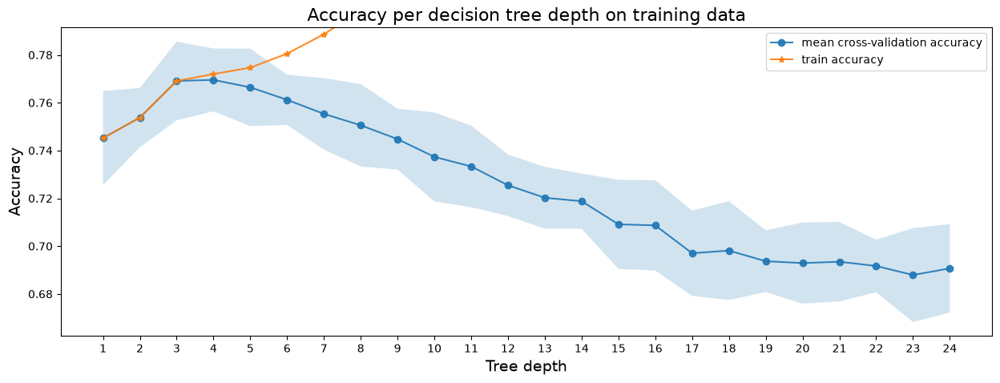

In [15]:
#graph identifies the best depth of the decision tree that can be used
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import cross_val_score
def run_cross_validation_on_trees(X, y, tree_depths, cv=5, scoring='accuracy'):
    cv_scores_list = []
    cv_scores_std = []
    cv_scores_mean = []
    accuracy_scores = []
    for depth in tree_depths:
        tree_model = DecisionTreeClassifier(max_depth=depth)
        cv_scores = cross_val_score(tree_model, X, y, cv=cv, scoring=scoring)
        cv_scores_list.append(cv_scores)
        cv_scores_mean.append(cv_scores.mean())
        cv_scores_std.append(cv_scores.std())
        accuracy_scores.append(tree_model.fit(X, y).score(X, y))
    cv_scores_mean = np.array(cv_scores_mean)
    cv_scores_std = np.array(cv_scores_std)
    accuracy_scores = np.array(accuracy_scores)
    return cv_scores_mean, cv_scores_std, accuracy_scores
  
# function for plotting cross-validation results
def plot_cross_validation_on_trees(depths, cv_scores_mean, cv_scores_std, accuracy_scores, title):
    fig, ax = plt.subplots(1,1, figsize=(15,5))
    ax.plot(depths, cv_scores_mean, '-o', label='mean cross-validation accuracy', alpha=0.9)
    ax.fill_between(depths, cv_scores_mean-2*cv_scores_std, cv_scores_mean+2*cv_scores_std, alpha=0.2)
    ylim = plt.ylim()
    ax.plot(depths, accuracy_scores, '-*', label='train accuracy', alpha=0.9)
    ax.set_title(title, fontsize=16)
    ax.set_xlabel('Tree depth', fontsize=14)
    ax.set_ylabel('Accuracy', fontsize=14)
    ax.set_ylim(ylim)
    ax.set_xticks(depths)
    ax.legend()

# fitting trees of depth 1 to 24
sm_tree_depths = range(1,25)
sm_cv_scores_mean, sm_cv_scores_std, sm_accuracy_scores = run_cross_validation_on_trees(Xtrain, ytrain, sm_tree_depths)

# plotting accuracy
plot_cross_validation_on_trees(sm_tree_depths, sm_cv_scores_mean, sm_cv_scores_std, sm_accuracy_scores, 
                               'Accuracy per decision tree depth on training data')



### TRAINING AND TESTING THE MODEL

In [16]:
# fit a classification tree with max_depth=3 as it yields the best testing accuracy
from sklearn.tree import DecisionTreeClassifier
treeclf = DecisionTreeClassifier(max_depth=3, random_state=1)
# Fit our training data
treeclf.fit(Xtrain, ytrain)
treeclf.predict(Xtest)

array([1, 0, 0, ..., 0, 1, 1], shape=(3860,))

### EVALUATION OF MODEL BUILT:

In [17]:
from sklearn.metrics import accuracy_score
print("Training accuracy: {}".format(accuracy_score(ytrain, treeclf.predict(Xtrain))))
print("Testing accuracy : {}".format(accuracy_score(ytest, treeclf.predict(Xtest))))

Training accuracy: 0.7691026210573079
Testing accuracy : 0.7712435233160622


In [18]:
from sklearn.model_selection import cross_val_score
scores = cross_val_score(treeclf, Xtrain, ytrain, cv=10, scoring='accuracy')
print("Accuracy for each fold: {}".format(scores))
print("Mean Accuracy: {}".format(np.mean(scores)))

Accuracy for each fold: [0.78024417 0.77802442 0.7791343  0.76470588 0.77888889 0.75888889
 0.74111111 0.76555556 0.78222222 0.76222222]
Mean Accuracy: 0.7690997656924405


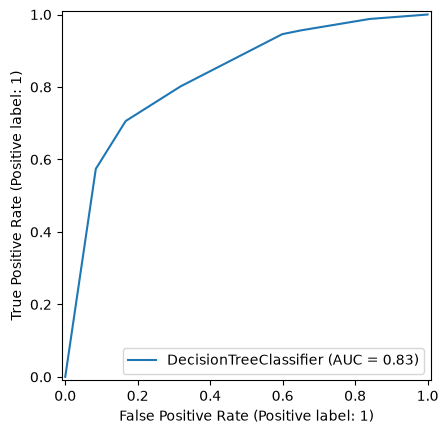

In [19]:
from sklearn import metrics
metrics.RocCurveDisplay.from_estimator(treeclf, Xtest, ytest)

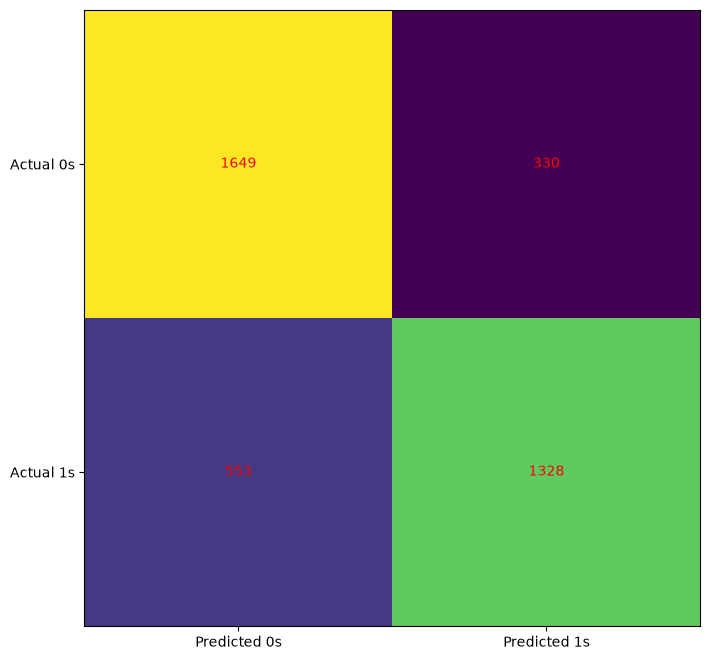

In [20]:
from sklearn.metrics import classification_report, confusion_matrix
cm=confusion_matrix(ytest, treeclf.predict(Xtest))

fig, ax = plt.subplots(figsize=(8, 8))
ax.imshow(cm)
ax.grid(False)
ax.xaxis.set(ticks=(0, 1), ticklabels=('Predicted 0s', 'Predicted 1s'))
ax.yaxis.set(ticks=(0, 1), ticklabels=('Actual 0s', 'Actual 1s'))
ax.set_ylim(1.5, -0.5)
for i in range(2):
    for j in range(2):
        ax.text(j, i, cm[i, j], ha='center', va='center', color='red')
plt.show()

In [21]:
print(classification_report(ytest, treeclf.predict(Xtest)))

              precision    recall  f1-score   support

           0       0.75      0.83      0.79      1979
           1       0.80      0.71      0.75      1881

    accuracy                           0.77      3860
   macro avg       0.77      0.77      0.77      3860
weighted avg       0.77      0.77      0.77      3860



### VISUALISE THE DECISION TREE:

In [22]:
from sklearn import tree
text_representation = tree.export_text(treeclf)
print(text_representation)

|--- feature_3 <= 0.22
|   |--- feature_1 <= 0.25
|   |   |--- feature_5 <= 0.01
|   |   |   |--- class: 1
|   |   |--- feature_5 >  0.01
|   |   |   |--- class: 1
|   |--- feature_1 >  0.25
|   |   |--- feature_4 <= 0.12
|   |   |   |--- class: 0
|   |   |--- feature_4 >  0.12
|   |   |   |--- class: 1
|--- feature_3 >  0.22
|   |--- feature_5 <= 0.03
|   |   |--- feature_5 <= 0.01
|   |   |   |--- class: 0
|   |   |--- feature_5 >  0.01
|   |   |   |--- class: 0
|   |--- feature_5 >  0.03
|   |   |--- feature_3 <= 0.31
|   |   |   |--- class: 0
|   |   |--- feature_3 >  0.31
|   |   |   |--- class: 0



In [23]:
from matplotlib import pyplot as plt
fig = plt.figure(figsize=(500,200))
cn=['Contemporary','Historic']
picture = tree.plot_tree(treeclf,node_ids=True,class_names=cn,filled=True)

#### PREDICT THE RESULT OF A DATA RECORD:

In [24]:
print(treeclf.predict(Xtest[1].reshape(1, -1)))
print(Xtest[1].reshape(1, -1))

[0]
[[0.01710465 0.         0.49843478 0.23255814 0.15046059 0.05108911]]


# LOGISTIC REGRESSION TO CLASSIFY HOUSES BASED ON LABEL ['HISTORIC','CONTEMPORARY']
Logistic regression is a simple supervised machine learning algorithm which is used as an alternative to simple linear regression. The difference between linear and logistic regression is that the linear regression tries to represent the relationship as a straight line whereas logistic regression tries to represent the relationship as a natural logarithmic function. Logarithmic regression tries to calculate the probability by using the concept of odd ratios. Simply, put it uses the odd of not happening an event against odd of happening the event. Logistic regression than uses the above-mentioned method of odds to predict a logarithmic equation to fit the data. 

### TRAINING AND TESTING THE MODEL

In [25]:
from sklearn.linear_model import LogisticRegression
clf_LR = LogisticRegression()
clf_LR.fit(Xtrain,ytrain)

,"penalty penalty: {'l1', 'l2', 'elasticnet', None}, default='l2'Specify the norm of the penalty:- `None`: no penalty is added;- `'l2'`: add an L2 penalty term and it is the default choice;- `'l1'`: add an L1 penalty term;- `'elasticnet'`: both L1 and L2 penalty terms are added... warning:: Some penalties may not work with some solvers. See the parameter `solver` below, to know the compatibility between the penalty and solver... versionadded:: 0.19 l1 penalty with SAGA solver (allowing 'multinomial' + L1).. deprecated:: 1.8 `penalty` was deprecated in version 1.8 and will be removed in 1.10. Use `l1_ratio` and `C` instead. `l1_ratio=0` for `penalty='l2'`, `l1_ratio=1` for `penalty='l1'`, `l1_ratio` set to any float between 0 and 1 for `penalty='elasticnet'`, and `C=np.inf` for `penalty=None`.",'deprecated'
,"C C: float, default=1.0Inverse of regularization strength; must be a positive float.Like in support vector machines, smaller values specify strongerregularization. `C=np.inf` results in unpenalized logistic regression.For a visual example on the effect of tuning the `C` parameterwith an L1 penalty, see::ref:`sphx_glr_auto_examples_linear_model_plot_logistic_path.py`.",1.0
,"l1_ratio l1_ratio: float, default=0.0The Elastic-Net mixing parameter, with `0 <= l1_ratio <= 1`. Setting`l1_ratio=1` gives a pure L1-penalty, setting `l1_ratio=0` a pure L2-penalty.Any value between 0 and 1 gives an Elastic-Net penalty of the form`l1_ratio * L1 + (1 - l1_ratio) * L2`... warning:: Certain values of `l1_ratio`, i.e. some penalties, may not work with some solvers. See the parameter `solver` below, to know the compatibility between the penalty and solver... versionchanged:: 1.8 Default value changed from None to 0.0... deprecated:: 1.8 `None` is deprecated and will be removed in version 1.10. Always use `l1_ratio` to specify the penalty type.",0.0
,"dual dual: bool, default=FalseDual (constrained) or primal (regularized, see also:ref:`this equation <regularized-logistic-loss>`) formulation. Dual formulationis only implemented for l2 penalty with liblinear solver. Prefer `dual=False`when n_samples > n_features.",False
,"tol tol: float, default=1e-4Tolerance for stopping criteria.",0.0001
,"fit_intercept fit_intercept: bool, default=TrueSpecifies if a constant (a.k.a. bias or intercept) should beadded to the decision function.",True
,"intercept_scaling intercept_scaling: float, default=1Useful only when the solver `liblinear` is usedand `self.fit_intercept` is set to `True`. In this case, `x` becomes`[x, self.intercept_scaling]`,i.e. a ""synthetic"" feature with constant value equal to`intercept_scaling` is appended to the instance vector.The intercept becomes``intercept_scaling * synthetic_feature_weight``... note:: The synthetic feature weight is subject to L1 or L2 regularization as all other features. To lessen the effect of regularization on synthetic feature weight (and therefore on the intercept) `intercept_scaling` has to be increased.",1
,"class_weight class_weight: dict or 'balanced', default=NoneWeights associated with classes in the form ``{class_label: weight}``.If not given, all classes are supposed to have weight one.The ""balanced"" mode uses the values of y to automatically adjustweights inversely proportional to class frequencies in the input dataas ``n_samples / (n_classes * np.bincount(y))``.Note that these weights will be multiplied with sample_weight (passedthrough the fit method) if sample_weight is specified... versionadded:: 0.17 *class_weight='balanced'*",None
,"random_state random_state: int, RandomState instance, default=NoneUsed when ``solver`` == 'sag', 'saga' or 'liblinear' to shuffle thedata. See :term:`Glossary <random_state>` for details.",None
,"solver solver: {'lbfgs', 'liblinear', 'newton-cg', 'newton-cholesky', 'sag', 'saga'}, default='lbfgs'Algorithm to use in the optimization problem. Default is 'lbfgs'.To choose a solver, you might want to consider the following aspects:- 'lbfgs' is a good default sol

### EVALUATION OF MODEL BUILT:

In [26]:
from sklearn.metrics import accuracy_score
print("Training accuracy: {}".format(accuracy_score(ytrain, clf_LR.predict(Xtrain))))
print("Testing accuracy : {}".format(accuracy_score(ytest, clf_LR.predict(Xtest))))

Training accuracy: 0.7312305641936917
Testing accuracy : 0.7230569948186528


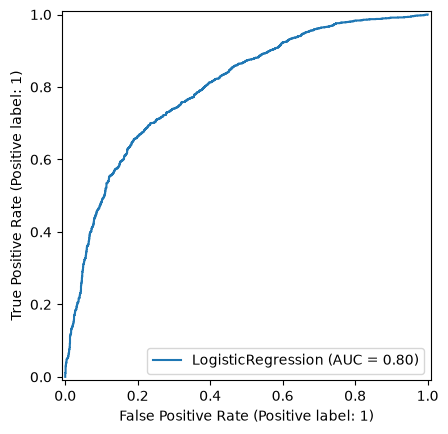

In [27]:
from sklearn import metrics
metrics.RocCurveDisplay.from_estimator(clf_LR, Xtest, ytest)

In [28]:
#parameter of the model built
clf_LR.get_params()

{'C': 1.0,
 'class_weight': None,
 'dual': False,
 'fit_intercept': True,
 'intercept_scaling': 1,
 'l1_ratio': 0.0,
 'max_iter': 100,
 'n_jobs': None,
 'penalty': 'deprecated',
 'random_state': None,
 'solver': 'lbfgs',
 'tol': 0.0001,
 'verbose': 0,
 'warm_start': False}

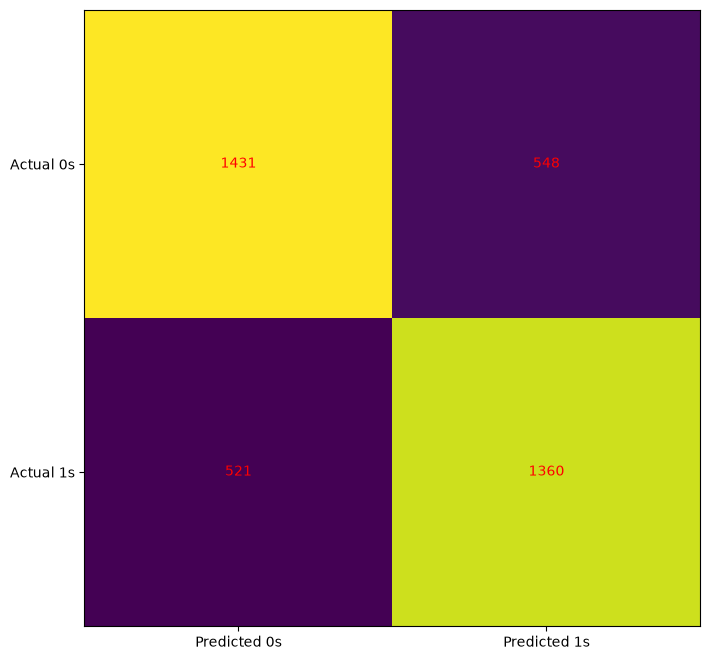

In [29]:
from sklearn.metrics import classification_report, confusion_matrix
cm=confusion_matrix(ytest, clf_LR.predict(Xtest))

fig, ax = plt.subplots(figsize=(8, 8))
ax.imshow(cm)
ax.grid(False)
ax.xaxis.set(ticks=(0, 1), ticklabels=('Predicted 0s', 'Predicted 1s'))
ax.yaxis.set(ticks=(0, 1), ticklabels=('Actual 0s', 'Actual 1s'))
ax.set_ylim(1.5, -0.5)
for i in range(2):
    for j in range(2):
        ax.text(j, i, cm[i, j], ha='center', va='center', color='red')
plt.show()

In [30]:
print(classification_report(ytest, clf_LR.predict(Xtest)))

              precision    recall  f1-score   support

           0       0.73      0.72      0.73      1979
           1       0.71      0.72      0.72      1881

    accuracy                           0.72      3860
   macro avg       0.72      0.72      0.72      3860
weighted avg       0.72      0.72      0.72      3860



In [31]:
clf_LR.predict(Xtest[1].reshape(1, -1))

array([1])

# Support Vector Class

### TRAINING AND TESTING THE MODEL

In [32]:
from sklearn.svm import SVC
svcclassifier = SVC(kernel='linear')
svcclassifier.fit(Xtrain, ytrain)

,"kernel kernel: {'linear', 'poly', 'rbf', 'sigmoid', 'precomputed'} or callable, default='rbf'Specifies the kernel type to be used in the algorithm. Ifnone is given, 'rbf' will be used. If a callable is given it is used topre-compute the kernel matrix from data matrices; that matrix should bean array of shape ``(n_samples, n_samples)``. For an intuitivevisualization of different kernel types see:ref:`sphx_glr_auto_examples_svm_plot_svm_kernels.py`.",'linear'
,"C C: float, default=1.0Regularization parameter. The strength of the regularization isinversely proportional to C. Must be strictly positive. The penaltyis a squared l2 penalty. For an intuitive visualization of the effectsof scaling the regularization parameter C, see:ref:`sphx_glr_auto_examples_svm_plot_svm_scale_c.py`.",1.0
,"degree degree: int, default=3Degree of the polynomial kernel function ('poly').Must be non-negative. Ignored by all other kernels.",3
,"gamma gamma: {'scale', 'auto'} or float, default='scale'Kernel coefficient for 'rbf', 'poly' and 'sigmoid'.- if ``gamma='scale'`` (default) is passed then it uses 1 / (n_features * X.var()) as value of gamma,- if 'auto', uses 1 / n_features- if float, must be non-negative... versionchanged:: 0.22 The default value of ``gamma`` changed from 'auto' to 'scale'.",'scale'
,"coef0 coef0: float, default=0.0Independent term in kernel function.It is only significant in 'poly' and 'sigmoid'.",0.0
,"shrinking shrinking: bool, default=TrueWhether to use the shrinking heuristic.See the :ref:`User Guide <shrinking_svm>`.",True
,"probability probability: bool, default=FalseWhether to enable probability estimates. This must be enabled priorto calling `fit`, will slow down that method as it internally uses5-fold cross-validation, and `predict_proba` may be inconsistent with`predict`. Read more in the :ref:`User Guide <scores_probabilities>`...deprecated:: 1.9 The `probability` parameter is deprecated and will be removed in 1.11. Use `CalibratedClassifierCV(SVC(), ensemble=False)` instead of `SVC(probability=True)`.",'deprecated'
,"tol tol: float, default=1e-3Tolerance for stopping criterion.",0.001
,"cache_size cache_size: float, default=200Specify the size of the kernel cache (in MB).",200
,"class_weight class_weight: dict or 'balanced', default=NoneSet the parameter C of class i to class_weight[i]*C forSVC. If not given, all classes are supposed to haveweight one.The ""balanced"" mode uses the values of y to automatically adjustweights inversely proportional to class frequencies in the input dataas ``n_samples / (n_classes * np.bincount(y))``.",None
,"verbose verbose: bool, default=FalseEnable verbose output. Note that this setting takes advantage of aper-process runtime setting in libsvm that, if enabled, may not workproperly in a multithreaded context.",False


### EVALUATION OF MODEL BUILT:

Accuracy: 0.7295336787564767


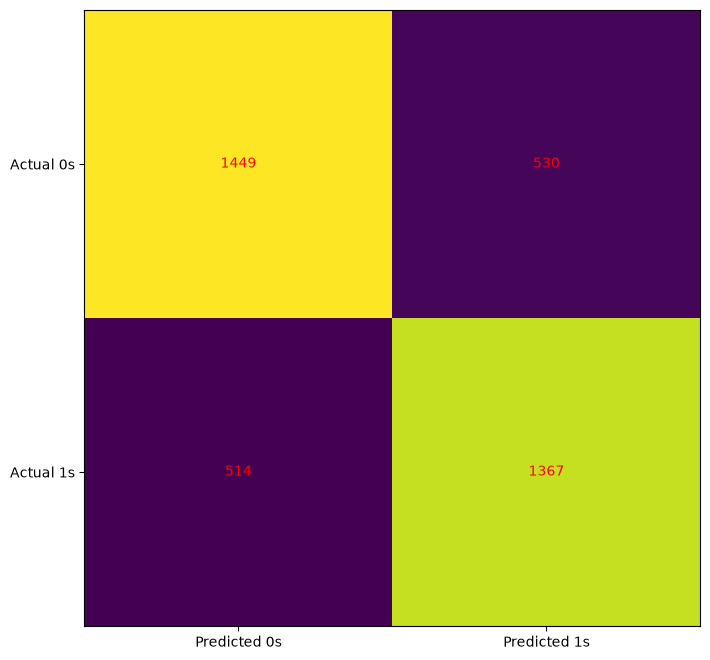

              precision    recall  f1-score   support

           0       0.74      0.73      0.74      1979
           1       0.72      0.73      0.72      1881

    accuracy                           0.73      3860
   macro avg       0.73      0.73      0.73      3860
weighted avg       0.73      0.73      0.73      3860



In [33]:
y_pred = svcclassifier.predict(Xtest)
#scikit-learn metrics module for accuracy calculation
from sklearn import metrics

# Model Accuracy: how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(ytest, y_pred))
from sklearn.metrics import classification_report, confusion_matrix
cm=confusion_matrix(ytest, y_pred)

fig, ax = plt.subplots(figsize=(8, 8))
ax.imshow(cm)
ax.grid(False)
ax.xaxis.set(ticks=(0, 1), ticklabels=('Predicted 0s', 'Predicted 1s'))
ax.yaxis.set(ticks=(0, 1), ticklabels=('Actual 0s', 'Actual 1s'))
ax.set_ylim(1.5, -0.5)
for i in range(2):
    for j in range(2):
        ax.text(j, i, cm[i, j], ha='center', va='center', color='red')
plt.show()
print(classification_report(ytest, y_pred))

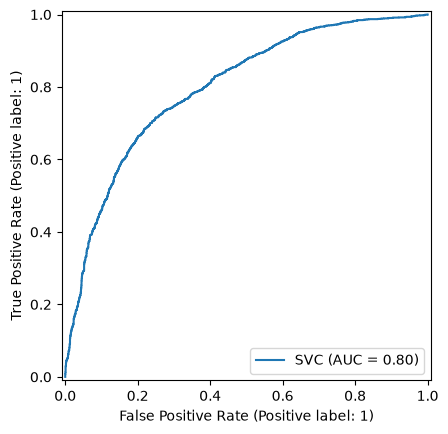

In [34]:
from sklearn import metrics
metrics.RocCurveDisplay.from_estimator(svcclassifier, Xtest, ytest)

In [35]:
w = svcclassifier.coef_[0]
print(w)

[  0.12972789  -1.2903951    1.01755763 -11.12585361   0.84223989
   0.17133977]


In [36]:
svcclassifier.predict(Xtrain[1].reshape(1, -1))

array([1])

# Apply PCA to Original dataset and Imlpement all of the algorithms:
PCA reduces the number of data features in the dataset, thus the training and testing takes less number of features, this comes in handy when the dataset has large number of features, the accuracy can still be attained even after dimensions or the reduction of number of features.

In [37]:
from sklearn.decomposition import PCA
data = dt_df.copy()
data=data.drop(columns=['Historic'])
data.info()
#pca.fit(data)

<class 'pandas.DataFrame'>
RangeIndex: 12864 entries, 0 to 12863
Data columns (total 13 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Suburb      12864 non-null  int64  
 1   Address     12864 non-null  int64  
 2   Rooms       12864 non-null  int64  
 3   Type        12864 non-null  int64  
 4   Price       12864 non-null  float64
 5   Method      12864 non-null  int64  
 6   SellerG     12864 non-null  int64  
 7   Distance    12864 non-null  float64
 8   Postcode    12864 non-null  float64
 9   Bathroom    12864 non-null  float64
 10  Car         12864 non-null  float64
 11  Landsize    12864 non-null  float64
 12  Regionname  12864 non-null  int64  
dtypes: float64(6), int64(7)
memory usage: 1.3 MB


In [38]:
from sklearn.preprocessing import MinMaxScaler
scaler=MinMaxScaler()
data=scaler.fit_transform(data)
data

array([[0.        , 0.95700847, 0.25      , ..., 0.25      , 0.01642276,
        0.28571429],
       [0.        , 0.44499728, 0.25      , ..., 0.        , 0.01268293,
        0.28571429],
       [0.        , 0.73435435, 0.5       , ..., 0.        , 0.01089431,
        0.28571429],
       ...,
       [0.97427653, 0.91510534, 0.5       , ..., 0.5       , 0.02707317,
        0.85714286],
       [0.97427653, 0.9531991 , 0.5       , ..., 1.        , 0.03544715,
        0.85714286],
       [1.        , 0.80626603, 0.75      , ..., 0.25      , 0.02943089,
        0.85714286]], shape=(12864, 13))

### SELECTION OF N-COMPONENTS:
we need to project the data along the top eigen vectors/Principal Component axes based on the n_components. But how do we select the number of n_components? 
Each of the calculated eigen values capture the variance by each component in the direction of eigen vector. The percentage of variance caused by each feature can be calculated. Thus, the n_components should be equal to the number of features which contributes to the highest percentage of variance in the analysis. 
In our analysis, we plotted a graph of cumulative explained variance ratio by calculating it using a function from PCA library. The plot of explained variance ratio vs number of components gives us the percentage of variance caused by each of the selected components without manually calculating the amount of variance captured by the eigen values. Our aim was to select the number of n_components that caused atleast 95% of the variance. 

Text(0, 0.5, 'Cumulative Explained Variance')

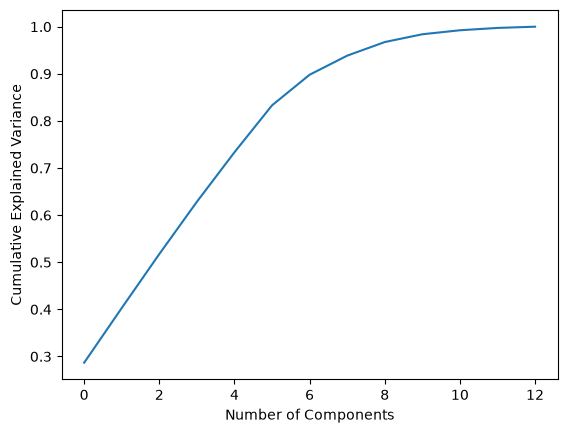

In [39]:
#plotting the graph to select n-components
pca=PCA().fit(data)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')

In [40]:
pca=PCA(n_components = 9)
pca.fit(data)
PCA_data = pca.transform(data)
print("original shape: ", data.shape)
print("transformed shape: ", PCA_data.shape)

original shape:  (12864, 13)
transformed shape:  (12864, 9)


In [41]:
print(pca.components_)
print(pca.explained_variance_)

[[ 3.63909744e-02 -6.08178618e-02 -3.49847089e-01  8.74991628e-01
  -2.18576152e-01  8.27986932e-02  4.11777308e-02 -7.56601032e-02
  -1.74468137e-03 -8.29147283e-02 -1.83321081e-01 -1.55419982e-02
   6.47785927e-02]
 [ 5.31304711e-01  3.48052800e-01 -2.67846928e-02 -7.83451635e-02
  -4.91690424e-02  3.40760319e-02  7.42400775e-01 -1.43319274e-02
  -1.32504055e-02 -1.64665733e-02 -1.29355558e-02 -3.88752158e-03
   1.84788854e-01]
 [-5.33495805e-01 -3.22969719e-01  7.09599098e-02  2.29854690e-02
   1.08979086e-01 -1.00462423e-01  3.91946343e-01  9.55411705e-04
   1.62232621e-02  4.12648873e-02  9.78087539e-02 -2.33410749e-03
   6.46822366e-01]
 [-9.48001049e-03  6.41655324e-01 -1.56289740e-02  8.87916267e-03
   7.44670638e-02  1.42386429e-01 -4.46047991e-01 -5.68034483e-02
  -6.23391081e-03  4.55259300e-03 -3.37802718e-02 -4.45450041e-03
   5.98865805e-01]
 [ 6.09173316e-01 -5.90342899e-01  3.45963114e-02 -8.13437723e-02
  -1.65395292e-02  1.88615639e-01 -2.74869337e-01 -1.14762226e-03


In [42]:
explained_variance = pca.explained_variance_ratio_
explained_variance.sum()

np.float64(0.9673981622440337)

In [43]:
df_PCA = pd.DataFrame(PCA_data)
df_PCA['Historic']=labelencoder.fit_transform(df['Historic'])
df_PCA.head()

,0,1,2,3,4,5,6,7,8,Historic
0,-0.238397,-0.430960,-0.213911,0.342078,-0.574433,-0.029598,-0.324095,0.005263,-0.237321,1
1,-0.127537,-0.598308,-0.089859,0.010479,-0.280108,-0.029682,-0.567864,0.059113,-0.066575,1
2,-0.237681,-0.497346,-0.192622,0.275337,-0.348562,0.460834,-0.366809,0.276006,0.016445,1
3,-0.295191,-0.536279,-0.096945,0.106076,-0.440935,-0.256323,-0.223598,0.013893,0.013968,1
4,-0.375551,-0.111549,0.023621,0.107967,-0.445635,0.786638,0.064589,0.122238,-0.100922,0


In [44]:
feature_cols=[0,1,2,3,4,5,6,7,8]
X = df_PCA[feature_cols]
y = df_PCA.Historic

In [45]:
from sklearn.model_selection import train_test_split
Xtrain, Xtest, ytrain, ytest = train_test_split(X, y, test_size=0.3, random_state=42)

### DECISION TREE IMPLEMENTATION ON PCA DATA TO CLASSIFY HOUSE INTO ['HISTORIC','CONTEMPORARY']

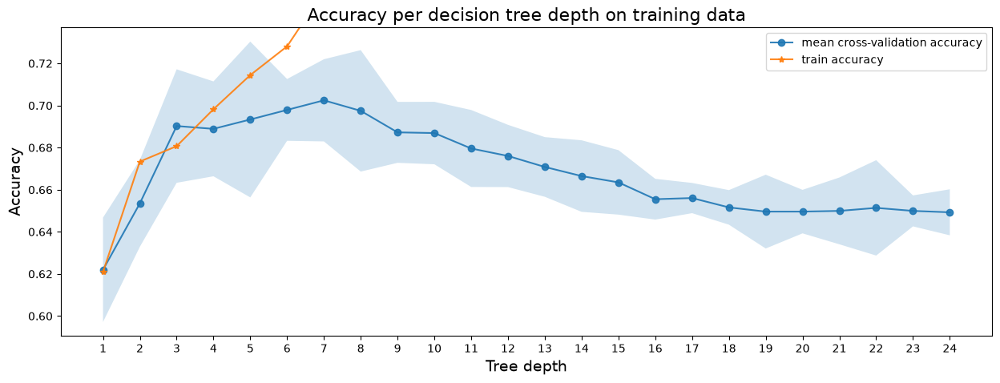

In [46]:
# fitting trees of depth 1 to 24
sm_tree_depths = range(1,25)
sm_cv_scores_mean, sm_cv_scores_std, sm_accuracy_scores = run_cross_validation_on_trees(Xtrain, ytrain, sm_tree_depths)

# plotting accuracy
plot_cross_validation_on_trees(sm_tree_depths, sm_cv_scores_mean, sm_cv_scores_std, sm_accuracy_scores, 
                               'Accuracy per decision tree depth on training data')

In [47]:
# fit a classification tree with max_depth=5
from sklearn.tree import DecisionTreeClassifier
treeclf = DecisionTreeClassifier(max_depth=7, random_state=12)
# Fit our training data
treeclf.fit(Xtrain, ytrain)

,"max_depth max_depth: int, default=NoneThe maximum depth of the tree. If None, then nodes are expanded untilall leaves are pure or until all leaves contain less thanmin_samples_split samples.",7
,"random_state random_state: int, RandomState instance or None, default=NoneControls the randomness of the estimator. The features are alwaysrandomly permuted at each split, even if ``splitter`` is set to``""best""``. When ``max_features < n_features``, the algorithm willselect ``max_features`` at random at each split before finding the bestsplit among them. But the best found split may vary across differentruns, even if ``max_features=n_features``. That is the case, if theimprovement of the criterion is identical for several splits and onesplit has to be selected at random. To obtain a deterministic behaviourduring fitting, ``random_state`` has to be fixed to an integer.See :term:`Glossary <random_state>` for details.",12
,"criterion criterion: {""gini"", ""entropy"", ""log_loss""}, default=""gini""The function to measure the quality of a split. Supported criteria are""gini"" for the Gini impurity and ""log_loss"" and ""entropy"" both for theShannon information gain, see :ref:`tree_mathematical_formulation`.",'gini'
,"splitter splitter: {""best"", ""random""}, default=""best""The strategy used to choose the split at each node. Supportedstrategies are ""best"" to choose the best split and ""random"" to choosethe best random split.",'best'
,"min_samples_split min_samples_split: int or float, default=2The minimum number of samples required to split an internal node:- If int, then consider `min_samples_split` as the minimum number.- If float, then `min_samples_split` is a fraction and `ceil(min_samples_split * n_samples)` are the minimum number of samples for each split... versionchanged:: 0.18 Added float values for fractions.",2
,"min_samples_leaf min_samples_leaf: int or float, default=1The minimum number of samples required to be at a leaf node.A split point at any depth will only be considered if it leaves atleast ``min_samples_leaf`` training samples in each of the left andright branches. This may have the effect of smoothing the model,especially in regression.- If int, then consider `min_samples_leaf` as the minimum number.- If float, then `min_samples_leaf` is a fraction and `ceil(min_samples_leaf * n_samples)` are the minimum number of samples for each node... versionchanged:: 0.18 Added float values for fractions.",1
,"min_weight_fraction_leaf min_weight_fraction_leaf: float, default=0.0The minimum weighted fraction of the sum total of weights (of allthe input samples) required to be at a leaf node. Samples haveequal weight when sample_weight is not provided.",0.0
,"max_features max_features: int, float or {""sqrt"", ""log2""}, default=NoneThe number of features to consider when looking for the best split:- If int, then consider `max_features` features at each split.- If float, then `max_features` is a fraction and `max(1, int(max_features * n_features_in_))` features are considered at each split.- If ""sqrt"", then `max_features=sqrt(n_features)`.- If ""log2"", then `max_features=log2(n_features)`.- If None, then `max_features=n_features`... note:: The search for a split does not stop until at least one valid partition of the node samples is found, even if it requires to effectively inspect more than ``max_features`` features.",None
,"max_leaf_nodes max_leaf_nodes: int, default=NoneGrow a tree with ``max_leaf_nodes`` in best-first fashion.Best nodes are defined as relative reduction in impurity.If None then unlimited number of leaf nodes.",None
,"min_impurity_decrease min_impurity_decrease: float, default=0.0A node will be split if this split induces a decrease of the impuritygreater than or equal to this value.The weighted impurity decrease equation is the following:: N_t / N * (impurity - N_t_R / N_t * right_impurity - N_t_L / N_t * left_impurity)where ``N`` is the total number of samples, ``N_t`` is the number ofsamples at 

In [48]:
from sklearn.metrics import accuracy_score
print("Training accuracy: {}".format(accuracy_score(ytrain, treeclf.predict(Xtrain))))
print("Testing accuracy : {}".format(accuracy_score(ytest, treeclf.predict(Xtest))))

Training accuracy: 0.7544424700133274
Testing accuracy : 0.6971502590673575


In [49]:
from sklearn.model_selection import cross_val_score
scores = cross_val_score(treeclf, Xtrain, ytrain, cv=10, scoring='accuracy')
print("Accuracy for each fold: {}".format(scores))
print("Mean Accuracy: {}".format(np.mean(scores)))

Accuracy for each fold: [0.68479467 0.70921199 0.73695893 0.70033296 0.68333333 0.69444444
 0.69333333 0.69444444 0.71333333 0.67333333]
Mean Accuracy: 0.6983520779380935


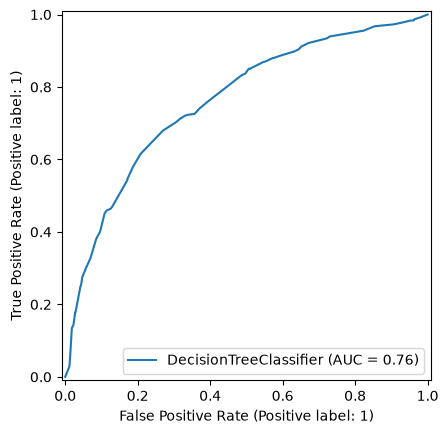

In [50]:
from sklearn import metrics
metrics.RocCurveDisplay.from_estimator(treeclf, Xtest, ytest)

In [51]:
from sklearn import tree
text_representation = tree.export_text(treeclf)
print(text_representation)

|--- feature_8 <= 0.04
|   |--- feature_0 <= 0.04
|   |   |--- feature_6 <= -0.12
|   |   |   |--- feature_7 <= -0.13
|   |   |   |   |--- feature_8 <= -0.14
|   |   |   |   |   |--- feature_2 <= 0.56
|   |   |   |   |   |   |--- feature_0 <= -0.25
|   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |--- feature_0 >  -0.25
|   |   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |--- feature_2 >  0.56
|   |   |   |   |   |   |--- class: 0
|   |   |   |   |--- feature_8 >  -0.14
|   |   |   |   |   |--- feature_3 <= 0.32
|   |   |   |   |   |   |--- feature_8 <= -0.12
|   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |--- feature_8 >  -0.12
|   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |--- feature_3 >  0.32
|   |   |   |   |   |   |--- feature_4 <= 0.13
|   |   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |   |--- feature_4 >  0.13
|   |   |   |   |   |   |   |--- class: 0
|   |   |   |--- feature_7 >  -0.13
|   |   |   |   |-

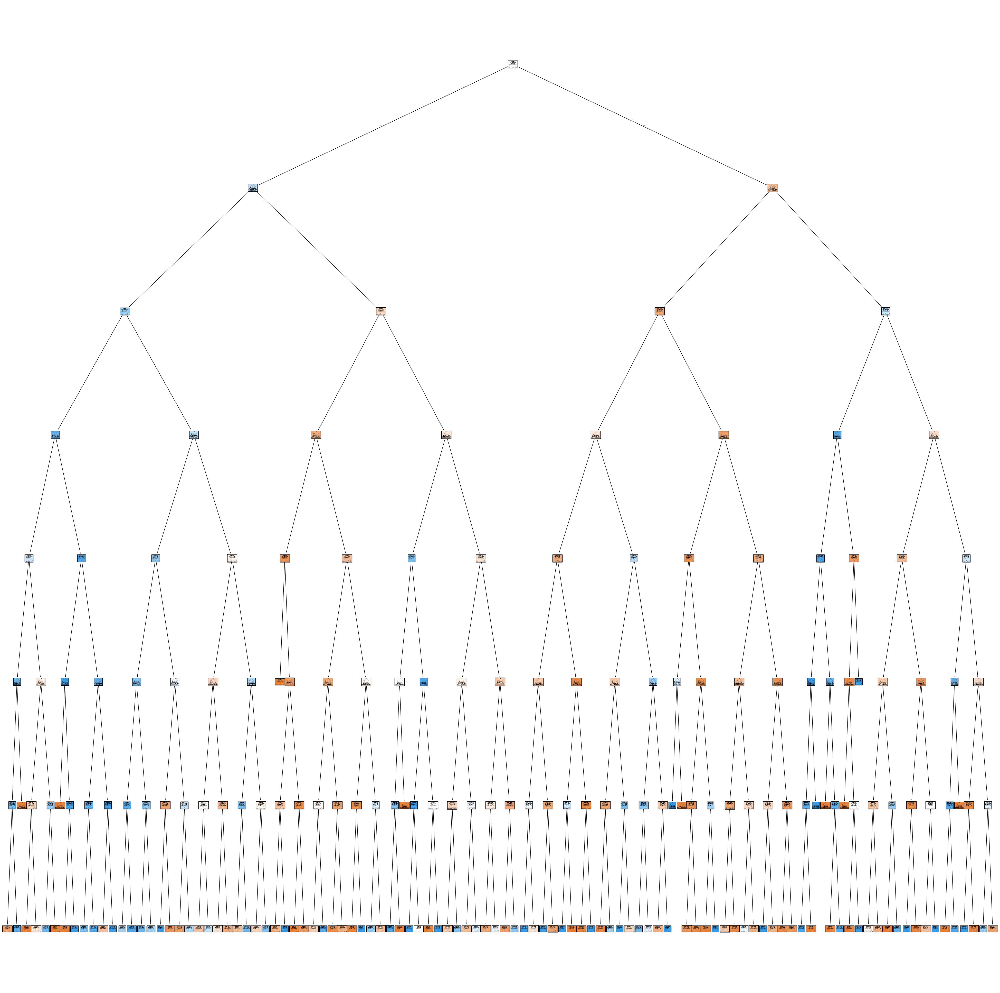

In [52]:
from matplotlib import pyplot as plt
fig = plt.figure(figsize=(50,50))
cn=['Contemporary','Historic']
picture = tree.plot_tree(treeclf,node_ids=True,class_names=cn,filled=True)

In [53]:
treeclf.predict(np.array(Xtest)[1].reshape(1, -1))

array([1])

### LOGISTIC REGRESSION USING PCA DATA

In [54]:
from sklearn.linear_model import LogisticRegression
clf_LR_PCA = LogisticRegression()
clf_LR_PCA.fit(Xtrain,ytrain)
clf_LR_PCA.score(Xtest,ytest)

0.700259067357513

In [55]:
from sklearn.metrics import accuracy_score
print("Training accuracy: {}".format(accuracy_score(ytrain, clf_LR_PCA.predict(Xtrain))))
print("Testing accuracy : {}".format(accuracy_score(ytest, clf_LR_PCA.predict(Xtest))))

Training accuracy: 0.706796979120391
Testing accuracy : 0.700259067357513


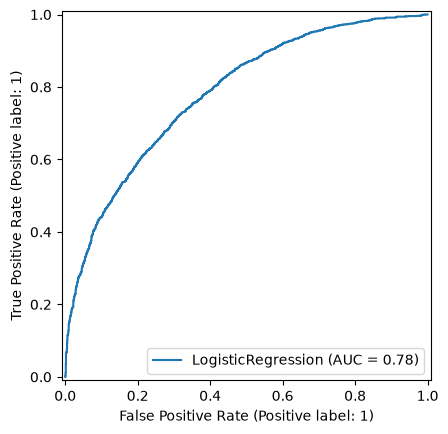

In [56]:
from sklearn import metrics
metrics.RocCurveDisplay.from_estimator(clf_LR_PCA, Xtest, ytest)

In [57]:
from sklearn.model_selection import cross_val_score

#cross-validate on the training set, not the held-out test set
scores = cross_val_score(clf_LR_PCA, Xtrain, ytrain, cv=10)
print('Cross-Validation Accuracy Scores', scores.mean())

Cross-Validation Accuracy Scores 0.7063534344555432


In [58]:
clf_LR_PCA.predict(np.array(Xtest)[1].reshape(1, -1))

array([1])

# DECISION TREE TO CATEGORISE THE HOUSE BASED ON THEIR TYPE
This is multi class classification: target feature is house type which could be either:['h':house,'t':townhouse,'u':unit].

In [59]:
type_df=df
type_df=type_df.drop(columns=['Date','YearBuilt'])
type_df.head()

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Distance,Postcode,Bathroom,Car,Landsize,Regionname,Age,Historic
0,0,12310,2,0,1480000.0,1,23,2.5,3067.0,1.0,1.0,202.0,2,[[66.90705094]],1
1,0,5724,2,0,1035000.0,1,23,2.5,3067.0,1.0,0.0,156.0,2,121.0,1
2,0,9446,3,0,1465000.0,3,23,2.5,3067.0,2.0,0.0,134.0,2,121.0,1
3,0,8682,3,0,850000.0,0,23,2.5,3067.0,2.0,1.0,94.0,2,[[66.90705094]],1
4,0,10193,4,0,1600000.0,4,154,2.5,3067.0,1.0,2.0,120.0,2,7.0,0


In [60]:
type_df=type_df.drop(columns=['Age'])
type_df.info()

<class 'pandas.DataFrame'>
RangeIndex: 12864 entries, 0 to 12863
Data columns (total 14 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Suburb      12864 non-null  int64  
 1   Address     12864 non-null  int64  
 2   Rooms       12864 non-null  int64  
 3   Type        12864 non-null  int64  
 4   Price       12864 non-null  float64
 5   Method      12864 non-null  int64  
 6   SellerG     12864 non-null  int64  
 7   Distance    12864 non-null  float64
 8   Postcode    12864 non-null  float64
 9   Bathroom    12864 non-null  float64
 10  Car         12864 non-null  float64
 11  Landsize    12864 non-null  float64
 12  Regionname  12864 non-null  int64  
 13  Historic    12864 non-null  int64  
dtypes: float64(6), int64(8)
memory usage: 1.4 MB


In [61]:
l=[]
for i in type_df:
    if i != 'Type':
        l.append(i)
print(type_df['Type'].unique())
print(type_df['Historic'].unique())
print(type_df.info())
feature_cols=l
X = type_df[feature_cols]
y = type_df.Type

[0 2 1]
[1 0]
<class 'pandas.DataFrame'>
RangeIndex: 12864 entries, 0 to 12863
Data columns (total 14 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Suburb      12864 non-null  int64  
 1   Address     12864 non-null  int64  
 2   Rooms       12864 non-null  int64  
 3   Type        12864 non-null  int64  
 4   Price       12864 non-null  float64
 5   Method      12864 non-null  int64  
 6   SellerG     12864 non-null  int64  
 7   Distance    12864 non-null  float64
 8   Postcode    12864 non-null  float64
 9   Bathroom    12864 non-null  float64
 10  Car         12864 non-null  float64
 11  Landsize    12864 non-null  float64
 12  Regionname  12864 non-null  int64  
 13  Historic    12864 non-null  int64  
dtypes: float64(6), int64(8)
memory usage: 1.4 MB
None


In [62]:
X.info()
from sklearn.feature_selection import chi2
from sklearn.feature_selection import SelectKBest
X_new = pd.DataFrame(SelectKBest(chi2, k=5).fit_transform(X, y))
X_new.head()

<class 'pandas.DataFrame'>
RangeIndex: 12864 entries, 0 to 12863
Data columns (total 13 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Suburb      12864 non-null  int64  
 1   Address     12864 non-null  int64  
 2   Rooms       12864 non-null  int64  
 3   Price       12864 non-null  float64
 4   Method      12864 non-null  int64  
 5   SellerG     12864 non-null  int64  
 6   Distance    12864 non-null  float64
 7   Postcode    12864 non-null  float64
 8   Bathroom    12864 non-null  float64
 9   Car         12864 non-null  float64
 10  Landsize    12864 non-null  float64
 11  Regionname  12864 non-null  int64  
 12  Historic    12864 non-null  int64  
dtypes: float64(6), int64(7)
memory usage: 1.3 MB


,0,1,2,3,4
0,0.0,12310.0,1480000.0,2.5,202.0
1,0.0,5724.0,1035000.0,2.5,156.0
2,0.0,9446.0,1465000.0,2.5,134.0
3,0.0,8682.0,850000.0,2.5,94.0
4,0.0,10193.0,1600000.0,2.5,120.0


In [63]:
from sklearn.model_selection import train_test_split
Xtrain, Xtest, ytrain, ytest = train_test_split(X, y, test_size=0.3, random_state=42)
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
scaler.fit(Xtrain)
Xtrain = scaler.transform(Xtrain)
Xtest = scaler.transform(Xtest)

### Find the best depth of the decision tree.

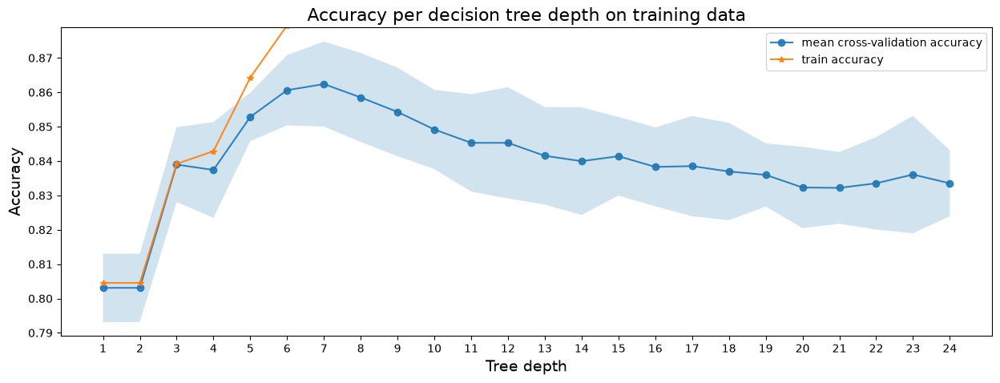

In [64]:
# fitting trees of depth 1 to 24
sm_tree_depths = range(1,25)
sm_cv_scores_mean, sm_cv_scores_std, sm_accuracy_scores = run_cross_validation_on_trees(Xtrain, ytrain, sm_tree_depths)

# plotting accuracy
plot_cross_validation_on_trees(sm_tree_depths, sm_cv_scores_mean, sm_cv_scores_std, sm_accuracy_scores, 
                               'Accuracy per decision tree depth on training data')


### TRAINING AND TESTING THE MODEL

In [65]:
#training the model with max depth being 6.
from sklearn.tree import DecisionTreeClassifier
treeclf = DecisionTreeClassifier(max_depth=6, random_state=1)
# Fit our training data
treeclf.fit(Xtrain, ytrain)

,"max_depth max_depth: int, default=NoneThe maximum depth of the tree. If None, then nodes are expanded untilall leaves are pure or until all leaves contain less thanmin_samples_split samples.",6
,"random_state random_state: int, RandomState instance or None, default=NoneControls the randomness of the estimator. The features are alwaysrandomly permuted at each split, even if ``splitter`` is set to``""best""``. When ``max_features < n_features``, the algorithm willselect ``max_features`` at random at each split before finding the bestsplit among them. But the best found split may vary across differentruns, even if ``max_features=n_features``. That is the case, if theimprovement of the criterion is identical for several splits and onesplit has to be selected at random. To obtain a deterministic behaviourduring fitting, ``random_state`` has to be fixed to an integer.See :term:`Glossary <random_state>` for details.",1
,"criterion criterion: {""gini"", ""entropy"", ""log_loss""}, default=""gini""The function to measure the quality of a split. Supported criteria are""gini"" for the Gini impurity and ""log_loss"" and ""entropy"" both for theShannon information gain, see :ref:`tree_mathematical_formulation`.",'gini'
,"splitter splitter: {""best"", ""random""}, default=""best""The strategy used to choose the split at each node. Supportedstrategies are ""best"" to choose the best split and ""random"" to choosethe best random split.",'best'
,"min_samples_split min_samples_split: int or float, default=2The minimum number of samples required to split an internal node:- If int, then consider `min_samples_split` as the minimum number.- If float, then `min_samples_split` is a fraction and `ceil(min_samples_split * n_samples)` are the minimum number of samples for each split... versionchanged:: 0.18 Added float values for fractions.",2
,"min_samples_leaf min_samples_leaf: int or float, default=1The minimum number of samples required to be at a leaf node.A split point at any depth will only be considered if it leaves atleast ``min_samples_leaf`` training samples in each of the left andright branches. This may have the effect of smoothing the model,especially in regression.- If int, then consider `min_samples_leaf` as the minimum number.- If float, then `min_samples_leaf` is a fraction and `ceil(min_samples_leaf * n_samples)` are the minimum number of samples for each node... versionchanged:: 0.18 Added float values for fractions.",1
,"min_weight_fraction_leaf min_weight_fraction_leaf: float, default=0.0The minimum weighted fraction of the sum total of weights (of allthe input samples) required to be at a leaf node. Samples haveequal weight when sample_weight is not provided.",0.0
,"max_features max_features: int, float or {""sqrt"", ""log2""}, default=NoneThe number of features to consider when looking for the best split:- If int, then consider `max_features` features at each split.- If float, then `max_features` is a fraction and `max(1, int(max_features * n_features_in_))` features are considered at each split.- If ""sqrt"", then `max_features=sqrt(n_features)`.- If ""log2"", then `max_features=log2(n_features)`.- If None, then `max_features=n_features`... note:: The search for a split does not stop until at least one valid partition of the node samples is found, even if it requires to effectively inspect more than ``max_features`` features.",None
,"max_leaf_nodes max_leaf_nodes: int, default=NoneGrow a tree with ``max_leaf_nodes`` in best-first fashion.Best nodes are defined as relative reduction in impurity.If None then unlimited number of leaf nodes.",None
,"min_impurity_decrease min_impurity_decrease: float, default=0.0A node will be split if this split induces a decrease of the impuritygreater than or equal to this value.The weighted impurity decrease equation is the following:: N_t / N * (impurity - N_t_R / N_t * right_impurity - N_t_L / N_t * left_impurity)where ``N`` is the total number of samples, ``N_t`` is the number ofsamples at t

### EVALUATION OF THE MODEL

In [66]:
from sklearn.metrics import accuracy_score
print("Training accuracy: {}".format(accuracy_score(ytrain, treeclf.predict(Xtrain))))
print("Testing accuracy : {}".format(accuracy_score(ytest, treeclf.predict(Xtest))))

Training accuracy: 0.8794980008884941
Testing accuracy : 0.855699481865285


In [67]:
from sklearn import tree
text_representation = tree.export_text(treeclf)
print(text_representation)

|--- feature_10 <= 0.01
|   |--- feature_2 <= 0.38
|   |   |--- feature_10 <= 0.00
|   |   |   |--- feature_3 <= 0.19
|   |   |   |   |--- feature_6 <= 0.16
|   |   |   |   |   |--- feature_3 <= 0.08
|   |   |   |   |   |   |--- class: 2
|   |   |   |   |   |--- feature_3 >  0.08
|   |   |   |   |   |   |--- class: 2
|   |   |   |   |--- feature_6 >  0.16
|   |   |   |   |   |--- feature_3 <= 0.14
|   |   |   |   |   |   |--- class: 2
|   |   |   |   |   |--- feature_3 >  0.14
|   |   |   |   |   |   |--- class: 2
|   |   |   |--- feature_3 >  0.19
|   |   |   |   |--- feature_7 <= 0.09
|   |   |   |   |   |--- feature_6 <= 0.07
|   |   |   |   |   |   |--- class: 2
|   |   |   |   |   |--- feature_6 >  0.07
|   |   |   |   |   |   |--- class: 2
|   |   |   |   |--- feature_7 >  0.09
|   |   |   |   |   |--- feature_6 <= 0.20
|   |   |   |   |   |   |--- class: 2
|   |   |   |   |   |--- feature_6 >  0.20
|   |   |   |   |   |   |--- class: 2
|   |   |--- feature_10 >  0.00
|   |   |  

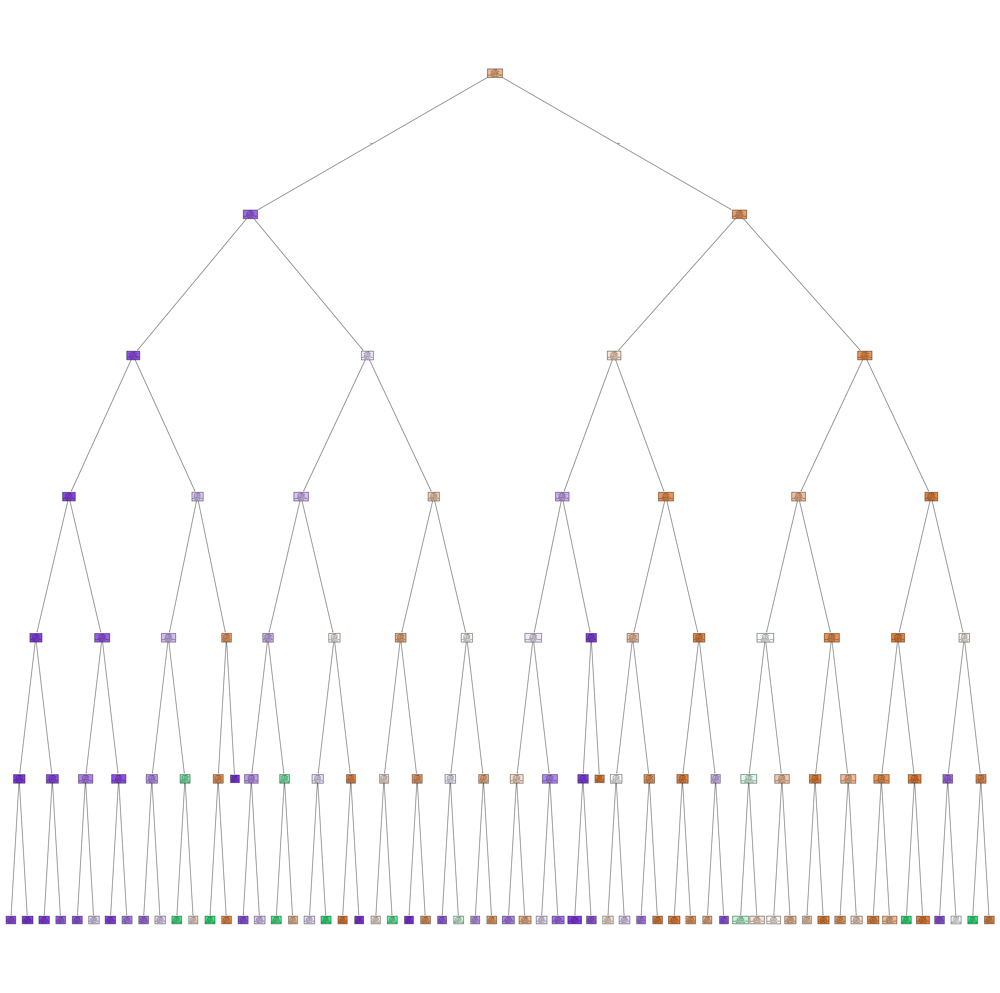

In [68]:
from matplotlib import pyplot as plt
fig = plt.figure(figsize=(50,50))
cn=['House','Townhouse','Unit']
picture = tree.plot_tree(treeclf,node_ids=True,class_names=cn,filled=True)

In [69]:
treeclf.predict(np.array(Xtest)[1].reshape(1, -1))

array([0])

# LOGISTIC REGRESSION TO CATEGORISE HOUSES BASED ON THEIR TYPES
This is multi class classification: target feature is house type which could be either:['h':house,'t':townhouse,'u':unit].

### TRAINING AND TESTING THE MODEL

In [70]:
from sklearn.linear_model import LogisticRegression
LR_PCA = LogisticRegression()
LR_PCA.fit(Xtrain,ytrain)
LR_PCA.score(Xtest,ytest)

0.8321243523316062

### EVALUATION OF THE MODEL

In [71]:
from sklearn.metrics import accuracy_score
print("Training accuracy: {}".format(accuracy_score(ytrain, LR_PCA.predict(Xtrain))))
print("Testing accuracy : {}".format(accuracy_score(ytest, LR_PCA.predict(Xtest))))

Training accuracy: 0.8388494002665482
Testing accuracy : 0.8321243523316062


In [72]:
LR_PCA.predict(np.array(Xtest)[1].reshape(1, -1))

array([0])

# NAIVE BAYES ALGORITHM TO CATEGORISE HOUSES BASED ON THEIR TYPES
This is multi class classification: target feature is house type which could be either:['h':house,'t':townhouse,'u':unit].

In [73]:
from sklearn.naive_bayes import GaussianNB
gnb = GaussianNB()
gnb.fit(Xtrain,ytrain)
from sklearn.metrics import accuracy_score
print("Training accuracy: {}".format(accuracy_score(ytrain, gnb.predict(Xtrain))))
print("Testing accuracy : {}".format(accuracy_score(ytest, gnb.predict(Xtest))))

Training accuracy: 0.8218569524655709
Testing accuracy : 0.8183937823834196


In [74]:
gnb.predict(np.array(Xtest)[1].reshape(1, -1))

array([0])

# SVM ALGORITHM TO CATEGORISE HOUSES BASED ON THEIR TYPES
This is multi class classification: target feature is house type which could be either:['h':house,'t':townhouse,'u':unit].

In [75]:
from sklearn import svm
clf = svm.SVC(kernel='linear', C=1)
clf.fit(Xtrain,ytrain)

,"kernel kernel: {'linear', 'poly', 'rbf', 'sigmoid', 'precomputed'} or callable, default='rbf'Specifies the kernel type to be used in the algorithm. Ifnone is given, 'rbf' will be used. If a callable is given it is used topre-compute the kernel matrix from data matrices; that matrix should bean array of shape ``(n_samples, n_samples)``. For an intuitivevisualization of different kernel types see:ref:`sphx_glr_auto_examples_svm_plot_svm_kernels.py`.",'linear'
,"C C: float, default=1.0Regularization parameter. The strength of the regularization isinversely proportional to C. Must be strictly positive. The penaltyis a squared l2 penalty. For an intuitive visualization of the effectsof scaling the regularization parameter C, see:ref:`sphx_glr_auto_examples_svm_plot_svm_scale_c.py`.",1
,"degree degree: int, default=3Degree of the polynomial kernel function ('poly').Must be non-negative. Ignored by all other kernels.",3
,"gamma gamma: {'scale', 'auto'} or float, default='scale'Kernel coefficient for 'rbf', 'poly' and 'sigmoid'.- if ``gamma='scale'`` (default) is passed then it uses 1 / (n_features * X.var()) as value of gamma,- if 'auto', uses 1 / n_features- if float, must be non-negative... versionchanged:: 0.22 The default value of ``gamma`` changed from 'auto' to 'scale'.",'scale'
,"coef0 coef0: float, default=0.0Independent term in kernel function.It is only significant in 'poly' and 'sigmoid'.",0.0
,"shrinking shrinking: bool, default=TrueWhether to use the shrinking heuristic.See the :ref:`User Guide <shrinking_svm>`.",True
,"probability probability: bool, default=FalseWhether to enable probability estimates. This must be enabled priorto calling `fit`, will slow down that method as it internally uses5-fold cross-validation, and `predict_proba` may be inconsistent with`predict`. Read more in the :ref:`User Guide <scores_probabilities>`...deprecated:: 1.9 The `probability` parameter is deprecated and will be removed in 1.11. Use `CalibratedClassifierCV(SVC(), ensemble=False)` instead of `SVC(probability=True)`.",'deprecated'
,"tol tol: float, default=1e-3Tolerance for stopping criterion.",0.001
,"cache_size cache_size: float, default=200Specify the size of the kernel cache (in MB).",200
,"class_weight class_weight: dict or 'balanced', default=NoneSet the parameter C of class i to class_weight[i]*C forSVC. If not given, all classes are supposed to haveweight one.The ""balanced"" mode uses the values of y to automatically adjustweights inversely proportional to class frequencies in the input dataas ``n_samples / (n_classes * np.bincount(y))``.",None
,"verbose verbose: bool, default=FalseEnable verbose output. Note that this setting takes advantage of aper-process runtime setting in libsvm that, if enabled, may not workproperly in a multithreaded context.",False


In [76]:
from sklearn.metrics import accuracy_score
print("Training accuracy: {}".format(accuracy_score(ytrain, clf.predict(Xtrain))))
print("Testing accuracy : {}".format(accuracy_score(ytest, clf.predict(Xtest))))

Training accuracy: 0.8371834740115505


Testing accuracy : 0.833678756476684


In [77]:
clf.predict(np.array(Xtest)[1].reshape(1, -1))

array([0])

# REGRESSION PROBLEMS AS IDENTIFIED:
The price feature is the target feature for this experiment, regression models are built with continuous feature being the target feature, thus the problem statement would be:
Predict the house price of the house given various features?

## Multiple Linear Regression
In Multiple regression, there is just one dependent variable i.e. y. But, the predictor variables or parameters are multiple. As in our case the dependent variable is 'Price', whereas various parameters are utilised to come up with the results.

### Selecting data features and data

In [78]:

data=df
# Create correlation matrix
corr_matrix = data.corr(numeric_only=True).abs()

# Select upper triangle of correlation matrix (excluding the diagonal)
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# Find index of feature columns with correlation greater than 0.80
to_drop = [column for column in upper.columns if any(upper[column] > 0.80)]
display(data.shape)
# Drop correlated features
for i in to_drop:
    data = data.drop(i, axis=1)
data.shape

(12864, 17)

(12864, 17)

### LABEL ENCODING:

In [79]:
from sklearn.preprocessing import LabelEncoder 
#initializing an object of class LabelEncoder
labelencoder= LabelEncoder() 
#fitting and transforming the desired categorical column.
data['Suburb'] = labelencoder.fit_transform(data['Suburb'])
data['Address'] = labelencoder.fit_transform(data['Address'])
data['Type'] = labelencoder.fit_transform(data['Type']) 
data['Method'] = labelencoder.fit_transform(data['Method']) 
data['Regionname'] = labelencoder.fit_transform(data['Regionname'])
data['SellerG'] = labelencoder.fit_transform(data['SellerG'])
data=data.drop(columns=['YearBuilt','Date','Age'])
data.info()

<class 'pandas.DataFrame'>
RangeIndex: 12864 entries, 0 to 12863
Data columns (total 14 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Suburb      12864 non-null  int64  
 1   Address     12864 non-null  int64  
 2   Rooms       12864 non-null  int64  
 3   Type        12864 non-null  int64  
 4   Price       12864 non-null  float64
 5   Method      12864 non-null  int64  
 6   SellerG     12864 non-null  int64  
 7   Distance    12864 non-null  float64
 8   Postcode    12864 non-null  float64
 9   Bathroom    12864 non-null  float64
 10  Car         12864 non-null  float64
 11  Landsize    12864 non-null  float64
 12  Regionname  12864 non-null  int64  
 13  Historic    12864 non-null  int64  
dtypes: float64(6), int64(8)
memory usage: 1.4 MB


### FEATURE SELECTION:
As seen in the situation above none of the features correlate closely, thus all of the features are needed as input variables to predict the output.

In [80]:
feature_cols=['Suburb', 'Address', 'Rooms', 'Type', 'Method',
       'SellerG', 'Distance', 'Postcode', 'Bathroom', 'Car', 'Landsize',
       'Regionname','Historic']
X = data[feature_cols]
y = data.Price
print(type(X))
print(X.shape)
print(type(y))

<class 'pandas.DataFrame'>
(12864, 13)
<class 'pandas.Series'>


In [81]:
from sklearn.model_selection import train_test_split
Xtrain, Xtest, ytrain, ytest = train_test_split(X, y, test_size=0.4, random_state=42)

# Feature Scaling using Normalization
Formula: x'=(x-min(x))/(max(x)-min(x))

In [82]:
# data normalization with sklearn
from sklearn.preprocessing import MinMaxScaler
# fit scaler on training data
norm = MinMaxScaler().fit((Xtrain))
# transform training data
X_train_norm = norm.transform((Xtrain))
# transform testing data
X_test_norm = norm.transform((Xtest))

### Training and Testing ML model

In [83]:
from sklearn.linear_model import LinearRegression
my_model = LinearRegression()
#fit the model using our data
my_model.fit(X_train_norm, ytrain)

,"fit_intercept fit_intercept: bool, default=TrueWhether to calculate the intercept for this model. If setto False, no intercept will be used in calculations(i.e. data is expected to be centered).",True
,"copy_X copy_X: bool, default=TrueIf True, X will be copied; else, it may be overwritten.",True
,"tol tol: float, default=1e-6The precision of the solution (`coef_`) is determined by `tol` whichspecifies the convergence criterion of the underlying solver. `tol` isset as `atol` and `btol` of :func:`scipy.sparse.linalg.lsqr` whenfitting on sparse training data. `tol` is set as `cond` of:func:`scipy.linalg.lstsq` when fitting on dense training data... versionadded:: 1.7.. versionchanged:: 1.9 Now supported on dense data, interpreted as the `cond` parameter.",1e-06
,"n_jobs n_jobs: int, default=NoneThe number of jobs to use for the computation. This will only providespeedup in case of sufficiently large problems, that is if firstly`n_targets > 1` and secondly `X` is sparse or if `positive` is setto `True`. ``None`` means 1 unless in a:obj:`joblib.parallel_backend` context. ``-1`` means using allprocessors. See :term:`Glossary <n_jobs>` for more details.",None
,"positive positive: bool, default=FalseWhen set to ``True``, forces the coefficients to be positive. Thisoption is only supported for dense arrays.For a comparison between a linear regression model with positive constraintson the regression coefficients and a linear regression without such constraints,see :ref:`sphx_glr_auto_examples_linear_model_plot_nnls.py`... versionadded:: 0.24",False
Name,Type,Value
"coef_ coef_: array of shape (n_features, ) or (n_targets, n_features)Estimated coefficients for the linear regression problem.If multiple targets are passed during the fit (y 2D), thisis a 2D array of shape (n_targets, n_features), while if onlyone target is passed, this is a 1D array of length n_features.","ndarray[float64](13,)","[-208612.44, 15917.54, 727532.88,..., 523835.78, 76317.83, 110713.17]"
"intercept_ intercept_: float or array of shape (n_targets,)Independent term in the linear model. Set to 0.0 if`fit_intercept = False`.",float64,7.848e+05
n_features_in_ n_features_in_: intNumber of features seen during :term:`fit`... versionadded:: 0.24,int,13
rank_ rank_: intRank of matrix `X`. Only available when `X` is dense.,int,13
"singular_ singular_: array of shape (min(X, y),)Singular values of `X`. Only available when `X` is dense.","ndarray[float64](13,)","[45.2 ,39.23,26.14,..., 7.51, 6.11, 4.93]"


In [84]:
ypredicts = my_model.predict(X_test_norm)
print("The predicted sales:")
print(ypredicts)


The predicted sales:
[1298620.51078909 1443673.75765347  715804.02728344 ... 1214502.37421448
  532520.82054879  854341.436663  ]


### EVALUATION OF THE MODEL

In [85]:
from sklearn import metrics
print('MAE:',metrics.mean_absolute_error(ytest,ypredicts))
print('MSE:',metrics.mean_squared_error(ytest,ypredicts))
print('RMSE:',np.sqrt(metrics.mean_squared_error(ytest,ypredicts)))
print('R^2 =',metrics.explained_variance_score(ytest,ypredicts))

MAE: 253588.513659183
MSE: 115356608949.59808
RMSE: 339641.8833854242
R^2 = 0.5669466028126404


In [86]:
ypredicts= pd.DataFrame(ypredicts)
ypredicts.describe()

,0
count,5.146000e+03
mean,1.016710e+06
std,3.876453e+05
min,-2.486666e+05
25%,7.451966e+05
50%,1.026168e+06
75%,1.285847e+06
max,2.318012e+06


In [87]:
from sklearn.model_selection import ShuffleSplit
from sklearn.model_selection import cross_val_score
cv = ShuffleSplit(n_splits=5, test_size=0.2, random_state=0)
regressor = cross_val_score(LinearRegression(), X, y, cv=cv)
regressor

array([0.54423913, 0.55375702, 0.57360608, 0.55494928, 0.53211775])

In [88]:
np.average(regressor)

np.float64(0.5517338515220834)

Text(0, 0.5, 'Predicted values')

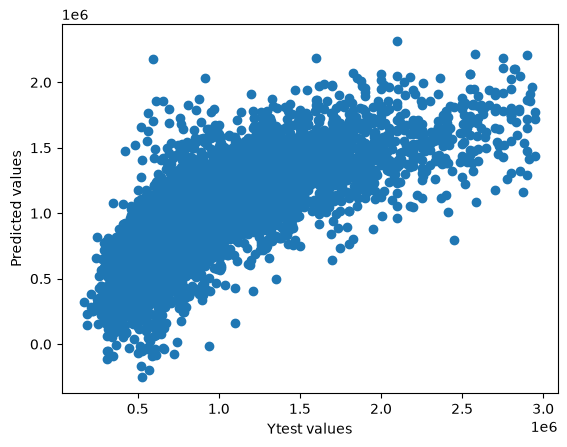

In [89]:
# Actual v predictions scatter
plt.scatter(ytest, ypredicts)
plt.xlabel("Ytest values")
plt.ylabel("Predicted values")

In [90]:
my_model.predict(np.array(Xtest)[1].reshape(1, -1))

array([5.01679485e+09])

### Training and Testing ML model without feature scaling

In [91]:
from sklearn.linear_model import LinearRegression
my_model = LinearRegression()
#fit the model using our data
print(Xtrain.shape)
my_model.fit(Xtrain, ytrain)


(7718, 13)


,"fit_intercept fit_intercept: bool, default=TrueWhether to calculate the intercept for this model. If setto False, no intercept will be used in calculations(i.e. data is expected to be centered).",True
,"copy_X copy_X: bool, default=TrueIf True, X will be copied; else, it may be overwritten.",True
,"tol tol: float, default=1e-6The precision of the solution (`coef_`) is determined by `tol` whichspecifies the convergence criterion of the underlying solver. `tol` isset as `atol` and `btol` of :func:`scipy.sparse.linalg.lsqr` whenfitting on sparse training data. `tol` is set as `cond` of:func:`scipy.linalg.lstsq` when fitting on dense training data... versionadded:: 1.7.. versionchanged:: 1.9 Now supported on dense data, interpreted as the `cond` parameter.",1e-06
,"n_jobs n_jobs: int, default=NoneThe number of jobs to use for the computation. This will only providespeedup in case of sufficiently large problems, that is if firstly`n_targets > 1` and secondly `X` is sparse or if `positive` is setto `True`. ``None`` means 1 unless in a:obj:`joblib.parallel_backend` context. ``-1`` means using allprocessors. See :term:`Glossary <n_jobs>` for more details.",None
,"positive positive: bool, default=FalseWhen set to ``True``, forces the coefficients to be positive. Thisoption is only supported for dense arrays.For a comparison between a linear regression model with positive constraintson the regression coefficients and a linear regression without such constraints,see :ref:`sphx_glr_auto_examples_linear_model_plot_nnls.py`... versionadded:: 0.24",False
Name,Type,Value
"coef_ coef_: array of shape (n_features, ) or (n_targets, n_features)Estimated coefficients for the linear regression problem.If multiple targets are passed during the fit (y 2D), thisis a 2D array of shape (n_targets, n_features), while if onlyone target is passed, this is a 1D array of length n_features.","ndarray[float64](13,)","[ -670.78, 1.24,181883.22,..., 51.86, 10902.55,110713.17]"
"feature_names_in_ feature_names_in_: ndarray of shape (`n_features_in_`,)Names of features seen during :term:`fit`. Defined only when `X`has feature names that are all strings... versionadded:: 1.0","ndarray[object](13,)","['Suburb','Address','Rooms',...,'Landsize','Regionname','Historic']"
"intercept_ intercept_: float or array of shape (n_targets,)Independent term in the linear model. Set to 0.0 if`fit_intercept = False`.",float64,-4.05e+06
n_features_in_ n_features_in_: intNumber of features seen during :term:`fit`... versionadded:: 0.24,int,13
rank_ rank_: intRank of matrix `X`. Only available when `X` is dense.,int,13


In [92]:
ypredicts = my_model.predict(Xtest)
print(type(ypredicts))
print(ypredicts.shape)
print(type(ytest))
ytest=np.array(ytest)
print(type(ytest))
print(ytest.shape)


<class 'numpy.ndarray'>
(5146,)
<class 'pandas.Series'>
<class 'numpy.ndarray'>
(5146,)


In [93]:
j=(ypredicts-ytest)
mse = np.mean(j ** 2)
print("MSE: {}".format(mse))

MSE: 115356608949.59813


In [94]:
from sklearn.metrics import mean_squared_error, r2_score
print("R2 score : %.2f" % r2_score(ytest,ypredicts))

R2 score : 0.57


# RANDOM FOREST REGRESSOR

In [95]:
# determine which model to use
from sklearn.ensemble import RandomForestRegressor
RF = RandomForestRegressor(criterion = 'squared_error', n_jobs = 1, n_estimators = 100,  min_samples_leaf = 1, random_state = 3)
RF.fit(Xtrain, ytrain)
y_pred = RF.predict(Xtest)

# Display.
print('Random Forest Regressor')
print('\nR-squared training set:')
print(RF.score(Xtrain, ytrain))

print('\nR-squared test set:')
print(RF.score(Xtest, ytest))
importances = pd.DataFrame({'feature':Xtrain.columns,'importance':np.round(RF.feature_importances_,3)})
importances = importances.sort_values('importance',ascending=False).set_index('feature')
importances

Random Forest Regressor

R-squared training set:
0.9711022532948411

R-squared test set:


0.7866183552030603


,importance
feature,
Distance,0.253
Type,0.192
Postcode,0.187
Landsize,0.120
Rooms,0.090
Address,0.038
Bathroom,0.035
Suburb,0.029
SellerG,0.023


# GRADIENT BOOST REGRESSOR

In [96]:
from sklearn import ensemble
params = {'n_estimators': 100,
          'max_depth': 10,
          'learning_rate': 0.01,
          'loss': 'squared_error'}
reg = ensemble.GradientBoostingRegressor(**params)
y_pred = reg.fit(Xtrain, ytrain)
from sklearn.metrics import r2_score
print("Testing accuracy :" , round(reg.score(Xtest,ytest), 5)*100 ,"%")
print("Training accuracy :", round(reg.score(Xtrain,ytrain), 5)*100, "%")

Testing accuracy : 66.635 %
Training accuracy : 77.45 %


/tmp/ipykernel_2646/933481556.py:15: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  plt.boxplot(result.importances[sorted_idx].T,


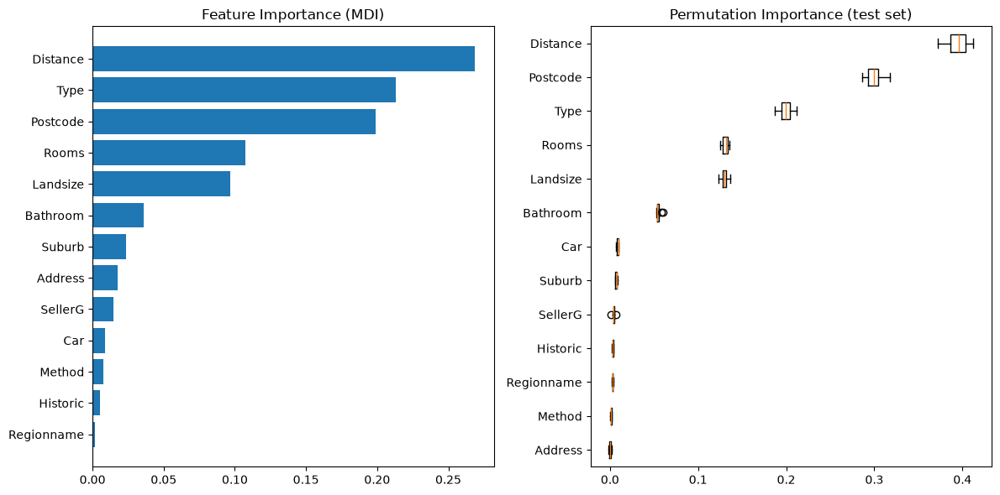

In [97]:
from sklearn.inspection import permutation_importance
feature_importance = reg.feature_importances_
sorted_idx = np.argsort(feature_importance)
pos = np.arange(sorted_idx.shape[0]) + .5
fig = plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.barh(pos, feature_importance[sorted_idx], align='center')
plt.yticks(pos, np.array(Xtest.columns)[sorted_idx])
plt.title('Feature Importance (MDI)')

result = permutation_importance(reg, Xtest, ytest, n_repeats=10,
                                random_state=42, n_jobs=2)
sorted_idx = result.importances_mean.argsort()
plt.subplot(1, 2, 2)
plt.boxplot(result.importances[sorted_idx].T,
            vert=False, tick_labels=np.array(Xtest.columns)[sorted_idx])
plt.title("Permutation Importance (test set)")
fig.tight_layout()
plt.show()

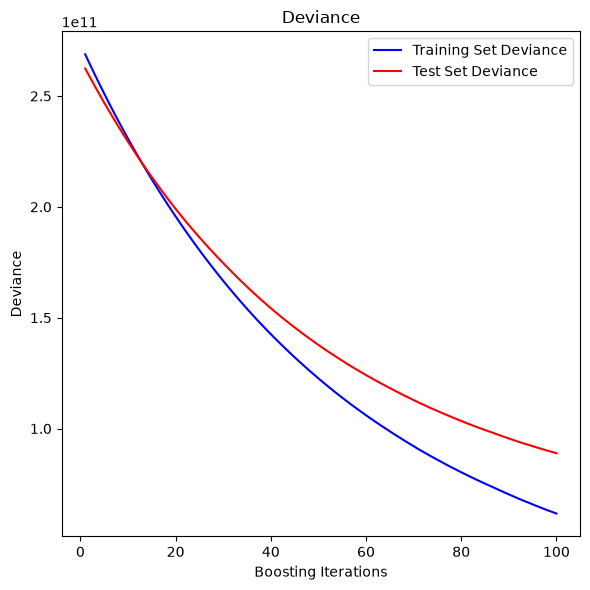

In [98]:
from sklearn.metrics import mean_squared_error

test_score = np.zeros((params['n_estimators'],), dtype=np.float64)
for i, y_pred in enumerate(reg.staged_predict(Xtest)):
    test_score[i] = mean_squared_error(ytest, y_pred)

fig = plt.figure(figsize=(6, 6))
plt.subplot(1, 1, 1)
plt.title('Deviance')
plt.plot(np.arange(params['n_estimators']) + 1, reg.train_score_, 'b-',
         label='Training Set Deviance')
plt.plot(np.arange(params['n_estimators']) + 1, test_score, 'r-',
         label='Test Set Deviance')
plt.legend(loc='upper right')
plt.xlabel('Boosting Iterations')
plt.ylabel('Deviance')
fig.tight_layout()
plt.show()

# ANN Regression
Similarly, ANN learns from the training data. There are several types of ANN models and the one we focused on is the feedforward neural network (information travels only in one direction). The entire process for prediction using this ANN model is- 

There is a mandatory input layer of neurons and output layer of neurons, and several hidden layers in between them.  

Hidden layers process the data for the output layer to predict the object identity. Each layer will detect a specific class of features. 

Number of neurons assigned to the layers is depended on the dataset involved.  

A weight is assigned to connections (also called edges) between each neuron. At the beginning, the weight is just a random number which changes as the ANN keeps training itself to adjust and find the right weights. If training data is being fed, the weights will be adjusted and gradually the inputs will map into correct outputs.  

An activation function is present which depicts the internal state of a neuron. The function the input signal of a node to an output signal. Rectified linear activation function (ReLU) is most used activation function that has been used in our ANN model. 

We are predicting house prices using all the important feature columns in our Melbourne housing dataset. 

In [99]:
from  tensorflow.keras.callbacks import ModelCheckpoint
from  tensorflow.keras.models import Sequential
from  tensorflow.keras.layers import Dense, Activation, Flatten

I0000 00:00:1788446282.266764    2646 port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
I0000 00:00:1788446282.324349    2646 cpu_feature_guard.cc:227] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


I0000 00:00:1788446284.240054    2646 port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.


In [100]:
NN_model = Sequential()

# The Input Layer :
NN_model.add(Dense(128, kernel_initializer='normal',input_dim = Xtrain.shape[1], activation='relu'))

# The Hidden Layers :
NN_model.add(Dense(256, kernel_initializer='normal',activation='relu'))
NN_model.add(Dense(256, kernel_initializer='normal',activation='relu'))
NN_model.add(Dense(256, kernel_initializer='normal',activation='relu'))

# The Output Layer :
NN_model.add(Dense(1, kernel_initializer='normal',activation='linear'))

# Compile the network :
NN_model.compile(loss='mean_absolute_error', optimizer='adam', metrics=['mean_absolute_error'])
NN_model.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 128)            │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 256)            │        33,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 256)            │        65,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 256)            │        65,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 166,657 (651.00 KB)

 Trainable params: 166,657 (651.00 KB)

 Non-trainable params: 0 (0.00 B)

In [101]:
checkpoint_name = 'Weights-{epoch:03d}--{val_loss:.5f}.h5' 
checkpoint = ModelCheckpoint(checkpoint_name, monitor='val_loss', verbose = 1, save_best_only = True, mode ='auto')
callbacks_list = [checkpoint]

In [102]:
NN_model.fit(Xtrain, ytrain, epochs=500, batch_size=32, validation_split = 0.2, callbacks=callbacks_list)


Epoch 1/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4:35 1s/step - loss: 1050829.7500 - mean_absolute_error: 1050829.7500

 15/193 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1057977.5000 - mean_absolute_error: 1057977.5000 

 33/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 983468.1250 - mean_absolute_error: 983468.1250  

 51/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 812362.1875 - mean_absolute_error: 812362.1875

 69/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 713794.3125 - mean_absolute_error: 713794.3125

 87/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 649278.6875 - mean_absolute_error: 649278.6875

105/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 606466.6875 - mean_absolute_error: 606466.6875

123/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 577459.7500 - mean_absolute_error: 577459.7500

142/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 552795.9375 - mean_absolute_error: 552795.9375

160/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 536898.6875 - mean_absolute_error: 536898.6875

178/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 522647.2812 - mean_absolute_error: 522647.2812


Epoch 1: val_loss improved from None to 394661.50000, saving model to Weights-001--394661.50000.h5



Epoch 1: finished saving model to Weights-001--394661.50000.h5


193/193 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 512634.2500 - mean_absolute_error: 512634.2500 - val_loss: 394661.5000 - val_mean_absolute_error: 394661.5000


Epoch 2/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 372838.9062 - mean_absolute_error: 372838.9062

 18/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 396570.7812 - mean_absolute_error: 396570.7812 

 36/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 387742.6875 - mean_absolute_error: 387742.6875

 54/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 390578.4688 - mean_absolute_error: 390578.4688

 72/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 391556.0625 - mean_absolute_error: 391556.0625

 90/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 394356.3125 - mean_absolute_error: 394356.3125

108/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 394990.8438 - mean_absolute_error: 394990.8438

127/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 394517.4062 - mean_absolute_error: 394517.4062

146/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 393277.0000 - mean_absolute_error: 393277.0000

165/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 393439.1875 - mean_absolute_error: 393439.1875

185/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 393718.6562 - mean_absolute_error: 393718.6562


Epoch 2: val_loss improved from 394661.50000 to 394624.71875, saving model to Weights-002--394624.71875.h5



Epoch 2: finished saving model to Weights-002--394624.71875.h5


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 393306.3438 - mean_absolute_error: 393306.3438 - val_loss: 394624.7188 - val_mean_absolute_error: 394624.7188


Epoch 3/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 350313.4062 - mean_absolute_error: 350313.4062

 19/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 387159.5000 - mean_absolute_error: 387159.5000 

 37/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 392115.3438 - mean_absolute_error: 392115.3438

 56/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 389063.4375 - mean_absolute_error: 389063.4375

 71/193 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 388508.2188 - mean_absolute_error: 388508.2188

 88/193 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 386286.0312 - mean_absolute_error: 386286.0312

108/193 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 384701.9688 - mean_absolute_error: 384701.9688

127/193 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 388472.1562 - mean_absolute_error: 388472.1562

147/193 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 387159.9062 - mean_absolute_error: 387159.9062

166/193 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 386069.5625 - mean_absolute_error: 386069.5625

184/193 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 386915.2188 - mean_absolute_error: 386915.2188


Epoch 3: val_loss improved from 394624.71875 to 383160.90625, saving model to Weights-003--383160.90625.h5



Epoch 3: finished saving model to Weights-003--383160.90625.h5


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 384514.3125 - mean_absolute_error: 384514.3125 - val_loss: 383160.9062 - val_mean_absolute_error: 383160.9062


Epoch 4/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 423882.5000 - mean_absolute_error: 423882.5000

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 382033.6875 - mean_absolute_error: 382033.6875 

 40/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 376909.5000 - mean_absolute_error: 376909.5000

 59/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 388819.5938 - mean_absolute_error: 388819.5938

 78/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 380494.4375 - mean_absolute_error: 380494.4375

 98/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 380951.6250 - mean_absolute_error: 380951.6250

117/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 376608.9688 - mean_absolute_error: 376608.9688

136/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 377954.5312 - mean_absolute_error: 377954.5312

156/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 378215.1562 - mean_absolute_error: 378215.1562

175/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 377755.6250 - mean_absolute_error: 377755.6250


Epoch 4: val_loss improved from 383160.90625 to 377385.62500, saving model to Weights-004--377385.62500.h5



Epoch 4: finished saving model to Weights-004--377385.62500.h5


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 376629.6562 - mean_absolute_error: 376629.6562 - val_loss: 377385.6250 - val_mean_absolute_error: 377385.6250


Epoch 5/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step - loss: 355714.8750 - mean_absolute_error: 355714.8750

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 362150.5938 - mean_absolute_error: 362150.5938 

 40/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 356437.6250 - mean_absolute_error: 356437.6250

 59/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 358254.1250 - mean_absolute_error: 358254.1250

 78/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 364199.4375 - mean_absolute_error: 364199.4375

 98/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 369721.5625 - mean_absolute_error: 369721.5625

119/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 372107.1562 - mean_absolute_error: 372107.1562

135/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 373482.7812 - mean_absolute_error: 373482.7812

148/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 374006.5000 - mean_absolute_error: 374006.5000

168/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 373163.5625 - mean_absolute_error: 373163.5625

188/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 373796.7188 - mean_absolute_error: 373796.7188


Epoch 5: val_loss improved from 377385.62500 to 371108.06250, saving model to Weights-005--371108.06250.h5



Epoch 5: finished saving model to Weights-005--371108.06250.h5


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 373914.0000 - mean_absolute_error: 373914.0000 - val_loss: 371108.0625 - val_mean_absolute_error: 371108.0625


Epoch 6/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 406933.5625 - mean_absolute_error: 406933.5625

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 362091.0625 - mean_absolute_error: 362091.0625 

 38/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 364834.3438 - mean_absolute_error: 364834.3438

 57/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 371895.5938 - mean_absolute_error: 371895.5938

 77/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 373381.8438 - mean_absolute_error: 373381.8438

 96/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 368607.6250 - mean_absolute_error: 368607.6250

117/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 371283.2188 - mean_absolute_error: 371283.2188

137/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 368608.8438 - mean_absolute_error: 368608.8438

159/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 367764.9375 - mean_absolute_error: 367764.9375

178/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 367592.7500 - mean_absolute_error: 367592.7500


Epoch 6: val_loss did not improve from 371108.06250


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 366043.5625 - mean_absolute_error: 366043.5625 - val_loss: 376649.5625 - val_mean_absolute_error: 376649.5625


Epoch 7/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 403986.3750 - mean_absolute_error: 403986.3750

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 352692.6875 - mean_absolute_error: 352692.6875 

 40/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 355219.1250 - mean_absolute_error: 355219.1250

 59/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 364510.9688 - mean_absolute_error: 364510.9688

 78/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 363960.4688 - mean_absolute_error: 363960.4688

 98/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 363242.1562 - mean_absolute_error: 363242.1562

118/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 363002.1562 - mean_absolute_error: 363002.1562

138/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 362028.8125 - mean_absolute_error: 362028.8125

158/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 361124.0625 - mean_absolute_error: 361124.0625

178/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 362742.4375 - mean_absolute_error: 362742.4375


Epoch 7: val_loss improved from 371108.06250 to 364498.28125, saving model to Weights-007--364498.28125.h5



Epoch 7: finished saving model to Weights-007--364498.28125.h5


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 361977.6250 - mean_absolute_error: 361977.6250 - val_loss: 364498.2812 - val_mean_absolute_error: 364498.2812


Epoch 8/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 286325.2812 - mean_absolute_error: 286325.2812

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 343120.6562 - mean_absolute_error: 343120.6562 

 45/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 351131.2812 - mean_absolute_error: 351131.2812

 66/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 354442.6875 - mean_absolute_error: 354442.6875

 87/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 360256.9062 - mean_absolute_error: 360256.9062

110/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 356924.3750 - mean_absolute_error: 356924.3750

133/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 354948.4062 - mean_absolute_error: 354948.4062

156/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 354604.4375 - mean_absolute_error: 354604.4375

178/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 356027.3125 - mean_absolute_error: 356027.3125


Epoch 8: val_loss improved from 364498.28125 to 358109.71875, saving model to Weights-008--358109.71875.h5



Epoch 8: finished saving model to Weights-008--358109.71875.h5


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 357641.7812 - mean_absolute_error: 357641.7812 - val_loss: 358109.7188 - val_mean_absolute_error: 358109.7188


Epoch 9/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 271667.8750 - mean_absolute_error: 271667.8750

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 332001.7500 - mean_absolute_error: 332001.7500 

 45/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 349291.9688 - mean_absolute_error: 349291.9688

 67/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 349605.9062 - mean_absolute_error: 349605.9062

 89/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 346902.7500 - mean_absolute_error: 346902.7500

112/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 345594.1562 - mean_absolute_error: 345594.1562

134/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 348158.2188 - mean_absolute_error: 348158.2188

156/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 350965.9688 - mean_absolute_error: 350965.9688

177/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 351424.0312 - mean_absolute_error: 351424.0312


Epoch 9: val_loss did not improve from 358109.71875


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 350655.3125 - mean_absolute_error: 350655.3125 - val_loss: 383573.3125 - val_mean_absolute_error: 383573.3125


Epoch 10/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 417676.1562 - mean_absolute_error: 417676.1562

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 361207.3438 - mean_absolute_error: 361207.3438 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 363574.3125 - mean_absolute_error: 363574.3125

 65/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 359984.4062 - mean_absolute_error: 359984.4062

 87/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 356988.5312 - mean_absolute_error: 356988.5312

109/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 348851.0938 - mean_absolute_error: 348851.0938

130/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 347901.4062 - mean_absolute_error: 347901.4062

152/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 344271.1250 - mean_absolute_error: 344271.1250

175/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 345390.6875 - mean_absolute_error: 345390.6875


Epoch 10: val_loss improved from 358109.71875 to 342670.81250, saving model to Weights-010--342670.81250.h5



Epoch 10: finished saving model to Weights-010--342670.81250.h5


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 347787.7500 - mean_absolute_error: 347787.7500 - val_loss: 342670.8125 - val_mean_absolute_error: 342670.8125


Epoch 11/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 320724.0625 - mean_absolute_error: 320724.0625

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 316109.7812 - mean_absolute_error: 316109.7812 

 43/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 333251.1250 - mean_absolute_error: 333251.1250

 65/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 331414.4375 - mean_absolute_error: 331414.4375

 87/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 337401.3750 - mean_absolute_error: 337401.3750

106/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 338508.5625 - mean_absolute_error: 338508.5625

125/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 338301.7500 - mean_absolute_error: 338301.7500

142/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 339565.9375 - mean_absolute_error: 339565.9375

161/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 339056.1562 - mean_absolute_error: 339056.1562

179/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 338956.1250 - mean_absolute_error: 338956.1250


Epoch 11: val_loss improved from 342670.81250 to 337085.40625, saving model to Weights-011--337085.40625.h5



Epoch 11: finished saving model to Weights-011--337085.40625.h5


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 337427.1250 - mean_absolute_error: 337427.1250 - val_loss: 337085.4062 - val_mean_absolute_error: 337085.4062


Epoch 12/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 446758.4375 - mean_absolute_error: 446758.4375

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 331469.3438 - mean_absolute_error: 331469.3438 

 39/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 340302.9062 - mean_absolute_error: 340302.9062

 57/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 334829.5000 - mean_absolute_error: 334829.5000

 76/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 330432.3438 - mean_absolute_error: 330432.3438

 96/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 327609.8438 - mean_absolute_error: 327609.8438

115/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 323095.5000 - mean_absolute_error: 323095.5000

136/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 324741.3750 - mean_absolute_error: 324741.3750

156/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 326167.8750 - mean_absolute_error: 326167.8750

175/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 325066.0000 - mean_absolute_error: 325066.0000

193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 325121.1875 - mean_absolute_error: 325121.1875


Epoch 12: val_loss improved from 337085.40625 to 331311.09375, saving model to Weights-012--331311.09375.h5



Epoch 12: finished saving model to Weights-012--331311.09375.h5


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 325121.1875 - mean_absolute_error: 325121.1875 - val_loss: 331311.0938 - val_mean_absolute_error: 331311.0938


Epoch 13/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 315963.7188 - mean_absolute_error: 315963.7188

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 317052.7500 - mean_absolute_error: 317052.7500 

 38/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 322112.8438 - mean_absolute_error: 322112.8438

 58/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 326868.5625 - mean_absolute_error: 326868.5625

 75/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 324213.8438 - mean_absolute_error: 324213.8438

 94/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 325343.9062 - mean_absolute_error: 325343.9062

112/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 326340.3125 - mean_absolute_error: 326340.3125

130/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 326984.4062 - mean_absolute_error: 326984.4062

147/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 325732.0625 - mean_absolute_error: 325732.0625

166/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 323854.6875 - mean_absolute_error: 323854.6875

184/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 320061.4062 - mean_absolute_error: 320061.4062


Epoch 13: val_loss improved from 331311.09375 to 315232.53125, saving model to Weights-013--315232.53125.h5



Epoch 13: finished saving model to Weights-013--315232.53125.h5


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 320388.5625 - mean_absolute_error: 320388.5625 - val_loss: 315232.5312 - val_mean_absolute_error: 315232.5312


Epoch 14/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 371825.6250 - mean_absolute_error: 371825.6250

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 356948.3438 - mean_absolute_error: 356948.3438 

 43/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 344443.3125 - mean_absolute_error: 344443.3125

 64/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 335262.4062 - mean_absolute_error: 335262.4062

 82/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 331116.1875 - mean_absolute_error: 331116.1875

 99/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 323148.6562 - mean_absolute_error: 323148.6562

118/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 322201.0312 - mean_absolute_error: 322201.0312

138/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 325364.9375 - mean_absolute_error: 325364.9375

158/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 321155.5312 - mean_absolute_error: 321155.5312

179/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 318789.5938 - mean_absolute_error: 318789.5938


Epoch 14: val_loss improved from 315232.53125 to 309240.90625, saving model to Weights-014--309240.90625.h5



Epoch 14: finished saving model to Weights-014--309240.90625.h5


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 316750.5000 - mean_absolute_error: 316750.5000 - val_loss: 309240.9062 - val_mean_absolute_error: 309240.9062


Epoch 15/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 319914.6875 - mean_absolute_error: 319914.6875

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 315956.6875 - mean_absolute_error: 315956.6875 

 38/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 304021.2188 - mean_absolute_error: 304021.2188

 58/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 307706.8750 - mean_absolute_error: 307706.8750

 79/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 306491.7812 - mean_absolute_error: 306491.7812

101/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 301905.3438 - mean_absolute_error: 301905.3438

122/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 301058.8125 - mean_absolute_error: 301058.8125

144/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 303019.0625 - mean_absolute_error: 303019.0625

164/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 307060.0938 - mean_absolute_error: 307060.0938

184/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 308504.5312 - mean_absolute_error: 308504.5312


Epoch 15: val_loss did not improve from 309240.90625


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 309900.9688 - mean_absolute_error: 309900.9688 - val_loss: 331652.8438 - val_mean_absolute_error: 331652.8438


Epoch 16/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 336099.1875 - mean_absolute_error: 336099.1875

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 310094.2188 - mean_absolute_error: 310094.2188 

 40/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 299634.2188 - mean_absolute_error: 299634.2188

 54/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 297211.6562 - mean_absolute_error: 297211.6562

 72/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 302366.9375 - mean_absolute_error: 302366.9375

 90/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 299562.4375 - mean_absolute_error: 299562.4375

109/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 301789.5625 - mean_absolute_error: 301789.5625

128/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 302383.6875 - mean_absolute_error: 302383.6875

146/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 300666.8125 - mean_absolute_error: 300666.8125

167/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 300011.5312 - mean_absolute_error: 300011.5312

188/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 299673.9688 - mean_absolute_error: 299673.9688


Epoch 16: val_loss did not improve from 309240.90625


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 299365.2500 - mean_absolute_error: 299365.2500 - val_loss: 315880.9062 - val_mean_absolute_error: 315880.9062


Epoch 17/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 247627.3438 - mean_absolute_error: 247627.3438

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 280284.2188 - mean_absolute_error: 280284.2188 

 41/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 296441.2500 - mean_absolute_error: 296441.2500

 61/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 293552.4375 - mean_absolute_error: 293552.4375

 82/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 295254.8438 - mean_absolute_error: 295254.8438

104/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 300707.5938 - mean_absolute_error: 300707.5938

124/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 303105.9062 - mean_absolute_error: 303105.9062

145/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 301462.4688 - mean_absolute_error: 301462.4688

165/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 301825.5625 - mean_absolute_error: 301825.5625

185/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 301218.5000 - mean_absolute_error: 301218.5000


Epoch 17: val_loss improved from 309240.90625 to 303081.46875, saving model to Weights-017--303081.46875.h5



Epoch 17: finished saving model to Weights-017--303081.46875.h5


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 300228.2812 - mean_absolute_error: 300228.2812 - val_loss: 303081.4688 - val_mean_absolute_error: 303081.4688


Epoch 18/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 251439.8594 - mean_absolute_error: 251439.8594

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 300963.5000 - mean_absolute_error: 300963.5000 

 42/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 299423.3438 - mean_absolute_error: 299423.3438

 65/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 297932.7500 - mean_absolute_error: 297932.7500

 85/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 296639.7500 - mean_absolute_error: 296639.7500

105/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 291439.1562 - mean_absolute_error: 291439.1562

128/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 291435.3750 - mean_absolute_error: 291435.3750

150/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 293462.3750 - mean_absolute_error: 293462.3750

172/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 290653.2500 - mean_absolute_error: 290653.2500

192/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 291309.2812 - mean_absolute_error: 291309.2812


Epoch 18: val_loss improved from 303081.46875 to 288742.75000, saving model to Weights-018--288742.75000.h5



Epoch 18: finished saving model to Weights-018--288742.75000.h5


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 291562.7812 - mean_absolute_error: 291562.7812 - val_loss: 288742.7500 - val_mean_absolute_error: 288742.7500


Epoch 19/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 320822.2188 - mean_absolute_error: 320822.2188

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 322415.0938 - mean_absolute_error: 322415.0938 

 43/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 311169.5000 - mean_absolute_error: 311169.5000

 61/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 308089.6250 - mean_absolute_error: 308089.6250

 81/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 301998.4062 - mean_absolute_error: 301998.4062

101/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 295600.8438 - mean_absolute_error: 295600.8438

121/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 293141.5625 - mean_absolute_error: 293141.5625

141/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 296150.3125 - mean_absolute_error: 296150.3125

161/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 297642.8125 - mean_absolute_error: 297642.8125

181/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 297573.4375 - mean_absolute_error: 297573.4375


Epoch 19: val_loss did not improve from 288742.75000


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 296550.0938 - mean_absolute_error: 296550.0938 - val_loss: 293776.2500 - val_mean_absolute_error: 293776.2500


Epoch 20/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 224805.6406 - mean_absolute_error: 224805.6406

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 287350.3125 - mean_absolute_error: 287350.3125 

 40/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 289892.1875 - mean_absolute_error: 289892.1875

 60/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 295322.4062 - mean_absolute_error: 295322.4062

 81/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 296980.3750 - mean_absolute_error: 296980.3750

101/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 294047.3438 - mean_absolute_error: 294047.3438

122/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 293340.2188 - mean_absolute_error: 293340.2188

144/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 292313.7500 - mean_absolute_error: 292313.7500

165/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 289501.6250 - mean_absolute_error: 289501.6250

185/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 291500.7812 - mean_absolute_error: 291500.7812


Epoch 20: val_loss improved from 288742.75000 to 285614.75000, saving model to Weights-020--285614.75000.h5



Epoch 20: finished saving model to Weights-020--285614.75000.h5


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 291671.0625 - mean_absolute_error: 291671.0625 - val_loss: 285614.7500 - val_mean_absolute_error: 285614.7500


Epoch 21/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 313673.4375 - mean_absolute_error: 313673.4375

 19/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 278865.0938 - mean_absolute_error: 278865.0938 

 32/193 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 295186.9062 - mean_absolute_error: 295186.9062

 50/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 300773.7812 - mean_absolute_error: 300773.7812

 68/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 297124.5938 - mean_absolute_error: 297124.5938

 87/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 298224.6562 - mean_absolute_error: 298224.6562

107/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 297201.5938 - mean_absolute_error: 297201.5938

127/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 294907.4062 - mean_absolute_error: 294907.4062

145/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 295316.1250 - mean_absolute_error: 295316.1250

163/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 296610.3750 - mean_absolute_error: 296610.3750

182/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 294959.1562 - mean_absolute_error: 294959.1562


Epoch 21: val_loss did not improve from 285614.75000


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 293597.3750 - mean_absolute_error: 293597.3750 - val_loss: 290334.9062 - val_mean_absolute_error: 290334.9062


Epoch 22/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 322507.5000 - mean_absolute_error: 322507.5000

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 288211.0625 - mean_absolute_error: 288211.0625 

 37/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 283823.9688 - mean_absolute_error: 283823.9688

 55/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 281367.7500 - mean_absolute_error: 281367.7500

 72/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 286716.6250 - mean_absolute_error: 286716.6250

 91/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 287674.0312 - mean_absolute_error: 287674.0312

108/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 284766.5625 - mean_absolute_error: 284766.5625

126/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 284603.1250 - mean_absolute_error: 284603.1250

143/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 285058.5312 - mean_absolute_error: 285058.5312

161/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 285534.7188 - mean_absolute_error: 285534.7188

178/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 286065.0000 - mean_absolute_error: 286065.0000


Epoch 22: val_loss did not improve from 285614.75000


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 286123.3438 - mean_absolute_error: 286123.3438 - val_loss: 292967.3438 - val_mean_absolute_error: 292967.3438


Epoch 23/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 340474.6875 - mean_absolute_error: 340474.6875

 16/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 293989.5000 - mean_absolute_error: 293989.5000 

 32/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 287913.4688 - mean_absolute_error: 287913.4688

 48/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 292833.6250 - mean_absolute_error: 292833.6250

 65/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 285126.5312 - mean_absolute_error: 285126.5312

 83/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 279805.8438 - mean_absolute_error: 279805.8438

101/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 278109.9062 - mean_absolute_error: 278109.9062

119/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 278431.6562 - mean_absolute_error: 278431.6562

132/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 279827.5312 - mean_absolute_error: 279827.5312

151/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 281014.1562 - mean_absolute_error: 281014.1562

169/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 282644.9375 - mean_absolute_error: 282644.9375

188/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 283734.7812 - mean_absolute_error: 283734.7812


Epoch 23: val_loss did not improve from 285614.75000


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 283001.3750 - mean_absolute_error: 283001.3750 - val_loss: 287301.3125 - val_mean_absolute_error: 287301.3125


Epoch 24/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 270488.8125 - mean_absolute_error: 270488.8125

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 295848.7812 - mean_absolute_error: 295848.7812 

 43/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 287127.8438 - mean_absolute_error: 287127.8438

 62/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 285664.6875 - mean_absolute_error: 285664.6875

 80/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 283079.0000 - mean_absolute_error: 283079.0000

 98/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 282164.9062 - mean_absolute_error: 282164.9062

115/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 283424.8125 - mean_absolute_error: 283424.8125

135/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 276899.0625 - mean_absolute_error: 276899.0625

153/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 282431.2812 - mean_absolute_error: 282431.2812

172/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 286803.0312 - mean_absolute_error: 286803.0312

191/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 287046.0625 - mean_absolute_error: 287046.0625


Epoch 24: val_loss improved from 285614.75000 to 284633.00000, saving model to Weights-024--284633.00000.h5



Epoch 24: finished saving model to Weights-024--284633.00000.h5


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 287066.2500 - mean_absolute_error: 287066.2500 - val_loss: 284633.0000 - val_mean_absolute_error: 284633.0000


Epoch 25/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 309023.1250 - mean_absolute_error: 309023.1250

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 278398.5000 - mean_absolute_error: 278398.5000 

 41/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 285753.4688 - mean_absolute_error: 285753.4688

 59/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 283819.8750 - mean_absolute_error: 283819.8750

 77/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 285709.2500 - mean_absolute_error: 285709.2500

 96/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 281680.1562 - mean_absolute_error: 281680.1562

114/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 279749.9375 - mean_absolute_error: 279749.9375

133/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 280581.8750 - mean_absolute_error: 280581.8750

151/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 278052.6875 - mean_absolute_error: 278052.6875

170/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 278902.7500 - mean_absolute_error: 278902.7500

184/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 277871.5000 - mean_absolute_error: 277871.5000


Epoch 25: val_loss improved from 284633.00000 to 274521.37500, saving model to Weights-025--274521.37500.h5



Epoch 25: finished saving model to Weights-025--274521.37500.h5


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 277755.2188 - mean_absolute_error: 277755.2188 - val_loss: 274521.3750 - val_mean_absolute_error: 274521.3750


Epoch 26/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 1:42 533ms/step - loss: 248021.7188 - mean_absolute_error: 248021.7188

 17/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 271254.7812 - mean_absolute_error: 271254.7812    

 34/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 271826.9375 - mean_absolute_error: 271826.9375

 53/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 278194.0000 - mean_absolute_error: 278194.0000

 70/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 288319.1562 - mean_absolute_error: 288319.1562

 85/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 288576.5000 - mean_absolute_error: 288576.5000

102/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 285894.4688 - mean_absolute_error: 285894.4688

120/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 286082.0000 - mean_absolute_error: 286082.0000

139/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 289414.2812 - mean_absolute_error: 289414.2812

159/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 288686.0000 - mean_absolute_error: 288686.0000

179/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 289926.7188 - mean_absolute_error: 289926.7188


Epoch 26: val_loss did not improve from 274521.37500


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 290067.5000 - mean_absolute_error: 290067.5000 - val_loss: 299610.5000 - val_mean_absolute_error: 299610.5000


Epoch 27/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 359012.6250 - mean_absolute_error: 359012.6250

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 280866.0625 - mean_absolute_error: 280866.0625 

 41/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 275516.1562 - mean_absolute_error: 275516.1562

 62/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 278767.7188 - mean_absolute_error: 278767.7188

 80/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 277581.1875 - mean_absolute_error: 277581.1875

 99/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 276567.7500 - mean_absolute_error: 276567.7500

118/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 276448.7188 - mean_absolute_error: 276448.7188

137/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 279695.2812 - mean_absolute_error: 279695.2812

155/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 278244.7812 - mean_absolute_error: 278244.7812

174/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 277393.9688 - mean_absolute_error: 277393.9688

193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 280466.5625 - mean_absolute_error: 280466.5625


Epoch 27: val_loss did not improve from 274521.37500


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 280466.5625 - mean_absolute_error: 280466.5625 - val_loss: 280882.8750 - val_mean_absolute_error: 280882.8750


Epoch 28/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 271919.7500 - mean_absolute_error: 271919.7500

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 309942.6250 - mean_absolute_error: 309942.6250 

 43/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 295247.7812 - mean_absolute_error: 295247.7812

 64/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 291450.8438 - mean_absolute_error: 291450.8438

 86/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 291391.0938 - mean_absolute_error: 291391.0938

107/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 287449.5938 - mean_absolute_error: 287449.5938

128/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 287171.5000 - mean_absolute_error: 287171.5000

149/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 284330.2500 - mean_absolute_error: 284330.2500

170/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 282773.7500 - mean_absolute_error: 282773.7500

190/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 281617.7188 - mean_absolute_error: 281617.7188


Epoch 28: val_loss did not improve from 274521.37500


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 281597.4688 - mean_absolute_error: 281597.4688 - val_loss: 296634.5000 - val_mean_absolute_error: 296634.5000


Epoch 29/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 264692.7500 - mean_absolute_error: 264692.7500

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 262394.1250 - mean_absolute_error: 262394.1250 

 43/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 267997.4375 - mean_absolute_error: 267997.4375

 63/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 276813.0625 - mean_absolute_error: 276813.0625

 84/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 274634.5625 - mean_absolute_error: 274634.5625

105/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 274724.4375 - mean_absolute_error: 274724.4375

124/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 273811.4062 - mean_absolute_error: 273811.4062

143/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 274325.1562 - mean_absolute_error: 274325.1562

162/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 273560.1875 - mean_absolute_error: 273560.1875

180/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 272474.8750 - mean_absolute_error: 272474.8750


Epoch 29: val_loss did not improve from 274521.37500


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 272364.3750 - mean_absolute_error: 272364.3750 - val_loss: 274582.9375 - val_mean_absolute_error: 274582.9375


Epoch 30/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 266570.5625 - mean_absolute_error: 266570.5625

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 278652.9688 - mean_absolute_error: 278652.9688 

 40/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 287792.5000 - mean_absolute_error: 287792.5000

 59/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 289498.7500 - mean_absolute_error: 289498.7500

 76/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 283434.8750 - mean_absolute_error: 283434.8750

 94/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 279520.8438 - mean_absolute_error: 279520.8438

112/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 278890.0625 - mean_absolute_error: 278890.0625

131/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 275339.0000 - mean_absolute_error: 275339.0000

151/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 275624.4688 - mean_absolute_error: 275624.4688

170/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 277081.2812 - mean_absolute_error: 277081.2812

189/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 278471.3750 - mean_absolute_error: 278471.3750


Epoch 30: val_loss did not improve from 274521.37500


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 278182.2188 - mean_absolute_error: 278182.2188 - val_loss: 294871.9688 - val_mean_absolute_error: 294871.9688


Epoch 31/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 238624.8125 - mean_absolute_error: 238624.8125

 19/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 272670.4062 - mean_absolute_error: 272670.4062 

 38/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 279978.8750 - mean_absolute_error: 279978.8750

 56/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 279581.5938 - mean_absolute_error: 279581.5938

 74/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 279834.2812 - mean_absolute_error: 279834.2812

 92/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 276813.0312 - mean_absolute_error: 276813.0312

110/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 273778.2812 - mean_absolute_error: 273778.2812

128/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 274724.5938 - mean_absolute_error: 274724.5938

146/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 274923.3750 - mean_absolute_error: 274923.3750

164/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 275554.2812 - mean_absolute_error: 275554.2812

183/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 276600.9375 - mean_absolute_error: 276600.9375


Epoch 31: val_loss did not improve from 274521.37500


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 278755.3750 - mean_absolute_error: 278755.3750 - val_loss: 334477.5625 - val_mean_absolute_error: 334477.5625


Epoch 32/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 359215.6250 - mean_absolute_error: 359215.6250

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 314403.8750 - mean_absolute_error: 314403.8750 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 299051.1875 - mean_absolute_error: 299051.1875

 66/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 292204.7500 - mean_absolute_error: 292204.7500

 85/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 286279.3125 - mean_absolute_error: 286279.3125

104/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 282517.2500 - mean_absolute_error: 282517.2500

123/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 277592.3750 - mean_absolute_error: 277592.3750

143/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 275183.4062 - mean_absolute_error: 275183.4062

165/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 275148.1562 - mean_absolute_error: 275148.1562

187/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 277243.5625 - mean_absolute_error: 277243.5625


Epoch 32: val_loss did not improve from 274521.37500


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 277920.7500 - mean_absolute_error: 277920.7500 - val_loss: 308089.1250 - val_mean_absolute_error: 308089.1250


Epoch 33/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - loss: 381457.4688 - mean_absolute_error: 381457.4688

  8/193 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 281634.5938 - mean_absolute_error: 281634.5938 

 28/193 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 279242.7188 - mean_absolute_error: 279242.7188

 46/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 281869.4062 - mean_absolute_error: 281869.4062

 64/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 281969.2500 - mean_absolute_error: 281969.2500

 83/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 274721.7500 - mean_absolute_error: 274721.7500

104/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 275543.3125 - mean_absolute_error: 275543.3125

124/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 277837.9062 - mean_absolute_error: 277837.9062

145/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 278166.1875 - mean_absolute_error: 278166.1875

164/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 275264.2500 - mean_absolute_error: 275264.2500

184/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 275189.1562 - mean_absolute_error: 275189.1562


Epoch 33: val_loss improved from 274521.37500 to 267368.18750, saving model to Weights-033--267368.18750.h5



Epoch 33: finished saving model to Weights-033--267368.18750.h5


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 274243.1875 - mean_absolute_error: 274243.1875 - val_loss: 267368.1875 - val_mean_absolute_error: 267368.1875


Epoch 34/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 297859.5312 - mean_absolute_error: 297859.5312

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 251340.2812 - mean_absolute_error: 251340.2812 

 41/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 258489.1406 - mean_absolute_error: 258489.1406

 63/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 263158.0312 - mean_absolute_error: 263158.0312

 84/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 263392.2500 - mean_absolute_error: 263392.2500

105/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 263371.0312 - mean_absolute_error: 263371.0312

125/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 267617.6875 - mean_absolute_error: 267617.6875

145/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 269479.3125 - mean_absolute_error: 269479.3125

166/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 271588.6875 - mean_absolute_error: 271588.6875

185/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 273269.2500 - mean_absolute_error: 273269.2500


Epoch 34: val_loss did not improve from 267368.18750


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 272395.5625 - mean_absolute_error: 272395.5625 - val_loss: 269928.5938 - val_mean_absolute_error: 269928.5938


Epoch 35/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 252600.2344 - mean_absolute_error: 252600.2344

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 264315.5000 - mean_absolute_error: 264315.5000 

 40/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 260534.0469 - mean_absolute_error: 260534.0469

 60/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 269799.1562 - mean_absolute_error: 269799.1562

 79/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 271483.4375 - mean_absolute_error: 271483.4375

 99/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 272181.2812 - mean_absolute_error: 272181.2812

121/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 273122.2500 - mean_absolute_error: 273122.2500

143/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 273288.1250 - mean_absolute_error: 273288.1250

165/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 269496.1562 - mean_absolute_error: 269496.1562

183/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 270116.2812 - mean_absolute_error: 270116.2812


Epoch 35: val_loss did not improve from 267368.18750


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 270876.3750 - mean_absolute_error: 270876.3750 - val_loss: 272849.0000 - val_mean_absolute_error: 272849.0000


Epoch 36/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 317341.5000 - mean_absolute_error: 317341.5000

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 279378.9062 - mean_absolute_error: 279378.9062 

 42/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 277458.9375 - mean_absolute_error: 277458.9375

 63/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 276244.8125 - mean_absolute_error: 276244.8125

 84/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 275409.0625 - mean_absolute_error: 275409.0625

104/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 275225.8438 - mean_absolute_error: 275225.8438

123/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 275105.6875 - mean_absolute_error: 275105.6875

143/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 271511.3125 - mean_absolute_error: 271511.3125

164/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 269889.0312 - mean_absolute_error: 269889.0312

186/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 270588.9688 - mean_absolute_error: 270588.9688


Epoch 36: val_loss did not improve from 267368.18750


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 271589.2188 - mean_absolute_error: 271589.2188 - val_loss: 295899.4375 - val_mean_absolute_error: 295899.4375


Epoch 37/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 256160.6406 - mean_absolute_error: 256160.6406

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 283715.2500 - mean_absolute_error: 283715.2500 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 278983.0000 - mean_absolute_error: 278983.0000

 66/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 276663.5000 - mean_absolute_error: 276663.5000

 87/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 273144.5625 - mean_absolute_error: 273144.5625

108/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 268343.7500 - mean_absolute_error: 268343.7500

130/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 269627.9688 - mean_absolute_error: 269627.9688

151/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 273179.3125 - mean_absolute_error: 273179.3125

166/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 270818.8750 - mean_absolute_error: 270818.8750

187/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 270732.1562 - mean_absolute_error: 270732.1562


Epoch 37: val_loss improved from 267368.18750 to 266892.68750, saving model to Weights-037--266892.68750.h5



Epoch 37: finished saving model to Weights-037--266892.68750.h5


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 269887.3125 - mean_absolute_error: 269887.3125 - val_loss: 266892.6875 - val_mean_absolute_error: 266892.6875


Epoch 38/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 289002.1250 - mean_absolute_error: 289002.1250

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 282117.3125 - mean_absolute_error: 282117.3125 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 268656.1562 - mean_absolute_error: 268656.1562

 65/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 273015.4688 - mean_absolute_error: 273015.4688

 86/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 275142.8750 - mean_absolute_error: 275142.8750

107/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 272955.3125 - mean_absolute_error: 272955.3125

129/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 267597.8125 - mean_absolute_error: 267597.8125

150/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 267695.0312 - mean_absolute_error: 267695.0312

172/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 269438.7812 - mean_absolute_error: 269438.7812

193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 272102.5312 - mean_absolute_error: 272102.5312


Epoch 38: val_loss did not improve from 266892.68750


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 272102.5312 - mean_absolute_error: 272102.5312 - val_loss: 286372.9062 - val_mean_absolute_error: 286372.9062


Epoch 39/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 262626.9688 - mean_absolute_error: 262626.9688

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 265667.4062 - mean_absolute_error: 265667.4062 

 42/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 263535.3750 - mean_absolute_error: 263535.3750

 63/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 260136.8125 - mean_absolute_error: 260136.8125

 83/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 265230.8750 - mean_absolute_error: 265230.8750

102/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 262112.4062 - mean_absolute_error: 262112.4062

121/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 263232.8750 - mean_absolute_error: 263232.8750

143/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 264013.2812 - mean_absolute_error: 264013.2812

164/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 264729.9375 - mean_absolute_error: 264729.9375

186/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 265845.2812 - mean_absolute_error: 265845.2812


Epoch 39: val_loss did not improve from 266892.68750


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 265752.1875 - mean_absolute_error: 265752.1875 - val_loss: 288145.1875 - val_mean_absolute_error: 288145.1875


Epoch 40/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 338081.0625 - mean_absolute_error: 338081.0625

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 272303.1562 - mean_absolute_error: 272303.1562 

 41/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 271925.5938 - mean_absolute_error: 271925.5938

 63/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 275396.4688 - mean_absolute_error: 275396.4688

 85/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 273463.6875 - mean_absolute_error: 273463.6875

106/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 271606.5000 - mean_absolute_error: 271606.5000

128/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 270765.8750 - mean_absolute_error: 270765.8750

149/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 269750.8125 - mean_absolute_error: 269750.8125

170/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 270201.3438 - mean_absolute_error: 270201.3438

192/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 272199.5312 - mean_absolute_error: 272199.5312


Epoch 40: val_loss did not improve from 266892.68750


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 272035.8125 - mean_absolute_error: 272035.8125 - val_loss: 271172.3438 - val_mean_absolute_error: 271172.3438


Epoch 41/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 263480.7500 - mean_absolute_error: 263480.7500

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 324107.4375 - mean_absolute_error: 324107.4375 

 40/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 315898.0938 - mean_absolute_error: 315898.0938

 62/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 296826.7500 - mean_absolute_error: 296826.7500

 83/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 290129.7500 - mean_absolute_error: 290129.7500

104/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 284126.9688 - mean_absolute_error: 284126.9688

125/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 283723.9062 - mean_absolute_error: 283723.9062

144/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 282362.8125 - mean_absolute_error: 282362.8125

166/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 278150.1562 - mean_absolute_error: 278150.1562

186/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 278635.3125 - mean_absolute_error: 278635.3125


Epoch 41: val_loss did not improve from 266892.68750


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 279091.8750 - mean_absolute_error: 279091.8750 - val_loss: 304466.9688 - val_mean_absolute_error: 304466.9688


Epoch 42/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 366722.1875 - mean_absolute_error: 366722.1875

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 274147.2500 - mean_absolute_error: 274147.2500 

 43/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 264704.9688 - mean_absolute_error: 264704.9688

 65/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 268164.1562 - mean_absolute_error: 268164.1562

 87/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 269515.4375 - mean_absolute_error: 269515.4375

109/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 265480.2500 - mean_absolute_error: 265480.2500

130/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 264291.8125 - mean_absolute_error: 264291.8125

148/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 264873.3750 - mean_absolute_error: 264873.3750

169/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 265650.9688 - mean_absolute_error: 265650.9688

190/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 270001.4062 - mean_absolute_error: 270001.4062


Epoch 42: val_loss did not improve from 266892.68750


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 269810.3125 - mean_absolute_error: 269810.3125 - val_loss: 285221.9688 - val_mean_absolute_error: 285221.9688


Epoch 43/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 285393.9375 - mean_absolute_error: 285393.9375

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 263193.1875 - mean_absolute_error: 263193.1875 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 269814.2188 - mean_absolute_error: 269814.2188

 64/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 273056.9062 - mean_absolute_error: 273056.9062

 84/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 267595.1875 - mean_absolute_error: 267595.1875

105/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 268001.5000 - mean_absolute_error: 268001.5000

126/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 265133.2812 - mean_absolute_error: 265133.2812

146/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 265907.8125 - mean_absolute_error: 265907.8125

166/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 266234.2188 - mean_absolute_error: 266234.2188

186/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 267898.0938 - mean_absolute_error: 267898.0938


Epoch 43: val_loss did not improve from 266892.68750


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 266933.9375 - mean_absolute_error: 266933.9375 - val_loss: 304887.1562 - val_mean_absolute_error: 304887.1562


Epoch 44/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 378481.4062 - mean_absolute_error: 378481.4062

 14/193 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 302107.6875 - mean_absolute_error: 302107.6875 

 31/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 289274.2188 - mean_absolute_error: 289274.2188

 38/193 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 282031.0938 - mean_absolute_error: 282031.0938

 56/193 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 277267.8438 - mean_absolute_error: 277267.8438

 75/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 280655.4062 - mean_absolute_error: 280655.4062

 94/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 280288.9062 - mean_absolute_error: 280288.9062

114/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 277851.3438 - mean_absolute_error: 277851.3438

134/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 276995.9062 - mean_absolute_error: 276995.9062

152/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 278036.3750 - mean_absolute_error: 278036.3750

172/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 274716.5312 - mean_absolute_error: 274716.5312

192/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 273621.1562 - mean_absolute_error: 273621.1562


Epoch 44: val_loss improved from 266892.68750 to 263139.59375, saving model to Weights-044--263139.59375.h5



Epoch 44: finished saving model to Weights-044--263139.59375.h5


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 273473.0625 - mean_absolute_error: 273473.0625 - val_loss: 263139.5938 - val_mean_absolute_error: 263139.5938


Epoch 45/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 240969.5938 - mean_absolute_error: 240969.5938

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 272415.3438 - mean_absolute_error: 272415.3438 

 42/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 275864.2812 - mean_absolute_error: 275864.2812

 63/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 267324.9375 - mean_absolute_error: 267324.9375

 82/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 264800.5000 - mean_absolute_error: 264800.5000

102/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 267898.3438 - mean_absolute_error: 267898.3438

121/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 268331.1562 - mean_absolute_error: 268331.1562

142/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 267376.1562 - mean_absolute_error: 267376.1562

162/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 268676.6250 - mean_absolute_error: 268676.6250

180/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 266860.6875 - mean_absolute_error: 266860.6875


Epoch 45: val_loss did not improve from 263139.59375


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 266296.5312 - mean_absolute_error: 266296.5312 - val_loss: 264896.3750 - val_mean_absolute_error: 264896.3750


Epoch 46/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 295942.1562 - mean_absolute_error: 295942.1562

 19/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 260714.1875 - mean_absolute_error: 260714.1875 

 40/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 269113.4062 - mean_absolute_error: 269113.4062

 60/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 268807.5625 - mean_absolute_error: 268807.5625

 79/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 265480.5000 - mean_absolute_error: 265480.5000

 99/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 268490.5938 - mean_absolute_error: 268490.5938

120/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 274419.0625 - mean_absolute_error: 274419.0625

141/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 272072.8750 - mean_absolute_error: 272072.8750

162/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 269986.7500 - mean_absolute_error: 269986.7500

183/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 270146.7500 - mean_absolute_error: 270146.7500


Epoch 46: val_loss did not improve from 263139.59375


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 269862.6562 - mean_absolute_error: 269862.6562 - val_loss: 279545.3125 - val_mean_absolute_error: 279545.3125


Epoch 47/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step - loss: 306923.1250 - mean_absolute_error: 306923.1250

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 282253.5000 - mean_absolute_error: 282253.5000 

 43/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 269775.9375 - mean_absolute_error: 269775.9375

 64/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 265548.4688 - mean_absolute_error: 265548.4688

 85/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 266555.0000 - mean_absolute_error: 266555.0000

106/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 262849.3125 - mean_absolute_error: 262849.3125

127/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 262277.0312 - mean_absolute_error: 262277.0312

147/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 262186.0938 - mean_absolute_error: 262186.0938

167/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 265881.5000 - mean_absolute_error: 265881.5000

188/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 266327.7500 - mean_absolute_error: 266327.7500


Epoch 47: val_loss did not improve from 263139.59375


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 265998.0625 - mean_absolute_error: 265998.0625 - val_loss: 266456.9688 - val_mean_absolute_error: 266456.9688


Epoch 48/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 291075.6250 - mean_absolute_error: 291075.6250

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 265188.2500 - mean_absolute_error: 265188.2500 

 42/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 261335.2656 - mean_absolute_error: 261335.2656

 63/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 271862.4062 - mean_absolute_error: 271862.4062

 84/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 273942.2188 - mean_absolute_error: 273942.2188

106/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 270815.5938 - mean_absolute_error: 270815.5938

128/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 270367.3125 - mean_absolute_error: 270367.3125

149/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 271647.7500 - mean_absolute_error: 271647.7500

170/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 269760.1562 - mean_absolute_error: 269760.1562

192/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 268873.9688 - mean_absolute_error: 268873.9688


Epoch 48: val_loss did not improve from 263139.59375


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 269269.2500 - mean_absolute_error: 269269.2500 - val_loss: 291895.7188 - val_mean_absolute_error: 291895.7188


Epoch 49/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 253657.5625 - mean_absolute_error: 253657.5625

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 281744.5312 - mean_absolute_error: 281744.5312 

 43/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 271114.3125 - mean_absolute_error: 271114.3125

 60/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 268448.0000 - mean_absolute_error: 268448.0000

 78/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 263108.8438 - mean_absolute_error: 263108.8438

 97/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 263872.1562 - mean_absolute_error: 263872.1562

116/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 267513.6562 - mean_absolute_error: 267513.6562

135/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 269187.4375 - mean_absolute_error: 269187.4375

154/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 269175.1562 - mean_absolute_error: 269175.1562

172/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 273831.0312 - mean_absolute_error: 273831.0312

192/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 271252.0312 - mean_absolute_error: 271252.0312


Epoch 49: val_loss did not improve from 263139.59375


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 271042.6250 - mean_absolute_error: 271042.6250 - val_loss: 264662.5000 - val_mean_absolute_error: 264662.5000


Epoch 50/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 249925.0469 - mean_absolute_error: 249925.0469

 19/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 263683.5625 - mean_absolute_error: 263683.5625 

 36/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 270925.3750 - mean_absolute_error: 270925.3750

 56/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 267338.7188 - mean_absolute_error: 267338.7188

 75/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 268038.0625 - mean_absolute_error: 268038.0625

 93/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 264776.6250 - mean_absolute_error: 264776.6250

113/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 265022.2812 - mean_absolute_error: 265022.2812

132/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 263565.1250 - mean_absolute_error: 263565.1250

150/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 265572.6562 - mean_absolute_error: 265572.6562

168/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 266390.7500 - mean_absolute_error: 266390.7500

187/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 266443.2812 - mean_absolute_error: 266443.2812


Epoch 50: val_loss did not improve from 263139.59375


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 266785.9688 - mean_absolute_error: 266785.9688 - val_loss: 267300.3438 - val_mean_absolute_error: 267300.3438


Epoch 51/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 210097.6250 - mean_absolute_error: 210097.6250

 19/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 268657.1562 - mean_absolute_error: 268657.1562 

 36/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 262577.6250 - mean_absolute_error: 262577.6250

 53/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 262189.8438 - mean_absolute_error: 262189.8438

 72/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 265861.3750 - mean_absolute_error: 265861.3750

 91/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 267778.2812 - mean_absolute_error: 267778.2812

110/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 267959.0312 - mean_absolute_error: 267959.0312

130/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 268018.2500 - mean_absolute_error: 268018.2500

148/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 267376.0938 - mean_absolute_error: 267376.0938

168/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 266809.3125 - mean_absolute_error: 266809.3125

187/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 264677.0625 - mean_absolute_error: 264677.0625


Epoch 51: val_loss improved from 263139.59375 to 256879.70312, saving model to Weights-051--256879.70312.h5



Epoch 51: finished saving model to Weights-051--256879.70312.h5


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 263739.6875 - mean_absolute_error: 263739.6875 - val_loss: 256879.7031 - val_mean_absolute_error: 256879.7031


Epoch 52/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 269676.1875 - mean_absolute_error: 269676.1875

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 243438.8438 - mean_absolute_error: 243438.8438 

 37/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 258334.8438 - mean_absolute_error: 258334.8438

 56/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 259157.3906 - mean_absolute_error: 259157.3906

 74/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 259912.1406 - mean_absolute_error: 259912.1406

 93/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 260624.2344 - mean_absolute_error: 260624.2344

113/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 261103.5156 - mean_absolute_error: 261103.5156

133/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 266719.7188 - mean_absolute_error: 266719.7188

152/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 268908.9062 - mean_absolute_error: 268908.9062

170/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 266953.5938 - mean_absolute_error: 266953.5938

186/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 266686.3750 - mean_absolute_error: 266686.3750


Epoch 52: val_loss did not improve from 256879.70312


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 267313.6250 - mean_absolute_error: 267313.6250 - val_loss: 262941.5000 - val_mean_absolute_error: 262941.5000


Epoch 53/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 234929.9375 - mean_absolute_error: 234929.9375

 19/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 275904.3125 - mean_absolute_error: 275904.3125 

 38/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 277822.0625 - mean_absolute_error: 277822.0625

 56/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 272878.1562 - mean_absolute_error: 272878.1562

 75/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 274986.1562 - mean_absolute_error: 274986.1562

 94/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 273085.9688 - mean_absolute_error: 273085.9688

113/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 270132.4375 - mean_absolute_error: 270132.4375

130/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 271468.3125 - mean_absolute_error: 271468.3125

148/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 268722.5312 - mean_absolute_error: 268722.5312

167/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 268510.2812 - mean_absolute_error: 268510.2812

185/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 268317.6250 - mean_absolute_error: 268317.6250


Epoch 53: val_loss did not improve from 256879.70312


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 267188.9375 - mean_absolute_error: 267188.9375 - val_loss: 260783.0312 - val_mean_absolute_error: 260783.0312


Epoch 54/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 207377.2969 - mean_absolute_error: 207377.2969

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 263012.2500 - mean_absolute_error: 263012.2500 

 40/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 263478.3750 - mean_absolute_error: 263478.3750

 60/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 260695.2812 - mean_absolute_error: 260695.2812

 80/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 257553.9062 - mean_absolute_error: 257553.9062

100/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 263887.3750 - mean_absolute_error: 263887.3750

119/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 263317.0312 - mean_absolute_error: 263317.0312

138/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 261554.2031 - mean_absolute_error: 261554.2031

158/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 261769.3438 - mean_absolute_error: 261769.3438

177/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 264191.5000 - mean_absolute_error: 264191.5000


Epoch 54: val_loss did not improve from 256879.70312


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 268256.4062 - mean_absolute_error: 268256.4062 - val_loss: 305363.6562 - val_mean_absolute_error: 305363.6562


Epoch 55/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 370631.3438 - mean_absolute_error: 370631.3438

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 270136.9375 - mean_absolute_error: 270136.9375 

 41/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 265543.4062 - mean_absolute_error: 265543.4062

 62/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 263215.3125 - mean_absolute_error: 263215.3125

 84/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 259878.8125 - mean_absolute_error: 259878.8125

104/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 262492.8125 - mean_absolute_error: 262492.8125

125/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 262556.7188 - mean_absolute_error: 262556.7188

147/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 266550.5938 - mean_absolute_error: 266550.5938

168/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 268074.6250 - mean_absolute_error: 268074.6250

190/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 268167.8125 - mean_absolute_error: 268167.8125


Epoch 55: val_loss did not improve from 256879.70312


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 267485.8438 - mean_absolute_error: 267485.8438 - val_loss: 263411.6562 - val_mean_absolute_error: 263411.6562


Epoch 56/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 307988.9375 - mean_absolute_error: 307988.9375

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 264596.3750 - mean_absolute_error: 264596.3750 

 45/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 271967.4062 - mean_absolute_error: 271967.4062

 63/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 276177.5312 - mean_absolute_error: 276177.5312

 85/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 267672.0625 - mean_absolute_error: 267672.0625

106/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 272990.3125 - mean_absolute_error: 272990.3125

128/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 271984.2812 - mean_absolute_error: 271984.2812

147/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 269272.7188 - mean_absolute_error: 269272.7188

168/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 266378.5312 - mean_absolute_error: 266378.5312

190/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 266345.1875 - mean_absolute_error: 266345.1875


Epoch 56: val_loss did not improve from 256879.70312


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 265701.0312 - mean_absolute_error: 265701.0312 - val_loss: 269249.8125 - val_mean_absolute_error: 269249.8125


Epoch 57/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 259110.4062 - mean_absolute_error: 259110.4062

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 247744.5938 - mean_absolute_error: 247744.5938 

 43/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 254532.7031 - mean_absolute_error: 254532.7031

 65/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 261438.2812 - mean_absolute_error: 261438.2812

 86/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 260117.4375 - mean_absolute_error: 260117.4375

106/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 259416.7812 - mean_absolute_error: 259416.7812

126/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 260289.7656 - mean_absolute_error: 260289.7656

146/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 260515.3438 - mean_absolute_error: 260515.3438

167/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 262263.0625 - mean_absolute_error: 262263.0625

188/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 263623.7500 - mean_absolute_error: 263623.7500


Epoch 57: val_loss did not improve from 256879.70312


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 263672.2188 - mean_absolute_error: 263672.2188 - val_loss: 258158.7500 - val_mean_absolute_error: 258158.7500


Epoch 58/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 281321.9375 - mean_absolute_error: 281321.9375

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 267453.5312 - mean_absolute_error: 267453.5312 

 45/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 260729.1094 - mean_absolute_error: 260729.1094

 67/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 252931.5469 - mean_absolute_error: 252931.5469

 86/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 253535.2500 - mean_absolute_error: 253535.2500

108/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 252753.5781 - mean_absolute_error: 252753.5781

130/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 254988.3125 - mean_absolute_error: 254988.3125

152/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 257189.3438 - mean_absolute_error: 257189.3438

172/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 257061.1875 - mean_absolute_error: 257061.1875

193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 259734.4375 - mean_absolute_error: 259734.4375


Epoch 58: val_loss did not improve from 256879.70312


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 259734.4375 - mean_absolute_error: 259734.4375 - val_loss: 264335.1875 - val_mean_absolute_error: 264335.1875


Epoch 59/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 258860.8594 - mean_absolute_error: 258860.8594

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 267170.2188 - mean_absolute_error: 267170.2188 

 46/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 275984.0312 - mean_absolute_error: 275984.0312

 69/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 271507.4062 - mean_absolute_error: 271507.4062

 90/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 265369.7500 - mean_absolute_error: 265369.7500

111/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 263057.2188 - mean_absolute_error: 263057.2188

133/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 263935.7812 - mean_absolute_error: 263935.7812

156/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 267071.0312 - mean_absolute_error: 267071.0312

178/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 269395.3125 - mean_absolute_error: 269395.3125


Epoch 59: val_loss did not improve from 256879.70312


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 269801.7812 - mean_absolute_error: 269801.7812 - val_loss: 264960.9062 - val_mean_absolute_error: 264960.9062


Epoch 60/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 244786.6250 - mean_absolute_error: 244786.6250

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 256484.5625 - mean_absolute_error: 256484.5625 

 45/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 275431.1250 - mean_absolute_error: 275431.1250

 67/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 276162.0000 - mean_absolute_error: 276162.0000

 89/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 273709.9375 - mean_absolute_error: 273709.9375

112/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 270981.3438 - mean_absolute_error: 270981.3438

134/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 268537.6250 - mean_absolute_error: 268537.6250

156/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 267995.9375 - mean_absolute_error: 267995.9375

178/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 266753.5000 - mean_absolute_error: 266753.5000


Epoch 60: val_loss did not improve from 256879.70312


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 266576.1875 - mean_absolute_error: 266576.1875 - val_loss: 262919.3438 - val_mean_absolute_error: 262919.3438


Epoch 61/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 282269.3125 - mean_absolute_error: 282269.3125

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 255463.1406 - mean_absolute_error: 255463.1406 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 249945.9531 - mean_absolute_error: 249945.9531

 67/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 251988.3594 - mean_absolute_error: 251988.3594

 89/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 256646.9062 - mean_absolute_error: 256646.9062

112/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 255818.3906 - mean_absolute_error: 255818.3906

135/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 259003.1094 - mean_absolute_error: 259003.1094

157/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 265282.0000 - mean_absolute_error: 265282.0000

178/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 264467.3125 - mean_absolute_error: 264467.3125


Epoch 61: val_loss did not improve from 256879.70312


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 264256.1250 - mean_absolute_error: 264256.1250 - val_loss: 259688.1406 - val_mean_absolute_error: 259688.1406


Epoch 62/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 232548.7500 - mean_absolute_error: 232548.7500

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 257914.0000 - mean_absolute_error: 257914.0000 

 43/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 253675.4844 - mean_absolute_error: 253675.4844

 65/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 251161.7344 - mean_absolute_error: 251161.7344

 87/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 254981.5000 - mean_absolute_error: 254981.5000

108/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 256915.9844 - mean_absolute_error: 256915.9844

130/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 256137.8750 - mean_absolute_error: 256137.8750

152/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 260171.5312 - mean_absolute_error: 260171.5312

174/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 259555.7656 - mean_absolute_error: 259555.7656


Epoch 62: val_loss did not improve from 256879.70312


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 258235.7344 - mean_absolute_error: 258235.7344 - val_loss: 262126.4688 - val_mean_absolute_error: 262126.4688


Epoch 63/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 202718.0000 - mean_absolute_error: 202718.0000

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 254678.0469 - mean_absolute_error: 254678.0469 

 45/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 266466.4375 - mean_absolute_error: 266466.4375

 68/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 264954.3125 - mean_absolute_error: 264954.3125

 88/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 267612.8750 - mean_absolute_error: 267612.8750

110/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 267341.1875 - mean_absolute_error: 267341.1875

133/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 267165.5000 - mean_absolute_error: 267165.5000

156/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 264843.8750 - mean_absolute_error: 264843.8750

179/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 262136.1094 - mean_absolute_error: 262136.1094


Epoch 63: val_loss improved from 256879.70312 to 255877.07812, saving model to Weights-063--255877.07812.h5



Epoch 63: finished saving model to Weights-063--255877.07812.h5


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 262992.7188 - mean_absolute_error: 262992.7188 - val_loss: 255877.0781 - val_mean_absolute_error: 255877.0781


Epoch 64/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 267739.0625 - mean_absolute_error: 267739.0625

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 256694.8438 - mean_absolute_error: 256694.8438 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 261754.8906 - mean_absolute_error: 261754.8906

 67/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 258955.5000 - mean_absolute_error: 258955.5000

 89/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 256783.4531 - mean_absolute_error: 256783.4531

111/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 260932.4688 - mean_absolute_error: 260932.4688

131/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 261821.9844 - mean_absolute_error: 261821.9844

152/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 261263.7656 - mean_absolute_error: 261263.7656

173/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 262438.7188 - mean_absolute_error: 262438.7188


Epoch 64: val_loss did not improve from 255877.07812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 263398.5312 - mean_absolute_error: 263398.5312 - val_loss: 262791.3438 - val_mean_absolute_error: 262791.3438


Epoch 65/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 221449.2812 - mean_absolute_error: 221449.2812

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 249605.8438 - mean_absolute_error: 249605.8438 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 259045.4844 - mean_absolute_error: 259045.4844

 66/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 254628.2500 - mean_absolute_error: 254628.2500

 88/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 255371.0938 - mean_absolute_error: 255371.0938

109/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 257920.6719 - mean_absolute_error: 257920.6719

130/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 261698.0625 - mean_absolute_error: 261698.0625

152/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 260525.0000 - mean_absolute_error: 260525.0000

174/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 263476.5625 - mean_absolute_error: 263476.5625


Epoch 65: val_loss did not improve from 255877.07812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 265152.4688 - mean_absolute_error: 265152.4688 - val_loss: 279086.7812 - val_mean_absolute_error: 279086.7812


Epoch 66/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 249117.9688 - mean_absolute_error: 249117.9688

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 249515.5469 - mean_absolute_error: 249515.5469 

 45/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 258987.8281 - mean_absolute_error: 258987.8281

 66/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 267469.4375 - mean_absolute_error: 267469.4375

 88/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 267183.4688 - mean_absolute_error: 267183.4688

111/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 264371.4688 - mean_absolute_error: 264371.4688

134/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 264224.5312 - mean_absolute_error: 264224.5312

157/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 262497.0312 - mean_absolute_error: 262497.0312

178/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 262029.3906 - mean_absolute_error: 262029.3906


Epoch 66: val_loss did not improve from 255877.07812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 263684.4688 - mean_absolute_error: 263684.4688 - val_loss: 264642.0625 - val_mean_absolute_error: 264642.0625


Epoch 67/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 251317.0625 - mean_absolute_error: 251317.0625

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 248996.0938 - mean_absolute_error: 248996.0938 

 45/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 256575.6875 - mean_absolute_error: 256575.6875

 67/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 258197.7031 - mean_absolute_error: 258197.7031

 88/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 259154.0000 - mean_absolute_error: 259154.0000

110/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 257646.1875 - mean_absolute_error: 257646.1875

133/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 258127.8750 - mean_absolute_error: 258127.8750

156/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 258596.9531 - mean_absolute_error: 258596.9531

179/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 259097.3594 - mean_absolute_error: 259097.3594


Epoch 67: val_loss did not improve from 255877.07812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 260644.4688 - mean_absolute_error: 260644.4688 - val_loss: 309616.8750 - val_mean_absolute_error: 309616.8750


Epoch 68/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - loss: 283393.1875 - mean_absolute_error: 283393.1875

 24/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 263830.9062 - mean_absolute_error: 263830.9062 

 45/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 258541.3594 - mean_absolute_error: 258541.3594

 66/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 256835.4219 - mean_absolute_error: 256835.4219

 86/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 262910.7812 - mean_absolute_error: 262910.7812

108/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 263784.3750 - mean_absolute_error: 263784.3750

131/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 266552.3125 - mean_absolute_error: 266552.3125

153/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 264804.5000 - mean_absolute_error: 264804.5000

176/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 263694.1562 - mean_absolute_error: 263694.1562


Epoch 68: val_loss did not improve from 255877.07812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 263565.0312 - mean_absolute_error: 263565.0312 - val_loss: 278085.1250 - val_mean_absolute_error: 278085.1250


Epoch 69/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - loss: 224506.2500 - mean_absolute_error: 224506.2500

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 300700.5625 - mean_absolute_error: 300700.5625 

 46/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 276550.3750 - mean_absolute_error: 276550.3750

 68/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 271571.4375 - mean_absolute_error: 271571.4375

 90/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 274984.5000 - mean_absolute_error: 274984.5000

113/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 272422.1562 - mean_absolute_error: 272422.1562

133/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 271136.5625 - mean_absolute_error: 271136.5625

155/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 269282.1875 - mean_absolute_error: 269282.1875

177/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 266163.5938 - mean_absolute_error: 266163.5938


Epoch 69: val_loss did not improve from 255877.07812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 265180.2188 - mean_absolute_error: 265180.2188 - val_loss: 269969.1250 - val_mean_absolute_error: 269969.1250


Epoch 70/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 373449.5312 - mean_absolute_error: 373449.5312

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 269107.6562 - mean_absolute_error: 269107.6562 

 41/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 267837.8438 - mean_absolute_error: 267837.8438

 62/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 257223.2031 - mean_absolute_error: 257223.2031

 83/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 256347.3281 - mean_absolute_error: 256347.3281

102/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 257873.2188 - mean_absolute_error: 257873.2188

122/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 256745.3750 - mean_absolute_error: 256745.3750

143/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 258085.6719 - mean_absolute_error: 258085.6719

164/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 257185.1875 - mean_absolute_error: 257185.1875

187/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 258358.7188 - mean_absolute_error: 258358.7188


Epoch 70: val_loss did not improve from 255877.07812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 257657.0625 - mean_absolute_error: 257657.0625 - val_loss: 271199.7812 - val_mean_absolute_error: 271199.7812


Epoch 71/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 258597.2656 - mean_absolute_error: 258597.2656

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 278215.9375 - mean_absolute_error: 278215.9375 

 40/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 264573.2188 - mean_absolute_error: 264573.2188

 60/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 273570.6875 - mean_absolute_error: 273570.6875

 80/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 275767.0000 - mean_absolute_error: 275767.0000

100/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 269802.0625 - mean_absolute_error: 269802.0625

122/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 266492.5000 - mean_absolute_error: 266492.5000

143/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 265934.3750 - mean_absolute_error: 265934.3750

161/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 266209.5312 - mean_absolute_error: 266209.5312

179/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 264577.1250 - mean_absolute_error: 264577.1250


Epoch 71: val_loss did not improve from 255877.07812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 265697.7188 - mean_absolute_error: 265697.7188 - val_loss: 258158.3438 - val_mean_absolute_error: 258158.3438


Epoch 72/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 202402.3281 - mean_absolute_error: 202402.3281

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 262372.5625 - mean_absolute_error: 262372.5625 

 42/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 261711.1250 - mean_absolute_error: 261711.1250

 65/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 261867.6875 - mean_absolute_error: 261867.6875

 87/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 259493.8438 - mean_absolute_error: 259493.8438

109/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 265305.3125 - mean_absolute_error: 265305.3125

130/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 268463.5000 - mean_absolute_error: 268463.5000

153/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 267089.2500 - mean_absolute_error: 267089.2500

174/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 265259.4062 - mean_absolute_error: 265259.4062


Epoch 72: val_loss did not improve from 255877.07812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 265182.0938 - mean_absolute_error: 265182.0938 - val_loss: 261529.4688 - val_mean_absolute_error: 261529.4688


Epoch 73/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 171765.8125 - mean_absolute_error: 171765.8125

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 236331.8125 - mean_absolute_error: 236331.8125 

 42/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 238939.5000 - mean_absolute_error: 238939.5000

 63/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 240982.9062 - mean_absolute_error: 240982.9062

 83/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 249987.2812 - mean_absolute_error: 249987.2812

101/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 254793.1250 - mean_absolute_error: 254793.1250

121/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 255595.8438 - mean_absolute_error: 255595.8438

142/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 260555.3281 - mean_absolute_error: 260555.3281

163/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 261678.8281 - mean_absolute_error: 261678.8281

184/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 263783.1250 - mean_absolute_error: 263783.1250


Epoch 73: val_loss did not improve from 255877.07812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 265723.5938 - mean_absolute_error: 265723.5938 - val_loss: 296750.7188 - val_mean_absolute_error: 296750.7188


Epoch 74/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 296409.0312 - mean_absolute_error: 296409.0312

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 264664.6250 - mean_absolute_error: 264664.6250 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 263992.0625 - mean_absolute_error: 263992.0625

 65/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 261514.6094 - mean_absolute_error: 261514.6094

 87/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 261182.1562 - mean_absolute_error: 261182.1562

108/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 267108.7500 - mean_absolute_error: 267108.7500

121/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 267944.1562 - mean_absolute_error: 267944.1562

139/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 266951.8438 - mean_absolute_error: 266951.8438

157/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 267491.3125 - mean_absolute_error: 267491.3125

176/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 267427.8750 - mean_absolute_error: 267427.8750

193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 265568.3125 - mean_absolute_error: 265568.3125


Epoch 74: val_loss did not improve from 255877.07812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 265568.3125 - mean_absolute_error: 265568.3125 - val_loss: 257036.8906 - val_mean_absolute_error: 257036.8906


Epoch 75/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 325291.9688 - mean_absolute_error: 325291.9688

 19/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 256765.5781 - mean_absolute_error: 256765.5781 

 38/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 246320.5469 - mean_absolute_error: 246320.5469

 57/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 253629.2031 - mean_absolute_error: 253629.2031

 77/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 257479.0156 - mean_absolute_error: 257479.0156

 96/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 257770.5781 - mean_absolute_error: 257770.5781

116/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 255586.6250 - mean_absolute_error: 255586.6250

135/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 255179.5312 - mean_absolute_error: 255179.5312

155/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 255230.3281 - mean_absolute_error: 255230.3281

176/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 256673.6875 - mean_absolute_error: 256673.6875


Epoch 75: val_loss improved from 255877.07812 to 255797.78125, saving model to Weights-075--255797.78125.h5



Epoch 75: finished saving model to Weights-075--255797.78125.h5


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 255817.2656 - mean_absolute_error: 255817.2656 - val_loss: 255797.7812 - val_mean_absolute_error: 255797.7812


Epoch 76/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 303134.4375 - mean_absolute_error: 303134.4375

 19/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 254382.6250 - mean_absolute_error: 254382.6250 

 39/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 249829.6406 - mean_absolute_error: 249829.6406

 59/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 253180.3281 - mean_absolute_error: 253180.3281

 78/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 250451.2031 - mean_absolute_error: 250451.2031

 97/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 253633.7344 - mean_absolute_error: 253633.7344

117/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 254314.3438 - mean_absolute_error: 254314.3438

138/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 256551.0781 - mean_absolute_error: 256551.0781

159/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 262517.5312 - mean_absolute_error: 262517.5312

180/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 260104.0469 - mean_absolute_error: 260104.0469


Epoch 76: val_loss did not improve from 255797.78125


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 259986.4688 - mean_absolute_error: 259986.4688 - val_loss: 269959.9062 - val_mean_absolute_error: 269959.9062


Epoch 77/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 304959.4062 - mean_absolute_error: 304959.4062

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 265290.2188 - mean_absolute_error: 265290.2188 

 39/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 255895.4688 - mean_absolute_error: 255895.4688

 58/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 257004.7969 - mean_absolute_error: 257004.7969

 76/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 259101.3906 - mean_absolute_error: 259101.3906

 97/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 260575.8281 - mean_absolute_error: 260575.8281

118/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 265434.5000 - mean_absolute_error: 265434.5000

139/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 266059.8125 - mean_absolute_error: 266059.8125

160/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 266248.2500 - mean_absolute_error: 266248.2500

181/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 265869.1250 - mean_absolute_error: 265869.1250


Epoch 77: val_loss did not improve from 255797.78125


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 265332.8750 - mean_absolute_error: 265332.8750 - val_loss: 263630.4375 - val_mean_absolute_error: 263630.4375


Epoch 78/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 230629.1875 - mean_absolute_error: 230629.1875

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 274107.3750 - mean_absolute_error: 274107.3750 

 40/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 270503.8750 - mean_absolute_error: 270503.8750

 60/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 265973.3750 - mean_absolute_error: 265973.3750

 80/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 263299.2812 - mean_absolute_error: 263299.2812

100/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 263202.0938 - mean_absolute_error: 263202.0938

121/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 261414.4062 - mean_absolute_error: 261414.4062

141/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 258026.7812 - mean_absolute_error: 258026.7812

162/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 259122.5625 - mean_absolute_error: 259122.5625

181/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 259934.9219 - mean_absolute_error: 259934.9219


Epoch 78: val_loss did not improve from 255797.78125


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 259877.7344 - mean_absolute_error: 259877.7344 - val_loss: 261599.6094 - val_mean_absolute_error: 261599.6094


Epoch 79/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 270045.2188 - mean_absolute_error: 270045.2188

 17/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 269817.1875 - mean_absolute_error: 269817.1875 

 36/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 256610.8906 - mean_absolute_error: 256610.8906

 54/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 262895.8750 - mean_absolute_error: 262895.8750

 73/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 261590.4062 - mean_absolute_error: 261590.4062

 90/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 261356.1406 - mean_absolute_error: 261356.1406

108/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 263884.6562 - mean_absolute_error: 263884.6562

125/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 263501.1562 - mean_absolute_error: 263501.1562

145/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 265023.0312 - mean_absolute_error: 265023.0312

166/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 263458.5938 - mean_absolute_error: 263458.5938

185/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 265037.9375 - mean_absolute_error: 265037.9375


Epoch 79: val_loss did not improve from 255797.78125


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 265135.3438 - mean_absolute_error: 265135.3438 - val_loss: 268284.6562 - val_mean_absolute_error: 268284.6562


Epoch 80/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 242506.1250 - mean_absolute_error: 242506.1250

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 254661.8438 - mean_absolute_error: 254661.8438 

 40/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 258682.0781 - mean_absolute_error: 258682.0781

 59/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 257287.8281 - mean_absolute_error: 257287.8281

 78/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 257220.1250 - mean_absolute_error: 257220.1250

 97/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 255653.9375 - mean_absolute_error: 255653.9375

117/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 256662.6719 - mean_absolute_error: 256662.6719

136/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 257588.7344 - mean_absolute_error: 257588.7344

156/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 257044.0469 - mean_absolute_error: 257044.0469

175/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 259013.7812 - mean_absolute_error: 259013.7812


Epoch 80: val_loss did not improve from 255797.78125


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 259263.9219 - mean_absolute_error: 259263.9219 - val_loss: 266565.2188 - val_mean_absolute_error: 266565.2188


Epoch 81/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 266247.7812 - mean_absolute_error: 266247.7812

 18/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 261332.4375 - mean_absolute_error: 261332.4375 

 37/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 273678.7812 - mean_absolute_error: 273678.7812

 56/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 270553.0312 - mean_absolute_error: 270553.0312

 76/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 271115.0938 - mean_absolute_error: 271115.0938

 96/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 270602.5000 - mean_absolute_error: 270602.5000

115/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 268686.5938 - mean_absolute_error: 268686.5938

134/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 267832.6562 - mean_absolute_error: 267832.6562

153/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 265523.5625 - mean_absolute_error: 265523.5625

172/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 264440.5312 - mean_absolute_error: 264440.5312

191/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 263537.3750 - mean_absolute_error: 263537.3750


Epoch 81: val_loss did not improve from 255797.78125


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 263267.4688 - mean_absolute_error: 263267.4688 - val_loss: 259152.3906 - val_mean_absolute_error: 259152.3906


Epoch 82/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 276321.2812 - mean_absolute_error: 276321.2812

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 263245.3125 - mean_absolute_error: 263245.3125 

 40/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 264047.1250 - mean_absolute_error: 264047.1250

 60/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 260440.7344 - mean_absolute_error: 260440.7344

 79/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 259612.4375 - mean_absolute_error: 259612.4375

 99/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 259629.7969 - mean_absolute_error: 259629.7969

119/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 257724.5469 - mean_absolute_error: 257724.5469

139/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 257164.9844 - mean_absolute_error: 257164.9844

159/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 263590.8750 - mean_absolute_error: 263590.8750

177/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 264227.1562 - mean_absolute_error: 264227.1562


Epoch 82: val_loss did not improve from 255797.78125


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 264842.6875 - mean_absolute_error: 264842.6875 - val_loss: 260782.5938 - val_mean_absolute_error: 260782.5938


Epoch 83/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 226851.9688 - mean_absolute_error: 226851.9688

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 259836.1875 - mean_absolute_error: 259836.1875 

 40/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 267446.2812 - mean_absolute_error: 267446.2812

 58/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 269513.2500 - mean_absolute_error: 269513.2500

 77/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 277289.9062 - mean_absolute_error: 277289.9062

 95/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 274415.6250 - mean_absolute_error: 274415.6250

114/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 269897.3750 - mean_absolute_error: 269897.3750

133/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 267850.2500 - mean_absolute_error: 267850.2500

151/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 264547.0000 - mean_absolute_error: 264547.0000

170/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 263083.5625 - mean_absolute_error: 263083.5625

188/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 264129.6250 - mean_absolute_error: 264129.6250


Epoch 83: val_loss did not improve from 255797.78125


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 264854.0938 - mean_absolute_error: 264854.0938 - val_loss: 261116.3906 - val_mean_absolute_error: 261116.3906


Epoch 84/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 242624.5000 - mean_absolute_error: 242624.5000

 17/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 257556.9688 - mean_absolute_error: 257556.9688 

 36/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 260370.8594 - mean_absolute_error: 260370.8594

 56/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 256008.1719 - mean_absolute_error: 256008.1719

 76/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 259363.0469 - mean_absolute_error: 259363.0469

 97/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 260732.5625 - mean_absolute_error: 260732.5625

117/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 261900.3281 - mean_absolute_error: 261900.3281

136/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 260826.3750 - mean_absolute_error: 260826.3750

156/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 260066.6875 - mean_absolute_error: 260066.6875

175/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 261193.8750 - mean_absolute_error: 261193.8750


Epoch 84: val_loss improved from 255797.78125 to 252279.85938, saving model to Weights-084--252279.85938.h5



Epoch 84: finished saving model to Weights-084--252279.85938.h5


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 261161.9688 - mean_absolute_error: 261161.9688 - val_loss: 252279.8594 - val_mean_absolute_error: 252279.8594


Epoch 85/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 241516.8750 - mean_absolute_error: 241516.8750

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 253496.5625 - mean_absolute_error: 253496.5625 

 40/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 250340.2812 - mean_absolute_error: 250340.2812

 56/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 255323.7188 - mean_absolute_error: 255323.7188

 74/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 261215.1875 - mean_absolute_error: 261215.1875

 91/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 263267.5938 - mean_absolute_error: 263267.5938

110/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 264166.8125 - mean_absolute_error: 264166.8125

130/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 260618.2812 - mean_absolute_error: 260618.2812

151/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 262185.1250 - mean_absolute_error: 262185.1250

168/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 260904.3750 - mean_absolute_error: 260904.3750

184/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 260424.0156 - mean_absolute_error: 260424.0156


Epoch 85: val_loss did not improve from 252279.85938


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 259788.9375 - mean_absolute_error: 259788.9375 - val_loss: 267958.4375 - val_mean_absolute_error: 267958.4375


Epoch 86/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 224441.4375 - mean_absolute_error: 224441.4375

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 252218.7344 - mean_absolute_error: 252218.7344 

 41/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 248338.5312 - mean_absolute_error: 248338.5312

 60/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 251708.7500 - mean_absolute_error: 251708.7500

 79/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 250861.4375 - mean_absolute_error: 250861.4375

 97/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 251298.9219 - mean_absolute_error: 251298.9219

113/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 252356.2656 - mean_absolute_error: 252356.2656

129/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 254339.4688 - mean_absolute_error: 254339.4688

141/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 258100.1719 - mean_absolute_error: 258100.1719

157/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 258745.4844 - mean_absolute_error: 258745.4844

174/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 258316.6719 - mean_absolute_error: 258316.6719

192/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 259514.2969 - mean_absolute_error: 259514.2969


Epoch 86: val_loss did not improve from 252279.85938


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 259395.8125 - mean_absolute_error: 259395.8125 - val_loss: 266543.4375 - val_mean_absolute_error: 266543.4375


Epoch 87/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 197471.5938 - mean_absolute_error: 197471.5938

 19/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 259913.3906 - mean_absolute_error: 259913.3906 

 37/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 256676.8438 - mean_absolute_error: 256676.8438

 56/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 267345.1875 - mean_absolute_error: 267345.1875

 74/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 268720.5312 - mean_absolute_error: 268720.5312

 93/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 274874.9375 - mean_absolute_error: 274874.9375

112/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 272905.3438 - mean_absolute_error: 272905.3438

131/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 272423.2188 - mean_absolute_error: 272423.2188

150/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 268205.3750 - mean_absolute_error: 268205.3750

169/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 269182.5938 - mean_absolute_error: 269182.5938

187/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 269907.1875 - mean_absolute_error: 269907.1875


Epoch 87: val_loss did not improve from 252279.85938


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 269482.7188 - mean_absolute_error: 269482.7188 - val_loss: 258600.0625 - val_mean_absolute_error: 258600.0625


Epoch 88/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 231130.0000 - mean_absolute_error: 231130.0000

 19/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 255176.3125 - mean_absolute_error: 255176.3125 

 36/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 251004.4375 - mean_absolute_error: 251004.4375

 55/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 255296.2031 - mean_absolute_error: 255296.2031

 74/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 254054.5625 - mean_absolute_error: 254054.5625

 93/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 254227.7344 - mean_absolute_error: 254227.7344

112/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 254603.9219 - mean_absolute_error: 254603.9219

131/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 255188.1094 - mean_absolute_error: 255188.1094

150/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 256136.6094 - mean_absolute_error: 256136.6094

169/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 256513.2812 - mean_absolute_error: 256513.2812

188/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 257524.8906 - mean_absolute_error: 257524.8906


Epoch 88: val_loss did not improve from 252279.85938


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 257294.7969 - mean_absolute_error: 257294.7969 - val_loss: 287113.3125 - val_mean_absolute_error: 287113.3125


Epoch 89/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 247304.3438 - mean_absolute_error: 247304.3438

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 262832.8438 - mean_absolute_error: 262832.8438 

 38/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 266596.5000 - mean_absolute_error: 266596.5000

 56/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 260565.1094 - mean_absolute_error: 260565.1094

 73/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 258716.2812 - mean_absolute_error: 258716.2812

 91/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 261186.7031 - mean_absolute_error: 261186.7031

108/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 260552.7344 - mean_absolute_error: 260552.7344

126/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 261482.2500 - mean_absolute_error: 261482.2500

144/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 264411.7500 - mean_absolute_error: 264411.7500

164/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 262065.8750 - mean_absolute_error: 262065.8750

183/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 259237.7656 - mean_absolute_error: 259237.7656


Epoch 89: val_loss did not improve from 252279.85938


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 259868.6094 - mean_absolute_error: 259868.6094 - val_loss: 265763.3750 - val_mean_absolute_error: 265763.3750


Epoch 90/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 251878.9531 - mean_absolute_error: 251878.9531

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 283632.1875 - mean_absolute_error: 283632.1875 

 39/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 278623.9688 - mean_absolute_error: 278623.9688

 58/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 266104.4062 - mean_absolute_error: 266104.4062

 77/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 258946.0781 - mean_absolute_error: 258946.0781

 97/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 259507.1719 - mean_absolute_error: 259507.1719

117/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 261578.9375 - mean_absolute_error: 261578.9375

137/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 261735.4375 - mean_absolute_error: 261735.4375

156/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 262683.4688 - mean_absolute_error: 262683.4688

176/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 260542.5625 - mean_absolute_error: 260542.5625


Epoch 90: val_loss did not improve from 252279.85938


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 261238.3125 - mean_absolute_error: 261238.3125 - val_loss: 287657.6250 - val_mean_absolute_error: 287657.6250


Epoch 91/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 304516.5000 - mean_absolute_error: 304516.5000

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 266229.1562 - mean_absolute_error: 266229.1562 

 42/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 264543.0625 - mean_absolute_error: 264543.0625

 63/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 258370.3594 - mean_absolute_error: 258370.3594

 81/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 255700.1406 - mean_absolute_error: 255700.1406

101/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 253580.2031 - mean_absolute_error: 253580.2031

121/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 256571.2969 - mean_absolute_error: 256571.2969

142/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 254863.3750 - mean_absolute_error: 254863.3750

161/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 256124.9688 - mean_absolute_error: 256124.9688

181/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 258315.5625 - mean_absolute_error: 258315.5625


Epoch 91: val_loss did not improve from 252279.85938


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 258637.3906 - mean_absolute_error: 258637.3906 - val_loss: 263848.1562 - val_mean_absolute_error: 263848.1562


Epoch 92/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 281469.4688 - mean_absolute_error: 281469.4688

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 253604.8750 - mean_absolute_error: 253604.8750 

 39/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 258222.5156 - mean_absolute_error: 258222.5156

 59/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 260585.2500 - mean_absolute_error: 260585.2500

 81/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 257816.5000 - mean_absolute_error: 257816.5000

102/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 258923.9375 - mean_absolute_error: 258923.9375

123/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 257487.6875 - mean_absolute_error: 257487.6875

143/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 257303.9375 - mean_absolute_error: 257303.9375

165/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 256862.5156 - mean_absolute_error: 256862.5156

186/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 258640.0469 - mean_absolute_error: 258640.0469


Epoch 92: val_loss did not improve from 252279.85938


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 258367.9375 - mean_absolute_error: 258367.9375 - val_loss: 306258.1875 - val_mean_absolute_error: 306258.1875


Epoch 93/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 221719.3438 - mean_absolute_error: 221719.3438

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 269104.2500 - mean_absolute_error: 269104.2500 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 267525.4375 - mean_absolute_error: 267525.4375

 66/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 265096.2500 - mean_absolute_error: 265096.2500

 87/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 260406.0938 - mean_absolute_error: 260406.0938

107/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 257015.6562 - mean_absolute_error: 257015.6562

121/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 261682.2344 - mean_absolute_error: 261682.2344

143/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 260627.3906 - mean_absolute_error: 260627.3906

165/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 259150.5938 - mean_absolute_error: 259150.5938

186/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 258937.8906 - mean_absolute_error: 258937.8906


Epoch 93: val_loss did not improve from 252279.85938


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 258907.0312 - mean_absolute_error: 258907.0312 - val_loss: 271817.3438 - val_mean_absolute_error: 271817.3438


Epoch 94/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 158715.5625 - mean_absolute_error: 158715.5625

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 249988.2344 - mean_absolute_error: 249988.2344 

 41/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 257109.2188 - mean_absolute_error: 257109.2188

 62/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 256799.9531 - mean_absolute_error: 256799.9531

 84/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 258168.1875 - mean_absolute_error: 258168.1875

102/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 257128.7031 - mean_absolute_error: 257128.7031

123/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 255957.3750 - mean_absolute_error: 255957.3750

144/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 258105.3125 - mean_absolute_error: 258105.3125

163/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 257808.3438 - mean_absolute_error: 257808.3438

183/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 257781.0781 - mean_absolute_error: 257781.0781


Epoch 94: val_loss did not improve from 252279.85938


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 257039.0781 - mean_absolute_error: 257039.0781 - val_loss: 256044.8281 - val_mean_absolute_error: 256044.8281


Epoch 95/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 257822.1250 - mean_absolute_error: 257822.1250

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 271646.4062 - mean_absolute_error: 271646.4062 

 41/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 277921.1562 - mean_absolute_error: 277921.1562

 63/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 265974.1875 - mean_absolute_error: 265974.1875

 85/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 261585.1562 - mean_absolute_error: 261585.1562

106/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 257456.6094 - mean_absolute_error: 257456.6094

126/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 256719.1875 - mean_absolute_error: 256719.1875

145/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 255964.6094 - mean_absolute_error: 255964.6094

166/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 255557.7344 - mean_absolute_error: 255557.7344

187/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 256521.6406 - mean_absolute_error: 256521.6406


Epoch 95: val_loss did not improve from 252279.85938


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 255918.4375 - mean_absolute_error: 255918.4375 - val_loss: 262152.7812 - val_mean_absolute_error: 262152.7812


Epoch 96/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 231894.6719 - mean_absolute_error: 231894.6719

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 246423.9688 - mean_absolute_error: 246423.9688 

 41/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 271260.6250 - mean_absolute_error: 271260.6250

 61/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 272429.6875 - mean_absolute_error: 272429.6875

 82/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 271384.6875 - mean_absolute_error: 271384.6875

104/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 268509.3125 - mean_absolute_error: 268509.3125

126/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 271379.6250 - mean_absolute_error: 271379.6250

148/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 268120.5625 - mean_absolute_error: 268120.5625

168/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 267575.9375 - mean_absolute_error: 267575.9375

189/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 268189.2812 - mean_absolute_error: 268189.2812


Epoch 96: val_loss did not improve from 252279.85938


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 268109.4688 - mean_absolute_error: 268109.4688 - val_loss: 259365.7656 - val_mean_absolute_error: 259365.7656


Epoch 97/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 191747.7344 - mean_absolute_error: 191747.7344

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 251347.5469 - mean_absolute_error: 251347.5469 

 42/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 259723.2344 - mean_absolute_error: 259723.2344

 63/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 261400.3281 - mean_absolute_error: 261400.3281

 85/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 256378.7812 - mean_absolute_error: 256378.7812

106/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 255479.9688 - mean_absolute_error: 255479.9688

128/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 256910.4375 - mean_absolute_error: 256910.4375

150/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 255147.3125 - mean_absolute_error: 255147.3125

169/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 258323.4531 - mean_absolute_error: 258323.4531

189/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 258947.4531 - mean_absolute_error: 258947.4531


Epoch 97: val_loss did not improve from 252279.85938


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 259213.2344 - mean_absolute_error: 259213.2344 - val_loss: 255228.5938 - val_mean_absolute_error: 255228.5938


Epoch 98/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 223414.5000 - mean_absolute_error: 223414.5000

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 249279.3906 - mean_absolute_error: 249279.3906 

 43/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 273257.4062 - mean_absolute_error: 273257.4062

 62/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 266981.5625 - mean_absolute_error: 266981.5625

 81/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 273592.6562 - mean_absolute_error: 273592.6562

100/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 276739.9062 - mean_absolute_error: 276739.9062

120/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 272222.9688 - mean_absolute_error: 272222.9688

140/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 272027.1562 - mean_absolute_error: 272027.1562

161/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 270917.0938 - mean_absolute_error: 270917.0938

182/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 268456.0312 - mean_absolute_error: 268456.0312


Epoch 98: val_loss did not improve from 252279.85938


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 268006.1562 - mean_absolute_error: 268006.1562 - val_loss: 263046.2812 - val_mean_absolute_error: 263046.2812


Epoch 99/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 302978.5000 - mean_absolute_error: 302978.5000

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 241346.6406 - mean_absolute_error: 241346.6406 

 43/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 260619.0000 - mean_absolute_error: 260619.0000

 64/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 264224.9062 - mean_absolute_error: 264224.9062

 85/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 260766.6094 - mean_absolute_error: 260766.6094

106/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 264216.4375 - mean_absolute_error: 264216.4375

128/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 261660.2969 - mean_absolute_error: 261660.2969

148/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 260680.2188 - mean_absolute_error: 260680.2188

169/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 260434.6094 - mean_absolute_error: 260434.6094

191/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 260356.1250 - mean_absolute_error: 260356.1250


Epoch 99: val_loss did not improve from 252279.85938


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 260259.1250 - mean_absolute_error: 260259.1250 - val_loss: 262258.0938 - val_mean_absolute_error: 262258.0938


Epoch 100/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 271010.1875 - mean_absolute_error: 271010.1875

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 260075.1562 - mean_absolute_error: 260075.1562 

 43/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 261150.1094 - mean_absolute_error: 261150.1094

 64/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 270628.2500 - mean_absolute_error: 270628.2500

 85/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 263661.7500 - mean_absolute_error: 263661.7500

106/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 259458.2812 - mean_absolute_error: 259458.2812

129/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 260841.9844 - mean_absolute_error: 260841.9844

152/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 260099.5469 - mean_absolute_error: 260099.5469

175/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 261199.0469 - mean_absolute_error: 261199.0469


Epoch 100: val_loss did not improve from 252279.85938


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 259525.7812 - mean_absolute_error: 259525.7812 - val_loss: 259121.5469 - val_mean_absolute_error: 259121.5469


Epoch 101/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 247722.2031 - mean_absolute_error: 247722.2031

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 260062.3438 - mean_absolute_error: 260062.3438 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 273487.7812 - mean_absolute_error: 273487.7812

 66/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 269501.1875 - mean_absolute_error: 269501.1875

 88/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 264474.5312 - mean_absolute_error: 264474.5312

109/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 265585.9688 - mean_absolute_error: 265585.9688

131/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 262050.4375 - mean_absolute_error: 262050.4375

153/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 261178.9219 - mean_absolute_error: 261178.9219

175/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 262088.0938 - mean_absolute_error: 262088.0938


Epoch 101: val_loss did not improve from 252279.85938


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 263464.6875 - mean_absolute_error: 263464.6875 - val_loss: 263810.7812 - val_mean_absolute_error: 263810.7812


Epoch 102/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 226758.1094 - mean_absolute_error: 226758.1094

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 275817.1875 - mean_absolute_error: 275817.1875 

 40/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 274929.6875 - mean_absolute_error: 274929.6875

 61/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 265033.3125 - mean_absolute_error: 265033.3125

 81/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 259436.3281 - mean_absolute_error: 259436.3281

102/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 257892.7656 - mean_absolute_error: 257892.7656

123/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 259046.0469 - mean_absolute_error: 259046.0469

143/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 259870.1875 - mean_absolute_error: 259870.1875

163/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 259852.3125 - mean_absolute_error: 259852.3125

182/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 261758.2344 - mean_absolute_error: 261758.2344


Epoch 102: val_loss did not improve from 252279.85938


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 260635.2969 - mean_absolute_error: 260635.2969 - val_loss: 260942.9062 - val_mean_absolute_error: 260942.9062


Epoch 103/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 215268.8594 - mean_absolute_error: 215268.8594

 18/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 259612.2500 - mean_absolute_error: 259612.2500 

 35/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 252943.4531 - mean_absolute_error: 252943.4531

 54/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 244159.4062 - mean_absolute_error: 244159.4062

 72/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 246215.0625 - mean_absolute_error: 246215.0625

 89/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 247256.6719 - mean_absolute_error: 247256.6719

105/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 252467.4531 - mean_absolute_error: 252467.4531

123/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 254968.0469 - mean_absolute_error: 254968.0469

142/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 255789.3281 - mean_absolute_error: 255789.3281

162/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 253595.4844 - mean_absolute_error: 253595.4844

181/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 254403.4531 - mean_absolute_error: 254403.4531


Epoch 103: val_loss did not improve from 252279.85938


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 254976.2344 - mean_absolute_error: 254976.2344 - val_loss: 264272.8438 - val_mean_absolute_error: 264272.8438


Epoch 104/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 250185.1875 - mean_absolute_error: 250185.1875

 19/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 261818.1250 - mean_absolute_error: 261818.1250 

 38/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 272198.9062 - mean_absolute_error: 272198.9062

 57/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 270863.6562 - mean_absolute_error: 270863.6562

 74/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 261293.0000 - mean_absolute_error: 261293.0000

 92/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 257286.5156 - mean_absolute_error: 257286.5156

111/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 256684.2188 - mean_absolute_error: 256684.2188

130/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 253529.0625 - mean_absolute_error: 253529.0625

149/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 253944.7031 - mean_absolute_error: 253944.7031

168/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 255344.3750 - mean_absolute_error: 255344.3750

187/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 256949.1719 - mean_absolute_error: 256949.1719


Epoch 104: val_loss did not improve from 252279.85938


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 257849.2344 - mean_absolute_error: 257849.2344 - val_loss: 298238.3750 - val_mean_absolute_error: 298238.3750


Epoch 105/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 263783.0000 - mean_absolute_error: 263783.0000

 19/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 257443.1094 - mean_absolute_error: 257443.1094 

 38/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 252055.2969 - mean_absolute_error: 252055.2969

 57/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 254068.4375 - mean_absolute_error: 254068.4375

 77/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 252582.2656 - mean_absolute_error: 252582.2656

 96/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 252294.9375 - mean_absolute_error: 252294.9375

115/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 256781.9375 - mean_absolute_error: 256781.9375

134/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 257542.3594 - mean_absolute_error: 257542.3594

152/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 260771.9688 - mean_absolute_error: 260771.9688

173/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 259137.7344 - mean_absolute_error: 259137.7344

193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 259252.8906 - mean_absolute_error: 259252.8906


Epoch 105: val_loss did not improve from 252279.85938


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 259252.8906 - mean_absolute_error: 259252.8906 - val_loss: 258076.8906 - val_mean_absolute_error: 258076.8906


Epoch 106/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 271788.0625 - mean_absolute_error: 271788.0625

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 246044.5000 - mean_absolute_error: 246044.5000 

 40/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 249669.2969 - mean_absolute_error: 249669.2969

 60/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 252857.5000 - mean_absolute_error: 252857.5000

 79/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 251200.2031 - mean_absolute_error: 251200.2031

 98/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 252386.3281 - mean_absolute_error: 252386.3281

116/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 251454.5938 - mean_absolute_error: 251454.5938

137/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 249374.7969 - mean_absolute_error: 249374.7969

158/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 250725.3438 - mean_absolute_error: 250725.3438

180/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 253031.9531 - mean_absolute_error: 253031.9531


Epoch 106: val_loss did not improve from 252279.85938


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 252107.7812 - mean_absolute_error: 252107.7812 - val_loss: 255241.6094 - val_mean_absolute_error: 255241.6094


Epoch 107/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 254611.6406 - mean_absolute_error: 254611.6406

 19/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 255539.3906 - mean_absolute_error: 255539.3906 

 37/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 266759.9062 - mean_absolute_error: 266759.9062

 56/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 260298.3281 - mean_absolute_error: 260298.3281

 75/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 270024.2188 - mean_absolute_error: 270024.2188

 94/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 265359.0625 - mean_absolute_error: 265359.0625

114/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 265509.3125 - mean_absolute_error: 265509.3125

134/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 264017.9375 - mean_absolute_error: 264017.9375

155/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 268305.0625 - mean_absolute_error: 268305.0625

175/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 266877.2500 - mean_absolute_error: 266877.2500


Epoch 107: val_loss did not improve from 252279.85938


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 265369.2812 - mean_absolute_error: 265369.2812 - val_loss: 254808.7188 - val_mean_absolute_error: 254808.7188


Epoch 108/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 302671.2500 - mean_absolute_error: 302671.2500

 17/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 246304.5312 - mean_absolute_error: 246304.5312 

 35/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 247944.8594 - mean_absolute_error: 247944.8594

 53/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 255799.4531 - mean_absolute_error: 255799.4531

 72/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 258356.2812 - mean_absolute_error: 258356.2812

 93/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 259510.7031 - mean_absolute_error: 259510.7031

114/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 258760.5156 - mean_absolute_error: 258760.5156

135/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 258156.8281 - mean_absolute_error: 258156.8281

156/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 256305.6719 - mean_absolute_error: 256305.6719

177/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 257054.7344 - mean_absolute_error: 257054.7344


Epoch 108: val_loss did not improve from 252279.85938


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 261553.2031 - mean_absolute_error: 261553.2031 - val_loss: 291912.4688 - val_mean_absolute_error: 291912.4688


Epoch 109/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 387086.2188 - mean_absolute_error: 387086.2188

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 269589.1875 - mean_absolute_error: 269589.1875 

 39/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 278014.5625 - mean_absolute_error: 278014.5625

 60/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 267214.2188 - mean_absolute_error: 267214.2188

 80/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 264923.1562 - mean_absolute_error: 264923.1562

100/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 264639.1875 - mean_absolute_error: 264639.1875

120/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 263842.5938 - mean_absolute_error: 263842.5938

141/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 261380.0625 - mean_absolute_error: 261380.0625

162/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 259524.8438 - mean_absolute_error: 259524.8438

183/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 261192.9219 - mean_absolute_error: 261192.9219


Epoch 109: val_loss did not improve from 252279.85938


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 262150.7500 - mean_absolute_error: 262150.7500 - val_loss: 278072.8750 - val_mean_absolute_error: 278072.8750


Epoch 110/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 240218.2188 - mean_absolute_error: 240218.2188

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 269342.3125 - mean_absolute_error: 269342.3125 

 41/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 263994.7188 - mean_absolute_error: 263994.7188

 61/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 263105.6250 - mean_absolute_error: 263105.6250

 82/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 259976.9219 - mean_absolute_error: 259976.9219

102/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 256057.4062 - mean_absolute_error: 256057.4062

123/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 255308.0469 - mean_absolute_error: 255308.0469

144/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 253957.8125 - mean_absolute_error: 253957.8125

164/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 251800.2969 - mean_absolute_error: 251800.2969

184/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 257704.5938 - mean_absolute_error: 257704.5938


Epoch 110: val_loss did not improve from 252279.85938


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 259901.6562 - mean_absolute_error: 259901.6562 - val_loss: 273865.4062 - val_mean_absolute_error: 273865.4062


Epoch 111/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 221532.7344 - mean_absolute_error: 221532.7344

 18/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 281662.5000 - mean_absolute_error: 281662.5000 

 38/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 266433.3438 - mean_absolute_error: 266433.3438

 58/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 269752.3750 - mean_absolute_error: 269752.3750

 77/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 264492.0625 - mean_absolute_error: 264492.0625

 98/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 264609.0625 - mean_absolute_error: 264609.0625

120/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 260812.2812 - mean_absolute_error: 260812.2812

141/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 260679.0625 - mean_absolute_error: 260679.0625

150/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 259552.1406 - mean_absolute_error: 259552.1406

168/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 256743.5000 - mean_absolute_error: 256743.5000

190/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 256181.8281 - mean_absolute_error: 256181.8281


Epoch 111: val_loss did not improve from 252279.85938


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 256179.5781 - mean_absolute_error: 256179.5781 - val_loss: 254292.2656 - val_mean_absolute_error: 254292.2656


Epoch 112/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 316445.7812 - mean_absolute_error: 316445.7812

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 249018.5938 - mean_absolute_error: 249018.5938 

 38/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 249040.2656 - mean_absolute_error: 249040.2656

 56/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 254760.9219 - mean_absolute_error: 254760.9219

 73/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 256166.8281 - mean_absolute_error: 256166.8281

 92/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 256714.0625 - mean_absolute_error: 256714.0625

111/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 253622.8281 - mean_absolute_error: 253622.8281

130/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 257960.6094 - mean_absolute_error: 257960.6094

149/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 258266.6562 - mean_absolute_error: 258266.6562

169/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 257009.5156 - mean_absolute_error: 257009.5156

189/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 256641.1875 - mean_absolute_error: 256641.1875


Epoch 112: val_loss did not improve from 252279.85938


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 256394.7188 - mean_absolute_error: 256394.7188 - val_loss: 265340.7188 - val_mean_absolute_error: 265340.7188


Epoch 113/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 191191.9531 - mean_absolute_error: 191191.9531

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 251039.7812 - mean_absolute_error: 251039.7812 

 39/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 252323.0000 - mean_absolute_error: 252323.0000

 59/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 250620.6094 - mean_absolute_error: 250620.6094

 78/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 255290.0781 - mean_absolute_error: 255290.0781

 97/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 252391.0938 - mean_absolute_error: 252391.0938

118/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 253973.9531 - mean_absolute_error: 253973.9531

139/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 254760.4844 - mean_absolute_error: 254760.4844

160/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 254392.0938 - mean_absolute_error: 254392.0938

181/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 254878.7656 - mean_absolute_error: 254878.7656


Epoch 113: val_loss did not improve from 252279.85938


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 254311.2656 - mean_absolute_error: 254311.2656 - val_loss: 284349.5938 - val_mean_absolute_error: 284349.5938


Epoch 114/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 300491.8750 - mean_absolute_error: 300491.8750

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 244952.3281 - mean_absolute_error: 244952.3281 

 40/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 248918.5469 - mean_absolute_error: 248918.5469

 58/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 251073.3125 - mean_absolute_error: 251073.3125

 77/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 250566.9062 - mean_absolute_error: 250566.9062

 96/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 252104.1094 - mean_absolute_error: 252104.1094

117/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 253782.5938 - mean_absolute_error: 253782.5938

139/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 254895.9062 - mean_absolute_error: 254895.9062

159/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 255077.4375 - mean_absolute_error: 255077.4375

180/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 254547.0156 - mean_absolute_error: 254547.0156


Epoch 114: val_loss did not improve from 252279.85938


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 256410.5156 - mean_absolute_error: 256410.5156 - val_loss: 287443.4375 - val_mean_absolute_error: 287443.4375


Epoch 115/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 323757.5312 - mean_absolute_error: 323757.5312

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 303026.2812 - mean_absolute_error: 303026.2812 

 42/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 288433.0312 - mean_absolute_error: 288433.0312

 63/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 272327.5000 - mean_absolute_error: 272327.5000

 85/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 268924.9375 - mean_absolute_error: 268924.9375

106/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 263182.0312 - mean_absolute_error: 263182.0312

127/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 262223.1562 - mean_absolute_error: 262223.1562

148/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 259608.0000 - mean_absolute_error: 259608.0000

170/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 257443.9062 - mean_absolute_error: 257443.9062

192/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 258785.3594 - mean_absolute_error: 258785.3594


Epoch 115: val_loss did not improve from 252279.85938


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 258647.0312 - mean_absolute_error: 258647.0312 - val_loss: 258404.8281 - val_mean_absolute_error: 258404.8281


Epoch 116/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 226454.5156 - mean_absolute_error: 226454.5156

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 247308.5469 - mean_absolute_error: 247308.5469 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 257011.3906 - mean_absolute_error: 257011.3906

 64/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 256249.5469 - mean_absolute_error: 256249.5469

 85/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 259359.0312 - mean_absolute_error: 259359.0312

105/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 256278.5312 - mean_absolute_error: 256278.5312

125/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 255379.4375 - mean_absolute_error: 255379.4375

145/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 253981.2969 - mean_absolute_error: 253981.2969

166/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 255391.4219 - mean_absolute_error: 255391.4219

186/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 258414.4531 - mean_absolute_error: 258414.4531


Epoch 116: val_loss did not improve from 252279.85938


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 259678.3594 - mean_absolute_error: 259678.3594 - val_loss: 275153.9062 - val_mean_absolute_error: 275153.9062


Epoch 117/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 261900.0312 - mean_absolute_error: 261900.0312

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 252967.8594 - mean_absolute_error: 252967.8594 

 41/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 257811.9062 - mean_absolute_error: 257811.9062

 61/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 261299.0156 - mean_absolute_error: 261299.0156

 82/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 258136.2188 - mean_absolute_error: 258136.2188

103/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 257520.4844 - mean_absolute_error: 257520.4844

124/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 258650.0938 - mean_absolute_error: 258650.0938

145/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 258230.4219 - mean_absolute_error: 258230.4219

166/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 260818.8750 - mean_absolute_error: 260818.8750

187/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 259610.9531 - mean_absolute_error: 259610.9531


Epoch 117: val_loss did not improve from 252279.85938


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 260080.8438 - mean_absolute_error: 260080.8438 - val_loss: 261726.0156 - val_mean_absolute_error: 261726.0156


Epoch 118/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 256074.7812 - mean_absolute_error: 256074.7812

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 272429.0312 - mean_absolute_error: 272429.0312 

 40/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 257991.3750 - mean_absolute_error: 257991.3750

 61/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 259178.7656 - mean_absolute_error: 259178.7656

 83/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 258166.6094 - mean_absolute_error: 258166.6094

106/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 258414.9219 - mean_absolute_error: 258414.9219

129/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 258682.0781 - mean_absolute_error: 258682.0781

150/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 255482.7500 - mean_absolute_error: 255482.7500

170/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 254727.8750 - mean_absolute_error: 254727.8750

190/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 253558.0469 - mean_absolute_error: 253558.0469


Epoch 118: val_loss did not improve from 252279.85938


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 253251.0469 - mean_absolute_error: 253251.0469 - val_loss: 263419.5938 - val_mean_absolute_error: 263419.5938


Epoch 119/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 218338.2500 - mean_absolute_error: 218338.2500

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 243324.3281 - mean_absolute_error: 243324.3281 

 42/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 256794.4219 - mean_absolute_error: 256794.4219

 64/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 254517.3906 - mean_absolute_error: 254517.3906

 86/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 253960.5312 - mean_absolute_error: 253960.5312

107/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 255955.1719 - mean_absolute_error: 255955.1719

126/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 255819.6562 - mean_absolute_error: 255819.6562

147/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 255505.9375 - mean_absolute_error: 255505.9375

169/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 255158.2031 - mean_absolute_error: 255158.2031

190/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 255678.3594 - mean_absolute_error: 255678.3594


Epoch 119: val_loss did not improve from 252279.85938


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 257124.0938 - mean_absolute_error: 257124.0938 - val_loss: 306409.2500 - val_mean_absolute_error: 306409.2500


Epoch 120/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 287549.6875 - mean_absolute_error: 287549.6875

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 262447.9375 - mean_absolute_error: 262447.9375 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 258522.5938 - mean_absolute_error: 258522.5938

 65/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 263347.3438 - mean_absolute_error: 263347.3438

 84/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 261682.8594 - mean_absolute_error: 261682.8594

103/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 260779.7344 - mean_absolute_error: 260779.7344

123/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 261214.1250 - mean_absolute_error: 261214.1250

143/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 258816.5000 - mean_absolute_error: 258816.5000

163/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 257583.1094 - mean_absolute_error: 257583.1094

183/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 257873.3750 - mean_absolute_error: 257873.3750


Epoch 120: val_loss did not improve from 252279.85938


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 256994.4844 - mean_absolute_error: 256994.4844 - val_loss: 273081.9375 - val_mean_absolute_error: 273081.9375


Epoch 121/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 202783.7031 - mean_absolute_error: 202783.7031

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 237202.2656 - mean_absolute_error: 237202.2656 

 42/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 252613.5938 - mean_absolute_error: 252613.5938

 62/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 255421.4844 - mean_absolute_error: 255421.4844

 81/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 254262.0938 - mean_absolute_error: 254262.0938

100/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 254576.9531 - mean_absolute_error: 254576.9531

119/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 252190.8125 - mean_absolute_error: 252190.8125

141/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 252103.0938 - mean_absolute_error: 252103.0938

162/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 254565.3125 - mean_absolute_error: 254565.3125

182/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 253744.2812 - mean_absolute_error: 253744.2812


Epoch 121: val_loss improved from 252279.85938 to 252008.25000, saving model to Weights-121--252008.25000.h5



Epoch 121: finished saving model to Weights-121--252008.25000.h5


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 254050.4531 - mean_absolute_error: 254050.4531 - val_loss: 252008.2500 - val_mean_absolute_error: 252008.2500


Epoch 122/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 286214.9062 - mean_absolute_error: 286214.9062

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 254942.4688 - mean_absolute_error: 254942.4688 

 41/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 251027.2188 - mean_absolute_error: 251027.2188

 62/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 260828.1406 - mean_absolute_error: 260828.1406

 83/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 260659.6094 - mean_absolute_error: 260659.6094

104/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 260229.7188 - mean_absolute_error: 260229.7188

118/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 257792.2656 - mean_absolute_error: 257792.2656

134/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 256849.0469 - mean_absolute_error: 256849.0469

151/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 254663.6562 - mean_absolute_error: 254663.6562

168/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 253497.9531 - mean_absolute_error: 253497.9531

185/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 254160.5625 - mean_absolute_error: 254160.5625


Epoch 122: val_loss did not improve from 252008.25000


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 253742.6250 - mean_absolute_error: 253742.6250 - val_loss: 260870.4531 - val_mean_absolute_error: 260870.4531


Epoch 123/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 155709.2188 - mean_absolute_error: 155709.2188

 18/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 239576.4219 - mean_absolute_error: 239576.4219 

 35/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 244500.4062 - mean_absolute_error: 244500.4062

 51/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 241009.2344 - mean_absolute_error: 241009.2344

 69/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 246349.4531 - mean_absolute_error: 246349.4531

 88/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 249448.3906 - mean_absolute_error: 249448.3906

106/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 252654.2812 - mean_absolute_error: 252654.2812

124/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 255313.5938 - mean_absolute_error: 255313.5938

142/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 254792.7656 - mean_absolute_error: 254792.7656

160/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 258626.1719 - mean_absolute_error: 258626.1719

177/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 259485.1250 - mean_absolute_error: 259485.1250


Epoch 123: val_loss did not improve from 252008.25000


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 258279.3281 - mean_absolute_error: 258279.3281 - val_loss: 281585.2812 - val_mean_absolute_error: 281585.2812


Epoch 124/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 353975.0000 - mean_absolute_error: 353975.0000

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 253896.7500 - mean_absolute_error: 253896.7500 

 40/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 263490.8125 - mean_absolute_error: 263490.8125

 58/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 262220.5625 - mean_absolute_error: 262220.5625

 71/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 259078.7812 - mean_absolute_error: 259078.7812

 92/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 258752.4375 - mean_absolute_error: 258752.4375

113/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 254209.5469 - mean_absolute_error: 254209.5469

134/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 258281.0781 - mean_absolute_error: 258281.0781

155/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 259398.4062 - mean_absolute_error: 259398.4062

176/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 258584.7344 - mean_absolute_error: 258584.7344


Epoch 124: val_loss did not improve from 252008.25000


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 258329.7344 - mean_absolute_error: 258329.7344 - val_loss: 257055.3438 - val_mean_absolute_error: 257055.3438


Epoch 125/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 145605.6250 - mean_absolute_error: 145605.6250

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 268725.3438 - mean_absolute_error: 268725.3438 

 40/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 263641.9062 - mean_absolute_error: 263641.9062

 61/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 257292.2188 - mean_absolute_error: 257292.2188

 81/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 256557.7344 - mean_absolute_error: 256557.7344

 99/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 259250.6719 - mean_absolute_error: 259250.6719

118/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 259042.5312 - mean_absolute_error: 259042.5312

138/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 256644.8125 - mean_absolute_error: 256644.8125

159/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 255015.5156 - mean_absolute_error: 255015.5156

181/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 254726.4688 - mean_absolute_error: 254726.4688


Epoch 125: val_loss did not improve from 252008.25000


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 256244.1250 - mean_absolute_error: 256244.1250 - val_loss: 277629.5312 - val_mean_absolute_error: 277629.5312


Epoch 126/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 291834.6562 - mean_absolute_error: 291834.6562

 19/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 256217.6875 - mean_absolute_error: 256217.6875 

 38/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 247476.8750 - mean_absolute_error: 247476.8750

 56/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 251893.1094 - mean_absolute_error: 251893.1094

 76/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 252011.7031 - mean_absolute_error: 252011.7031

 95/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 252763.2031 - mean_absolute_error: 252763.2031

114/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 252006.5156 - mean_absolute_error: 252006.5156

132/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 252554.9062 - mean_absolute_error: 252554.9062

152/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 254120.6875 - mean_absolute_error: 254120.6875

171/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 255043.6719 - mean_absolute_error: 255043.6719

191/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 254126.3594 - mean_absolute_error: 254126.3594


Epoch 126: val_loss did not improve from 252008.25000


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 253899.6562 - mean_absolute_error: 253899.6562 - val_loss: 263795.1562 - val_mean_absolute_error: 263795.1562


Epoch 127/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 288065.7500 - mean_absolute_error: 288065.7500

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 251050.4844 - mean_absolute_error: 251050.4844 

 42/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 262831.8438 - mean_absolute_error: 262831.8438

 61/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 267938.1875 - mean_absolute_error: 267938.1875

 80/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 265807.2812 - mean_absolute_error: 265807.2812

100/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 264916.5938 - mean_absolute_error: 264916.5938

119/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 261648.2344 - mean_absolute_error: 261648.2344

139/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 257861.7031 - mean_absolute_error: 257861.7031

158/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 258176.4844 - mean_absolute_error: 258176.4844

177/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 259119.3906 - mean_absolute_error: 259119.3906

193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 258599.2812 - mean_absolute_error: 258599.2812


Epoch 127: val_loss did not improve from 252008.25000


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 258599.2812 - mean_absolute_error: 258599.2812 - val_loss: 265044.9688 - val_mean_absolute_error: 265044.9688


Epoch 128/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 268640.0312 - mean_absolute_error: 268640.0312

 18/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 264596.4375 - mean_absolute_error: 264596.4375 

 34/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 257908.6250 - mean_absolute_error: 257908.6250

 53/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 259528.7344 - mean_absolute_error: 259528.7344

 72/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 256336.6406 - mean_absolute_error: 256336.6406

 92/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 250810.1719 - mean_absolute_error: 250810.1719

112/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 252054.1406 - mean_absolute_error: 252054.1406

130/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 253633.7188 - mean_absolute_error: 253633.7188

147/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 254479.5312 - mean_absolute_error: 254479.5312

164/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 254610.8281 - mean_absolute_error: 254610.8281

181/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 256513.3750 - mean_absolute_error: 256513.3750


Epoch 128: val_loss did not improve from 252008.25000


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 258452.9375 - mean_absolute_error: 258452.9375 - val_loss: 277272.7500 - val_mean_absolute_error: 277272.7500


Epoch 129/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 220533.8438 - mean_absolute_error: 220533.8438

 19/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 240082.9219 - mean_absolute_error: 240082.9219 

 37/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 238714.8594 - mean_absolute_error: 238714.8594

 55/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 240243.9219 - mean_absolute_error: 240243.9219

 73/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 245582.9375 - mean_absolute_error: 245582.9375

 90/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 243698.7812 - mean_absolute_error: 243698.7812

107/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 250171.0312 - mean_absolute_error: 250171.0312

126/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 252891.8594 - mean_absolute_error: 252891.8594

147/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 253928.7344 - mean_absolute_error: 253928.7344

166/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 252343.7812 - mean_absolute_error: 252343.7812

181/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 254008.4219 - mean_absolute_error: 254008.4219


Epoch 129: val_loss did not improve from 252008.25000


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 254374.5625 - mean_absolute_error: 254374.5625 - val_loss: 259284.5938 - val_mean_absolute_error: 259284.5938


Epoch 130/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 185839.2812 - mean_absolute_error: 185839.2812

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 250797.2031 - mean_absolute_error: 250797.2031 

 39/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 253648.1562 - mean_absolute_error: 253648.1562

 59/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 249353.2656 - mean_absolute_error: 249353.2656

 78/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 254117.6875 - mean_absolute_error: 254117.6875

 98/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 252254.8125 - mean_absolute_error: 252254.8125

117/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 252768.9375 - mean_absolute_error: 252768.9375

136/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 252688.6406 - mean_absolute_error: 252688.6406

156/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 254386.4062 - mean_absolute_error: 254386.4062

176/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 258795.7031 - mean_absolute_error: 258795.7031


Epoch 130: val_loss did not improve from 252008.25000


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 259667.5469 - mean_absolute_error: 259667.5469 - val_loss: 258171.1562 - val_mean_absolute_error: 258171.1562


Epoch 131/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 232260.6250 - mean_absolute_error: 232260.6250

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 254695.7344 - mean_absolute_error: 254695.7344 

 42/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 254121.2812 - mean_absolute_error: 254121.2812

 61/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 253260.6094 - mean_absolute_error: 253260.6094

 81/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 255359.5000 - mean_absolute_error: 255359.5000

102/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 251409.7969 - mean_absolute_error: 251409.7969

123/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 260606.9844 - mean_absolute_error: 260606.9844

144/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 259718.3281 - mean_absolute_error: 259718.3281

164/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 258821.9062 - mean_absolute_error: 258821.9062

185/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 258006.4062 - mean_absolute_error: 258006.4062


Epoch 131: val_loss did not improve from 252008.25000


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 257480.5469 - mean_absolute_error: 257480.5469 - val_loss: 256307.0000 - val_mean_absolute_error: 256307.0000


Epoch 132/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 290996.6875 - mean_absolute_error: 290996.6875

 18/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 260000.0312 - mean_absolute_error: 260000.0312 

 37/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 258990.2188 - mean_absolute_error: 258990.2188

 57/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 252196.8125 - mean_absolute_error: 252196.8125

 78/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 252475.8906 - mean_absolute_error: 252475.8906

 97/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 253218.1250 - mean_absolute_error: 253218.1250

117/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 252943.7031 - mean_absolute_error: 252943.7031

138/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 251388.4375 - mean_absolute_error: 251388.4375

159/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 249887.9688 - mean_absolute_error: 249887.9688

181/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 251919.2031 - mean_absolute_error: 251919.2031


Epoch 132: val_loss improved from 252008.25000 to 251712.00000, saving model to Weights-132--251712.00000.h5



Epoch 132: finished saving model to Weights-132--251712.00000.h5


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 253114.1562 - mean_absolute_error: 253114.1562 - val_loss: 251712.0000 - val_mean_absolute_error: 251712.0000


Epoch 133/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 271850.5938 - mean_absolute_error: 271850.5938

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 235882.0469 - mean_absolute_error: 235882.0469 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 249979.7500 - mean_absolute_error: 249979.7500

 65/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 251682.1562 - mean_absolute_error: 251682.1562

 85/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 252591.5938 - mean_absolute_error: 252591.5938

104/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 253235.7344 - mean_absolute_error: 253235.7344

124/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 250768.9688 - mean_absolute_error: 250768.9688

144/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 250362.5000 - mean_absolute_error: 250362.5000

162/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 252074.0781 - mean_absolute_error: 252074.0781

180/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 251390.7812 - mean_absolute_error: 251390.7812


Epoch 133: val_loss did not improve from 251712.00000


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 252060.5000 - mean_absolute_error: 252060.5000 - val_loss: 261534.6719 - val_mean_absolute_error: 261534.6719


Epoch 134/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 223605.0625 - mean_absolute_error: 223605.0625

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 255954.5781 - mean_absolute_error: 255954.5781 

 40/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 255248.7031 - mean_absolute_error: 255248.7031

 60/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 255350.6719 - mean_absolute_error: 255350.6719

 78/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 261866.3594 - mean_absolute_error: 261866.3594

 98/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 259440.7344 - mean_absolute_error: 259440.7344

120/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 256607.1875 - mean_absolute_error: 256607.1875

141/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 256118.4688 - mean_absolute_error: 256118.4688

161/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 255911.0625 - mean_absolute_error: 255911.0625

180/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 256496.7812 - mean_absolute_error: 256496.7812


Epoch 134: val_loss did not improve from 251712.00000


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 257090.6562 - mean_absolute_error: 257090.6562 - val_loss: 275150.2500 - val_mean_absolute_error: 275150.2500


Epoch 135/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 352872.2188 - mean_absolute_error: 352872.2188

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 277828.1250 - mean_absolute_error: 277828.1250 

 39/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 270098.6562 - mean_absolute_error: 270098.6562

 59/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 261520.8438 - mean_absolute_error: 261520.8438

 80/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 259746.2031 - mean_absolute_error: 259746.2031

101/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 259993.5312 - mean_absolute_error: 259993.5312

122/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 257449.1250 - mean_absolute_error: 257449.1250

142/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 254931.2344 - mean_absolute_error: 254931.2344

160/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 254020.9688 - mean_absolute_error: 254020.9688

179/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 253680.4844 - mean_absolute_error: 253680.4844


Epoch 135: val_loss did not improve from 251712.00000


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 253193.4531 - mean_absolute_error: 253193.4531 - val_loss: 252919.5000 - val_mean_absolute_error: 252919.5000


Epoch 136/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 246806.1406 - mean_absolute_error: 246806.1406

 19/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 244571.1562 - mean_absolute_error: 244571.1562 

 33/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 255306.0625 - mean_absolute_error: 255306.0625

 51/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 259002.2031 - mean_absolute_error: 259002.2031

 68/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 256875.3281 - mean_absolute_error: 256875.3281

 85/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 255476.0000 - mean_absolute_error: 255476.0000

103/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 255342.7344 - mean_absolute_error: 255342.7344

122/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 254589.1875 - mean_absolute_error: 254589.1875

141/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 253591.1250 - mean_absolute_error: 253591.1250

159/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 251869.5625 - mean_absolute_error: 251869.5625

177/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 254431.0781 - mean_absolute_error: 254431.0781


Epoch 136: val_loss did not improve from 251712.00000


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 255372.0938 - mean_absolute_error: 255372.0938 - val_loss: 255313.2656 - val_mean_absolute_error: 255313.2656


Epoch 137/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 250881.0156 - mean_absolute_error: 250881.0156

 19/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 253713.5000 - mean_absolute_error: 253713.5000 

 37/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 264780.9688 - mean_absolute_error: 264780.9688

 55/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 263314.3438 - mean_absolute_error: 263314.3438

 73/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 259421.2031 - mean_absolute_error: 259421.2031

 91/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 257758.0156 - mean_absolute_error: 257758.0156

111/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 257633.4531 - mean_absolute_error: 257633.4531

133/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 256650.3750 - mean_absolute_error: 256650.3750

152/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 257310.3906 - mean_absolute_error: 257310.3906

173/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 255676.9688 - mean_absolute_error: 255676.9688


Epoch 137: val_loss did not improve from 251712.00000


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 255511.5469 - mean_absolute_error: 255511.5469 - val_loss: 269964.7812 - val_mean_absolute_error: 269964.7812


Epoch 138/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 236952.8125 - mean_absolute_error: 236952.8125

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 243469.4375 - mean_absolute_error: 243469.4375 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 245661.4062 - mean_absolute_error: 245661.4062

 66/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 253483.9219 - mean_absolute_error: 253483.9219

 88/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 258198.0469 - mean_absolute_error: 258198.0469

110/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 256456.4844 - mean_absolute_error: 256456.4844

132/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 259685.2188 - mean_absolute_error: 259685.2188

152/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 261062.4219 - mean_absolute_error: 261062.4219

172/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 260061.9844 - mean_absolute_error: 260061.9844

189/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 258242.4531 - mean_absolute_error: 258242.4531


Epoch 138: val_loss did not improve from 251712.00000


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 257212.2656 - mean_absolute_error: 257212.2656 - val_loss: 265444.9688 - val_mean_absolute_error: 265444.9688


Epoch 139/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 138351.2500 - mean_absolute_error: 138351.2500

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 245007.1250 - mean_absolute_error: 245007.1250 

 40/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 241984.2031 - mean_absolute_error: 241984.2031

 60/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 238552.5625 - mean_absolute_error: 238552.5625

 80/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 243829.1562 - mean_absolute_error: 243829.1562

 99/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 246925.9062 - mean_absolute_error: 246925.9062

118/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 247333.0312 - mean_absolute_error: 247333.0312

136/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 250405.0938 - mean_absolute_error: 250405.0938

155/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 250700.1562 - mean_absolute_error: 250700.1562

174/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 250661.4688 - mean_absolute_error: 250661.4688

193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 249596.1719 - mean_absolute_error: 249596.1719


Epoch 139: val_loss did not improve from 251712.00000


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 249596.1719 - mean_absolute_error: 249596.1719 - val_loss: 254413.6406 - val_mean_absolute_error: 254413.6406


Epoch 140/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 253040.5156 - mean_absolute_error: 253040.5156

 18/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 264652.1250 - mean_absolute_error: 264652.1250 

 37/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 263061.1562 - mean_absolute_error: 263061.1562

 54/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 265674.0938 - mean_absolute_error: 265674.0938

 73/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 264657.9688 - mean_absolute_error: 264657.9688

 94/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 262219.7188 - mean_absolute_error: 262219.7188

114/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 263308.0312 - mean_absolute_error: 263308.0312

132/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 259159.2656 - mean_absolute_error: 259159.2656

151/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 257884.2188 - mean_absolute_error: 257884.2188

171/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 256606.6719 - mean_absolute_error: 256606.6719

191/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 255092.1250 - mean_absolute_error: 255092.1250


Epoch 140: val_loss improved from 251712.00000 to 250447.92188, saving model to Weights-140--250447.92188.h5



Epoch 140: finished saving model to Weights-140--250447.92188.h5


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 255064.8438 - mean_absolute_error: 255064.8438 - val_loss: 250447.9219 - val_mean_absolute_error: 250447.9219


Epoch 141/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 187601.2656 - mean_absolute_error: 187601.2656

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 253816.6719 - mean_absolute_error: 253816.6719 

 42/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 252499.1406 - mean_absolute_error: 252499.1406

 64/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 249731.4219 - mean_absolute_error: 249731.4219

 86/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 253539.8906 - mean_absolute_error: 253539.8906

107/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 251224.7500 - mean_absolute_error: 251224.7500

129/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 249164.4688 - mean_absolute_error: 249164.4688

152/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 250183.7031 - mean_absolute_error: 250183.7031

175/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 252221.3438 - mean_absolute_error: 252221.3438


Epoch 141: val_loss did not improve from 250447.92188


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 253003.4844 - mean_absolute_error: 253003.4844 - val_loss: 254465.4062 - val_mean_absolute_error: 254465.4062


Epoch 142/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - loss: 257946.6094 - mean_absolute_error: 257946.6094

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 250878.7656 - mean_absolute_error: 250878.7656 

 45/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 253188.6406 - mean_absolute_error: 253188.6406

 67/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 253943.4375 - mean_absolute_error: 253943.4375

 89/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 248613.0312 - mean_absolute_error: 248613.0312

111/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 247209.9219 - mean_absolute_error: 247209.9219

133/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 252861.0000 - mean_absolute_error: 252861.0000

155/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 256342.9375 - mean_absolute_error: 256342.9375

178/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 254716.2188 - mean_absolute_error: 254716.2188


Epoch 142: val_loss did not improve from 250447.92188


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 254698.2344 - mean_absolute_error: 254698.2344 - val_loss: 257888.7812 - val_mean_absolute_error: 257888.7812


Epoch 143/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 265458.9062 - mean_absolute_error: 265458.9062

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 254815.0625 - mean_absolute_error: 254815.0625 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 256197.3438 - mean_absolute_error: 256197.3438

 65/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 254154.6875 - mean_absolute_error: 254154.6875

 86/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 254682.3750 - mean_absolute_error: 254682.3750

108/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 252983.5000 - mean_absolute_error: 252983.5000

129/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 254137.8125 - mean_absolute_error: 254137.8125

151/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 251745.9531 - mean_absolute_error: 251745.9531

172/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 252695.2031 - mean_absolute_error: 252695.2031

193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 253290.2656 - mean_absolute_error: 253290.2656


Epoch 143: val_loss did not improve from 250447.92188


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 253290.2656 - mean_absolute_error: 253290.2656 - val_loss: 262721.0000 - val_mean_absolute_error: 262721.0000


Epoch 144/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 294221.5625 - mean_absolute_error: 294221.5625

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 246799.3438 - mean_absolute_error: 246799.3438 

 45/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 255049.7344 - mean_absolute_error: 255049.7344

 66/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 252719.7344 - mean_absolute_error: 252719.7344

 88/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 254081.8125 - mean_absolute_error: 254081.8125

109/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 254715.4062 - mean_absolute_error: 254715.4062

131/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 253950.1250 - mean_absolute_error: 253950.1250

153/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 254257.8281 - mean_absolute_error: 254257.8281

173/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 254184.4844 - mean_absolute_error: 254184.4844


Epoch 144: val_loss did not improve from 250447.92188


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 253320.5000 - mean_absolute_error: 253320.5000 - val_loss: 251834.3906 - val_mean_absolute_error: 251834.3906


Epoch 145/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 207550.6719 - mean_absolute_error: 207550.6719

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 217057.7656 - mean_absolute_error: 217057.7656 

 43/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 237373.7500 - mean_absolute_error: 237373.7500

 64/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 242297.1875 - mean_absolute_error: 242297.1875

 85/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 244527.8281 - mean_absolute_error: 244527.8281

107/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 244255.7812 - mean_absolute_error: 244255.7812

129/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 245257.9375 - mean_absolute_error: 245257.9375

151/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 247662.2031 - mean_absolute_error: 247662.2031

173/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 249519.3281 - mean_absolute_error: 249519.3281


Epoch 145: val_loss did not improve from 250447.92188


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 250027.1094 - mean_absolute_error: 250027.1094 - val_loss: 272570.3750 - val_mean_absolute_error: 272570.3750


Epoch 146/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 233158.0781 - mean_absolute_error: 233158.0781

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 232840.7344 - mean_absolute_error: 232840.7344 

 43/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 233531.4375 - mean_absolute_error: 233531.4375

 64/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 239504.0625 - mean_absolute_error: 239504.0625

 84/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 242459.0000 - mean_absolute_error: 242459.0000

105/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 249437.5312 - mean_absolute_error: 249437.5312

127/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 252910.4062 - mean_absolute_error: 252910.4062

147/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 254825.1719 - mean_absolute_error: 254825.1719

168/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 257937.5312 - mean_absolute_error: 257937.5312

191/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 259817.0312 - mean_absolute_error: 259817.0312


Epoch 146: val_loss did not improve from 250447.92188


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 260114.7656 - mean_absolute_error: 260114.7656 - val_loss: 262710.8125 - val_mean_absolute_error: 262710.8125


Epoch 147/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 265523.2188 - mean_absolute_error: 265523.2188

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 260401.1406 - mean_absolute_error: 260401.1406 

 43/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 259077.1875 - mean_absolute_error: 259077.1875

 62/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 261766.1875 - mean_absolute_error: 261766.1875

 82/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 260640.6875 - mean_absolute_error: 260640.6875

104/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 261603.0781 - mean_absolute_error: 261603.0781

125/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 261039.3281 - mean_absolute_error: 261039.3281

145/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 261701.4375 - mean_absolute_error: 261701.4375

167/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 260225.2500 - mean_absolute_error: 260225.2500

188/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 258522.8906 - mean_absolute_error: 258522.8906


Epoch 147: val_loss did not improve from 250447.92188


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 258294.0938 - mean_absolute_error: 258294.0938 - val_loss: 255603.1094 - val_mean_absolute_error: 255603.1094


Epoch 148/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 185583.3438 - mean_absolute_error: 185583.3438

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 239957.9844 - mean_absolute_error: 239957.9844 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 240752.8906 - mean_absolute_error: 240752.8906

 67/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 245708.2344 - mean_absolute_error: 245708.2344

 87/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 250792.3906 - mean_absolute_error: 250792.3906

106/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 252337.9375 - mean_absolute_error: 252337.9375

126/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 255410.9844 - mean_absolute_error: 255410.9844

146/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 254100.7969 - mean_absolute_error: 254100.7969

167/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 253351.5938 - mean_absolute_error: 253351.5938

187/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 255633.3125 - mean_absolute_error: 255633.3125


Epoch 148: val_loss did not improve from 250447.92188


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 255719.1250 - mean_absolute_error: 255719.1250 - val_loss: 261190.0938 - val_mean_absolute_error: 261190.0938


Epoch 149/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 252463.6094 - mean_absolute_error: 252463.6094

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 240028.6094 - mean_absolute_error: 240028.6094 

 43/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 244613.3438 - mean_absolute_error: 244613.3438

 51/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 249515.1406 - mean_absolute_error: 249515.1406

 69/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 249385.4531 - mean_absolute_error: 249385.4531

 89/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 244884.7812 - mean_absolute_error: 244884.7812

110/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 244297.1875 - mean_absolute_error: 244297.1875

130/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 246320.1406 - mean_absolute_error: 246320.1406

149/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 247243.3750 - mean_absolute_error: 247243.3750

169/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 248324.8594 - mean_absolute_error: 248324.8594

189/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 249172.3438 - mean_absolute_error: 249172.3438


Epoch 149: val_loss did not improve from 250447.92188


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 249897.9688 - mean_absolute_error: 249897.9688 - val_loss: 257180.4531 - val_mean_absolute_error: 257180.4531


Epoch 150/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 223011.8750 - mean_absolute_error: 223011.8750

 19/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 248924.2969 - mean_absolute_error: 248924.2969 

 37/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 256289.8125 - mean_absolute_error: 256289.8125

 56/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 252981.3438 - mean_absolute_error: 252981.3438

 75/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 253255.1250 - mean_absolute_error: 253255.1250

 93/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 252136.1250 - mean_absolute_error: 252136.1250

112/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 252359.3906 - mean_absolute_error: 252359.3906

131/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 256008.8125 - mean_absolute_error: 256008.8125

152/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 255597.3438 - mean_absolute_error: 255597.3438

172/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 254223.8906 - mean_absolute_error: 254223.8906

191/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 255716.1719 - mean_absolute_error: 255716.1719


Epoch 150: val_loss did not improve from 250447.92188


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 255957.8750 - mean_absolute_error: 255957.8750 - val_loss: 272147.5938 - val_mean_absolute_error: 272147.5938


Epoch 151/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 258779.5938 - mean_absolute_error: 258779.5938

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 295512.7500 - mean_absolute_error: 295512.7500 

 43/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 276774.0938 - mean_absolute_error: 276774.0938

 65/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 270757.3125 - mean_absolute_error: 270757.3125

 86/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 268513.8438 - mean_absolute_error: 268513.8438

108/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 262207.5312 - mean_absolute_error: 262207.5312

130/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 260220.8594 - mean_absolute_error: 260220.8594

152/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 258425.7969 - mean_absolute_error: 258425.7969

174/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 254924.1562 - mean_absolute_error: 254924.1562


Epoch 151: val_loss did not improve from 250447.92188


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 255142.7656 - mean_absolute_error: 255142.7656 - val_loss: 252318.0156 - val_mean_absolute_error: 252318.0156


Epoch 152/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - loss: 172052.1250 - mean_absolute_error: 172052.1250

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 234234.2031 - mean_absolute_error: 234234.2031  

 43/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 240073.7656 - mean_absolute_error: 240073.7656

 64/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 245546.9531 - mean_absolute_error: 245546.9531

 86/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 247658.5781 - mean_absolute_error: 247658.5781

108/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 246006.5625 - mean_absolute_error: 246006.5625

130/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 245653.0625 - mean_absolute_error: 245653.0625

152/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 250711.6094 - mean_absolute_error: 250711.6094

175/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 252636.8281 - mean_absolute_error: 252636.8281


Epoch 152: val_loss did not improve from 250447.92188


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 252965.0000 - mean_absolute_error: 252965.0000 - val_loss: 264357.5000 - val_mean_absolute_error: 264357.5000


Epoch 153/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 283024.1875 - mean_absolute_error: 283024.1875

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 230625.9375 - mean_absolute_error: 230625.9375 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 235052.6562 - mean_absolute_error: 235052.6562

 65/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 238020.6875 - mean_absolute_error: 238020.6875

 87/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 239323.9531 - mean_absolute_error: 239323.9531

109/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 242343.8125 - mean_absolute_error: 242343.8125

130/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 245983.6719 - mean_absolute_error: 245983.6719

138/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 247732.9844 - mean_absolute_error: 247732.9844

155/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 249467.1250 - mean_absolute_error: 249467.1250

177/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 251604.5000 - mean_absolute_error: 251604.5000


Epoch 153: val_loss did not improve from 250447.92188


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 251421.9375 - mean_absolute_error: 251421.9375 - val_loss: 283888.5312 - val_mean_absolute_error: 283888.5312


Epoch 154/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 317363.2500 - mean_absolute_error: 317363.2500

 24/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 262462.0938 - mean_absolute_error: 262462.0938 

 46/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 264645.7188 - mean_absolute_error: 264645.7188

 68/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 262361.2812 - mean_absolute_error: 262361.2812

 91/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 260544.1250 - mean_absolute_error: 260544.1250

112/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 256627.6406 - mean_absolute_error: 256627.6406

134/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 253615.6406 - mean_absolute_error: 253615.6406

156/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 250924.1719 - mean_absolute_error: 250924.1719

178/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 249692.2188 - mean_absolute_error: 249692.2188


Epoch 154: val_loss did not improve from 250447.92188


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 252627.3594 - mean_absolute_error: 252627.3594 - val_loss: 258788.8438 - val_mean_absolute_error: 258788.8438


Epoch 155/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 279758.5000 - mean_absolute_error: 279758.5000

 24/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 248019.8594 - mean_absolute_error: 248019.8594 

 47/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 249793.5312 - mean_absolute_error: 249793.5312

 70/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 255242.7656 - mean_absolute_error: 255242.7656

 92/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 253635.0938 - mean_absolute_error: 253635.0938

114/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 252038.3438 - mean_absolute_error: 252038.3438

135/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 253055.5000 - mean_absolute_error: 253055.5000

156/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 253917.2031 - mean_absolute_error: 253917.2031

179/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 253922.2188 - mean_absolute_error: 253922.2188


Epoch 155: val_loss did not improve from 250447.92188


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 253285.6094 - mean_absolute_error: 253285.6094 - val_loss: 260271.6250 - val_mean_absolute_error: 260271.6250


Epoch 156/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 142405.0000 - mean_absolute_error: 142405.0000

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 246583.1094 - mean_absolute_error: 246583.1094 

 43/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 253828.9375 - mean_absolute_error: 253828.9375

 64/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 247209.4375 - mean_absolute_error: 247209.4375

 87/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 246732.5469 - mean_absolute_error: 246732.5469

104/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 247901.4219 - mean_absolute_error: 247901.4219

124/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 249130.6562 - mean_absolute_error: 249130.6562

147/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 250893.0000 - mean_absolute_error: 250893.0000

170/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 251312.7500 - mean_absolute_error: 251312.7500

193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 250784.1719 - mean_absolute_error: 250784.1719


Epoch 156: val_loss did not improve from 250447.92188


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 250784.1719 - mean_absolute_error: 250784.1719 - val_loss: 260090.9844 - val_mean_absolute_error: 260090.9844


Epoch 157/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 300498.2500 - mean_absolute_error: 300498.2500

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 244541.6562 - mean_absolute_error: 244541.6562 

 45/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 246141.1094 - mean_absolute_error: 246141.1094

 66/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 251430.3125 - mean_absolute_error: 251430.3125

 85/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 250508.7969 - mean_absolute_error: 250508.7969

104/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 252021.2188 - mean_absolute_error: 252021.2188

123/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 253931.5781 - mean_absolute_error: 253931.5781

145/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 255683.8594 - mean_absolute_error: 255683.8594

167/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 254682.1562 - mean_absolute_error: 254682.1562

189/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 255514.8125 - mean_absolute_error: 255514.8125


Epoch 157: val_loss did not improve from 250447.92188


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 254900.2500 - mean_absolute_error: 254900.2500 - val_loss: 253577.7344 - val_mean_absolute_error: 253577.7344


Epoch 158/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 196204.8438 - mean_absolute_error: 196204.8438

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 229774.6094 - mean_absolute_error: 229774.6094 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 247629.4375 - mean_absolute_error: 247629.4375

 66/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 250838.6250 - mean_absolute_error: 250838.6250

 88/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 250557.5938 - mean_absolute_error: 250557.5938

110/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 248555.8594 - mean_absolute_error: 248555.8594

132/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 248011.5938 - mean_absolute_error: 248011.5938

153/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 247688.0781 - mean_absolute_error: 247688.0781

174/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 248017.2031 - mean_absolute_error: 248017.2031


Epoch 158: val_loss improved from 250447.92188 to 246881.20312, saving model to Weights-158--246881.20312.h5



Epoch 158: finished saving model to Weights-158--246881.20312.h5


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 247749.4688 - mean_absolute_error: 247749.4688 - val_loss: 246881.2031 - val_mean_absolute_error: 246881.2031


Epoch 159/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 200076.2188 - mean_absolute_error: 200076.2188

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 262406.6875 - mean_absolute_error: 262406.6875 

 45/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 252820.7500 - mean_absolute_error: 252820.7500

 67/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 256074.7812 - mean_absolute_error: 256074.7812

 89/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 257732.9844 - mean_absolute_error: 257732.9844

110/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 255539.5781 - mean_absolute_error: 255539.5781

132/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 252937.1406 - mean_absolute_error: 252937.1406

154/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 255404.6719 - mean_absolute_error: 255404.6719

176/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 258831.5156 - mean_absolute_error: 258831.5156


Epoch 159: val_loss did not improve from 246881.20312


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 256950.9375 - mean_absolute_error: 256950.9375 - val_loss: 248868.7500 - val_mean_absolute_error: 248868.7500


Epoch 160/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - loss: 196909.2969 - mean_absolute_error: 196909.2969

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 223107.0938 - mean_absolute_error: 223107.0938 

 46/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 233505.1562 - mean_absolute_error: 233505.1562

 69/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 239405.8281 - mean_absolute_error: 239405.8281

 92/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 241958.1719 - mean_absolute_error: 241958.1719

115/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 243094.9062 - mean_absolute_error: 243094.9062

136/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 245840.0938 - mean_absolute_error: 245840.0938

158/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 245975.6406 - mean_absolute_error: 245975.6406

179/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 245581.8281 - mean_absolute_error: 245581.8281


Epoch 160: val_loss improved from 246881.20312 to 246176.32812, saving model to Weights-160--246176.32812.h5



Epoch 160: finished saving model to Weights-160--246176.32812.h5


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 245135.0312 - mean_absolute_error: 245135.0312 - val_loss: 246176.3281 - val_mean_absolute_error: 246176.3281


Epoch 161/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 225765.1562 - mean_absolute_error: 225765.1562

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 249323.8906 - mean_absolute_error: 249323.8906 

 43/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 257299.5625 - mean_absolute_error: 257299.5625

 64/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 262939.5312 - mean_absolute_error: 262939.5312

 84/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 257918.7188 - mean_absolute_error: 257918.7188

105/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 255136.0625 - mean_absolute_error: 255136.0625

126/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 256167.7969 - mean_absolute_error: 256167.7969

147/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 253978.7812 - mean_absolute_error: 253978.7812

170/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 254218.3750 - mean_absolute_error: 254218.3750

190/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 253769.2812 - mean_absolute_error: 253769.2812


Epoch 161: val_loss did not improve from 246176.32812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 253809.2969 - mean_absolute_error: 253809.2969 - val_loss: 264509.4688 - val_mean_absolute_error: 264509.4688


Epoch 162/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 226135.9688 - mean_absolute_error: 226135.9688

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 244204.6250 - mean_absolute_error: 244204.6250 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 241528.3594 - mean_absolute_error: 241528.3594

 67/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 242081.5625 - mean_absolute_error: 242081.5625

 89/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 243349.2656 - mean_absolute_error: 243349.2656

112/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 246986.3906 - mean_absolute_error: 246986.3906

135/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 245116.6719 - mean_absolute_error: 245116.6719

157/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 246589.2969 - mean_absolute_error: 246589.2969

179/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 244557.9062 - mean_absolute_error: 244557.9062


Epoch 162: val_loss did not improve from 246176.32812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 246001.7969 - mean_absolute_error: 246001.7969 - val_loss: 248210.4688 - val_mean_absolute_error: 248210.4688


Epoch 163/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 301960.6562 - mean_absolute_error: 301960.6562

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 246678.8125 - mean_absolute_error: 246678.8125 

 43/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 245788.0625 - mean_absolute_error: 245788.0625

 63/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 246246.3906 - mean_absolute_error: 246246.3906

 84/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 250637.1719 - mean_absolute_error: 250637.1719

104/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 255662.7344 - mean_absolute_error: 255662.7344

125/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 257880.5312 - mean_absolute_error: 257880.5312

145/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 259497.0156 - mean_absolute_error: 259497.0156

165/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 259557.3750 - mean_absolute_error: 259557.3750

184/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 257425.2969 - mean_absolute_error: 257425.2969


Epoch 163: val_loss did not improve from 246176.32812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 256421.1250 - mean_absolute_error: 256421.1250 - val_loss: 249333.2656 - val_mean_absolute_error: 249333.2656


Epoch 164/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 234820.6875 - mean_absolute_error: 234820.6875

 24/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 243047.6875 - mean_absolute_error: 243047.6875 

 46/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 246528.4062 - mean_absolute_error: 246528.4062

 69/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 251469.1562 - mean_absolute_error: 251469.1562

 91/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 250654.4844 - mean_absolute_error: 250654.4844

114/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 249888.5469 - mean_absolute_error: 249888.5469

137/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 249245.9219 - mean_absolute_error: 249245.9219

159/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 247318.6094 - mean_absolute_error: 247318.6094

180/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 247969.8906 - mean_absolute_error: 247969.8906


Epoch 164: val_loss did not improve from 246176.32812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 248278.0938 - mean_absolute_error: 248278.0938 - val_loss: 258122.3594 - val_mean_absolute_error: 258122.3594


Epoch 165/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 201581.3125 - mean_absolute_error: 201581.3125

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 227202.0312 - mean_absolute_error: 227202.0312 

 43/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 239707.2500 - mean_absolute_error: 239707.2500

 66/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 244167.8438 - mean_absolute_error: 244167.8438

 88/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 241859.5469 - mean_absolute_error: 241859.5469

110/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 244172.6250 - mean_absolute_error: 244172.6250

131/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 244534.4844 - mean_absolute_error: 244534.4844

152/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 245448.0312 - mean_absolute_error: 245448.0312

173/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 245360.8125 - mean_absolute_error: 245360.8125


Epoch 165: val_loss did not improve from 246176.32812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 246127.0000 - mean_absolute_error: 246127.0000 - val_loss: 272036.2812 - val_mean_absolute_error: 272036.2812


Epoch 166/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 332428.5938 - mean_absolute_error: 332428.5938

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 241365.0469 - mean_absolute_error: 241365.0469 

 43/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 242247.0625 - mean_absolute_error: 242247.0625

 65/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 246095.5781 - mean_absolute_error: 246095.5781

 87/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 245908.7812 - mean_absolute_error: 245908.7812

109/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 247401.9375 - mean_absolute_error: 247401.9375

131/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 246265.1094 - mean_absolute_error: 246265.1094

153/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 245313.7969 - mean_absolute_error: 245313.7969

175/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 245879.9531 - mean_absolute_error: 245879.9531


Epoch 166: val_loss did not improve from 246176.32812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 246890.1719 - mean_absolute_error: 246890.1719 - val_loss: 250670.9062 - val_mean_absolute_error: 250670.9062


Epoch 167/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 288867.3125 - mean_absolute_error: 288867.3125

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 237993.8906 - mean_absolute_error: 237993.8906 

 43/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 243495.2812 - mean_absolute_error: 243495.2812

 65/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 242274.2500 - mean_absolute_error: 242274.2500

 87/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 248840.7656 - mean_absolute_error: 248840.7656

109/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 250689.0781 - mean_absolute_error: 250689.0781

130/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 252105.6406 - mean_absolute_error: 252105.6406

152/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 249867.0000 - mean_absolute_error: 249867.0000

173/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 248495.8125 - mean_absolute_error: 248495.8125


Epoch 167: val_loss did not improve from 246176.32812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 248480.6875 - mean_absolute_error: 248480.6875 - val_loss: 247499.1875 - val_mean_absolute_error: 247499.1875


Epoch 168/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 208586.5000 - mean_absolute_error: 208586.5000

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 243932.5938 - mean_absolute_error: 243932.5938 

 45/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 244573.3125 - mean_absolute_error: 244573.3125

 67/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 245191.1094 - mean_absolute_error: 245191.1094

 89/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 247391.9531 - mean_absolute_error: 247391.9531

112/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 248435.3281 - mean_absolute_error: 248435.3281

135/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 252078.6406 - mean_absolute_error: 252078.6406

157/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 253251.3125 - mean_absolute_error: 253251.3125

178/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 250840.6250 - mean_absolute_error: 250840.6250


Epoch 168: val_loss did not improve from 246176.32812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 249844.8594 - mean_absolute_error: 249844.8594 - val_loss: 247599.0938 - val_mean_absolute_error: 247599.0938


Epoch 169/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 182921.8594 - mean_absolute_error: 182921.8594

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 235461.1250 - mean_absolute_error: 235461.1250 

 43/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 239649.8594 - mean_absolute_error: 239649.8594

 64/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 248065.5156 - mean_absolute_error: 248065.5156

 86/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 247357.7969 - mean_absolute_error: 247357.7969

109/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 246256.6250 - mean_absolute_error: 246256.6250

131/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 248137.7344 - mean_absolute_error: 248137.7344

152/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 244534.1875 - mean_absolute_error: 244534.1875

174/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 247009.9844 - mean_absolute_error: 247009.9844


Epoch 169: val_loss did not improve from 246176.32812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 247658.4844 - mean_absolute_error: 247658.4844 - val_loss: 248393.1875 - val_mean_absolute_error: 248393.1875


Epoch 170/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 240374.7188 - mean_absolute_error: 240374.7188

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 246983.9688 - mean_absolute_error: 246983.9688 

 42/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 240223.7344 - mean_absolute_error: 240223.7344

 65/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 242655.0469 - mean_absolute_error: 242655.0469

 88/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 244409.3906 - mean_absolute_error: 244409.3906

110/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 248417.4531 - mean_absolute_error: 248417.4531

131/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 245850.4375 - mean_absolute_error: 245850.4375

153/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 245059.8438 - mean_absolute_error: 245059.8438

175/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 244058.0312 - mean_absolute_error: 244058.0312


Epoch 170: val_loss did not improve from 246176.32812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 245377.1250 - mean_absolute_error: 245377.1250 - val_loss: 253908.4219 - val_mean_absolute_error: 253908.4219


Epoch 171/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 270245.2500 - mean_absolute_error: 270245.2500

 24/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 238708.8906 - mean_absolute_error: 238708.8906 

 47/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 250079.5469 - mean_absolute_error: 250079.5469

 70/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 247235.7500 - mean_absolute_error: 247235.7500

 94/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 250833.4531 - mean_absolute_error: 250833.4531

116/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 252170.5312 - mean_absolute_error: 252170.5312

138/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 252810.2031 - mean_absolute_error: 252810.2031

160/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 252360.8438 - mean_absolute_error: 252360.8438

182/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 255166.1562 - mean_absolute_error: 255166.1562


Epoch 171: val_loss did not improve from 246176.32812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 255923.5000 - mean_absolute_error: 255923.5000 - val_loss: 257473.2812 - val_mean_absolute_error: 257473.2812


Epoch 172/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 213979.1875 - mean_absolute_error: 213979.1875

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 251681.3281 - mean_absolute_error: 251681.3281 

 39/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 250732.9219 - mean_absolute_error: 250732.9219

 58/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 251330.5938 - mean_absolute_error: 251330.5938

 78/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 249882.3281 - mean_absolute_error: 249882.3281

 98/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 247493.1875 - mean_absolute_error: 247493.1875

118/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 246482.8906 - mean_absolute_error: 246482.8906

139/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 248031.5469 - mean_absolute_error: 248031.5469

160/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 249642.5938 - mean_absolute_error: 249642.5938

181/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 249393.1562 - mean_absolute_error: 249393.1562


Epoch 172: val_loss did not improve from 246176.32812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 249957.8906 - mean_absolute_error: 249957.8906 - val_loss: 254280.7656 - val_mean_absolute_error: 254280.7656


Epoch 173/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 345440.2812 - mean_absolute_error: 345440.2812

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 245812.0938 - mean_absolute_error: 245812.0938 

 43/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 248765.4688 - mean_absolute_error: 248765.4688

 63/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 252727.0000 - mean_absolute_error: 252727.0000

 83/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 254018.4375 - mean_absolute_error: 254018.4375

104/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 250807.1406 - mean_absolute_error: 250807.1406

126/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 250660.4062 - mean_absolute_error: 250660.4062

149/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 251078.8750 - mean_absolute_error: 251078.8750

169/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 249963.5000 - mean_absolute_error: 249963.5000

190/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 247970.9688 - mean_absolute_error: 247970.9688


Epoch 173: val_loss did not improve from 246176.32812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 248137.1250 - mean_absolute_error: 248137.1250 - val_loss: 253560.3594 - val_mean_absolute_error: 253560.3594


Epoch 174/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 256711.8750 - mean_absolute_error: 256711.8750

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 244030.2812 - mean_absolute_error: 244030.2812 

 39/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 252434.3281 - mean_absolute_error: 252434.3281

 58/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 254693.9531 - mean_absolute_error: 254693.9531

 78/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 251086.2344 - mean_absolute_error: 251086.2344

 99/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 249436.9531 - mean_absolute_error: 249436.9531

119/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 252615.7656 - mean_absolute_error: 252615.7656

138/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 251218.7031 - mean_absolute_error: 251218.7031

158/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 252692.3281 - mean_absolute_error: 252692.3281

176/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 250709.8594 - mean_absolute_error: 250709.8594


Epoch 174: val_loss did not improve from 246176.32812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 248793.0625 - mean_absolute_error: 248793.0625 - val_loss: 246916.8750 - val_mean_absolute_error: 246916.8750


Epoch 175/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 223994.0938 - mean_absolute_error: 223994.0938

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 240997.6562 - mean_absolute_error: 240997.6562 

 38/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 242607.3906 - mean_absolute_error: 242607.3906

 56/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 252438.7500 - mean_absolute_error: 252438.7500

 71/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 251328.7656 - mean_absolute_error: 251328.7656

 88/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 247482.2344 - mean_absolute_error: 247482.2344

105/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 249606.5000 - mean_absolute_error: 249606.5000

123/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 253271.3906 - mean_absolute_error: 253271.3906

141/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 252930.3281 - mean_absolute_error: 252930.3281

160/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 252091.5781 - mean_absolute_error: 252091.5781

178/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 251594.0625 - mean_absolute_error: 251594.0625


Epoch 175: val_loss did not improve from 246176.32812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 252279.2656 - mean_absolute_error: 252279.2656 - val_loss: 253097.4062 - val_mean_absolute_error: 253097.4062


Epoch 176/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 229919.8750 - mean_absolute_error: 229919.8750

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 254620.0312 - mean_absolute_error: 254620.0312 

 38/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 252967.1562 - mean_absolute_error: 252967.1562

 56/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 245112.4844 - mean_absolute_error: 245112.4844

 73/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 248138.3906 - mean_absolute_error: 248138.3906

 91/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 248376.2812 - mean_absolute_error: 248376.2812

109/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 248712.9375 - mean_absolute_error: 248712.9375

127/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 250265.1094 - mean_absolute_error: 250265.1094

145/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 251351.0938 - mean_absolute_error: 251351.0938

164/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 250707.2500 - mean_absolute_error: 250707.2500

181/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 250978.5625 - mean_absolute_error: 250978.5625


Epoch 176: val_loss did not improve from 246176.32812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 251033.8281 - mean_absolute_error: 251033.8281 - val_loss: 265197.9375 - val_mean_absolute_error: 265197.9375


Epoch 177/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 250536.2344 - mean_absolute_error: 250536.2344

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 230889.9688 - mean_absolute_error: 230889.9688 

 38/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 247152.8438 - mean_absolute_error: 247152.8438

 57/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 247111.2656 - mean_absolute_error: 247111.2656

 76/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 247143.9688 - mean_absolute_error: 247143.9688

 96/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 250386.3906 - mean_absolute_error: 250386.3906

115/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 249436.4375 - mean_absolute_error: 249436.4375

132/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 249523.8750 - mean_absolute_error: 249523.8750

150/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 254616.7188 - mean_absolute_error: 254616.7188

168/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 253893.9062 - mean_absolute_error: 253893.9062

186/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 252457.0312 - mean_absolute_error: 252457.0312


Epoch 177: val_loss did not improve from 246176.32812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 252043.5312 - mean_absolute_error: 252043.5312 - val_loss: 248085.7031 - val_mean_absolute_error: 248085.7031


Epoch 178/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 173893.7188 - mean_absolute_error: 173893.7188

 19/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 237697.2656 - mean_absolute_error: 237697.2656 

 35/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 239955.5781 - mean_absolute_error: 239955.5781

 52/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 244745.2656 - mean_absolute_error: 244745.2656

 69/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 248112.9844 - mean_absolute_error: 248112.9844

 86/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 249831.3281 - mean_absolute_error: 249831.3281

105/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 247295.2500 - mean_absolute_error: 247295.2500

122/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 251508.4688 - mean_absolute_error: 251508.4688

140/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 248727.9219 - mean_absolute_error: 248727.9219

159/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 246435.1406 - mean_absolute_error: 246435.1406

180/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 247989.0625 - mean_absolute_error: 247989.0625


Epoch 178: val_loss did not improve from 246176.32812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 247976.7969 - mean_absolute_error: 247976.7969 - val_loss: 251403.2500 - val_mean_absolute_error: 251403.2500


Epoch 179/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 300635.8125 - mean_absolute_error: 300635.8125

 18/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 243549.5000 - mean_absolute_error: 243549.5000 

 35/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 251148.2812 - mean_absolute_error: 251148.2812

 52/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 245713.4219 - mean_absolute_error: 245713.4219

 54/193 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 244557.5781 - mean_absolute_error: 244557.5781

 72/193 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 247436.0625 - mean_absolute_error: 247436.0625

 89/193 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 248713.8438 - mean_absolute_error: 248713.8438

106/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 246397.3438 - mean_absolute_error: 246397.3438

124/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 245945.1250 - mean_absolute_error: 245945.1250

142/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 245858.2812 - mean_absolute_error: 245858.2812

161/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 246499.4531 - mean_absolute_error: 246499.4531

181/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 247361.0000 - mean_absolute_error: 247361.0000


Epoch 179: val_loss did not improve from 246176.32812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 245031.0625 - mean_absolute_error: 245031.0625 - val_loss: 248243.0312 - val_mean_absolute_error: 248243.0312


Epoch 180/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 202123.6562 - mean_absolute_error: 202123.6562

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 242463.2656 - mean_absolute_error: 242463.2656 

 40/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 242578.2031 - mean_absolute_error: 242578.2031

 58/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 252265.7344 - mean_absolute_error: 252265.7344

 77/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 243635.3438 - mean_absolute_error: 243635.3438

 95/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 244006.5000 - mean_absolute_error: 244006.5000

113/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 241581.6250 - mean_absolute_error: 241581.6250

129/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 241725.4844 - mean_absolute_error: 241725.4844

146/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 243778.1719 - mean_absolute_error: 243778.1719

163/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 245486.0625 - mean_absolute_error: 245486.0625

180/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 246043.7500 - mean_absolute_error: 246043.7500


Epoch 180: val_loss improved from 246176.32812 to 244518.90625, saving model to Weights-180--244518.90625.h5



Epoch 180: finished saving model to Weights-180--244518.90625.h5


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 245336.6250 - mean_absolute_error: 245336.6250 - val_loss: 244518.9062 - val_mean_absolute_error: 244518.9062


Epoch 181/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 1:45 547ms/step - loss: 221511.7500 - mean_absolute_error: 221511.7500

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 252132.1406 - mean_absolute_error: 252132.1406    

 42/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 241657.6406 - mean_absolute_error: 241657.6406

 62/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 244738.8750 - mean_absolute_error: 244738.8750

 83/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 242649.7812 - mean_absolute_error: 242649.7812

104/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 243327.6562 - mean_absolute_error: 243327.6562

125/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 244898.7656 - mean_absolute_error: 244898.7656

146/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 246891.5625 - mean_absolute_error: 246891.5625

166/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 245427.3281 - mean_absolute_error: 245427.3281

187/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 246325.5156 - mean_absolute_error: 246325.5156


Epoch 181: val_loss did not improve from 244518.90625


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 247165.1406 - mean_absolute_error: 247165.1406 - val_loss: 252537.7031 - val_mean_absolute_error: 252537.7031


Epoch 182/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 248512.9062 - mean_absolute_error: 248512.9062

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 243884.5000 - mean_absolute_error: 243884.5000 

 40/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 241487.3281 - mean_absolute_error: 241487.3281

 60/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 250244.0156 - mean_absolute_error: 250244.0156

 79/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 242352.7031 - mean_absolute_error: 242352.7031

 99/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 242857.6406 - mean_absolute_error: 242857.6406

118/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 243465.4844 - mean_absolute_error: 243465.4844

138/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 244300.0625 - mean_absolute_error: 244300.0625

157/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 247958.7031 - mean_absolute_error: 247958.7031

177/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 247324.8438 - mean_absolute_error: 247324.8438


Epoch 182: val_loss did not improve from 244518.90625


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 247315.8125 - mean_absolute_error: 247315.8125 - val_loss: 245201.9844 - val_mean_absolute_error: 245201.9844


Epoch 183/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 251049.9531 - mean_absolute_error: 251049.9531

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 239825.0938 - mean_absolute_error: 239825.0938 

 40/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 242975.6719 - mean_absolute_error: 242975.6719

 61/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 241668.3906 - mean_absolute_error: 241668.3906

 82/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 242022.8594 - mean_absolute_error: 242022.8594

102/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 245999.3750 - mean_absolute_error: 245999.3750

122/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 245856.1406 - mean_absolute_error: 245856.1406

139/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 246605.0625 - mean_absolute_error: 246605.0625

157/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 246776.7344 - mean_absolute_error: 246776.7344

175/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 246388.2500 - mean_absolute_error: 246388.2500

193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 245338.8750 - mean_absolute_error: 245338.8750


Epoch 183: val_loss did not improve from 244518.90625


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 245338.8750 - mean_absolute_error: 245338.8750 - val_loss: 247336.8281 - val_mean_absolute_error: 247336.8281


Epoch 184/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 208356.5312 - mean_absolute_error: 208356.5312

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 245954.7031 - mean_absolute_error: 245954.7031 

 39/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 240096.0469 - mean_absolute_error: 240096.0469

 56/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 235786.3594 - mean_absolute_error: 235786.3594

 74/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 240043.8906 - mean_absolute_error: 240043.8906

 93/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 240566.4531 - mean_absolute_error: 240566.4531

112/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 240949.9219 - mean_absolute_error: 240949.9219

131/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 239170.5312 - mean_absolute_error: 239170.5312

148/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 240711.5625 - mean_absolute_error: 240711.5625

166/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 241052.6719 - mean_absolute_error: 241052.6719

183/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 242756.3281 - mean_absolute_error: 242756.3281


Epoch 184: val_loss did not improve from 244518.90625


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 242895.0781 - mean_absolute_error: 242895.0781 - val_loss: 249526.4844 - val_mean_absolute_error: 249526.4844


Epoch 185/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 247646.4844 - mean_absolute_error: 247646.4844

 19/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 243006.4219 - mean_absolute_error: 243006.4219 

 38/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 250796.4531 - mean_absolute_error: 250796.4531

 56/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 265753.5938 - mean_absolute_error: 265753.5938

 76/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 262472.0938 - mean_absolute_error: 262472.0938

 96/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 258150.3125 - mean_absolute_error: 258150.3125

115/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 257873.8281 - mean_absolute_error: 257873.8281

134/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 255573.4375 - mean_absolute_error: 255573.4375

154/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 255282.5938 - mean_absolute_error: 255282.5938

172/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 253439.0156 - mean_absolute_error: 253439.0156

189/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 254422.6875 - mean_absolute_error: 254422.6875


Epoch 185: val_loss did not improve from 244518.90625


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 254764.2188 - mean_absolute_error: 254764.2188 - val_loss: 259732.3594 - val_mean_absolute_error: 259732.3594


Epoch 186/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 222062.8281 - mean_absolute_error: 222062.8281

 19/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 245224.2969 - mean_absolute_error: 245224.2969 

 37/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 242711.7344 - mean_absolute_error: 242711.7344

 57/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 247109.1562 - mean_absolute_error: 247109.1562

 77/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 246170.8594 - mean_absolute_error: 246170.8594

 96/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 248245.2500 - mean_absolute_error: 248245.2500

115/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 250990.4688 - mean_absolute_error: 250990.4688

135/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 249889.9531 - mean_absolute_error: 249889.9531

156/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 249669.6719 - mean_absolute_error: 249669.6719

176/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 251036.8438 - mean_absolute_error: 251036.8438


Epoch 186: val_loss did not improve from 244518.90625


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 250707.0938 - mean_absolute_error: 250707.0938 - val_loss: 252105.9219 - val_mean_absolute_error: 252105.9219


Epoch 187/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 137387.1562 - mean_absolute_error: 137387.1562

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 244035.2656 - mean_absolute_error: 244035.2656 

 41/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 246531.7500 - mean_absolute_error: 246531.7500

 62/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 253547.4062 - mean_absolute_error: 253547.4062

 85/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 251994.9219 - mean_absolute_error: 251994.9219

107/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 252535.4219 - mean_absolute_error: 252535.4219

128/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 251212.7031 - mean_absolute_error: 251212.7031

149/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 247907.1406 - mean_absolute_error: 247907.1406

169/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 246256.7500 - mean_absolute_error: 246256.7500

190/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 246114.9062 - mean_absolute_error: 246114.9062


Epoch 187: val_loss did not improve from 244518.90625


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 245695.2969 - mean_absolute_error: 245695.2969 - val_loss: 286497.5625 - val_mean_absolute_error: 286497.5625


Epoch 188/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 278583.4375 - mean_absolute_error: 278583.4375

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 253690.8438 - mean_absolute_error: 253690.8438 

 40/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 254988.2812 - mean_absolute_error: 254988.2812

 60/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 257152.4375 - mean_absolute_error: 257152.4375

 80/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 255276.3750 - mean_absolute_error: 255276.3750

103/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 255831.6094 - mean_absolute_error: 255831.6094

125/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 253903.6875 - mean_absolute_error: 253903.6875

146/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 252054.5781 - mean_absolute_error: 252054.5781

167/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 251668.5312 - mean_absolute_error: 251668.5312

189/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 251986.3438 - mean_absolute_error: 251986.3438


Epoch 188: val_loss did not improve from 244518.90625


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 251580.5781 - mean_absolute_error: 251580.5781 - val_loss: 264109.5625 - val_mean_absolute_error: 264109.5625


Epoch 189/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 301115.3750 - mean_absolute_error: 301115.3750

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 243417.7188 - mean_absolute_error: 243417.7188 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 246758.0469 - mean_absolute_error: 246758.0469

 65/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 248651.5000 - mean_absolute_error: 248651.5000

 87/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 248706.2812 - mean_absolute_error: 248706.2812

109/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 246765.7188 - mean_absolute_error: 246765.7188

131/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 245289.6094 - mean_absolute_error: 245289.6094

153/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 247061.0156 - mean_absolute_error: 247061.0156

174/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 247783.4062 - mean_absolute_error: 247783.4062


Epoch 189: val_loss did not improve from 244518.90625


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 249044.7500 - mean_absolute_error: 249044.7500 - val_loss: 259229.2656 - val_mean_absolute_error: 259229.2656


Epoch 190/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 286475.5000 - mean_absolute_error: 286475.5000

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 250340.9219 - mean_absolute_error: 250340.9219 

 41/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 253724.6094 - mean_absolute_error: 253724.6094

 62/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 252072.6094 - mean_absolute_error: 252072.6094

 82/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 253465.3594 - mean_absolute_error: 253465.3594

103/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 252379.7344 - mean_absolute_error: 252379.7344

124/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 249727.9844 - mean_absolute_error: 249727.9844

145/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 247495.1719 - mean_absolute_error: 247495.1719

166/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 247010.3125 - mean_absolute_error: 247010.3125

186/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 245598.8594 - mean_absolute_error: 245598.8594


Epoch 190: val_loss did not improve from 244518.90625


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 244700.2812 - mean_absolute_error: 244700.2812 - val_loss: 260519.0000 - val_mean_absolute_error: 260519.0000


Epoch 191/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 208092.9688 - mean_absolute_error: 208092.9688

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 247203.1562 - mean_absolute_error: 247203.1562 

 39/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 248878.4844 - mean_absolute_error: 248878.4844

 58/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 251254.7344 - mean_absolute_error: 251254.7344

 77/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 248909.4062 - mean_absolute_error: 248909.4062

 96/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 251308.1719 - mean_absolute_error: 251308.1719

116/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 250538.1250 - mean_absolute_error: 250538.1250

136/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 252935.8594 - mean_absolute_error: 252935.8594

156/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 249581.1719 - mean_absolute_error: 249581.1719

176/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 248958.1875 - mean_absolute_error: 248958.1875


Epoch 191: val_loss did not improve from 244518.90625


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 248682.7344 - mean_absolute_error: 248682.7344 - val_loss: 250886.0781 - val_mean_absolute_error: 250886.0781


Epoch 192/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 207938.0781 - mean_absolute_error: 207938.0781

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 235633.0312 - mean_absolute_error: 235633.0312 

 40/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 234110.2812 - mean_absolute_error: 234110.2812

 60/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 235566.3281 - mean_absolute_error: 235566.3281

 80/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 236397.5781 - mean_absolute_error: 236397.5781

100/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 240842.1406 - mean_absolute_error: 240842.1406

117/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 239764.2188 - mean_absolute_error: 239764.2188

130/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 239898.3750 - mean_absolute_error: 239898.3750

150/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 241525.8906 - mean_absolute_error: 241525.8906

170/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 241532.9844 - mean_absolute_error: 241532.9844

190/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 242457.6406 - mean_absolute_error: 242457.6406


Epoch 192: val_loss did not improve from 244518.90625


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 242712.1250 - mean_absolute_error: 242712.1250 - val_loss: 245397.8438 - val_mean_absolute_error: 245397.8438


Epoch 193/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 185302.2812 - mean_absolute_error: 185302.2812

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 244679.0000 - mean_absolute_error: 244679.0000 

 42/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 250311.6875 - mean_absolute_error: 250311.6875

 62/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 253272.0156 - mean_absolute_error: 253272.0156

 83/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 249024.4844 - mean_absolute_error: 249024.4844

103/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 247595.1406 - mean_absolute_error: 247595.1406

125/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 247869.8594 - mean_absolute_error: 247869.8594

145/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 249312.9375 - mean_absolute_error: 249312.9375

164/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 249122.8750 - mean_absolute_error: 249122.8750

184/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 247713.7656 - mean_absolute_error: 247713.7656


Epoch 193: val_loss did not improve from 244518.90625


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 247959.7344 - mean_absolute_error: 247959.7344 - val_loss: 250124.6875 - val_mean_absolute_error: 250124.6875


Epoch 194/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 190284.1562 - mean_absolute_error: 190284.1562

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 233615.5312 - mean_absolute_error: 233615.5312 

 40/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 248955.7188 - mean_absolute_error: 248955.7188

 61/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 246916.6719 - mean_absolute_error: 246916.6719

 84/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 248903.0312 - mean_absolute_error: 248903.0312

107/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 247933.4375 - mean_absolute_error: 247933.4375

129/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 246523.5000 - mean_absolute_error: 246523.5000

151/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 245225.1875 - mean_absolute_error: 245225.1875

173/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 245177.0156 - mean_absolute_error: 245177.0156


Epoch 194: val_loss did not improve from 244518.90625


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 247051.6719 - mean_absolute_error: 247051.6719 - val_loss: 259479.7031 - val_mean_absolute_error: 259479.7031


Epoch 195/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 265783.6250 - mean_absolute_error: 265783.6250

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 248462.8281 - mean_absolute_error: 248462.8281 

 45/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 250533.7188 - mean_absolute_error: 250533.7188

 68/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 254908.2969 - mean_absolute_error: 254908.2969

 91/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 251604.0625 - mean_absolute_error: 251604.0625

112/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 251227.0156 - mean_absolute_error: 251227.0156

134/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 244998.1875 - mean_absolute_error: 244998.1875

155/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 247114.1406 - mean_absolute_error: 247114.1406

177/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 247148.3906 - mean_absolute_error: 247148.3906


Epoch 195: val_loss did not improve from 244518.90625


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 246088.2344 - mean_absolute_error: 246088.2344 - val_loss: 258225.4531 - val_mean_absolute_error: 258225.4531


Epoch 196/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 247937.5625 - mean_absolute_error: 247937.5625

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 235924.4219 - mean_absolute_error: 235924.4219 

 41/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 247958.3906 - mean_absolute_error: 247958.3906

 62/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 246684.9375 - mean_absolute_error: 246684.9375

 82/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 246889.7812 - mean_absolute_error: 246889.7812

103/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 249510.7969 - mean_absolute_error: 249510.7969

124/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 249847.4219 - mean_absolute_error: 249847.4219

145/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 249932.5469 - mean_absolute_error: 249932.5469

165/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 248684.3438 - mean_absolute_error: 248684.3438

186/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 247332.5156 - mean_absolute_error: 247332.5156


Epoch 196: val_loss improved from 244518.90625 to 244427.09375, saving model to Weights-196--244427.09375.h5



Epoch 196: finished saving model to Weights-196--244427.09375.h5


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 246363.6562 - mean_absolute_error: 246363.6562 - val_loss: 244427.0938 - val_mean_absolute_error: 244427.0938


Epoch 197/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 195590.2812 - mean_absolute_error: 195590.2812

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 253534.8125 - mean_absolute_error: 253534.8125 

 41/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 246287.4844 - mean_absolute_error: 246287.4844

 60/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 251236.2969 - mean_absolute_error: 251236.2969

 80/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 252386.4062 - mean_absolute_error: 252386.4062

100/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 252075.1562 - mean_absolute_error: 252075.1562

121/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 247904.2031 - mean_absolute_error: 247904.2031

141/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 247945.8750 - mean_absolute_error: 247945.8750

162/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 246537.2812 - mean_absolute_error: 246537.2812

183/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 245371.0312 - mean_absolute_error: 245371.0312


Epoch 197: val_loss did not improve from 244427.09375


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 246200.9688 - mean_absolute_error: 246200.9688 - val_loss: 253616.4219 - val_mean_absolute_error: 253616.4219


Epoch 198/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 281881.7500 - mean_absolute_error: 281881.7500

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 259291.8125 - mean_absolute_error: 259291.8125 

 43/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 257807.2812 - mean_absolute_error: 257807.2812

 64/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 251870.7656 - mean_absolute_error: 251870.7656

 85/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 243833.8594 - mean_absolute_error: 243833.8594

105/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 242804.1094 - mean_absolute_error: 242804.1094

126/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 241405.4844 - mean_absolute_error: 241405.4844

147/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 243046.5781 - mean_absolute_error: 243046.5781

167/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 243984.4844 - mean_absolute_error: 243984.4844

187/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 244806.6719 - mean_absolute_error: 244806.6719


Epoch 198: val_loss did not improve from 244427.09375


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 243853.1719 - mean_absolute_error: 243853.1719 - val_loss: 263279.9062 - val_mean_absolute_error: 263279.9062


Epoch 199/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 340844.7500 - mean_absolute_error: 340844.7500

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 236905.3594 - mean_absolute_error: 236905.3594 

 41/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 236089.5625 - mean_absolute_error: 236089.5625

 62/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 238184.9688 - mean_absolute_error: 238184.9688

 83/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 239132.2188 - mean_absolute_error: 239132.2188

102/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 238060.3750 - mean_absolute_error: 238060.3750

121/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 237147.7344 - mean_absolute_error: 237147.7344

142/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 241572.4219 - mean_absolute_error: 241572.4219

161/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 242475.0625 - mean_absolute_error: 242475.0625

182/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 243639.1250 - mean_absolute_error: 243639.1250


Epoch 199: val_loss did not improve from 244427.09375


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 243781.7656 - mean_absolute_error: 243781.7656 - val_loss: 253847.8750 - val_mean_absolute_error: 253847.8750


Epoch 200/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 295954.7812 - mean_absolute_error: 295954.7812

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 245272.2812 - mean_absolute_error: 245272.2812 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 246164.5938 - mean_absolute_error: 246164.5938

 66/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 245996.9531 - mean_absolute_error: 245996.9531

 88/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 244349.0000 - mean_absolute_error: 244349.0000

110/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 246334.0000 - mean_absolute_error: 246334.0000

132/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 244918.2344 - mean_absolute_error: 244918.2344

155/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 247841.0625 - mean_absolute_error: 247841.0625

177/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 246963.9062 - mean_absolute_error: 246963.9062


Epoch 200: val_loss did not improve from 244427.09375


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 245234.4688 - mean_absolute_error: 245234.4688 - val_loss: 244587.2344 - val_mean_absolute_error: 244587.2344


Epoch 201/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 228209.6250 - mean_absolute_error: 228209.6250

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 248093.3281 - mean_absolute_error: 248093.3281 

 45/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 245819.8906 - mean_absolute_error: 245819.8906

 68/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 246018.5938 - mean_absolute_error: 246018.5938

 91/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 246805.0625 - mean_absolute_error: 246805.0625

114/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 249723.4062 - mean_absolute_error: 249723.4062

135/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 245563.3438 - mean_absolute_error: 245563.3438

158/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 247719.6719 - mean_absolute_error: 247719.6719

181/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 247477.3281 - mean_absolute_error: 247477.3281


Epoch 201: val_loss did not improve from 244427.09375


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 245802.1875 - mean_absolute_error: 245802.1875 - val_loss: 244430.7969 - val_mean_absolute_error: 244430.7969


Epoch 202/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 297825.6875 - mean_absolute_error: 297825.6875

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 239119.1719 - mean_absolute_error: 239119.1719 

 45/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 245468.8438 - mean_absolute_error: 245468.8438

 68/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 252770.0625 - mean_absolute_error: 252770.0625

 91/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 248594.9844 - mean_absolute_error: 248594.9844

114/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 247045.2500 - mean_absolute_error: 247045.2500

137/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 248285.0469 - mean_absolute_error: 248285.0469

158/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 247995.7500 - mean_absolute_error: 247995.7500

179/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 247517.8125 - mean_absolute_error: 247517.8125


Epoch 202: val_loss did not improve from 244427.09375


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 246157.4688 - mean_absolute_error: 246157.4688 - val_loss: 246335.6094 - val_mean_absolute_error: 246335.6094


Epoch 203/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 341939.8125 - mean_absolute_error: 341939.8125

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 232014.4531 - mean_absolute_error: 232014.4531 

 42/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 228069.3750 - mean_absolute_error: 228069.3750

 62/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 235924.0000 - mean_absolute_error: 235924.0000

 82/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 234327.9219 - mean_absolute_error: 234327.9219

103/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 237407.4688 - mean_absolute_error: 237407.4688

124/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 237984.6250 - mean_absolute_error: 237984.6250

145/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 239288.1719 - mean_absolute_error: 239288.1719

165/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 240993.9375 - mean_absolute_error: 240993.9375

184/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 244286.4531 - mean_absolute_error: 244286.4531


Epoch 203: val_loss did not improve from 244427.09375


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 245967.3594 - mean_absolute_error: 245967.3594 - val_loss: 254216.4375 - val_mean_absolute_error: 254216.4375


Epoch 204/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 168255.6875 - mean_absolute_error: 168255.6875

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 242441.0000 - mean_absolute_error: 242441.0000 

 39/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 245785.3594 - mean_absolute_error: 245785.3594

 60/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 244994.0625 - mean_absolute_error: 244994.0625

 81/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 248231.4062 - mean_absolute_error: 248231.4062

103/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 252097.9844 - mean_absolute_error: 252097.9844

125/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 251694.6094 - mean_absolute_error: 251694.6094

146/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 251951.9375 - mean_absolute_error: 251951.9375

167/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 247923.5000 - mean_absolute_error: 247923.5000

187/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 248834.8438 - mean_absolute_error: 248834.8438


Epoch 204: val_loss did not improve from 244427.09375


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 248530.9219 - mean_absolute_error: 248530.9219 - val_loss: 247798.3281 - val_mean_absolute_error: 247798.3281


Epoch 205/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 274014.1875 - mean_absolute_error: 274014.1875

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 251087.9844 - mean_absolute_error: 251087.9844 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 252357.0469 - mean_absolute_error: 252357.0469

 65/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 243237.8281 - mean_absolute_error: 243237.8281

 86/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 245018.3438 - mean_absolute_error: 245018.3438

108/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 248188.3594 - mean_absolute_error: 248188.3594

130/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 247122.8281 - mean_absolute_error: 247122.8281

153/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 249009.7812 - mean_absolute_error: 249009.7812

175/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 246646.8125 - mean_absolute_error: 246646.8125


Epoch 205: val_loss did not improve from 244427.09375


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 247357.1875 - mean_absolute_error: 247357.1875 - val_loss: 246566.3281 - val_mean_absolute_error: 246566.3281


Epoch 206/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - loss: 249196.7969 - mean_absolute_error: 249196.7969

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 234783.7969 - mean_absolute_error: 234783.7969 

 43/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 241899.7500 - mean_absolute_error: 241899.7500

 65/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 248439.3281 - mean_absolute_error: 248439.3281

 86/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 248115.7969 - mean_absolute_error: 248115.7969

108/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 247123.8906 - mean_absolute_error: 247123.8906

131/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 245648.3750 - mean_absolute_error: 245648.3750

154/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 246179.4844 - mean_absolute_error: 246179.4844

177/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 246074.3906 - mean_absolute_error: 246074.3906


Epoch 206: val_loss did not improve from 244427.09375


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 244941.4531 - mean_absolute_error: 244941.4531 - val_loss: 266201.0000 - val_mean_absolute_error: 266201.0000


Epoch 207/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 348422.4375 - mean_absolute_error: 348422.4375

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 259905.6562 - mean_absolute_error: 259905.6562 

 45/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 252928.4844 - mean_absolute_error: 252928.4844

 67/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 248918.7031 - mean_absolute_error: 248918.7031

 89/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 253984.9844 - mean_absolute_error: 253984.9844

111/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 252149.1875 - mean_absolute_error: 252149.1875

134/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 248596.8281 - mean_absolute_error: 248596.8281

156/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 246056.9531 - mean_absolute_error: 246056.9531

177/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 245718.3281 - mean_absolute_error: 245718.3281


Epoch 207: val_loss did not improve from 244427.09375


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 245328.9219 - mean_absolute_error: 245328.9219 - val_loss: 267949.4688 - val_mean_absolute_error: 267949.4688


Epoch 208/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 181550.2344 - mean_absolute_error: 181550.2344

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 224771.9375 - mean_absolute_error: 224771.9375 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 231272.6562 - mean_absolute_error: 231272.6562

 68/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 244863.9219 - mean_absolute_error: 244863.9219

 90/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 246242.6250 - mean_absolute_error: 246242.6250

113/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 250104.6719 - mean_absolute_error: 250104.6719

136/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 251732.9688 - mean_absolute_error: 251732.9688

157/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 250839.9688 - mean_absolute_error: 250839.9688

177/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 250138.6250 - mean_absolute_error: 250138.6250


Epoch 208: val_loss did not improve from 244427.09375


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 250340.1719 - mean_absolute_error: 250340.1719 - val_loss: 251114.0156 - val_mean_absolute_error: 251114.0156


Epoch 209/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 247166.1719 - mean_absolute_error: 247166.1719

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 245792.2188 - mean_absolute_error: 245792.2188 

 46/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 251446.6250 - mean_absolute_error: 251446.6250

 69/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 246783.7031 - mean_absolute_error: 246783.7031

 92/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 247591.3906 - mean_absolute_error: 247591.3906

116/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 243493.5938 - mean_absolute_error: 243493.5938

139/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 243949.2656 - mean_absolute_error: 243949.2656

161/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 244736.5781 - mean_absolute_error: 244736.5781

183/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 242139.1250 - mean_absolute_error: 242139.1250


Epoch 209: val_loss did not improve from 244427.09375


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 242069.9062 - mean_absolute_error: 242069.9062 - val_loss: 268017.7500 - val_mean_absolute_error: 268017.7500


Epoch 210/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - loss: 148895.7500 - mean_absolute_error: 148895.7500

 24/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 231657.4531 - mean_absolute_error: 231657.4531 

 46/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 235905.9531 - mean_absolute_error: 235905.9531

 68/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 236412.4219 - mean_absolute_error: 236412.4219

 90/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 234386.1719 - mean_absolute_error: 234386.1719

111/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 238056.9688 - mean_absolute_error: 238056.9688

133/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 239259.8750 - mean_absolute_error: 239259.8750

155/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 239537.6250 - mean_absolute_error: 239537.6250

178/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 240488.8125 - mean_absolute_error: 240488.8125


Epoch 210: val_loss did not improve from 244427.09375


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 241866.4062 - mean_absolute_error: 241866.4062 - val_loss: 249999.4844 - val_mean_absolute_error: 249999.4844


Epoch 211/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 241241.4062 - mean_absolute_error: 241241.4062

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 258018.2500 - mean_absolute_error: 258018.2500 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 249301.6875 - mean_absolute_error: 249301.6875

 67/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 243635.1406 - mean_absolute_error: 243635.1406

 90/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 245982.6250 - mean_absolute_error: 245982.6250

112/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 243288.2812 - mean_absolute_error: 243288.2812

134/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 243168.0938 - mean_absolute_error: 243168.0938

155/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 243143.5938 - mean_absolute_error: 243143.5938

178/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 242413.9531 - mean_absolute_error: 242413.9531


Epoch 211: val_loss did not improve from 244427.09375


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 240831.6719 - mean_absolute_error: 240831.6719 - val_loss: 245220.8906 - val_mean_absolute_error: 245220.8906


Epoch 212/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 219816.8750 - mean_absolute_error: 219816.8750

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 235424.9062 - mean_absolute_error: 235424.9062 

 40/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 234647.7812 - mean_absolute_error: 234647.7812

 61/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 236672.5781 - mean_absolute_error: 236672.5781

 82/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 239577.6094 - mean_absolute_error: 239577.6094

103/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 240818.4219 - mean_absolute_error: 240818.4219

125/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 244473.1250 - mean_absolute_error: 244473.1250

148/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 243058.4375 - mean_absolute_error: 243058.4375

170/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 243341.3125 - mean_absolute_error: 243341.3125

192/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 241849.4375 - mean_absolute_error: 241849.4375


Epoch 212: val_loss did not improve from 244427.09375


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 241948.8594 - mean_absolute_error: 241948.8594 - val_loss: 247359.1719 - val_mean_absolute_error: 247359.1719


Epoch 213/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 182898.8750 - mean_absolute_error: 182898.8750

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 248140.6719 - mean_absolute_error: 248140.6719 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 246532.5469 - mean_absolute_error: 246532.5469

 65/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 248941.5312 - mean_absolute_error: 248941.5312

 86/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 252244.1094 - mean_absolute_error: 252244.1094

109/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 249992.2969 - mean_absolute_error: 249992.2969

131/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 247689.2969 - mean_absolute_error: 247689.2969

153/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 246014.2031 - mean_absolute_error: 246014.2031

176/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 246410.2500 - mean_absolute_error: 246410.2500


Epoch 213: val_loss did not improve from 244427.09375


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 244969.8594 - mean_absolute_error: 244969.8594 - val_loss: 250229.4531 - val_mean_absolute_error: 250229.4531


Epoch 214/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 301869.8125 - mean_absolute_error: 301869.8125

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 236984.2344 - mean_absolute_error: 236984.2344 

 45/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 248784.8281 - mean_absolute_error: 248784.8281

 68/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 251589.7969 - mean_absolute_error: 251589.7969

 90/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 248500.5625 - mean_absolute_error: 248500.5625

112/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 244233.5312 - mean_absolute_error: 244233.5312

134/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 243081.0000 - mean_absolute_error: 243081.0000

156/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 245634.1719 - mean_absolute_error: 245634.1719

178/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 246688.1406 - mean_absolute_error: 246688.1406


Epoch 214: val_loss did not improve from 244427.09375


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 246384.9531 - mean_absolute_error: 246384.9531 - val_loss: 245513.5000 - val_mean_absolute_error: 245513.5000


Epoch 215/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 229705.6094 - mean_absolute_error: 229705.6094

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 226844.8594 - mean_absolute_error: 226844.8594 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 241117.7031 - mean_absolute_error: 241117.7031

 65/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 241682.5312 - mean_absolute_error: 241682.5312

 84/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 244665.0000 - mean_absolute_error: 244665.0000

107/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 245301.1562 - mean_absolute_error: 245301.1562

130/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 243609.6875 - mean_absolute_error: 243609.6875

152/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 241749.4688 - mean_absolute_error: 241749.4688

174/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 243715.4219 - mean_absolute_error: 243715.4219


Epoch 215: val_loss did not improve from 244427.09375


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 244394.0000 - mean_absolute_error: 244394.0000 - val_loss: 279553.0625 - val_mean_absolute_error: 279553.0625


Epoch 216/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 243924.9688 - mean_absolute_error: 243924.9688

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 247897.7031 - mean_absolute_error: 247897.7031 

 45/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 247954.4375 - mean_absolute_error: 247954.4375

 67/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 245487.5000 - mean_absolute_error: 245487.5000

 88/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 243881.0000 - mean_absolute_error: 243881.0000

109/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 245171.6875 - mean_absolute_error: 245171.6875

130/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 244613.1406 - mean_absolute_error: 244613.1406

152/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 244988.1250 - mean_absolute_error: 244988.1250

172/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 245010.5156 - mean_absolute_error: 245010.5156

192/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 244529.5000 - mean_absolute_error: 244529.5000


Epoch 216: val_loss did not improve from 244427.09375


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 244770.3750 - mean_absolute_error: 244770.3750 - val_loss: 251953.6406 - val_mean_absolute_error: 251953.6406


Epoch 217/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 234269.3438 - mean_absolute_error: 234269.3438

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 239067.7031 - mean_absolute_error: 239067.7031 

 42/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 238725.9531 - mean_absolute_error: 238725.9531

 62/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 238698.8125 - mean_absolute_error: 238698.8125

 81/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 242018.9375 - mean_absolute_error: 242018.9375

103/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 243403.4375 - mean_absolute_error: 243403.4375

125/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 243549.1719 - mean_absolute_error: 243549.1719

147/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 243573.7969 - mean_absolute_error: 243573.7969

169/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 242583.7812 - mean_absolute_error: 242583.7812

191/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 241689.7969 - mean_absolute_error: 241689.7969


Epoch 217: val_loss did not improve from 244427.09375


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 241766.1406 - mean_absolute_error: 241766.1406 - val_loss: 246398.1719 - val_mean_absolute_error: 246398.1719


Epoch 218/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 263895.2188 - mean_absolute_error: 263895.2188

 24/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 248359.6406 - mean_absolute_error: 248359.6406 

 47/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 251104.8281 - mean_absolute_error: 251104.8281

 68/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 248541.5625 - mean_absolute_error: 248541.5625

 89/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 248982.5469 - mean_absolute_error: 248982.5469

111/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 246584.0000 - mean_absolute_error: 246584.0000

133/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 245098.2656 - mean_absolute_error: 245098.2656

155/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 242305.7812 - mean_absolute_error: 242305.7812

176/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 241669.6094 - mean_absolute_error: 241669.6094


Epoch 218: val_loss improved from 244427.09375 to 243550.17188, saving model to Weights-218--243550.17188.h5



Epoch 218: finished saving model to Weights-218--243550.17188.h5


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 240546.6875 - mean_absolute_error: 240546.6875 - val_loss: 243550.1719 - val_mean_absolute_error: 243550.1719


Epoch 219/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 201914.3906 - mean_absolute_error: 201914.3906

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 236133.4531 - mean_absolute_error: 236133.4531 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 230495.7500 - mean_absolute_error: 230495.7500

 66/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 234568.4531 - mean_absolute_error: 234568.4531

 89/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 237116.3594 - mean_absolute_error: 237116.3594

111/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 240763.6875 - mean_absolute_error: 240763.6875

133/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 238609.7812 - mean_absolute_error: 238609.7812

156/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 240636.3125 - mean_absolute_error: 240636.3125

178/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 243362.9219 - mean_absolute_error: 243362.9219


Epoch 219: val_loss did not improve from 243550.17188


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 244538.2812 - mean_absolute_error: 244538.2812 - val_loss: 257774.6094 - val_mean_absolute_error: 257774.6094


Epoch 220/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 246865.8125 - mean_absolute_error: 246865.8125

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 250711.8906 - mean_absolute_error: 250711.8906 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 244318.3125 - mean_absolute_error: 244318.3125

 65/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 243945.6250 - mean_absolute_error: 243945.6250

 86/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 239248.3750 - mean_absolute_error: 239248.3750

108/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 240044.9062 - mean_absolute_error: 240044.9062

129/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 239122.9844 - mean_absolute_error: 239122.9844

151/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 240687.3438 - mean_absolute_error: 240687.3438

173/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 241053.5000 - mean_absolute_error: 241053.5000


Epoch 220: val_loss improved from 243550.17188 to 242837.14062, saving model to Weights-220--242837.14062.h5



Epoch 220: finished saving model to Weights-220--242837.14062.h5


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 239161.9531 - mean_absolute_error: 239161.9531 - val_loss: 242837.1406 - val_mean_absolute_error: 242837.1406


Epoch 221/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 285764.6875 - mean_absolute_error: 285764.6875

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 247931.5156 - mean_absolute_error: 247931.5156 

 46/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 244383.7812 - mean_absolute_error: 244383.7812

 69/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 242575.7500 - mean_absolute_error: 242575.7500

 92/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 246264.3906 - mean_absolute_error: 246264.3906

115/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 249539.1406 - mean_absolute_error: 249539.1406

138/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 246603.2500 - mean_absolute_error: 246603.2500

160/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 247029.0312 - mean_absolute_error: 247029.0312

180/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 246272.6875 - mean_absolute_error: 246272.6875


Epoch 221: val_loss did not improve from 242837.14062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 245984.2969 - mean_absolute_error: 245984.2969 - val_loss: 267376.5938 - val_mean_absolute_error: 267376.5938


Epoch 222/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 330685.0938 - mean_absolute_error: 330685.0938

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 244669.2344 - mean_absolute_error: 244669.2344 

 40/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 238877.8750 - mean_absolute_error: 238877.8750

 60/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 239766.4688 - mean_absolute_error: 239766.4688

 78/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 241863.2344 - mean_absolute_error: 241863.2344

 98/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 243650.6094 - mean_absolute_error: 243650.6094

116/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 245266.0000 - mean_absolute_error: 245266.0000

136/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 246447.5156 - mean_absolute_error: 246447.5156

157/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 247183.5938 - mean_absolute_error: 247183.5938

178/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 246740.0938 - mean_absolute_error: 246740.0938


Epoch 222: val_loss did not improve from 242837.14062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 246152.8594 - mean_absolute_error: 246152.8594 - val_loss: 257186.4844 - val_mean_absolute_error: 257186.4844


Epoch 223/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 201955.3906 - mean_absolute_error: 201955.3906

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 248249.8281 - mean_absolute_error: 248249.8281 

 41/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 242580.5312 - mean_absolute_error: 242580.5312

 61/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 242231.9062 - mean_absolute_error: 242231.9062

 80/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 242919.1250 - mean_absolute_error: 242919.1250

101/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 239689.7812 - mean_absolute_error: 239689.7812

122/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 241571.4375 - mean_absolute_error: 241571.4375

142/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 243193.1250 - mean_absolute_error: 243193.1250

160/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 244681.0938 - mean_absolute_error: 244681.0938

176/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 245042.5469 - mean_absolute_error: 245042.5469

193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 246205.5938 - mean_absolute_error: 246205.5938


Epoch 223: val_loss did not improve from 242837.14062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 246205.5938 - mean_absolute_error: 246205.5938 - val_loss: 250061.1562 - val_mean_absolute_error: 250061.1562


Epoch 224/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 150931.0000 - mean_absolute_error: 150931.0000

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 240978.5469 - mean_absolute_error: 240978.5469 

 40/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 239697.7969 - mean_absolute_error: 239697.7969

 61/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 237130.9531 - mean_absolute_error: 237130.9531

 81/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 238597.5312 - mean_absolute_error: 238597.5312

101/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 242905.5625 - mean_absolute_error: 242905.5625

120/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 241782.8906 - mean_absolute_error: 241782.8906

139/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 242996.9844 - mean_absolute_error: 242996.9844

160/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 242912.4062 - mean_absolute_error: 242912.4062

178/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 243357.5469 - mean_absolute_error: 243357.5469


Epoch 224: val_loss did not improve from 242837.14062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 243256.0781 - mean_absolute_error: 243256.0781 - val_loss: 245607.1562 - val_mean_absolute_error: 245607.1562


Epoch 225/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 213817.0625 - mean_absolute_error: 213817.0625

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 241562.0469 - mean_absolute_error: 241562.0469 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 243962.2656 - mean_absolute_error: 243962.2656

 66/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 246228.8750 - mean_absolute_error: 246228.8750

 87/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 245525.7031 - mean_absolute_error: 245525.7031

108/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 245711.5625 - mean_absolute_error: 245711.5625

130/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 244923.7969 - mean_absolute_error: 244923.7969

152/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 243500.0000 - mean_absolute_error: 243500.0000

174/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 242779.2188 - mean_absolute_error: 242779.2188


Epoch 225: val_loss did not improve from 242837.14062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 242163.4531 - mean_absolute_error: 242163.4531 - val_loss: 246352.2656 - val_mean_absolute_error: 246352.2656


Epoch 226/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 262798.3125 - mean_absolute_error: 262798.3125

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 244921.3125 - mean_absolute_error: 244921.3125 

 41/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 251965.0312 - mean_absolute_error: 251965.0312

 61/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 260599.0156 - mean_absolute_error: 260599.0156

 83/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 253980.5312 - mean_absolute_error: 253980.5312

105/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 251130.1562 - mean_absolute_error: 251130.1562

127/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 251562.5781 - mean_absolute_error: 251562.5781

148/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 252766.2500 - mean_absolute_error: 252766.2500

171/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 251012.1094 - mean_absolute_error: 251012.1094

193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 248649.7500 - mean_absolute_error: 248649.7500


Epoch 226: val_loss did not improve from 242837.14062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 248649.7500 - mean_absolute_error: 248649.7500 - val_loss: 254689.1562 - val_mean_absolute_error: 254689.1562


Epoch 227/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 213766.0000 - mean_absolute_error: 213766.0000

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 239798.3438 - mean_absolute_error: 239798.3438 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 237911.3906 - mean_absolute_error: 237911.3906

 66/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 247696.9531 - mean_absolute_error: 247696.9531

 82/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 246432.3125 - mean_absolute_error: 246432.3125

103/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 249310.9062 - mean_absolute_error: 249310.9062

125/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 248068.5938 - mean_absolute_error: 248068.5938

148/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 247762.4844 - mean_absolute_error: 247762.4844

169/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 245972.0312 - mean_absolute_error: 245972.0312

191/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 244134.5938 - mean_absolute_error: 244134.5938


Epoch 227: val_loss did not improve from 242837.14062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 243984.1562 - mean_absolute_error: 243984.1562 - val_loss: 244011.5625 - val_mean_absolute_error: 244011.5625


Epoch 228/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 283536.2500 - mean_absolute_error: 283536.2500

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 249326.6562 - mean_absolute_error: 249326.6562 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 251041.5625 - mean_absolute_error: 251041.5625

 66/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 250217.0469 - mean_absolute_error: 250217.0469

 88/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 250298.8438 - mean_absolute_error: 250298.8438

109/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 248286.6406 - mean_absolute_error: 248286.6406

129/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 247429.9844 - mean_absolute_error: 247429.9844

147/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 245746.3750 - mean_absolute_error: 245746.3750

167/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 243539.4688 - mean_absolute_error: 243539.4688

181/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 243679.9844 - mean_absolute_error: 243679.9844


Epoch 228: val_loss did not improve from 242837.14062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 243638.3750 - mean_absolute_error: 243638.3750 - val_loss: 252865.5156 - val_mean_absolute_error: 252865.5156


Epoch 229/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 202479.6406 - mean_absolute_error: 202479.6406

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 227520.7344 - mean_absolute_error: 227520.7344 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 234489.4062 - mean_absolute_error: 234489.4062

 67/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 237715.1719 - mean_absolute_error: 237715.1719

 90/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 236749.0469 - mean_absolute_error: 236749.0469

111/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 238214.5781 - mean_absolute_error: 238214.5781

131/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 239050.9375 - mean_absolute_error: 239050.9375

153/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 237975.4844 - mean_absolute_error: 237975.4844

176/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 239508.7656 - mean_absolute_error: 239508.7656


Epoch 229: val_loss did not improve from 242837.14062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 239383.5781 - mean_absolute_error: 239383.5781 - val_loss: 249350.4688 - val_mean_absolute_error: 249350.4688


Epoch 230/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 195673.5156 - mean_absolute_error: 195673.5156

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 234394.5000 - mean_absolute_error: 234394.5000 

 39/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 248856.0781 - mean_absolute_error: 248856.0781

 60/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 248736.6562 - mean_absolute_error: 248736.6562

 80/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 246508.7812 - mean_absolute_error: 246508.7812

101/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 246251.1719 - mean_absolute_error: 246251.1719

122/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 244266.2188 - mean_absolute_error: 244266.2188

144/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 244276.2188 - mean_absolute_error: 244276.2188

166/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 245887.2031 - mean_absolute_error: 245887.2031

188/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 246073.1719 - mean_absolute_error: 246073.1719


Epoch 230: val_loss did not improve from 242837.14062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 245861.5312 - mean_absolute_error: 245861.5312 - val_loss: 244502.5312 - val_mean_absolute_error: 244502.5312


Epoch 231/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 212453.6094 - mean_absolute_error: 212453.6094

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 236473.2344 - mean_absolute_error: 236473.2344 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 237119.6406 - mean_absolute_error: 237119.6406

 67/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 238978.1719 - mean_absolute_error: 238978.1719

 89/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 241075.3281 - mean_absolute_error: 241075.3281

110/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 246338.2500 - mean_absolute_error: 246338.2500

131/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 245016.0469 - mean_absolute_error: 245016.0469

150/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 245111.1406 - mean_absolute_error: 245111.1406

170/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 245894.8438 - mean_absolute_error: 245894.8438

190/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 246687.8594 - mean_absolute_error: 246687.8594


Epoch 231: val_loss did not improve from 242837.14062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 246471.7969 - mean_absolute_error: 246471.7969 - val_loss: 251234.2188 - val_mean_absolute_error: 251234.2188


Epoch 232/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 228740.0156 - mean_absolute_error: 228740.0156

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 236019.7969 - mean_absolute_error: 236019.7969 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 237531.7656 - mean_absolute_error: 237531.7656

 66/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 235984.4062 - mean_absolute_error: 235984.4062

 88/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 237099.9844 - mean_absolute_error: 237099.9844

108/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 237500.7812 - mean_absolute_error: 237500.7812

129/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 237955.9844 - mean_absolute_error: 237955.9844

148/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 238486.6719 - mean_absolute_error: 238486.6719

168/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 239838.0469 - mean_absolute_error: 239838.0469

190/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 240187.8750 - mean_absolute_error: 240187.8750


Epoch 232: val_loss did not improve from 242837.14062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 240682.8125 - mean_absolute_error: 240682.8125 - val_loss: 247819.3594 - val_mean_absolute_error: 247819.3594


Epoch 233/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 233456.0000 - mean_absolute_error: 233456.0000

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 261788.8125 - mean_absolute_error: 261788.8125 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 247425.5156 - mean_absolute_error: 247425.5156

 63/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 247451.2656 - mean_absolute_error: 247451.2656

 83/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 242196.4531 - mean_absolute_error: 242196.4531

102/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 239407.4844 - mean_absolute_error: 239407.4844

121/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 237159.9375 - mean_absolute_error: 237159.9375

141/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 236916.3906 - mean_absolute_error: 236916.3906

162/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 236919.1406 - mean_absolute_error: 236919.1406

183/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 238379.7812 - mean_absolute_error: 238379.7812


Epoch 233: val_loss did not improve from 242837.14062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 238640.3281 - mean_absolute_error: 238640.3281 - val_loss: 248440.2969 - val_mean_absolute_error: 248440.2969


Epoch 234/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 255447.0156 - mean_absolute_error: 255447.0156

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 242321.6406 - mean_absolute_error: 242321.6406 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 246833.3438 - mean_absolute_error: 246833.3438

 66/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 252724.0469 - mean_absolute_error: 252724.0469

 87/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 251303.3281 - mean_absolute_error: 251303.3281

108/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 250970.8281 - mean_absolute_error: 250970.8281

130/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 252605.6562 - mean_absolute_error: 252605.6562

152/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 250595.4219 - mean_absolute_error: 250595.4219

175/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 250018.9219 - mean_absolute_error: 250018.9219


Epoch 234: val_loss did not improve from 242837.14062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 250975.2188 - mean_absolute_error: 250975.2188 - val_loss: 259345.0312 - val_mean_absolute_error: 259345.0312


Epoch 235/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 205622.4531 - mean_absolute_error: 205622.4531

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 227439.3281 - mean_absolute_error: 227439.3281 

 42/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 225646.3125 - mean_absolute_error: 225646.3125

 63/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 227703.5625 - mean_absolute_error: 227703.5625

 83/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 230713.6562 - mean_absolute_error: 230713.6562

104/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 232818.2344 - mean_absolute_error: 232818.2344

126/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 234453.2500 - mean_absolute_error: 234453.2500

148/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 238767.2969 - mean_absolute_error: 238767.2969

168/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 237318.5938 - mean_absolute_error: 237318.5938

188/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 239905.2812 - mean_absolute_error: 239905.2812


Epoch 235: val_loss did not improve from 242837.14062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 239736.0625 - mean_absolute_error: 239736.0625 - val_loss: 250362.4844 - val_mean_absolute_error: 250362.4844


Epoch 236/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 230631.8125 - mean_absolute_error: 230631.8125

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 254242.1562 - mean_absolute_error: 254242.1562 

 39/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 241679.7656 - mean_absolute_error: 241679.7656

 60/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 240804.6094 - mean_absolute_error: 240804.6094

 81/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 247119.4375 - mean_absolute_error: 247119.4375

102/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 248741.9375 - mean_absolute_error: 248741.9375

123/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 253848.6875 - mean_absolute_error: 253848.6875

144/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 253025.9219 - mean_absolute_error: 253025.9219

163/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 250886.2500 - mean_absolute_error: 250886.2500

184/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 247683.3750 - mean_absolute_error: 247683.3750


Epoch 236: val_loss did not improve from 242837.14062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 247924.4375 - mean_absolute_error: 247924.4375 - val_loss: 260030.9219 - val_mean_absolute_error: 260030.9219


Epoch 237/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 218700.0000 - mean_absolute_error: 218700.0000

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 244551.5469 - mean_absolute_error: 244551.5469 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 234789.2969 - mean_absolute_error: 234789.2969

 65/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 238169.9219 - mean_absolute_error: 238169.9219

 85/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 239839.4375 - mean_absolute_error: 239839.4375

106/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 238898.4219 - mean_absolute_error: 238898.4219

127/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 236600.7812 - mean_absolute_error: 236600.7812

148/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 238887.4062 - mean_absolute_error: 238887.4062

169/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 238626.1562 - mean_absolute_error: 238626.1562

191/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 238924.4219 - mean_absolute_error: 238924.4219


Epoch 237: val_loss did not improve from 242837.14062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 238857.3281 - mean_absolute_error: 238857.3281 - val_loss: 251246.4844 - val_mean_absolute_error: 251246.4844


Epoch 238/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 239657.4531 - mean_absolute_error: 239657.4531

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 240103.9375 - mean_absolute_error: 240103.9375 

 43/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 237334.7188 - mean_absolute_error: 237334.7188

 64/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 233991.3438 - mean_absolute_error: 233991.3438

 85/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 234210.0938 - mean_absolute_error: 234210.0938

106/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 236368.8906 - mean_absolute_error: 236368.8906

127/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 238015.6094 - mean_absolute_error: 238015.6094

148/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 240141.2656 - mean_absolute_error: 240141.2656

170/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 240924.0469 - mean_absolute_error: 240924.0469

191/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 241826.8906 - mean_absolute_error: 241826.8906


Epoch 238: val_loss did not improve from 242837.14062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 241444.5938 - mean_absolute_error: 241444.5938 - val_loss: 243427.1094 - val_mean_absolute_error: 243427.1094


Epoch 239/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 189758.3906 - mean_absolute_error: 189758.3906

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 239931.9844 - mean_absolute_error: 239931.9844 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 251082.3125 - mean_absolute_error: 251082.3125

 64/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 248747.9062 - mean_absolute_error: 248747.9062

 85/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 245652.7500 - mean_absolute_error: 245652.7500

107/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 244785.8281 - mean_absolute_error: 244785.8281

130/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 246190.0000 - mean_absolute_error: 246190.0000

152/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 244128.8125 - mean_absolute_error: 244128.8125

174/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 242429.1719 - mean_absolute_error: 242429.1719


Epoch 239: val_loss did not improve from 242837.14062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 242418.0312 - mean_absolute_error: 242418.0312 - val_loss: 248180.9688 - val_mean_absolute_error: 248180.9688


Epoch 240/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 265472.3750 - mean_absolute_error: 265472.3750

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 244605.7656 - mean_absolute_error: 244605.7656 

 46/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 235363.9531 - mean_absolute_error: 235363.9531

 68/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 238131.0781 - mean_absolute_error: 238131.0781

 91/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 238037.8750 - mean_absolute_error: 238037.8750

113/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 238390.0938 - mean_absolute_error: 238390.0938

133/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 238130.6250 - mean_absolute_error: 238130.6250

155/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 236221.0781 - mean_absolute_error: 236221.0781

175/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 236823.3906 - mean_absolute_error: 236823.3906


Epoch 240: val_loss improved from 242837.14062 to 242524.89062, saving model to Weights-240--242524.89062.h5



Epoch 240: finished saving model to Weights-240--242524.89062.h5


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 237207.7031 - mean_absolute_error: 237207.7031 - val_loss: 242524.8906 - val_mean_absolute_error: 242524.8906


Epoch 241/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 221773.3125 - mean_absolute_error: 221773.3125

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 234515.4688 - mean_absolute_error: 234515.4688 

 41/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 237411.4219 - mean_absolute_error: 237411.4219

 61/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 239360.2188 - mean_absolute_error: 239360.2188

 81/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 241123.6562 - mean_absolute_error: 241123.6562

101/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 239891.4844 - mean_absolute_error: 239891.4844

121/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 239530.9062 - mean_absolute_error: 239530.9062

142/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 238445.4062 - mean_absolute_error: 238445.4062

163/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 240184.3750 - mean_absolute_error: 240184.3750

183/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 239886.8125 - mean_absolute_error: 239886.8125


Epoch 241: val_loss did not improve from 242524.89062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 240904.3125 - mean_absolute_error: 240904.3125 - val_loss: 255284.6562 - val_mean_absolute_error: 255284.6562


Epoch 242/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 208009.8281 - mean_absolute_error: 208009.8281

 24/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 228814.0000 - mean_absolute_error: 228814.0000 

 46/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 232511.8750 - mean_absolute_error: 232511.8750

 68/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 236223.9219 - mean_absolute_error: 236223.9219

 91/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 236974.5938 - mean_absolute_error: 236974.5938

113/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 238601.4375 - mean_absolute_error: 238601.4375

135/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 241548.5000 - mean_absolute_error: 241548.5000

157/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 243777.1719 - mean_absolute_error: 243777.1719

179/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 244013.4688 - mean_absolute_error: 244013.4688


Epoch 242: val_loss did not improve from 242524.89062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 244934.3906 - mean_absolute_error: 244934.3906 - val_loss: 278188.1875 - val_mean_absolute_error: 278188.1875


Epoch 243/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 234654.3906 - mean_absolute_error: 234654.3906

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 261145.7656 - mean_absolute_error: 261145.7656 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 246678.4844 - mean_absolute_error: 246678.4844

 67/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 244178.7812 - mean_absolute_error: 244178.7812

 90/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 244201.5625 - mean_absolute_error: 244201.5625

112/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 242486.1562 - mean_absolute_error: 242486.1562

134/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 244276.4688 - mean_absolute_error: 244276.4688

157/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 241347.8750 - mean_absolute_error: 241347.8750

181/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 239251.9531 - mean_absolute_error: 239251.9531


Epoch 243: val_loss did not improve from 242524.89062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 239032.5781 - mean_absolute_error: 239032.5781 - val_loss: 260827.7969 - val_mean_absolute_error: 260827.7969


Epoch 244/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 255616.3750 - mean_absolute_error: 255616.3750

 24/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 257242.8125 - mean_absolute_error: 257242.8125 

 46/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 249221.0156 - mean_absolute_error: 249221.0156

 69/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 246123.2969 - mean_absolute_error: 246123.2969

 91/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 246461.3906 - mean_absolute_error: 246461.3906

114/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 243101.7188 - mean_absolute_error: 243101.7188

137/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 244544.4844 - mean_absolute_error: 244544.4844

158/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 244646.6406 - mean_absolute_error: 244646.6406

178/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 242541.9844 - mean_absolute_error: 242541.9844


Epoch 244: val_loss did not improve from 242524.89062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 243472.6875 - mean_absolute_error: 243472.6875 - val_loss: 252244.6406 - val_mean_absolute_error: 252244.6406


Epoch 245/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 203284.4062 - mean_absolute_error: 203284.4062

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 231764.8906 - mean_absolute_error: 231764.8906 

 45/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 239446.4219 - mean_absolute_error: 239446.4219

 67/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 242087.2656 - mean_absolute_error: 242087.2656

 89/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 243169.6406 - mean_absolute_error: 243169.6406

110/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 240732.2969 - mean_absolute_error: 240732.2969

132/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 238780.8438 - mean_absolute_error: 238780.8438

153/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 240828.8594 - mean_absolute_error: 240828.8594

174/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 241819.0312 - mean_absolute_error: 241819.0312


Epoch 245: val_loss did not improve from 242524.89062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 242001.4844 - mean_absolute_error: 242001.4844 - val_loss: 251772.0469 - val_mean_absolute_error: 251772.0469


Epoch 246/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 297732.5000 - mean_absolute_error: 297732.5000

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 234857.0625 - mean_absolute_error: 234857.0625 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 235483.0938 - mean_absolute_error: 235483.0938

 65/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 238343.2969 - mean_absolute_error: 238343.2969

 86/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 238598.8125 - mean_absolute_error: 238598.8125

107/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 236729.0312 - mean_absolute_error: 236729.0312

129/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 235669.0312 - mean_absolute_error: 235669.0312

150/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 240387.5000 - mean_absolute_error: 240387.5000

172/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 241259.6562 - mean_absolute_error: 241259.6562

193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 242573.2344 - mean_absolute_error: 242573.2344


Epoch 246: val_loss did not improve from 242524.89062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 242573.2344 - mean_absolute_error: 242573.2344 - val_loss: 249800.0469 - val_mean_absolute_error: 249800.0469


Epoch 247/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 237484.4844 - mean_absolute_error: 237484.4844

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 228690.8906 - mean_absolute_error: 228690.8906 

 45/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 230368.6875 - mean_absolute_error: 230368.6875

 67/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 236244.2188 - mean_absolute_error: 236244.2188

 90/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 236868.2500 - mean_absolute_error: 236868.2500

112/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 238776.2188 - mean_absolute_error: 238776.2188

133/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 239131.3438 - mean_absolute_error: 239131.3438

155/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 240458.9375 - mean_absolute_error: 240458.9375

176/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 240660.9375 - mean_absolute_error: 240660.9375


Epoch 247: val_loss did not improve from 242524.89062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 239662.9375 - mean_absolute_error: 239662.9375 - val_loss: 251272.5312 - val_mean_absolute_error: 251272.5312


Epoch 248/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 200391.7969 - mean_absolute_error: 200391.7969

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 232986.6094 - mean_absolute_error: 232986.6094 

 45/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 232511.6250 - mean_absolute_error: 232511.6250

 68/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 238526.3750 - mean_absolute_error: 238526.3750

 90/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 236451.8906 - mean_absolute_error: 236451.8906

112/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 242653.2656 - mean_absolute_error: 242653.2656

134/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 245729.1250 - mean_absolute_error: 245729.1250

157/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 247097.6875 - mean_absolute_error: 247097.6875

180/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 245194.6406 - mean_absolute_error: 245194.6406


Epoch 248: val_loss did not improve from 242524.89062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 244255.5312 - mean_absolute_error: 244255.5312 - val_loss: 243992.8281 - val_mean_absolute_error: 243992.8281


Epoch 249/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 258433.5000 - mean_absolute_error: 258433.5000

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 232735.0469 - mean_absolute_error: 232735.0469 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 235277.0000 - mean_absolute_error: 235277.0000

 66/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 230780.3281 - mean_absolute_error: 230780.3281

 88/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 235274.3906 - mean_absolute_error: 235274.3906

111/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 236440.4531 - mean_absolute_error: 236440.4531

134/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 239960.1250 - mean_absolute_error: 239960.1250

157/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 242813.0469 - mean_absolute_error: 242813.0469

179/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 245641.6250 - mean_absolute_error: 245641.6250


Epoch 249: val_loss did not improve from 242524.89062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 245855.5781 - mean_absolute_error: 245855.5781 - val_loss: 244950.7344 - val_mean_absolute_error: 244950.7344


Epoch 250/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 192927.1250 - mean_absolute_error: 192927.1250

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 232232.9531 - mean_absolute_error: 232232.9531 

 45/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 240902.6719 - mean_absolute_error: 240902.6719

 67/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 235622.7812 - mean_absolute_error: 235622.7812

 89/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 236013.1875 - mean_absolute_error: 236013.1875

111/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 243798.4688 - mean_absolute_error: 243798.4688

133/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 243269.5469 - mean_absolute_error: 243269.5469

155/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 243326.8594 - mean_absolute_error: 243326.8594

178/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 242517.7969 - mean_absolute_error: 242517.7969


Epoch 250: val_loss did not improve from 242524.89062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 242389.0000 - mean_absolute_error: 242389.0000 - val_loss: 245391.0469 - val_mean_absolute_error: 245391.0469


Epoch 251/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 215082.1250 - mean_absolute_error: 215082.1250

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 225634.5312 - mean_absolute_error: 225634.5312 

 43/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 229231.6562 - mean_absolute_error: 229231.6562

 64/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 237380.0156 - mean_absolute_error: 237380.0156

 86/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 232652.1094 - mean_absolute_error: 232652.1094

109/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 233035.2656 - mean_absolute_error: 233035.2656

131/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 234309.7656 - mean_absolute_error: 234309.7656

152/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 234996.1875 - mean_absolute_error: 234996.1875

174/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 237427.7031 - mean_absolute_error: 237427.7031


Epoch 251: val_loss did not improve from 242524.89062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 238995.9062 - mean_absolute_error: 238995.9062 - val_loss: 261159.8125 - val_mean_absolute_error: 261159.8125


Epoch 252/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 185648.8594 - mean_absolute_error: 185648.8594

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 226255.3125 - mean_absolute_error: 226255.3125 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 233077.5469 - mean_absolute_error: 233077.5469

 67/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 234983.8750 - mean_absolute_error: 234983.8750

 88/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 235400.2656 - mean_absolute_error: 235400.2656

109/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 234558.2031 - mean_absolute_error: 234558.2031

131/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 235580.8906 - mean_absolute_error: 235580.8906

153/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 236150.5156 - mean_absolute_error: 236150.5156

174/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 236582.5469 - mean_absolute_error: 236582.5469


Epoch 252: val_loss did not improve from 242524.89062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 238273.5312 - mean_absolute_error: 238273.5312 - val_loss: 245179.7500 - val_mean_absolute_error: 245179.7500


Epoch 253/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 226812.5312 - mean_absolute_error: 226812.5312

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 233967.6875 - mean_absolute_error: 233967.6875 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 243121.7344 - mean_absolute_error: 243121.7344

 64/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 239640.6875 - mean_absolute_error: 239640.6875

 84/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 240464.9688 - mean_absolute_error: 240464.9688

102/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 239390.0625 - mean_absolute_error: 239390.0625

124/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 237931.6094 - mean_absolute_error: 237931.6094

146/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 236660.2500 - mean_absolute_error: 236660.2500

168/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 237709.7812 - mean_absolute_error: 237709.7812

190/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 238530.2500 - mean_absolute_error: 238530.2500


Epoch 253: val_loss did not improve from 242524.89062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 239127.2031 - mean_absolute_error: 239127.2031 - val_loss: 248756.5781 - val_mean_absolute_error: 248756.5781


Epoch 254/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - loss: 190519.3125 - mean_absolute_error: 190519.3125

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 226920.8281 - mean_absolute_error: 226920.8281 

 45/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 232789.9844 - mean_absolute_error: 232789.9844

 66/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 232059.4375 - mean_absolute_error: 232059.4375

 88/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 235248.7344 - mean_absolute_error: 235248.7344

110/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 239183.1250 - mean_absolute_error: 239183.1250

131/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 243333.2812 - mean_absolute_error: 243333.2812

152/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 243076.0312 - mean_absolute_error: 243076.0312

174/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 242742.5469 - mean_absolute_error: 242742.5469


Epoch 254: val_loss did not improve from 242524.89062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 242238.8750 - mean_absolute_error: 242238.8750 - val_loss: 245891.2969 - val_mean_absolute_error: 245891.2969


Epoch 255/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 210978.9062 - mean_absolute_error: 210978.9062

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 224273.3125 - mean_absolute_error: 224273.3125 

 45/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 235185.6875 - mean_absolute_error: 235185.6875

 67/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 237696.2344 - mean_absolute_error: 237696.2344

 88/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 238041.7969 - mean_absolute_error: 238041.7969

110/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 238342.4375 - mean_absolute_error: 238342.4375

130/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 237469.7969 - mean_absolute_error: 237469.7969

153/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 237316.2812 - mean_absolute_error: 237316.2812

174/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 237683.7500 - mean_absolute_error: 237683.7500


Epoch 255: val_loss did not improve from 242524.89062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 238491.9062 - mean_absolute_error: 238491.9062 - val_loss: 249211.1875 - val_mean_absolute_error: 249211.1875


Epoch 256/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 271928.9062 - mean_absolute_error: 271928.9062

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 226206.8125 - mean_absolute_error: 226206.8125 

 43/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 228663.7656 - mean_absolute_error: 228663.7656

 65/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 231641.1562 - mean_absolute_error: 231641.1562

 88/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 232693.2656 - mean_absolute_error: 232693.2656

111/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 232410.4375 - mean_absolute_error: 232410.4375

134/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 234014.4688 - mean_absolute_error: 234014.4688

156/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 236735.8906 - mean_absolute_error: 236735.8906

179/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 236391.4688 - mean_absolute_error: 236391.4688


Epoch 256: val_loss did not improve from 242524.89062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 237433.5312 - mean_absolute_error: 237433.5312 - val_loss: 270767.9062 - val_mean_absolute_error: 270767.9062


Epoch 257/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 170750.5000 - mean_absolute_error: 170750.5000

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 239225.3750 - mean_absolute_error: 239225.3750 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 237135.7656 - mean_absolute_error: 237135.7656

 66/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 240686.9844 - mean_absolute_error: 240686.9844

 89/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 240528.7188 - mean_absolute_error: 240528.7188

111/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 235894.6562 - mean_absolute_error: 235894.6562

134/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 235077.7500 - mean_absolute_error: 235077.7500

155/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 236673.1875 - mean_absolute_error: 236673.1875

177/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 240030.6250 - mean_absolute_error: 240030.6250


Epoch 257: val_loss did not improve from 242524.89062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 240910.5156 - mean_absolute_error: 240910.5156 - val_loss: 257897.8281 - val_mean_absolute_error: 257897.8281


Epoch 258/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 191627.4688 - mean_absolute_error: 191627.4688

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 228403.4062 - mean_absolute_error: 228403.4062 

 41/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 237996.1719 - mean_absolute_error: 237996.1719

 60/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 234392.1875 - mean_absolute_error: 234392.1875

 79/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 237287.7031 - mean_absolute_error: 237287.7031

 98/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 240342.5312 - mean_absolute_error: 240342.5312

117/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 239923.5625 - mean_absolute_error: 239923.5625

136/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 242559.9844 - mean_absolute_error: 242559.9844

155/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 242134.5000 - mean_absolute_error: 242134.5000

175/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 242641.5469 - mean_absolute_error: 242641.5469


Epoch 258: val_loss did not improve from 242524.89062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 241351.2969 - mean_absolute_error: 241351.2969 - val_loss: 246420.0469 - val_mean_absolute_error: 246420.0469


Epoch 259/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 192392.6406 - mean_absolute_error: 192392.6406

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 242655.1719 - mean_absolute_error: 242655.1719 

 41/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 247759.0312 - mean_absolute_error: 247759.0312

 61/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 248433.1875 - mean_absolute_error: 248433.1875

 80/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 250084.7969 - mean_absolute_error: 250084.7969

 98/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 249308.6562 - mean_absolute_error: 249308.6562

118/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 246284.3906 - mean_absolute_error: 246284.3906

138/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 243713.8281 - mean_absolute_error: 243713.8281

157/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 242057.4219 - mean_absolute_error: 242057.4219

178/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 242181.3906 - mean_absolute_error: 242181.3906


Epoch 259: val_loss did not improve from 242524.89062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 241093.6250 - mean_absolute_error: 241093.6250 - val_loss: 250245.8438 - val_mean_absolute_error: 250245.8438


Epoch 260/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 218818.8750 - mean_absolute_error: 218818.8750

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 217686.2188 - mean_absolute_error: 217686.2188 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 221391.7656 - mean_absolute_error: 221391.7656

 64/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 226691.5312 - mean_absolute_error: 226691.5312

 84/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 234154.2188 - mean_absolute_error: 234154.2188

106/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 239344.8750 - mean_absolute_error: 239344.8750

128/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 239528.3906 - mean_absolute_error: 239528.3906

150/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 238557.4062 - mean_absolute_error: 238557.4062

172/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 240586.2031 - mean_absolute_error: 240586.2031


Epoch 260: val_loss improved from 242524.89062 to 242056.17188, saving model to Weights-260--242056.17188.h5



Epoch 260: finished saving model to Weights-260--242056.17188.h5


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 243026.3125 - mean_absolute_error: 243026.3125 - val_loss: 242056.1719 - val_mean_absolute_error: 242056.1719


Epoch 261/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 223625.9062 - mean_absolute_error: 223625.9062

 24/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 220571.8281 - mean_absolute_error: 220571.8281 

 47/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 230022.5156 - mean_absolute_error: 230022.5156

 70/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 236109.7031 - mean_absolute_error: 236109.7031

 92/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 237965.2656 - mean_absolute_error: 237965.2656

114/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 237090.4219 - mean_absolute_error: 237090.4219

137/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 238506.0156 - mean_absolute_error: 238506.0156

159/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 239786.8750 - mean_absolute_error: 239786.8750

181/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 238483.4844 - mean_absolute_error: 238483.4844


Epoch 261: val_loss did not improve from 242056.17188


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 237531.3906 - mean_absolute_error: 237531.3906 - val_loss: 262591.3438 - val_mean_absolute_error: 262591.3438


Epoch 262/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 190470.9688 - mean_absolute_error: 190470.9688

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 224972.5156 - mean_absolute_error: 224972.5156 

 45/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 229379.3750 - mean_absolute_error: 229379.3750

 67/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 236493.6562 - mean_absolute_error: 236493.6562

 90/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 238105.2031 - mean_absolute_error: 238105.2031

113/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 239465.1719 - mean_absolute_error: 239465.1719

135/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 238894.1406 - mean_absolute_error: 238894.1406

155/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 238026.7812 - mean_absolute_error: 238026.7812

174/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 241410.4062 - mean_absolute_error: 241410.4062


Epoch 262: val_loss did not improve from 242056.17188


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 240276.0312 - mean_absolute_error: 240276.0312 - val_loss: 242462.9219 - val_mean_absolute_error: 242462.9219


Epoch 263/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 259064.5312 - mean_absolute_error: 259064.5312

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 234135.7031 - mean_absolute_error: 234135.7031 

 43/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 238105.8594 - mean_absolute_error: 238105.8594

 64/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 241429.2188 - mean_absolute_error: 241429.2188

 84/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 243247.4062 - mean_absolute_error: 243247.4062

105/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 242244.3281 - mean_absolute_error: 242244.3281

125/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 241209.4531 - mean_absolute_error: 241209.4531

146/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 241400.4375 - mean_absolute_error: 241400.4375

167/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 242309.0781 - mean_absolute_error: 242309.0781

189/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 243003.8281 - mean_absolute_error: 243003.8281


Epoch 263: val_loss did not improve from 242056.17188


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 242856.1094 - mean_absolute_error: 242856.1094 - val_loss: 249707.9844 - val_mean_absolute_error: 249707.9844


Epoch 264/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 234864.3750 - mean_absolute_error: 234864.3750

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 244218.7500 - mean_absolute_error: 244218.7500 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 244740.4531 - mean_absolute_error: 244740.4531

 66/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 247201.3594 - mean_absolute_error: 247201.3594

 88/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 250959.3125 - mean_absolute_error: 250959.3125

110/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 246835.3750 - mean_absolute_error: 246835.3750

132/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 244344.4531 - mean_absolute_error: 244344.4531

152/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 242229.5469 - mean_absolute_error: 242229.5469

172/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 242102.9844 - mean_absolute_error: 242102.9844

192/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 242605.4531 - mean_absolute_error: 242605.4531


Epoch 264: val_loss did not improve from 242056.17188


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 242640.2969 - mean_absolute_error: 242640.2969 - val_loss: 245515.5156 - val_mean_absolute_error: 245515.5156


Epoch 265/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 201048.4219 - mean_absolute_error: 201048.4219

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 230989.5781 - mean_absolute_error: 230989.5781 

 42/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 233010.0469 - mean_absolute_error: 233010.0469

 64/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 238898.3906 - mean_absolute_error: 238898.3906

 86/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 239739.0000 - mean_absolute_error: 239739.0000

108/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 237153.3125 - mean_absolute_error: 237153.3125

131/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 235506.1250 - mean_absolute_error: 235506.1250

154/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 236251.1719 - mean_absolute_error: 236251.1719

177/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 237098.8281 - mean_absolute_error: 237098.8281


Epoch 265: val_loss did not improve from 242056.17188


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 237042.7656 - mean_absolute_error: 237042.7656 - val_loss: 264552.9062 - val_mean_absolute_error: 264552.9062


Epoch 266/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 249513.6250 - mean_absolute_error: 249513.6250

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 239881.9531 - mean_absolute_error: 239881.9531 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 236853.4375 - mean_absolute_error: 236853.4375

 63/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 237688.3125 - mean_absolute_error: 237688.3125

 82/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 239746.8125 - mean_absolute_error: 239746.8125

103/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 243437.0469 - mean_absolute_error: 243437.0469

125/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 242100.2500 - mean_absolute_error: 242100.2500

145/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 242742.4219 - mean_absolute_error: 242742.4219

166/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 241889.3750 - mean_absolute_error: 241889.3750

187/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 239885.1719 - mean_absolute_error: 239885.1719


Epoch 266: val_loss improved from 242056.17188 to 240388.64062, saving model to Weights-266--240388.64062.h5



Epoch 266: finished saving model to Weights-266--240388.64062.h5


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 239803.8281 - mean_absolute_error: 239803.8281 - val_loss: 240388.6406 - val_mean_absolute_error: 240388.6406


Epoch 267/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 329342.2500 - mean_absolute_error: 329342.2500

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 258641.5469 - mean_absolute_error: 258641.5469 

 41/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 250343.4219 - mean_absolute_error: 250343.4219

 60/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 247830.0625 - mean_absolute_error: 247830.0625

 79/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 246078.8594 - mean_absolute_error: 246078.8594

 98/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 246399.9375 - mean_absolute_error: 246399.9375

117/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 246401.6250 - mean_absolute_error: 246401.6250

137/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 245720.0312 - mean_absolute_error: 245720.0312

158/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 244144.7031 - mean_absolute_error: 244144.7031

179/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 242870.0156 - mean_absolute_error: 242870.0156


Epoch 267: val_loss did not improve from 240388.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 244077.1406 - mean_absolute_error: 244077.1406 - val_loss: 265550.1875 - val_mean_absolute_error: 265550.1875


Epoch 268/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 239782.9375 - mean_absolute_error: 239782.9375

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 221206.9531 - mean_absolute_error: 221206.9531 

 41/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 234171.3438 - mean_absolute_error: 234171.3438

 62/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 232983.3125 - mean_absolute_error: 232983.3125

 82/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 239337.1875 - mean_absolute_error: 239337.1875

103/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 236833.5156 - mean_absolute_error: 236833.5156

123/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 236805.4844 - mean_absolute_error: 236805.4844

142/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 236402.6406 - mean_absolute_error: 236402.6406

160/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 237620.7969 - mean_absolute_error: 237620.7969

179/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 238104.9375 - mean_absolute_error: 238104.9375


Epoch 268: val_loss did not improve from 240388.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 238353.3281 - mean_absolute_error: 238353.3281 - val_loss: 244983.3750 - val_mean_absolute_error: 244983.3750


Epoch 269/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 257929.4688 - mean_absolute_error: 257929.4688

 19/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 223135.3906 - mean_absolute_error: 223135.3906 

 39/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 232153.5938 - mean_absolute_error: 232153.5938

 60/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 234999.6875 - mean_absolute_error: 234999.6875

 82/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 235711.3438 - mean_absolute_error: 235711.3438

104/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 235151.0312 - mean_absolute_error: 235151.0312

124/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 233022.5156 - mean_absolute_error: 233022.5156

146/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 236378.7969 - mean_absolute_error: 236378.7969

168/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 237564.6406 - mean_absolute_error: 237564.6406

188/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 239317.6406 - mean_absolute_error: 239317.6406


Epoch 269: val_loss did not improve from 240388.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 238712.4375 - mean_absolute_error: 238712.4375 - val_loss: 255090.3281 - val_mean_absolute_error: 255090.3281


Epoch 270/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 221501.7500 - mean_absolute_error: 221501.7500

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 250500.6250 - mean_absolute_error: 250500.6250 

 42/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 247809.4062 - mean_absolute_error: 247809.4062

 62/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 250092.7812 - mean_absolute_error: 250092.7812

 83/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 248279.5625 - mean_absolute_error: 248279.5625

104/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 248585.4062 - mean_absolute_error: 248585.4062

125/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 244930.9531 - mean_absolute_error: 244930.9531

145/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 242475.4219 - mean_absolute_error: 242475.4219

166/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 243103.8750 - mean_absolute_error: 243103.8750

186/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 244305.7344 - mean_absolute_error: 244305.7344


Epoch 270: val_loss did not improve from 240388.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 245070.3281 - mean_absolute_error: 245070.3281 - val_loss: 258389.5156 - val_mean_absolute_error: 258389.5156


Epoch 271/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 232165.6250 - mean_absolute_error: 232165.6250

 19/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 219369.0000 - mean_absolute_error: 219369.0000 

 37/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 231732.6250 - mean_absolute_error: 231732.6250

 57/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 244055.8125 - mean_absolute_error: 244055.8125

 76/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 245750.8438 - mean_absolute_error: 245750.8438

 95/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 245305.2188 - mean_absolute_error: 245305.2188

114/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 244570.3438 - mean_absolute_error: 244570.3438

133/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 243527.7500 - mean_absolute_error: 243527.7500

153/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 245617.9062 - mean_absolute_error: 245617.9062

172/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 243404.5312 - mean_absolute_error: 243404.5312

191/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 243755.3906 - mean_absolute_error: 243755.3906


Epoch 271: val_loss did not improve from 240388.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 243531.1406 - mean_absolute_error: 243531.1406 - val_loss: 245615.0938 - val_mean_absolute_error: 245615.0938


Epoch 272/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 218138.3438 - mean_absolute_error: 218138.3438

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 228807.7188 - mean_absolute_error: 228807.7188 

 41/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 229584.5781 - mean_absolute_error: 229584.5781

 62/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 231407.7812 - mean_absolute_error: 231407.7812

 84/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 234654.8281 - mean_absolute_error: 234654.8281

105/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 233387.2188 - mean_absolute_error: 233387.2188

127/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 233909.6250 - mean_absolute_error: 233909.6250

149/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 236091.8438 - mean_absolute_error: 236091.8438

170/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 236292.9844 - mean_absolute_error: 236292.9844

191/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 236775.3750 - mean_absolute_error: 236775.3750


Epoch 272: val_loss did not improve from 240388.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 236748.4375 - mean_absolute_error: 236748.4375 - val_loss: 245448.8438 - val_mean_absolute_error: 245448.8438


Epoch 273/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 234520.3906 - mean_absolute_error: 234520.3906

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 235324.4844 - mean_absolute_error: 235324.4844 

 45/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 246271.2031 - mean_absolute_error: 246271.2031

 67/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 247428.0156 - mean_absolute_error: 247428.0156

 89/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 244349.1250 - mean_absolute_error: 244349.1250

110/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 241342.0781 - mean_absolute_error: 241342.0781

132/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 239319.1875 - mean_absolute_error: 239319.1875

154/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 237804.2656 - mean_absolute_error: 237804.2656

176/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 238225.6094 - mean_absolute_error: 238225.6094


Epoch 273: val_loss did not improve from 240388.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 239131.8281 - mean_absolute_error: 239131.8281 - val_loss: 255012.1875 - val_mean_absolute_error: 255012.1875


Epoch 274/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 201755.7656 - mean_absolute_error: 201755.7656

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 223095.3594 - mean_absolute_error: 223095.3594 

 43/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 234257.9375 - mean_absolute_error: 234257.9375

 62/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 238350.1719 - mean_absolute_error: 238350.1719

 81/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 236827.8281 - mean_absolute_error: 236827.8281

100/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 237766.6250 - mean_absolute_error: 237766.6250

119/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 239028.5469 - mean_absolute_error: 239028.5469

140/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 236764.3125 - mean_absolute_error: 236764.3125

162/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 236555.6719 - mean_absolute_error: 236555.6719

182/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 236843.0312 - mean_absolute_error: 236843.0312


Epoch 274: val_loss did not improve from 240388.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 237002.6562 - mean_absolute_error: 237002.6562 - val_loss: 244786.0781 - val_mean_absolute_error: 244786.0781


Epoch 275/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 223615.5938 - mean_absolute_error: 223615.5938

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 245267.7812 - mean_absolute_error: 245267.7812 

 42/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 240790.9219 - mean_absolute_error: 240790.9219

 64/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 237681.5625 - mean_absolute_error: 237681.5625

 83/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 238775.7656 - mean_absolute_error: 238775.7656

102/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 233245.3594 - mean_absolute_error: 233245.3594

121/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 234986.8438 - mean_absolute_error: 234986.8438

140/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 234705.2500 - mean_absolute_error: 234705.2500

161/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 236991.6094 - mean_absolute_error: 236991.6094

181/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 236545.8594 - mean_absolute_error: 236545.8594


Epoch 275: val_loss did not improve from 240388.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 239132.8125 - mean_absolute_error: 239132.8125 - val_loss: 259524.1719 - val_mean_absolute_error: 259524.1719


Epoch 276/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 213026.8438 - mean_absolute_error: 213026.8438

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 220472.6250 - mean_absolute_error: 220472.6250 

 41/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 226868.7031 - mean_absolute_error: 226868.7031

 63/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 229652.0469 - mean_absolute_error: 229652.0469

 85/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 235964.3594 - mean_absolute_error: 235964.3594

106/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 237722.2969 - mean_absolute_error: 237722.2969

125/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 242393.3438 - mean_absolute_error: 242393.3438

143/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 239967.6406 - mean_absolute_error: 239967.6406

160/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 238716.7031 - mean_absolute_error: 238716.7031

178/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 237415.7031 - mean_absolute_error: 237415.7031


Epoch 276: val_loss did not improve from 240388.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 237501.6562 - mean_absolute_error: 237501.6562 - val_loss: 243697.5156 - val_mean_absolute_error: 243697.5156


Epoch 277/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 254166.4375 - mean_absolute_error: 254166.4375

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 247045.8594 - mean_absolute_error: 247045.8594 

 41/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 245599.5625 - mean_absolute_error: 245599.5625

 60/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 244007.1562 - mean_absolute_error: 244007.1562

 79/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 241328.4531 - mean_absolute_error: 241328.4531

 98/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 238385.6875 - mean_absolute_error: 238385.6875

119/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 240269.1875 - mean_absolute_error: 240269.1875

127/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 240619.0156 - mean_absolute_error: 240619.0156

146/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 245340.6562 - mean_absolute_error: 245340.6562

164/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 244470.7812 - mean_absolute_error: 244470.7812

181/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 243868.7344 - mean_absolute_error: 243868.7344


Epoch 277: val_loss did not improve from 240388.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 243203.1250 - mean_absolute_error: 243203.1250 - val_loss: 245542.0312 - val_mean_absolute_error: 245542.0312


Epoch 278/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 228091.8438 - mean_absolute_error: 228091.8438

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 240916.1875 - mean_absolute_error: 240916.1875 

 40/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 237336.2969 - mean_absolute_error: 237336.2969

 59/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 242500.1719 - mean_absolute_error: 242500.1719

 76/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 239110.6875 - mean_absolute_error: 239110.6875

 95/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 238139.1094 - mean_absolute_error: 238139.1094

113/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 239246.1406 - mean_absolute_error: 239246.1406

132/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 237685.2969 - mean_absolute_error: 237685.2969

151/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 237775.4375 - mean_absolute_error: 237775.4375

169/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 239326.5312 - mean_absolute_error: 239326.5312

189/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 239241.9219 - mean_absolute_error: 239241.9219


Epoch 278: val_loss did not improve from 240388.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 239374.5469 - mean_absolute_error: 239374.5469 - val_loss: 244166.9062 - val_mean_absolute_error: 244166.9062


Epoch 279/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 179541.5938 - mean_absolute_error: 179541.5938

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 243227.5625 - mean_absolute_error: 243227.5625 

 42/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 245270.6719 - mean_absolute_error: 245270.6719

 63/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 244505.3281 - mean_absolute_error: 244505.3281

 82/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 242656.1250 - mean_absolute_error: 242656.1250

101/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 243728.7656 - mean_absolute_error: 243728.7656

121/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 240119.4844 - mean_absolute_error: 240119.4844

141/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 238308.7656 - mean_absolute_error: 238308.7656

159/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 239908.2812 - mean_absolute_error: 239908.2812

177/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 240813.0625 - mean_absolute_error: 240813.0625


Epoch 279: val_loss did not improve from 240388.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 242047.8281 - mean_absolute_error: 242047.8281 - val_loss: 245641.4531 - val_mean_absolute_error: 245641.4531


Epoch 280/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 178181.2812 - mean_absolute_error: 178181.2812

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 248307.0938 - mean_absolute_error: 248307.0938 

 40/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 253718.4531 - mean_absolute_error: 253718.4531

 61/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 244211.1094 - mean_absolute_error: 244211.1094

 80/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 243859.1562 - mean_absolute_error: 243859.1562

100/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 241990.6562 - mean_absolute_error: 241990.6562

121/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 241401.5000 - mean_absolute_error: 241401.5000

140/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 238927.4688 - mean_absolute_error: 238927.4688

161/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 238441.8594 - mean_absolute_error: 238441.8594

183/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 238747.8438 - mean_absolute_error: 238747.8438


Epoch 280: val_loss did not improve from 240388.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 237682.9844 - mean_absolute_error: 237682.9844 - val_loss: 241831.3125 - val_mean_absolute_error: 241831.3125


Epoch 281/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 252151.1094 - mean_absolute_error: 252151.1094

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 246581.2969 - mean_absolute_error: 246581.2969 

 43/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 243077.3906 - mean_absolute_error: 243077.3906

 61/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 247965.8906 - mean_absolute_error: 247965.8906

 82/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 248146.4219 - mean_absolute_error: 248146.4219

103/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 245638.9844 - mean_absolute_error: 245638.9844

122/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 245654.3594 - mean_absolute_error: 245654.3594

141/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 244809.6094 - mean_absolute_error: 244809.6094

162/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 244512.3906 - mean_absolute_error: 244512.3906

183/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 243948.1250 - mean_absolute_error: 243948.1250


Epoch 281: val_loss did not improve from 240388.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 243532.1875 - mean_absolute_error: 243532.1875 - val_loss: 263864.9688 - val_mean_absolute_error: 263864.9688


Epoch 282/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 329563.5625 - mean_absolute_error: 329563.5625

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 252691.7969 - mean_absolute_error: 252691.7969 

 41/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 253762.4375 - mean_absolute_error: 253762.4375

 62/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 243098.6406 - mean_absolute_error: 243098.6406

 83/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 240967.5469 - mean_absolute_error: 240967.5469

105/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 243753.1875 - mean_absolute_error: 243753.1875

126/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 246365.5469 - mean_absolute_error: 246365.5469

146/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 245134.0781 - mean_absolute_error: 245134.0781

166/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 242468.8125 - mean_absolute_error: 242468.8125

187/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 239845.2188 - mean_absolute_error: 239845.2188


Epoch 282: val_loss did not improve from 240388.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 239989.7812 - mean_absolute_error: 239989.7812 - val_loss: 249769.5156 - val_mean_absolute_error: 249769.5156


Epoch 283/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 262414.3125 - mean_absolute_error: 262414.3125

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 238128.1406 - mean_absolute_error: 238128.1406 

 41/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 241631.2656 - mean_absolute_error: 241631.2656

 61/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 239687.2188 - mean_absolute_error: 239687.2188

 81/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 233681.9688 - mean_absolute_error: 233681.9688

102/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 235120.2188 - mean_absolute_error: 235120.2188

121/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 238109.5156 - mean_absolute_error: 238109.5156

142/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 238059.0781 - mean_absolute_error: 238059.0781

163/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 238429.4219 - mean_absolute_error: 238429.4219

184/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 238759.7969 - mean_absolute_error: 238759.7969


Epoch 283: val_loss did not improve from 240388.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 239163.4531 - mean_absolute_error: 239163.4531 - val_loss: 243146.3438 - val_mean_absolute_error: 243146.3438


Epoch 284/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 219589.6875 - mean_absolute_error: 219589.6875

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 208294.2812 - mean_absolute_error: 208294.2812 

 41/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 229110.4844 - mean_absolute_error: 229110.4844

 61/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 231088.8906 - mean_absolute_error: 231088.8906

 82/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 234782.5781 - mean_absolute_error: 234782.5781

101/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 236187.0625 - mean_absolute_error: 236187.0625

121/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 237832.2500 - mean_absolute_error: 237832.2500

140/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 236206.2344 - mean_absolute_error: 236206.2344

161/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 235731.3750 - mean_absolute_error: 235731.3750

182/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 237482.7969 - mean_absolute_error: 237482.7969


Epoch 284: val_loss did not improve from 240388.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 237150.6406 - mean_absolute_error: 237150.6406 - val_loss: 258997.6094 - val_mean_absolute_error: 258997.6094


Epoch 285/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 236728.5469 - mean_absolute_error: 236728.5469

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 237227.5000 - mean_absolute_error: 237227.5000 

 41/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 246270.1406 - mean_absolute_error: 246270.1406

 61/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 242432.1562 - mean_absolute_error: 242432.1562

 81/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 243604.3906 - mean_absolute_error: 243604.3906

101/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 239829.9844 - mean_absolute_error: 239829.9844

121/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 239392.8906 - mean_absolute_error: 239392.8906

142/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 240027.0938 - mean_absolute_error: 240027.0938

161/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 239353.8438 - mean_absolute_error: 239353.8438

181/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 236788.0469 - mean_absolute_error: 236788.0469


Epoch 285: val_loss did not improve from 240388.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 236535.2656 - mean_absolute_error: 236535.2656 - val_loss: 243839.5469 - val_mean_absolute_error: 243839.5469


Epoch 286/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step - loss: 208271.7812 - mean_absolute_error: 208271.7812

 18/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 238007.0781 - mean_absolute_error: 238007.0781 

 37/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 236569.5625 - mean_absolute_error: 236569.5625

 58/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 231327.3594 - mean_absolute_error: 231327.3594

 80/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 230903.4688 - mean_absolute_error: 230903.4688

101/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 231890.7969 - mean_absolute_error: 231890.7969

121/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 233812.8438 - mean_absolute_error: 233812.8438

142/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 236686.6406 - mean_absolute_error: 236686.6406

162/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 239785.1875 - mean_absolute_error: 239785.1875

184/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 239961.7031 - mean_absolute_error: 239961.7031


Epoch 286: val_loss did not improve from 240388.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 241391.7500 - mean_absolute_error: 241391.7500 - val_loss: 246224.2344 - val_mean_absolute_error: 246224.2344


Epoch 287/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 206212.8906 - mean_absolute_error: 206212.8906

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 250596.8438 - mean_absolute_error: 250596.8438 

 41/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 229931.1719 - mean_absolute_error: 229931.1719

 61/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 233945.8125 - mean_absolute_error: 233945.8125

 81/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 237426.9375 - mean_absolute_error: 237426.9375

100/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 239317.7031 - mean_absolute_error: 239317.7031

119/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 238962.2500 - mean_absolute_error: 238962.2500

138/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 239016.0312 - mean_absolute_error: 239016.0312

157/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 237275.2031 - mean_absolute_error: 237275.2031

176/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 235324.8125 - mean_absolute_error: 235324.8125


Epoch 287: val_loss did not improve from 240388.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 235482.2812 - mean_absolute_error: 235482.2812 - val_loss: 277900.7188 - val_mean_absolute_error: 277900.7188


Epoch 288/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 279856.6875 - mean_absolute_error: 279856.6875

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 249341.7812 - mean_absolute_error: 249341.7812 

 40/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 240456.7188 - mean_absolute_error: 240456.7188

 61/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 239946.4219 - mean_absolute_error: 239946.4219

 81/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 239198.9062 - mean_absolute_error: 239198.9062

102/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 240100.5156 - mean_absolute_error: 240100.5156

123/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 238924.4062 - mean_absolute_error: 238924.4062

145/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 236855.1406 - mean_absolute_error: 236855.1406

166/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 236967.6094 - mean_absolute_error: 236967.6094

187/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 235883.4844 - mean_absolute_error: 235883.4844


Epoch 288: val_loss did not improve from 240388.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 236083.4375 - mean_absolute_error: 236083.4375 - val_loss: 252076.8125 - val_mean_absolute_error: 252076.8125


Epoch 289/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 249980.8750 - mean_absolute_error: 249980.8750

 19/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 233943.5469 - mean_absolute_error: 233943.5469 

 37/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 235378.6250 - mean_absolute_error: 235378.6250

 56/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 231170.4688 - mean_absolute_error: 231170.4688

 75/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 226282.2656 - mean_absolute_error: 226282.2656

 94/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 227762.3594 - mean_absolute_error: 227762.3594

113/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 229902.7188 - mean_absolute_error: 229902.7188

131/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 231768.6406 - mean_absolute_error: 231768.6406

151/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 233524.4531 - mean_absolute_error: 233524.4531

170/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 235074.2344 - mean_absolute_error: 235074.2344

190/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 235362.7656 - mean_absolute_error: 235362.7656


Epoch 289: val_loss did not improve from 240388.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 235022.7188 - mean_absolute_error: 235022.7188 - val_loss: 249096.6406 - val_mean_absolute_error: 249096.6406


Epoch 290/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 276487.8125 - mean_absolute_error: 276487.8125

 19/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 229422.6875 - mean_absolute_error: 229422.6875 

 40/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 230861.1250 - mean_absolute_error: 230861.1250

 61/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 229076.3438 - mean_absolute_error: 229076.3438

 81/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 229422.7344 - mean_absolute_error: 229422.7344

101/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 232952.6562 - mean_absolute_error: 232952.6562

121/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 234972.7031 - mean_absolute_error: 234972.7031

141/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 237155.1562 - mean_absolute_error: 237155.1562

161/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 237621.4844 - mean_absolute_error: 237621.4844

182/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 238887.0156 - mean_absolute_error: 238887.0156


Epoch 290: val_loss did not improve from 240388.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 239621.2188 - mean_absolute_error: 239621.2188 - val_loss: 246178.1094 - val_mean_absolute_error: 246178.1094


Epoch 291/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 231691.2812 - mean_absolute_error: 231691.2812

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 225297.5938 - mean_absolute_error: 225297.5938 

 40/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 237556.6719 - mean_absolute_error: 237556.6719

 61/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 240409.5156 - mean_absolute_error: 240409.5156

 82/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 237391.0000 - mean_absolute_error: 237391.0000

104/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 235358.4375 - mean_absolute_error: 235358.4375

126/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 238225.2969 - mean_absolute_error: 238225.2969

148/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 236166.8594 - mean_absolute_error: 236166.8594

170/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 235795.0312 - mean_absolute_error: 235795.0312

189/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 237747.7812 - mean_absolute_error: 237747.7812


Epoch 291: val_loss did not improve from 240388.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 237170.9531 - mean_absolute_error: 237170.9531 - val_loss: 242714.6875 - val_mean_absolute_error: 242714.6875


Epoch 292/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 266889.9688 - mean_absolute_error: 266889.9688

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 228919.7344 - mean_absolute_error: 228919.7344 

 40/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 229288.4062 - mean_absolute_error: 229288.4062

 59/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 227167.2812 - mean_absolute_error: 227167.2812

 80/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 231111.4219 - mean_absolute_error: 231111.4219

100/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 228101.4375 - mean_absolute_error: 228101.4375

120/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 229990.1406 - mean_absolute_error: 229990.1406

140/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 232253.1719 - mean_absolute_error: 232253.1719

159/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 232223.5156 - mean_absolute_error: 232223.5156

180/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 232637.2812 - mean_absolute_error: 232637.2812


Epoch 292: val_loss did not improve from 240388.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 232577.7812 - mean_absolute_error: 232577.7812 - val_loss: 253063.9531 - val_mean_absolute_error: 253063.9531


Epoch 293/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 257481.6562 - mean_absolute_error: 257481.6562

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 241992.3750 - mean_absolute_error: 241992.3750 

 41/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 238659.4375 - mean_absolute_error: 238659.4375

 61/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 235082.8750 - mean_absolute_error: 235082.8750

 80/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 235566.2969 - mean_absolute_error: 235566.2969

101/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 236984.9844 - mean_absolute_error: 236984.9844

122/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 237835.9688 - mean_absolute_error: 237835.9688

143/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 236576.7500 - mean_absolute_error: 236576.7500

165/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 235748.2969 - mean_absolute_error: 235748.2969

187/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 237593.7188 - mean_absolute_error: 237593.7188


Epoch 293: val_loss did not improve from 240388.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 237187.7344 - mean_absolute_error: 237187.7344 - val_loss: 248854.2969 - val_mean_absolute_error: 248854.2969


Epoch 294/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 137957.1562 - mean_absolute_error: 137957.1562

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 229030.7031 - mean_absolute_error: 229030.7031 

 42/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 226286.0469 - mean_absolute_error: 226286.0469

 63/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 233636.2656 - mean_absolute_error: 233636.2656

 86/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 236957.5625 - mean_absolute_error: 236957.5625

105/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 240836.0781 - mean_absolute_error: 240836.0781

123/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 239049.1406 - mean_absolute_error: 239049.1406

142/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 237336.0781 - mean_absolute_error: 237336.0781

160/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 238353.0781 - mean_absolute_error: 238353.0781

176/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 237345.8438 - mean_absolute_error: 237345.8438


Epoch 294: val_loss did not improve from 240388.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 235514.2500 - mean_absolute_error: 235514.2500 - val_loss: 244491.6875 - val_mean_absolute_error: 244491.6875


Epoch 295/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 251248.7500 - mean_absolute_error: 251248.7500

 19/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 215589.1250 - mean_absolute_error: 215589.1250 

 37/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 225589.7500 - mean_absolute_error: 225589.7500

 56/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 228550.3594 - mean_absolute_error: 228550.3594

 74/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 231500.3750 - mean_absolute_error: 231500.3750

 94/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 230569.0156 - mean_absolute_error: 230569.0156

111/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 231934.5625 - mean_absolute_error: 231934.5625

130/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 232249.7812 - mean_absolute_error: 232249.7812

148/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 233230.5938 - mean_absolute_error: 233230.5938

166/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 233827.4219 - mean_absolute_error: 233827.4219

183/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 235135.3594 - mean_absolute_error: 235135.3594


Epoch 295: val_loss did not improve from 240388.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 235180.0781 - mean_absolute_error: 235180.0781 - val_loss: 248532.9688 - val_mean_absolute_error: 248532.9688


Epoch 296/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 211598.7500 - mean_absolute_error: 211598.7500

 19/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 254504.1250 - mean_absolute_error: 254504.1250 

 38/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 267550.0625 - mean_absolute_error: 267550.0625

 57/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 253931.0156 - mean_absolute_error: 253931.0156

 76/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 248658.3750 - mean_absolute_error: 248658.3750

 94/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 242629.1719 - mean_absolute_error: 242629.1719

113/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 240945.7031 - mean_absolute_error: 240945.7031

131/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 241151.2500 - mean_absolute_error: 241151.2500

150/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 241264.5312 - mean_absolute_error: 241264.5312

169/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 238439.7812 - mean_absolute_error: 238439.7812

190/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 238438.7812 - mean_absolute_error: 238438.7812


Epoch 296: val_loss did not improve from 240388.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 239034.2812 - mean_absolute_error: 239034.2812 - val_loss: 243490.8750 - val_mean_absolute_error: 243490.8750


Epoch 297/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 284808.0000 - mean_absolute_error: 284808.0000

 19/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 232444.9688 - mean_absolute_error: 232444.9688 

 40/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 250636.9688 - mean_absolute_error: 250636.9688

 62/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 252180.3906 - mean_absolute_error: 252180.3906

 84/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 249136.0781 - mean_absolute_error: 249136.0781

103/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 246275.0938 - mean_absolute_error: 246275.0938

124/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 243878.6562 - mean_absolute_error: 243878.6562

145/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 241227.8594 - mean_absolute_error: 241227.8594

166/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 240216.8438 - mean_absolute_error: 240216.8438

189/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 237893.5625 - mean_absolute_error: 237893.5625


Epoch 297: val_loss did not improve from 240388.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 237686.5625 - mean_absolute_error: 237686.5625 - val_loss: 241755.2188 - val_mean_absolute_error: 241755.2188


Epoch 298/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 201639.2188 - mean_absolute_error: 201639.2188

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 233088.4375 - mean_absolute_error: 233088.4375 

 40/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 234659.5000 - mean_absolute_error: 234659.5000

 60/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 237684.2969 - mean_absolute_error: 237684.2969

 82/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 236173.7344 - mean_absolute_error: 236173.7344

103/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 234644.2500 - mean_absolute_error: 234644.2500

123/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 233692.8281 - mean_absolute_error: 233692.8281

145/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 234099.7812 - mean_absolute_error: 234099.7812

168/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 236545.9688 - mean_absolute_error: 236545.9688

190/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 237448.0000 - mean_absolute_error: 237448.0000


Epoch 298: val_loss did not improve from 240388.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 237747.5625 - mean_absolute_error: 237747.5625 - val_loss: 253938.8594 - val_mean_absolute_error: 253938.8594


Epoch 299/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 180928.8125 - mean_absolute_error: 180928.8125

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 232448.2969 - mean_absolute_error: 232448.2969 

 45/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 225155.7969 - mean_absolute_error: 225155.7969

 66/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 230173.9062 - mean_absolute_error: 230173.9062

 84/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 232701.7188 - mean_absolute_error: 232701.7188

103/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 235256.0781 - mean_absolute_error: 235256.0781

122/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 235360.9844 - mean_absolute_error: 235360.9844

142/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 235770.1094 - mean_absolute_error: 235770.1094

164/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 238538.4844 - mean_absolute_error: 238538.4844

183/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 238150.0938 - mean_absolute_error: 238150.0938


Epoch 299: val_loss did not improve from 240388.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 239307.3594 - mean_absolute_error: 239307.3594 - val_loss: 251314.5938 - val_mean_absolute_error: 251314.5938


Epoch 300/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 220386.6875 - mean_absolute_error: 220386.6875

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 250523.9062 - mean_absolute_error: 250523.9062 

 43/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 236310.5625 - mean_absolute_error: 236310.5625

 64/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 233037.6875 - mean_absolute_error: 233037.6875

 82/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 235551.9531 - mean_absolute_error: 235551.9531

101/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 231169.4219 - mean_absolute_error: 231169.4219

120/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 231386.7656 - mean_absolute_error: 231386.7656

137/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 233539.5938 - mean_absolute_error: 233539.5938

153/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 234125.1250 - mean_absolute_error: 234125.1250

171/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 236842.6719 - mean_absolute_error: 236842.6719

192/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 238667.7344 - mean_absolute_error: 238667.7344


Epoch 300: val_loss did not improve from 240388.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 238421.2500 - mean_absolute_error: 238421.2500 - val_loss: 254989.6719 - val_mean_absolute_error: 254989.6719


Epoch 301/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 213750.0312 - mean_absolute_error: 213750.0312

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 238780.2969 - mean_absolute_error: 238780.2969 

 42/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 243748.4062 - mean_absolute_error: 243748.4062

 64/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 247094.5000 - mean_absolute_error: 247094.5000

 85/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 245727.7812 - mean_absolute_error: 245727.7812

104/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 241272.3281 - mean_absolute_error: 241272.3281

125/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 241045.4219 - mean_absolute_error: 241045.4219

146/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 237806.0781 - mean_absolute_error: 237806.0781

168/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 235569.2656 - mean_absolute_error: 235569.2656

190/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 236455.9219 - mean_absolute_error: 236455.9219


Epoch 301: val_loss did not improve from 240388.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 236967.8125 - mean_absolute_error: 236967.8125 - val_loss: 257338.8594 - val_mean_absolute_error: 257338.8594


Epoch 302/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 217692.1250 - mean_absolute_error: 217692.1250

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 238819.2188 - mean_absolute_error: 238819.2188 

 42/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 235694.9062 - mean_absolute_error: 235694.9062

 63/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 242542.7656 - mean_absolute_error: 242542.7656

 83/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 240709.6875 - mean_absolute_error: 240709.6875

103/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 239537.6875 - mean_absolute_error: 239537.6875

124/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 241862.9688 - mean_absolute_error: 241862.9688

145/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 239279.9688 - mean_absolute_error: 239279.9688

166/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 238819.6875 - mean_absolute_error: 238819.6875

185/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 236691.7656 - mean_absolute_error: 236691.7656


Epoch 302: val_loss did not improve from 240388.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 236451.3906 - mean_absolute_error: 236451.3906 - val_loss: 242440.2344 - val_mean_absolute_error: 242440.2344


Epoch 303/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 209732.2031 - mean_absolute_error: 209732.2031

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 227906.2031 - mean_absolute_error: 227906.2031 

 40/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 231647.1719 - mean_absolute_error: 231647.1719

 60/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 237075.8281 - mean_absolute_error: 237075.8281

 78/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 237178.1719 - mean_absolute_error: 237178.1719

 97/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 238413.4062 - mean_absolute_error: 238413.4062

115/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 236050.4219 - mean_absolute_error: 236050.4219

133/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 236485.0156 - mean_absolute_error: 236485.0156

151/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 237089.4531 - mean_absolute_error: 237089.4531

170/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 236635.4531 - mean_absolute_error: 236635.4531

188/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 236715.1719 - mean_absolute_error: 236715.1719


Epoch 303: val_loss did not improve from 240388.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 237006.2656 - mean_absolute_error: 237006.2656 - val_loss: 241974.4062 - val_mean_absolute_error: 241974.4062


Epoch 304/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 235713.5312 - mean_absolute_error: 235713.5312

 18/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 239866.8906 - mean_absolute_error: 239866.8906 

 36/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 242333.9688 - mean_absolute_error: 242333.9688

 53/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 241922.7500 - mean_absolute_error: 241922.7500

 71/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 237773.5781 - mean_absolute_error: 237773.5781

 89/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 237008.5781 - mean_absolute_error: 237008.5781

108/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 234521.0000 - mean_absolute_error: 234521.0000

125/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 232540.5938 - mean_absolute_error: 232540.5938

142/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 232750.6719 - mean_absolute_error: 232750.6719

162/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 233097.9062 - mean_absolute_error: 233097.9062

182/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 233389.8750 - mean_absolute_error: 233389.8750


Epoch 304: val_loss did not improve from 240388.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 234397.1562 - mean_absolute_error: 234397.1562 - val_loss: 251811.4688 - val_mean_absolute_error: 251811.4688


Epoch 305/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 230114.8281 - mean_absolute_error: 230114.8281

 19/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 235904.1094 - mean_absolute_error: 235904.1094 

 39/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 228886.7656 - mean_absolute_error: 228886.7656

 59/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 228180.0000 - mean_absolute_error: 228180.0000

 78/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 231820.0469 - mean_absolute_error: 231820.0469

 98/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 236230.5312 - mean_absolute_error: 236230.5312

118/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 233054.4688 - mean_absolute_error: 233054.4688

137/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 232896.3125 - mean_absolute_error: 232896.3125

157/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 232198.7969 - mean_absolute_error: 232198.7969

178/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 233947.2656 - mean_absolute_error: 233947.2656


Epoch 305: val_loss did not improve from 240388.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 235205.4062 - mean_absolute_error: 235205.4062 - val_loss: 247279.5781 - val_mean_absolute_error: 247279.5781


Epoch 306/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 183546.0469 - mean_absolute_error: 183546.0469

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 234275.2188 - mean_absolute_error: 234275.2188 

 39/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 233814.3906 - mean_absolute_error: 233814.3906

 57/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 235649.5938 - mean_absolute_error: 235649.5938

 75/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 233310.7188 - mean_absolute_error: 233310.7188

 91/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 234154.2188 - mean_absolute_error: 234154.2188

108/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 236347.0625 - mean_absolute_error: 236347.0625

127/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 238674.0781 - mean_absolute_error: 238674.0781

148/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 237363.4844 - mean_absolute_error: 237363.4844

168/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 237820.5938 - mean_absolute_error: 237820.5938

188/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 238530.7656 - mean_absolute_error: 238530.7656


Epoch 306: val_loss did not improve from 240388.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 238623.4688 - mean_absolute_error: 238623.4688 - val_loss: 252727.4375 - val_mean_absolute_error: 252727.4375


Epoch 307/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 177709.7812 - mean_absolute_error: 177709.7812

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 236230.7344 - mean_absolute_error: 236230.7344 

 43/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 239818.1094 - mean_absolute_error: 239818.1094

 60/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 237721.0312 - mean_absolute_error: 237721.0312

 79/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 238676.6562 - mean_absolute_error: 238676.6562

101/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 236938.2188 - mean_absolute_error: 236938.2188

123/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 236748.4375 - mean_absolute_error: 236748.4375

144/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 235963.2500 - mean_absolute_error: 235963.2500

166/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 235286.8750 - mean_absolute_error: 235286.8750

187/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 235816.7656 - mean_absolute_error: 235816.7656


Epoch 307: val_loss did not improve from 240388.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 236370.0312 - mean_absolute_error: 236370.0312 - val_loss: 244426.2656 - val_mean_absolute_error: 244426.2656


Epoch 308/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 221936.7344 - mean_absolute_error: 221936.7344

 17/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 244831.5938 - mean_absolute_error: 244831.5938 

 38/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 240996.5781 - mean_absolute_error: 240996.5781

 59/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 243678.2344 - mean_absolute_error: 243678.2344

 81/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 242783.5000 - mean_absolute_error: 242783.5000

102/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 238869.1406 - mean_absolute_error: 238869.1406

123/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 238685.1250 - mean_absolute_error: 238685.1250

142/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 237065.4375 - mean_absolute_error: 237065.4375

163/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 237557.8125 - mean_absolute_error: 237557.8125

184/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 239791.2812 - mean_absolute_error: 239791.2812


Epoch 308: val_loss did not improve from 240388.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 240361.4062 - mean_absolute_error: 240361.4062 - val_loss: 241785.7656 - val_mean_absolute_error: 241785.7656


Epoch 309/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 201258.9688 - mean_absolute_error: 201258.9688

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 219322.5781 - mean_absolute_error: 219322.5781 

 39/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 224947.8750 - mean_absolute_error: 224947.8750

 57/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 227631.8438 - mean_absolute_error: 227631.8438

 74/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 228505.8125 - mean_absolute_error: 228505.8125

 90/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 225887.1562 - mean_absolute_error: 225887.1562

107/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 230478.9375 - mean_absolute_error: 230478.9375

127/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 235567.6562 - mean_absolute_error: 235567.6562

147/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 236744.5938 - mean_absolute_error: 236744.5938

169/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 235421.7031 - mean_absolute_error: 235421.7031

191/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 234888.0625 - mean_absolute_error: 234888.0625


Epoch 309: val_loss did not improve from 240388.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 235128.3750 - mean_absolute_error: 235128.3750 - val_loss: 311717.7188 - val_mean_absolute_error: 311717.7188


Epoch 310/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 248450.0469 - mean_absolute_error: 248450.0469

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 243453.1719 - mean_absolute_error: 243453.1719 

 40/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 247550.2500 - mean_absolute_error: 247550.2500

 60/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 243067.2344 - mean_absolute_error: 243067.2344

 80/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 241196.8281 - mean_absolute_error: 241196.8281

100/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 244134.2344 - mean_absolute_error: 244134.2344

121/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 242691.2969 - mean_absolute_error: 242691.2969

141/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 244486.0781 - mean_absolute_error: 244486.0781

162/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 242941.6094 - mean_absolute_error: 242941.6094

184/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 240152.6562 - mean_absolute_error: 240152.6562


Epoch 310: val_loss did not improve from 240388.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 240016.9375 - mean_absolute_error: 240016.9375 - val_loss: 254552.6875 - val_mean_absolute_error: 254552.6875


Epoch 311/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - loss: 202135.2656 - mean_absolute_error: 202135.2656

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 243877.9062 - mean_absolute_error: 243877.9062 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 236490.6875 - mean_absolute_error: 236490.6875

 64/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 233442.5156 - mean_absolute_error: 233442.5156

 85/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 234280.5469 - mean_absolute_error: 234280.5469

105/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 234180.7188 - mean_absolute_error: 234180.7188

127/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 235709.3125 - mean_absolute_error: 235709.3125

148/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 234947.2188 - mean_absolute_error: 234947.2188

168/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 233799.2812 - mean_absolute_error: 233799.2812

188/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 234885.4531 - mean_absolute_error: 234885.4531


Epoch 311: val_loss did not improve from 240388.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 234598.6406 - mean_absolute_error: 234598.6406 - val_loss: 247002.4531 - val_mean_absolute_error: 247002.4531


Epoch 312/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 184771.2812 - mean_absolute_error: 184771.2812

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 228376.0625 - mean_absolute_error: 228376.0625 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 231786.9531 - mean_absolute_error: 231786.9531

 65/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 235327.3125 - mean_absolute_error: 235327.3125

 87/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 235017.8438 - mean_absolute_error: 235017.8438

110/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 235259.8750 - mean_absolute_error: 235259.8750

132/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 240771.8281 - mean_absolute_error: 240771.8281

153/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 240446.4375 - mean_absolute_error: 240446.4375

173/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 241519.1406 - mean_absolute_error: 241519.1406


Epoch 312: val_loss did not improve from 240388.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 239460.0781 - mean_absolute_error: 239460.0781 - val_loss: 286973.3125 - val_mean_absolute_error: 286973.3125


Epoch 313/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 180186.9688 - mean_absolute_error: 180186.9688

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 250239.2344 - mean_absolute_error: 250239.2344 

 45/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 238792.1719 - mean_absolute_error: 238792.1719

 66/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 232989.5000 - mean_absolute_error: 232989.5000

 86/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 232330.7188 - mean_absolute_error: 232330.7188

102/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 238732.5938 - mean_absolute_error: 238732.5938

119/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 236518.6406 - mean_absolute_error: 236518.6406

141/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 236742.0781 - mean_absolute_error: 236742.0781

161/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 234840.7656 - mean_absolute_error: 234840.7656

181/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 234792.7812 - mean_absolute_error: 234792.7812


Epoch 313: val_loss did not improve from 240388.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 235348.1250 - mean_absolute_error: 235348.1250 - val_loss: 247423.4375 - val_mean_absolute_error: 247423.4375


Epoch 314/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 170862.4531 - mean_absolute_error: 170862.4531

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 224662.0469 - mean_absolute_error: 224662.0469 

 40/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 225364.6250 - mean_absolute_error: 225364.6250

 59/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 236765.0000 - mean_absolute_error: 236765.0000

 77/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 235609.6875 - mean_absolute_error: 235609.6875

 96/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 235352.2344 - mean_absolute_error: 235352.2344

115/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 236930.2188 - mean_absolute_error: 236930.2188

134/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 234750.5000 - mean_absolute_error: 234750.5000

152/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 234470.1250 - mean_absolute_error: 234470.1250

165/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 234840.4062 - mean_absolute_error: 234840.4062

184/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 234448.7031 - mean_absolute_error: 234448.7031


Epoch 314: val_loss did not improve from 240388.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 234112.9531 - mean_absolute_error: 234112.9531 - val_loss: 244515.2500 - val_mean_absolute_error: 244515.2500


Epoch 315/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 233125.8281 - mean_absolute_error: 233125.8281

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 229820.9688 - mean_absolute_error: 229820.9688 

 41/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 235720.6406 - mean_absolute_error: 235720.6406

 61/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 242198.2031 - mean_absolute_error: 242198.2031

 81/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 238815.0156 - mean_absolute_error: 238815.0156

102/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 237329.4531 - mean_absolute_error: 237329.4531

125/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 237723.2812 - mean_absolute_error: 237723.2812

146/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 239691.3125 - mean_absolute_error: 239691.3125

168/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 240807.5469 - mean_absolute_error: 240807.5469

190/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 238811.5938 - mean_absolute_error: 238811.5938


Epoch 315: val_loss improved from 240388.64062 to 240197.90625, saving model to Weights-315--240197.90625.h5



Epoch 315: finished saving model to Weights-315--240197.90625.h5


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 238524.8281 - mean_absolute_error: 238524.8281 - val_loss: 240197.9062 - val_mean_absolute_error: 240197.9062


Epoch 316/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 199546.6562 - mean_absolute_error: 199546.6562

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 232695.2344 - mean_absolute_error: 232695.2344 

 42/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 229228.6406 - mean_absolute_error: 229228.6406

 61/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 230979.3750 - mean_absolute_error: 230979.3750

 83/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 233355.1250 - mean_absolute_error: 233355.1250

104/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 234202.6719 - mean_absolute_error: 234202.6719

124/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 232516.6562 - mean_absolute_error: 232516.6562

144/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 233465.8125 - mean_absolute_error: 233465.8125

165/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 234019.6562 - mean_absolute_error: 234019.6562

186/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 233797.3750 - mean_absolute_error: 233797.3750


Epoch 316: val_loss did not improve from 240197.90625


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 233893.2812 - mean_absolute_error: 233893.2812 - val_loss: 243446.6875 - val_mean_absolute_error: 243446.6875


Epoch 317/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 219830.0938 - mean_absolute_error: 219830.0938

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 235983.0469 - mean_absolute_error: 235983.0469 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 238178.2969 - mean_absolute_error: 238178.2969

 66/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 235584.6250 - mean_absolute_error: 235584.6250

 86/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 235310.5781 - mean_absolute_error: 235310.5781

105/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 234164.6875 - mean_absolute_error: 234164.6875

123/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 235434.5312 - mean_absolute_error: 235434.5312

141/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 234623.9531 - mean_absolute_error: 234623.9531

160/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 232963.9062 - mean_absolute_error: 232963.9062

178/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 232244.0625 - mean_absolute_error: 232244.0625


Epoch 317: val_loss did not improve from 240197.90625


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 233052.9688 - mean_absolute_error: 233052.9688 - val_loss: 246164.6875 - val_mean_absolute_error: 246164.6875


Epoch 318/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 213177.6406 - mean_absolute_error: 213177.6406

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 229661.4531 - mean_absolute_error: 229661.4531 

 40/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 227532.5469 - mean_absolute_error: 227532.5469

 59/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 230022.1250 - mean_absolute_error: 230022.1250

 79/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 230211.3438 - mean_absolute_error: 230211.3438

100/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 233837.1562 - mean_absolute_error: 233837.1562

122/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 232700.5938 - mean_absolute_error: 232700.5938

144/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 232207.4531 - mean_absolute_error: 232207.4531

166/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 232585.7656 - mean_absolute_error: 232585.7656

187/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 233100.6406 - mean_absolute_error: 233100.6406


Epoch 318: val_loss did not improve from 240197.90625


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 232576.2500 - mean_absolute_error: 232576.2500 - val_loss: 242855.8594 - val_mean_absolute_error: 242855.8594


Epoch 319/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 191104.5156 - mean_absolute_error: 191104.5156

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 208781.4531 - mean_absolute_error: 208781.4531 

 39/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 221309.4062 - mean_absolute_error: 221309.4062

 58/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 226189.0156 - mean_absolute_error: 226189.0156

 79/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 229400.3594 - mean_absolute_error: 229400.3594

 99/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 235812.2656 - mean_absolute_error: 235812.2656

121/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 236815.6875 - mean_absolute_error: 236815.6875

143/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 235475.3281 - mean_absolute_error: 235475.3281

165/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 234389.5000 - mean_absolute_error: 234389.5000

186/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 233523.5312 - mean_absolute_error: 233523.5312


Epoch 319: val_loss did not improve from 240197.90625


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 234136.8750 - mean_absolute_error: 234136.8750 - val_loss: 253229.8594 - val_mean_absolute_error: 253229.8594


Epoch 320/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 222552.9375 - mean_absolute_error: 222552.9375

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 247971.3750 - mean_absolute_error: 247971.3750 

 40/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 239494.4062 - mean_absolute_error: 239494.4062

 62/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 233822.6562 - mean_absolute_error: 233822.6562

 84/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 233031.1406 - mean_absolute_error: 233031.1406

107/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 231538.8438 - mean_absolute_error: 231538.8438

127/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 231056.7031 - mean_absolute_error: 231056.7031

149/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 228577.0938 - mean_absolute_error: 228577.0938

171/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 229377.2656 - mean_absolute_error: 229377.2656


Epoch 320: val_loss did not improve from 240197.90625


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 230582.2969 - mean_absolute_error: 230582.2969 - val_loss: 251696.0625 - val_mean_absolute_error: 251696.0625


Epoch 321/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 189233.5000 - mean_absolute_error: 189233.5000

 19/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 219554.4531 - mean_absolute_error: 219554.4531 

 40/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 224908.0000 - mean_absolute_error: 224908.0000

 61/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 225240.5469 - mean_absolute_error: 225240.5469

 82/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 231037.9062 - mean_absolute_error: 231037.9062

101/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 229052.5781 - mean_absolute_error: 229052.5781

121/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 228480.0312 - mean_absolute_error: 228480.0312

142/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 229182.2344 - mean_absolute_error: 229182.2344

163/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 230473.3438 - mean_absolute_error: 230473.3438

183/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 230873.6875 - mean_absolute_error: 230873.6875


Epoch 321: val_loss did not improve from 240197.90625


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 230986.2188 - mean_absolute_error: 230986.2188 - val_loss: 243527.4844 - val_mean_absolute_error: 243527.4844


Epoch 322/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 214026.0312 - mean_absolute_error: 214026.0312

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 211035.6562 - mean_absolute_error: 211035.6562 

 41/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 222671.5156 - mean_absolute_error: 222671.5156

 61/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 230288.9531 - mean_absolute_error: 230288.9531

 82/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 228578.8750 - mean_absolute_error: 228578.8750

103/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 229569.9844 - mean_absolute_error: 229569.9844

124/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 232130.2812 - mean_absolute_error: 232130.2812

145/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 235486.1250 - mean_absolute_error: 235486.1250

165/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 236873.4531 - mean_absolute_error: 236873.4531

185/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 236042.6406 - mean_absolute_error: 236042.6406


Epoch 322: val_loss did not improve from 240197.90625


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 236280.6406 - mean_absolute_error: 236280.6406 - val_loss: 256530.3438 - val_mean_absolute_error: 256530.3438


Epoch 323/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 221667.0625 - mean_absolute_error: 221667.0625

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 233585.7188 - mean_absolute_error: 233585.7188 

 41/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 228618.8594 - mean_absolute_error: 228618.8594

 60/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 230894.0938 - mean_absolute_error: 230894.0938

 79/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 232950.2500 - mean_absolute_error: 232950.2500

 98/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 231143.1250 - mean_absolute_error: 231143.1250

117/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 236752.9219 - mean_absolute_error: 236752.9219

139/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 235280.3281 - mean_absolute_error: 235280.3281

161/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 235197.3125 - mean_absolute_error: 235197.3125

183/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 234310.0312 - mean_absolute_error: 234310.0312


Epoch 323: val_loss did not improve from 240197.90625


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 235912.3594 - mean_absolute_error: 235912.3594 - val_loss: 246137.5000 - val_mean_absolute_error: 246137.5000


Epoch 324/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 276541.7188 - mean_absolute_error: 276541.7188

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 229416.4844 - mean_absolute_error: 229416.4844 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 233074.3594 - mean_absolute_error: 233074.3594

 66/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 242101.2188 - mean_absolute_error: 242101.2188

 87/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 239000.6875 - mean_absolute_error: 239000.6875

107/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 242069.9844 - mean_absolute_error: 242069.9844

127/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 239606.0625 - mean_absolute_error: 239606.0625

147/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 237716.6562 - mean_absolute_error: 237716.6562

168/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 237202.7656 - mean_absolute_error: 237202.7656

190/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 235419.7500 - mean_absolute_error: 235419.7500


Epoch 324: val_loss did not improve from 240197.90625


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 236088.5156 - mean_absolute_error: 236088.5156 - val_loss: 244016.1250 - val_mean_absolute_error: 244016.1250


Epoch 325/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 171155.0312 - mean_absolute_error: 171155.0312

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 219415.7812 - mean_absolute_error: 219415.7812 

 40/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 233624.8438 - mean_absolute_error: 233624.8438

 60/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 235786.1406 - mean_absolute_error: 235786.1406

 80/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 237427.0781 - mean_absolute_error: 237427.0781

100/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 237009.1406 - mean_absolute_error: 237009.1406

121/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 232477.6094 - mean_absolute_error: 232477.6094

143/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 231358.5938 - mean_absolute_error: 231358.5938

166/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 234167.3438 - mean_absolute_error: 234167.3438

188/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 233767.1094 - mean_absolute_error: 233767.1094


Epoch 325: val_loss improved from 240197.90625 to 239991.18750, saving model to Weights-325--239991.18750.h5



Epoch 325: finished saving model to Weights-325--239991.18750.h5


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 232952.0156 - mean_absolute_error: 232952.0156 - val_loss: 239991.1875 - val_mean_absolute_error: 239991.1875


Epoch 326/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 188334.5312 - mean_absolute_error: 188334.5312

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 234407.8594 - mean_absolute_error: 234407.8594 

 43/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 240207.1094 - mean_absolute_error: 240207.1094

 64/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 239689.6406 - mean_absolute_error: 239689.6406

 86/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 239854.0156 - mean_absolute_error: 239854.0156

107/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 235491.9375 - mean_absolute_error: 235491.9375

128/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 234667.9375 - mean_absolute_error: 234667.9375

149/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 234381.2031 - mean_absolute_error: 234381.2031

168/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 233420.9531 - mean_absolute_error: 233420.9531

188/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 232717.8125 - mean_absolute_error: 232717.8125


Epoch 326: val_loss did not improve from 239991.18750


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 232596.4219 - mean_absolute_error: 232596.4219 - val_loss: 248211.2500 - val_mean_absolute_error: 248211.2500


Epoch 327/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 160828.8438 - mean_absolute_error: 160828.8438

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 231810.5000 - mean_absolute_error: 231810.5000 

 41/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 234358.0938 - mean_absolute_error: 234358.0938

 63/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 233905.8906 - mean_absolute_error: 233905.8906

 85/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 235313.8281 - mean_absolute_error: 235313.8281

107/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 235708.8281 - mean_absolute_error: 235708.8281

128/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 236286.1250 - mean_absolute_error: 236286.1250

149/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 236286.7656 - mean_absolute_error: 236286.7656

170/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 234020.5938 - mean_absolute_error: 234020.5938

192/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 233818.4375 - mean_absolute_error: 233818.4375


Epoch 327: val_loss did not improve from 239991.18750


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 233673.9531 - mean_absolute_error: 233673.9531 - val_loss: 246854.0469 - val_mean_absolute_error: 246854.0469


Epoch 328/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 225173.2188 - mean_absolute_error: 225173.2188

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 232842.6406 - mean_absolute_error: 232842.6406 

 41/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 234293.7812 - mean_absolute_error: 234293.7812

 62/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 237561.3438 - mean_absolute_error: 237561.3438

 81/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 235652.2656 - mean_absolute_error: 235652.2656

103/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 237426.1875 - mean_absolute_error: 237426.1875

124/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 236571.7188 - mean_absolute_error: 236571.7188

146/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 233803.6719 - mean_absolute_error: 233803.6719

168/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 234396.2188 - mean_absolute_error: 234396.2188

190/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 234063.0156 - mean_absolute_error: 234063.0156


Epoch 328: val_loss did not improve from 239991.18750


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 234297.8594 - mean_absolute_error: 234297.8594 - val_loss: 240146.7188 - val_mean_absolute_error: 240146.7188


Epoch 329/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 231492.2500 - mean_absolute_error: 231492.2500

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 231068.3750 - mean_absolute_error: 231068.3750 

 41/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 234938.1250 - mean_absolute_error: 234938.1250

 62/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 234746.7656 - mean_absolute_error: 234746.7656

 81/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 236305.2656 - mean_absolute_error: 236305.2656

102/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 234394.7188 - mean_absolute_error: 234394.7188

123/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 235633.9531 - mean_absolute_error: 235633.9531

144/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 233989.3281 - mean_absolute_error: 233989.3281

165/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 231574.0781 - mean_absolute_error: 231574.0781

187/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 231127.2344 - mean_absolute_error: 231127.2344


Epoch 329: val_loss did not improve from 239991.18750


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 231103.4219 - mean_absolute_error: 231103.4219 - val_loss: 245321.3750 - val_mean_absolute_error: 245321.3750


Epoch 330/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 236664.2812 - mean_absolute_error: 236664.2812

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 233989.0000 - mean_absolute_error: 233989.0000 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 228628.6094 - mean_absolute_error: 228628.6094

 67/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 232136.0000 - mean_absolute_error: 232136.0000

 90/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 232832.3281 - mean_absolute_error: 232832.3281

111/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 230491.6250 - mean_absolute_error: 230491.6250

131/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 231402.7656 - mean_absolute_error: 231402.7656

152/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 230873.4688 - mean_absolute_error: 230873.4688

174/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 232317.2344 - mean_absolute_error: 232317.2344


Epoch 330: val_loss did not improve from 239991.18750


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 231302.9688 - mean_absolute_error: 231302.9688 - val_loss: 249040.4531 - val_mean_absolute_error: 249040.4531


Epoch 331/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 174207.7188 - mean_absolute_error: 174207.7188

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 235623.9375 - mean_absolute_error: 235623.9375 

 46/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 234380.5469 - mean_absolute_error: 234380.5469

 68/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 232068.3281 - mean_absolute_error: 232068.3281

 90/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 231078.2188 - mean_absolute_error: 231078.2188

111/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 230011.6406 - mean_absolute_error: 230011.6406

133/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 230061.9375 - mean_absolute_error: 230061.9375

154/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 231853.8125 - mean_absolute_error: 231853.8125

175/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 231976.4375 - mean_absolute_error: 231976.4375


Epoch 331: val_loss did not improve from 239991.18750


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 231974.0156 - mean_absolute_error: 231974.0156 - val_loss: 267832.5000 - val_mean_absolute_error: 267832.5000


Epoch 332/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 273930.4375 - mean_absolute_error: 273930.4375

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 230611.2969 - mean_absolute_error: 230611.2969 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 228077.7031 - mean_absolute_error: 228077.7031

 66/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 238890.3594 - mean_absolute_error: 238890.3594

 88/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 241065.5625 - mean_absolute_error: 241065.5625

111/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 236167.4844 - mean_absolute_error: 236167.4844

133/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 235682.3281 - mean_absolute_error: 235682.3281

154/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 231699.7188 - mean_absolute_error: 231699.7188

176/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 232781.5938 - mean_absolute_error: 232781.5938


Epoch 332: val_loss did not improve from 239991.18750


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 233110.1875 - mean_absolute_error: 233110.1875 - val_loss: 247548.3906 - val_mean_absolute_error: 247548.3906


Epoch 333/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 199397.9688 - mean_absolute_error: 199397.9688

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 230112.2969 - mean_absolute_error: 230112.2969 

 43/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 234024.6562 - mean_absolute_error: 234024.6562

 63/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 236841.1562 - mean_absolute_error: 236841.1562

 85/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 234942.9375 - mean_absolute_error: 234942.9375

106/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 232094.5156 - mean_absolute_error: 232094.5156

127/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 231974.0938 - mean_absolute_error: 231974.0938

149/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 236475.6562 - mean_absolute_error: 236475.6562

170/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 235732.1250 - mean_absolute_error: 235732.1250

191/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 235685.6094 - mean_absolute_error: 235685.6094


Epoch 333: val_loss did not improve from 239991.18750


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 235170.9688 - mean_absolute_error: 235170.9688 - val_loss: 273491.7812 - val_mean_absolute_error: 273491.7812


Epoch 334/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 243620.4219 - mean_absolute_error: 243620.4219

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 235633.1250 - mean_absolute_error: 235633.1250 

 45/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 231481.8594 - mean_absolute_error: 231481.8594

 67/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 234605.0312 - mean_absolute_error: 234605.0312

 89/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 232584.0938 - mean_absolute_error: 232584.0938

111/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 234817.2812 - mean_absolute_error: 234817.2812

134/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 234036.2344 - mean_absolute_error: 234036.2344

156/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 233375.3594 - mean_absolute_error: 233375.3594

178/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 231897.5312 - mean_absolute_error: 231897.5312


Epoch 334: val_loss did not improve from 239991.18750


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 231657.8125 - mean_absolute_error: 231657.8125 - val_loss: 246060.5312 - val_mean_absolute_error: 246060.5312


Epoch 335/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 292052.6562 - mean_absolute_error: 292052.6562

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 230863.9375 - mean_absolute_error: 230863.9375 

 45/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 223867.0469 - mean_absolute_error: 223867.0469

 67/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 223435.1094 - mean_absolute_error: 223435.1094

 89/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 224743.9062 - mean_absolute_error: 224743.9062

111/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 226247.9688 - mean_absolute_error: 226247.9688

133/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 231196.8906 - mean_absolute_error: 231196.8906

155/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 230484.1562 - mean_absolute_error: 230484.1562

177/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 232903.2031 - mean_absolute_error: 232903.2031


Epoch 335: val_loss improved from 239991.18750 to 239526.71875, saving model to Weights-335--239526.71875.h5



Epoch 335: finished saving model to Weights-335--239526.71875.h5


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 233006.4375 - mean_absolute_error: 233006.4375 - val_loss: 239526.7188 - val_mean_absolute_error: 239526.7188


Epoch 336/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 242584.4375 - mean_absolute_error: 242584.4375

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 223010.5625 - mean_absolute_error: 223010.5625 

 45/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 226585.5312 - mean_absolute_error: 226585.5312

 66/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 228019.4531 - mean_absolute_error: 228019.4531

 87/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 229301.7031 - mean_absolute_error: 229301.7031

108/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 230239.7656 - mean_absolute_error: 230239.7656

127/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 229588.3125 - mean_absolute_error: 229588.3125

147/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 227950.4062 - mean_absolute_error: 227950.4062

166/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 227866.3438 - mean_absolute_error: 227866.3438

186/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 231168.4062 - mean_absolute_error: 231168.4062


Epoch 336: val_loss did not improve from 239526.71875


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 232376.8906 - mean_absolute_error: 232376.8906 - val_loss: 257236.4219 - val_mean_absolute_error: 257236.4219


Epoch 337/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 178885.9844 - mean_absolute_error: 178885.9844

 16/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 230310.8594 - mean_absolute_error: 230310.8594 

 36/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 241012.6406 - mean_absolute_error: 241012.6406

 56/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 237504.5312 - mean_absolute_error: 237504.5312

 76/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 232839.3906 - mean_absolute_error: 232839.3906

 96/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 232040.8594 - mean_absolute_error: 232040.8594

117/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 233848.4844 - mean_absolute_error: 233848.4844

137/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 234469.7969 - mean_absolute_error: 234469.7969

157/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 232643.3438 - mean_absolute_error: 232643.3438

178/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 232081.5312 - mean_absolute_error: 232081.5312


Epoch 337: val_loss did not improve from 239526.71875


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 231341.9844 - mean_absolute_error: 231341.9844 - val_loss: 282041.1562 - val_mean_absolute_error: 282041.1562


Epoch 338/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 313696.0625 - mean_absolute_error: 313696.0625

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 237617.2812 - mean_absolute_error: 237617.2812 

 41/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 229133.9062 - mean_absolute_error: 229133.9062

 61/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 236570.4688 - mean_absolute_error: 236570.4688

 81/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 234301.7969 - mean_absolute_error: 234301.7969

100/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 235045.2812 - mean_absolute_error: 235045.2812

120/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 236834.1406 - mean_absolute_error: 236834.1406

142/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 239241.7969 - mean_absolute_error: 239241.7969

164/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 237572.6875 - mean_absolute_error: 237572.6875

187/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 236961.0938 - mean_absolute_error: 236961.0938


Epoch 338: val_loss did not improve from 239526.71875


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 236346.4375 - mean_absolute_error: 236346.4375 - val_loss: 247238.6250 - val_mean_absolute_error: 247238.6250


Epoch 339/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 208576.1250 - mean_absolute_error: 208576.1250

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 238476.6406 - mean_absolute_error: 238476.6406 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 237046.8125 - mean_absolute_error: 237046.8125

 65/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 228806.5781 - mean_absolute_error: 228806.5781

 86/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 229696.0156 - mean_absolute_error: 229696.0156

106/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 229598.5781 - mean_absolute_error: 229598.5781

126/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 231090.8594 - mean_absolute_error: 231090.8594

146/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 229843.6719 - mean_absolute_error: 229843.6719

166/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 229096.7031 - mean_absolute_error: 229096.7031

187/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 231457.0312 - mean_absolute_error: 231457.0312


Epoch 339: val_loss did not improve from 239526.71875


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 231259.3594 - mean_absolute_error: 231259.3594 - val_loss: 248771.7656 - val_mean_absolute_error: 248771.7656


Epoch 340/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 264225.2500 - mean_absolute_error: 264225.2500

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 237298.9375 - mean_absolute_error: 237298.9375 

 45/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 233772.3125 - mean_absolute_error: 233772.3125

 68/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 234181.6094 - mean_absolute_error: 234181.6094

 90/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 233982.5156 - mean_absolute_error: 233982.5156

112/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 232635.9531 - mean_absolute_error: 232635.9531

134/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 231065.7812 - mean_absolute_error: 231065.7812

156/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 229663.8281 - mean_absolute_error: 229663.8281

178/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 231158.5000 - mean_absolute_error: 231158.5000


Epoch 340: val_loss did not improve from 239526.71875


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 230930.7031 - mean_absolute_error: 230930.7031 - val_loss: 242201.5000 - val_mean_absolute_error: 242201.5000


Epoch 341/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 235563.5938 - mean_absolute_error: 235563.5938

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 232849.9844 - mean_absolute_error: 232849.9844 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 232332.0000 - mean_absolute_error: 232332.0000

 67/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 230070.2812 - mean_absolute_error: 230070.2812

 88/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 231081.8438 - mean_absolute_error: 231081.8438

110/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 232744.2031 - mean_absolute_error: 232744.2031

132/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 233428.8594 - mean_absolute_error: 233428.8594

155/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 232259.6094 - mean_absolute_error: 232259.6094

177/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 232838.0312 - mean_absolute_error: 232838.0312


Epoch 341: val_loss did not improve from 239526.71875


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 233432.1250 - mean_absolute_error: 233432.1250 - val_loss: 245244.7031 - val_mean_absolute_error: 245244.7031


Epoch 342/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 230845.3750 - mean_absolute_error: 230845.3750

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 244797.4375 - mean_absolute_error: 244797.4375 

 45/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 243719.8906 - mean_absolute_error: 243719.8906

 67/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 239294.9219 - mean_absolute_error: 239294.9219

 90/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 234440.9375 - mean_absolute_error: 234440.9375

112/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 231821.5312 - mean_absolute_error: 231821.5312

133/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 231010.6250 - mean_absolute_error: 231010.6250

152/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 234621.1875 - mean_absolute_error: 234621.1875

173/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 234910.7969 - mean_absolute_error: 234910.7969


Epoch 342: val_loss did not improve from 239526.71875


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 236120.0312 - mean_absolute_error: 236120.0312 - val_loss: 259025.5312 - val_mean_absolute_error: 259025.5312


Epoch 343/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 265405.6250 - mean_absolute_error: 265405.6250

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 235965.8281 - mean_absolute_error: 235965.8281 

 43/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 234731.1406 - mean_absolute_error: 234731.1406

 65/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 234415.7812 - mean_absolute_error: 234415.7812

 88/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 237188.1562 - mean_absolute_error: 237188.1562

110/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 239638.1562 - mean_absolute_error: 239638.1562

131/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 239809.9688 - mean_absolute_error: 239809.9688

153/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 240953.4375 - mean_absolute_error: 240953.4375

175/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 238158.4688 - mean_absolute_error: 238158.4688


Epoch 343: val_loss did not improve from 239526.71875


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 234914.2500 - mean_absolute_error: 234914.2500 - val_loss: 241413.5156 - val_mean_absolute_error: 241413.5156


Epoch 344/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 221202.5000 - mean_absolute_error: 221202.5000

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 219101.3906 - mean_absolute_error: 219101.3906 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 220641.2969 - mean_absolute_error: 220641.2969

 65/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 224502.2031 - mean_absolute_error: 224502.2031

 88/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 228643.4375 - mean_absolute_error: 228643.4375

110/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 229304.8750 - mean_absolute_error: 229304.8750

129/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 229993.6875 - mean_absolute_error: 229993.6875

150/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 230152.1406 - mean_absolute_error: 230152.1406

164/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 230920.5625 - mean_absolute_error: 230920.5625

184/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 228482.0938 - mean_absolute_error: 228482.0938


Epoch 344: val_loss did not improve from 239526.71875


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 229140.4844 - mean_absolute_error: 229140.4844 - val_loss: 243909.3438 - val_mean_absolute_error: 243909.3438


Epoch 345/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 216230.2188 - mean_absolute_error: 216230.2188

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 227475.7188 - mean_absolute_error: 227475.7188 

 46/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 232813.0625 - mean_absolute_error: 232813.0625

 68/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 233115.8750 - mean_absolute_error: 233115.8750

 90/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 232457.9531 - mean_absolute_error: 232457.9531

113/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 229984.1875 - mean_absolute_error: 229984.1875

136/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 230944.4844 - mean_absolute_error: 230944.4844

159/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 231064.2031 - mean_absolute_error: 231064.2031

180/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 230464.9531 - mean_absolute_error: 230464.9531


Epoch 345: val_loss did not improve from 239526.71875


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 231398.2031 - mean_absolute_error: 231398.2031 - val_loss: 240343.3125 - val_mean_absolute_error: 240343.3125


Epoch 346/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 186568.6875 - mean_absolute_error: 186568.6875

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 228763.8438 - mean_absolute_error: 228763.8438 

 45/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 234186.5938 - mean_absolute_error: 234186.5938

 66/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 228593.0469 - mean_absolute_error: 228593.0469

 77/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 228516.4219 - mean_absolute_error: 228516.4219

 98/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 234066.1406 - mean_absolute_error: 234066.1406

119/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 234049.1094 - mean_absolute_error: 234049.1094

140/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 233438.5000 - mean_absolute_error: 233438.5000

162/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 234052.7188 - mean_absolute_error: 234052.7188

184/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 233359.9375 - mean_absolute_error: 233359.9375


Epoch 346: val_loss did not improve from 239526.71875


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 232687.0156 - mean_absolute_error: 232687.0156 - val_loss: 241300.0000 - val_mean_absolute_error: 241300.0000


Epoch 347/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 134879.0781 - mean_absolute_error: 134879.0781

 24/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 224312.7969 - mean_absolute_error: 224312.7969 

 46/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 229107.0938 - mean_absolute_error: 229107.0938

 68/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 232467.5938 - mean_absolute_error: 232467.5938

 90/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 237658.9844 - mean_absolute_error: 237658.9844

112/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 238649.7656 - mean_absolute_error: 238649.7656

134/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 235141.2031 - mean_absolute_error: 235141.2031

156/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 233323.5625 - mean_absolute_error: 233323.5625

178/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 233903.6406 - mean_absolute_error: 233903.6406


Epoch 347: val_loss did not improve from 239526.71875


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 234386.1406 - mean_absolute_error: 234386.1406 - val_loss: 265680.1250 - val_mean_absolute_error: 265680.1250


Epoch 348/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 239602.6406 - mean_absolute_error: 239602.6406

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 243338.4375 - mean_absolute_error: 243338.4375 

 46/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 234176.9844 - mean_absolute_error: 234176.9844

 68/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 233960.4531 - mean_absolute_error: 233960.4531

 91/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 235254.9062 - mean_absolute_error: 235254.9062

113/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 233522.9531 - mean_absolute_error: 233522.9531

136/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 230017.8125 - mean_absolute_error: 230017.8125

159/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 231807.7969 - mean_absolute_error: 231807.7969

181/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 231602.2031 - mean_absolute_error: 231602.2031


Epoch 348: val_loss did not improve from 239526.71875


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 230150.7812 - mean_absolute_error: 230150.7812 - val_loss: 241065.2812 - val_mean_absolute_error: 241065.2812


Epoch 349/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 182474.0312 - mean_absolute_error: 182474.0312

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 216460.5625 - mean_absolute_error: 216460.5625 

 43/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 221534.3438 - mean_absolute_error: 221534.3438

 64/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 228030.3125 - mean_absolute_error: 228030.3125

 86/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 230859.2969 - mean_absolute_error: 230859.2969

108/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 229937.8906 - mean_absolute_error: 229937.8906

128/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 228533.1719 - mean_absolute_error: 228533.1719

149/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 229415.5781 - mean_absolute_error: 229415.5781

169/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 229898.2031 - mean_absolute_error: 229898.2031

189/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 230238.6250 - mean_absolute_error: 230238.6250


Epoch 349: val_loss did not improve from 239526.71875


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 229421.9062 - mean_absolute_error: 229421.9062 - val_loss: 241239.8281 - val_mean_absolute_error: 241239.8281


Epoch 350/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 233552.4531 - mean_absolute_error: 233552.4531

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 226990.4219 - mean_absolute_error: 226990.4219 

 40/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 234843.0938 - mean_absolute_error: 234843.0938

 59/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 234225.3281 - mean_absolute_error: 234225.3281

 78/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 231576.2500 - mean_absolute_error: 231576.2500

 98/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 230351.3438 - mean_absolute_error: 230351.3438

117/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 230656.2500 - mean_absolute_error: 230656.2500

136/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 230294.0625 - mean_absolute_error: 230294.0625

156/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 227849.6719 - mean_absolute_error: 227849.6719

176/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 226442.8125 - mean_absolute_error: 226442.8125


Epoch 350: val_loss did not improve from 239526.71875


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 227068.0469 - mean_absolute_error: 227068.0469 - val_loss: 240028.2969 - val_mean_absolute_error: 240028.2969


Epoch 351/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 228534.4375 - mean_absolute_error: 228534.4375

 19/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 226590.3125 - mean_absolute_error: 226590.3125 

 38/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 219156.2969 - mean_absolute_error: 219156.2969

 56/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 222106.9844 - mean_absolute_error: 222106.9844

 74/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 223971.5469 - mean_absolute_error: 223971.5469

 94/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 225270.3594 - mean_absolute_error: 225270.3594

113/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 225670.8906 - mean_absolute_error: 225670.8906

132/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 225822.7656 - mean_absolute_error: 225822.7656

151/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 227407.5469 - mean_absolute_error: 227407.5469

172/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 228620.9844 - mean_absolute_error: 228620.9844


Epoch 351: val_loss improved from 239526.71875 to 237796.45312, saving model to Weights-351--237796.45312.h5



Epoch 351: finished saving model to Weights-351--237796.45312.h5


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 228405.9375 - mean_absolute_error: 228405.9375 - val_loss: 237796.4531 - val_mean_absolute_error: 237796.4531


Epoch 352/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 188945.1562 - mean_absolute_error: 188945.1562

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 211850.6406 - mean_absolute_error: 211850.6406 

 43/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 218734.8906 - mean_absolute_error: 218734.8906

 65/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 226823.6562 - mean_absolute_error: 226823.6562

 82/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 226927.4844 - mean_absolute_error: 226927.4844

104/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 232233.7656 - mean_absolute_error: 232233.7656

126/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 234144.8750 - mean_absolute_error: 234144.8750

144/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 232877.2344 - mean_absolute_error: 232877.2344

166/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 232671.5156 - mean_absolute_error: 232671.5156

185/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 230329.4844 - mean_absolute_error: 230329.4844


Epoch 352: val_loss did not improve from 237796.45312


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 231757.3281 - mean_absolute_error: 231757.3281 - val_loss: 239376.8906 - val_mean_absolute_error: 239376.8906


Epoch 353/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 281913.6250 - mean_absolute_error: 281913.6250

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 228333.7500 - mean_absolute_error: 228333.7500 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 229272.4844 - mean_absolute_error: 229272.4844

 66/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 234696.0625 - mean_absolute_error: 234696.0625

 89/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 233518.8750 - mean_absolute_error: 233518.8750

112/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 228287.3750 - mean_absolute_error: 228287.3750

135/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 228499.0781 - mean_absolute_error: 228499.0781

156/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 228785.9688 - mean_absolute_error: 228785.9688

177/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 227366.7969 - mean_absolute_error: 227366.7969


Epoch 353: val_loss did not improve from 237796.45312


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 227431.0156 - mean_absolute_error: 227431.0156 - val_loss: 258674.5312 - val_mean_absolute_error: 258674.5312


Epoch 354/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 243151.6719 - mean_absolute_error: 243151.6719

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 224552.5000 - mean_absolute_error: 224552.5000 

 46/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 222226.1250 - mean_absolute_error: 222226.1250

 68/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 226783.4844 - mean_absolute_error: 226783.4844

 90/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 228740.6875 - mean_absolute_error: 228740.6875

112/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 226444.5938 - mean_absolute_error: 226444.5938

134/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 225506.5469 - mean_absolute_error: 225506.5469

157/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 227498.0938 - mean_absolute_error: 227498.0938

180/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 228945.0938 - mean_absolute_error: 228945.0938


Epoch 354: val_loss did not improve from 237796.45312


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 228395.8281 - mean_absolute_error: 228395.8281 - val_loss: 238774.7344 - val_mean_absolute_error: 238774.7344


Epoch 355/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 204307.3594 - mean_absolute_error: 204307.3594

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 226764.0938 - mean_absolute_error: 226764.0938 

 45/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 226102.8906 - mean_absolute_error: 226102.8906

 68/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 227608.3750 - mean_absolute_error: 227608.3750

 89/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 227426.2656 - mean_absolute_error: 227426.2656

111/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 228975.6094 - mean_absolute_error: 228975.6094

133/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 229270.9219 - mean_absolute_error: 229270.9219

156/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 229711.3906 - mean_absolute_error: 229711.3906

179/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 231093.0469 - mean_absolute_error: 231093.0469


Epoch 355: val_loss did not improve from 237796.45312


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 231280.2188 - mean_absolute_error: 231280.2188 - val_loss: 240190.7812 - val_mean_absolute_error: 240190.7812


Epoch 356/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 210954.2500 - mean_absolute_error: 210954.2500

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 219139.1719 - mean_absolute_error: 219139.1719 

 45/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 222457.5625 - mean_absolute_error: 222457.5625

 68/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 221927.9375 - mean_absolute_error: 221927.9375

 91/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 222943.2500 - mean_absolute_error: 222943.2500

114/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 226078.3750 - mean_absolute_error: 226078.3750

137/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 228002.3750 - mean_absolute_error: 228002.3750

160/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 227809.5312 - mean_absolute_error: 227809.5312

183/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 226985.4062 - mean_absolute_error: 226985.4062


Epoch 356: val_loss did not improve from 237796.45312


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 226701.2031 - mean_absolute_error: 226701.2031 - val_loss: 241185.0156 - val_mean_absolute_error: 241185.0156


Epoch 357/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 245023.5625 - mean_absolute_error: 245023.5625

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 225105.0156 - mean_absolute_error: 225105.0156 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 227235.7656 - mean_absolute_error: 227235.7656

 67/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 232248.5781 - mean_absolute_error: 232248.5781

 89/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 238076.7188 - mean_absolute_error: 238076.7188

111/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 235068.0156 - mean_absolute_error: 235068.0156

134/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 234698.4531 - mean_absolute_error: 234698.4531

157/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 233310.9062 - mean_absolute_error: 233310.9062

179/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 233951.4375 - mean_absolute_error: 233951.4375


Epoch 357: val_loss did not improve from 237796.45312


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 234815.4688 - mean_absolute_error: 234815.4688 - val_loss: 241227.5781 - val_mean_absolute_error: 241227.5781


Epoch 358/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 172395.0000 - mean_absolute_error: 172395.0000

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 226896.1250 - mean_absolute_error: 226896.1250 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 233674.6562 - mean_absolute_error: 233674.6562

 67/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 233616.8594 - mean_absolute_error: 233616.8594

 88/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 230878.9062 - mean_absolute_error: 230878.9062

110/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 229640.2031 - mean_absolute_error: 229640.2031

132/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 231470.2500 - mean_absolute_error: 231470.2500

155/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 230249.9844 - mean_absolute_error: 230249.9844

178/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 229222.9375 - mean_absolute_error: 229222.9375


Epoch 358: val_loss did not improve from 237796.45312


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 230006.1250 - mean_absolute_error: 230006.1250 - val_loss: 244960.9531 - val_mean_absolute_error: 244960.9531


Epoch 359/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 243385.6094 - mean_absolute_error: 243385.6094

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 224528.2500 - mean_absolute_error: 224528.2500 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 221978.4531 - mean_absolute_error: 221978.4531

 66/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 228532.2500 - mean_absolute_error: 228532.2500

 88/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 232991.9062 - mean_absolute_error: 232991.9062

110/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 228413.6406 - mean_absolute_error: 228413.6406

132/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 228608.3906 - mean_absolute_error: 228608.3906

153/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 230343.8438 - mean_absolute_error: 230343.8438

175/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 229067.2656 - mean_absolute_error: 229067.2656


Epoch 359: val_loss did not improve from 237796.45312


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 228130.9688 - mean_absolute_error: 228130.9688 - val_loss: 243125.8281 - val_mean_absolute_error: 243125.8281


Epoch 360/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 131959.8750 - mean_absolute_error: 131959.8750

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 206136.0469 - mean_absolute_error: 206136.0469 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 214670.0469 - mean_absolute_error: 214670.0469

 66/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 222515.9062 - mean_absolute_error: 222515.9062

 88/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 226340.9375 - mean_absolute_error: 226340.9375

110/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 228759.7344 - mean_absolute_error: 228759.7344

131/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 227470.6094 - mean_absolute_error: 227470.6094

153/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 227908.5938 - mean_absolute_error: 227908.5938

175/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 227558.6250 - mean_absolute_error: 227558.6250


Epoch 360: val_loss improved from 237796.45312 to 237310.84375, saving model to Weights-360--237310.84375.h5



Epoch 360: finished saving model to Weights-360--237310.84375.h5


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 228779.5938 - mean_absolute_error: 228779.5938 - val_loss: 237310.8438 - val_mean_absolute_error: 237310.8438


Epoch 361/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 266404.4062 - mean_absolute_error: 266404.4062

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 222399.5938 - mean_absolute_error: 222399.5938 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 227430.8438 - mean_absolute_error: 227430.8438

 66/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 224035.3438 - mean_absolute_error: 224035.3438

 88/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 223055.8906 - mean_absolute_error: 223055.8906

109/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 225542.2344 - mean_absolute_error: 225542.2344

132/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 227526.9844 - mean_absolute_error: 227526.9844

154/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 228769.3438 - mean_absolute_error: 228769.3438

175/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 228300.0625 - mean_absolute_error: 228300.0625


Epoch 361: val_loss did not improve from 237310.84375


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 228551.7969 - mean_absolute_error: 228551.7969 - val_loss: 239017.6094 - val_mean_absolute_error: 239017.6094


Epoch 362/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 182910.8125 - mean_absolute_error: 182910.8125

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 233932.3125 - mean_absolute_error: 233932.3125 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 237902.9531 - mean_absolute_error: 237902.9531

 65/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 234355.1562 - mean_absolute_error: 234355.1562

 86/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 233766.6719 - mean_absolute_error: 233766.6719

108/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 228782.0312 - mean_absolute_error: 228782.0312

128/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 227828.3281 - mean_absolute_error: 227828.3281

148/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 227869.0781 - mean_absolute_error: 227869.0781

170/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 227344.9219 - mean_absolute_error: 227344.9219

190/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 228506.7344 - mean_absolute_error: 228506.7344


Epoch 362: val_loss did not improve from 237310.84375


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 228653.6250 - mean_absolute_error: 228653.6250 - val_loss: 248699.2812 - val_mean_absolute_error: 248699.2812


Epoch 363/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 175493.2969 - mean_absolute_error: 175493.2969

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 225212.5469 - mean_absolute_error: 225212.5469 

 40/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 229416.3281 - mean_absolute_error: 229416.3281

 61/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 224487.9531 - mean_absolute_error: 224487.9531

 83/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 230066.1875 - mean_absolute_error: 230066.1875

105/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 229765.1875 - mean_absolute_error: 229765.1875

128/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 229687.5625 - mean_absolute_error: 229687.5625

149/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 229121.4688 - mean_absolute_error: 229121.4688

171/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 229031.8125 - mean_absolute_error: 229031.8125


Epoch 363: val_loss did not improve from 237310.84375


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 228085.7188 - mean_absolute_error: 228085.7188 - val_loss: 244485.4688 - val_mean_absolute_error: 244485.4688


Epoch 364/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 160103.4531 - mean_absolute_error: 160103.4531

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 220085.8125 - mean_absolute_error: 220085.8125 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 222201.9844 - mean_absolute_error: 222201.9844

 66/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 223567.5156 - mean_absolute_error: 223567.5156

 87/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 222335.6562 - mean_absolute_error: 222335.6562

108/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 223531.6719 - mean_absolute_error: 223531.6719

129/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 225050.2188 - mean_absolute_error: 225050.2188

150/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 224395.1719 - mean_absolute_error: 224395.1719

171/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 225976.6719 - mean_absolute_error: 225976.6719

193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 227031.1094 - mean_absolute_error: 227031.1094


Epoch 364: val_loss did not improve from 237310.84375


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 227031.1094 - mean_absolute_error: 227031.1094 - val_loss: 264627.0938 - val_mean_absolute_error: 264627.0938


Epoch 365/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 225113.9531 - mean_absolute_error: 225113.9531

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 223080.2188 - mean_absolute_error: 223080.2188 

 43/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 221993.3750 - mean_absolute_error: 221993.3750

 64/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 227338.3125 - mean_absolute_error: 227338.3125

 86/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 223590.0469 - mean_absolute_error: 223590.0469

107/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 222686.8281 - mean_absolute_error: 222686.8281

128/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 227498.5156 - mean_absolute_error: 227498.5156

149/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 226533.3125 - mean_absolute_error: 226533.3125

171/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 226628.7188 - mean_absolute_error: 226628.7188


Epoch 365: val_loss did not improve from 237310.84375


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 229371.5000 - mean_absolute_error: 229371.5000 - val_loss: 245763.1094 - val_mean_absolute_error: 245763.1094


Epoch 366/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 170496.1250 - mean_absolute_error: 170496.1250

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 220237.0156 - mean_absolute_error: 220237.0156 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 228403.8594 - mean_absolute_error: 228403.8594

 66/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 228920.7500 - mean_absolute_error: 228920.7500

 88/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 230998.0000 - mean_absolute_error: 230998.0000

110/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 232545.8594 - mean_absolute_error: 232545.8594

131/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 230313.8906 - mean_absolute_error: 230313.8906

152/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 229456.0469 - mean_absolute_error: 229456.0469

174/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 228415.5938 - mean_absolute_error: 228415.5938


Epoch 366: val_loss did not improve from 237310.84375


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 227938.6250 - mean_absolute_error: 227938.6250 - val_loss: 240093.7812 - val_mean_absolute_error: 240093.7812


Epoch 367/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 228459.3125 - mean_absolute_error: 228459.3125

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 197781.1875 - mean_absolute_error: 197781.1875 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 216831.9062 - mean_absolute_error: 216831.9062

 66/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 220388.2500 - mean_absolute_error: 220388.2500

 86/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 222844.7188 - mean_absolute_error: 222844.7188

104/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 223733.4844 - mean_absolute_error: 223733.4844

122/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 220988.5469 - mean_absolute_error: 220988.5469

140/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 221919.4062 - mean_absolute_error: 221919.4062

158/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 223017.6406 - mean_absolute_error: 223017.6406

177/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 225025.0625 - mean_absolute_error: 225025.0625


Epoch 367: val_loss did not improve from 237310.84375


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 226129.7656 - mean_absolute_error: 226129.7656 - val_loss: 247266.6562 - val_mean_absolute_error: 247266.6562


Epoch 368/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 230791.4219 - mean_absolute_error: 230791.4219

 19/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 214360.0781 - mean_absolute_error: 214360.0781 

 38/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 225992.2656 - mean_absolute_error: 225992.2656

 57/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 223899.3281 - mean_absolute_error: 223899.3281

 76/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 224332.3438 - mean_absolute_error: 224332.3438

 96/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 226329.1875 - mean_absolute_error: 226329.1875

115/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 228085.2812 - mean_absolute_error: 228085.2812

133/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 229556.9062 - mean_absolute_error: 229556.9062

150/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 229746.7656 - mean_absolute_error: 229746.7656

168/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 229403.7812 - mean_absolute_error: 229403.7812

187/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 231110.6719 - mean_absolute_error: 231110.6719


Epoch 368: val_loss improved from 237310.84375 to 236685.21875, saving model to Weights-368--236685.21875.h5



Epoch 368: finished saving model to Weights-368--236685.21875.h5


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 232471.3438 - mean_absolute_error: 232471.3438 - val_loss: 236685.2188 - val_mean_absolute_error: 236685.2188


Epoch 369/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 203968.4375 - mean_absolute_error: 203968.4375

 16/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 219859.2500 - mean_absolute_error: 219859.2500 

 33/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 220319.3438 - mean_absolute_error: 220319.3438

 41/193 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 221825.4844 - mean_absolute_error: 221825.4844

 55/193 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 221643.6719 - mean_absolute_error: 221643.6719 

 72/193 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 221770.3281 - mean_absolute_error: 221770.3281

 90/193 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 224832.1719 - mean_absolute_error: 224832.1719

107/193 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 228070.1562 - mean_absolute_error: 228070.1562

126/193 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 231591.8750 - mean_absolute_error: 231591.8750

146/193 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 231067.2656 - mean_absolute_error: 231067.2656

166/193 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 230250.4375 - mean_absolute_error: 230250.4375

181/193 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 230910.8281 - mean_absolute_error: 230910.8281


Epoch 369: val_loss did not improve from 236685.21875


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 230480.0312 - mean_absolute_error: 230480.0312 - val_loss: 241857.3750 - val_mean_absolute_error: 241857.3750


Epoch 370/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 175584.1562 - mean_absolute_error: 175584.1562

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 219294.0000 - mean_absolute_error: 219294.0000 

 41/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 217162.3438 - mean_absolute_error: 217162.3438

 59/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 218121.5312 - mean_absolute_error: 218121.5312

 77/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 219176.0781 - mean_absolute_error: 219176.0781

 97/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 223416.4375 - mean_absolute_error: 223416.4375

115/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 226493.7969 - mean_absolute_error: 226493.7969

134/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 228460.0312 - mean_absolute_error: 228460.0312

147/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 228201.4688 - mean_absolute_error: 228201.4688

165/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 228636.5781 - mean_absolute_error: 228636.5781

182/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 228001.7812 - mean_absolute_error: 228001.7812


Epoch 370: val_loss did not improve from 236685.21875


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 226950.9688 - mean_absolute_error: 226950.9688 - val_loss: 241309.9844 - val_mean_absolute_error: 241309.9844


Epoch 371/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 186353.0156 - mean_absolute_error: 186353.0156

 18/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 232494.9219 - mean_absolute_error: 232494.9219 

 34/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 233289.7344 - mean_absolute_error: 233289.7344

 52/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 226464.0312 - mean_absolute_error: 226464.0312

 72/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 228194.8125 - mean_absolute_error: 228194.8125

 91/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 230946.4844 - mean_absolute_error: 230946.4844

111/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 237675.1875 - mean_absolute_error: 237675.1875

131/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 238841.8594 - mean_absolute_error: 238841.8594

152/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 236314.5781 - mean_absolute_error: 236314.5781

172/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 237699.0000 - mean_absolute_error: 237699.0000

191/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 236067.6094 - mean_absolute_error: 236067.6094


Epoch 371: val_loss did not improve from 236685.21875


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 236018.0312 - mean_absolute_error: 236018.0312 - val_loss: 242824.2656 - val_mean_absolute_error: 242824.2656


Epoch 372/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 230146.2344 - mean_absolute_error: 230146.2344

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 230494.9219 - mean_absolute_error: 230494.9219 

 42/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 233192.9688 - mean_absolute_error: 233192.9688

 64/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 226444.7656 - mean_absolute_error: 226444.7656

 86/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 227589.5156 - mean_absolute_error: 227589.5156

107/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 227357.6875 - mean_absolute_error: 227357.6875

129/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 227947.1250 - mean_absolute_error: 227947.1250

150/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 228262.6875 - mean_absolute_error: 228262.6875

170/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 227177.1094 - mean_absolute_error: 227177.1094

189/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 227250.8594 - mean_absolute_error: 227250.8594


Epoch 372: val_loss did not improve from 236685.21875


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 227428.2031 - mean_absolute_error: 227428.2031 - val_loss: 245030.2188 - val_mean_absolute_error: 245030.2188


Epoch 373/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 194832.0625 - mean_absolute_error: 194832.0625

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 210831.7031 - mean_absolute_error: 210831.7031 

 45/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 215676.2500 - mean_absolute_error: 215676.2500

 68/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 218425.4531 - mean_absolute_error: 218425.4531

 90/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 216730.4688 - mean_absolute_error: 216730.4688

112/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 220425.5312 - mean_absolute_error: 220425.5312

134/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 220548.8125 - mean_absolute_error: 220548.8125

156/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 221013.7188 - mean_absolute_error: 221013.7188

175/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 223271.0000 - mean_absolute_error: 223271.0000


Epoch 373: val_loss did not improve from 236685.21875


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 225305.0469 - mean_absolute_error: 225305.0469 - val_loss: 242036.5312 - val_mean_absolute_error: 242036.5312


Epoch 374/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 247248.5312 - mean_absolute_error: 247248.5312

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 229293.7969 - mean_absolute_error: 229293.7969 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 228377.3594 - mean_absolute_error: 228377.3594

 67/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 229258.5156 - mean_absolute_error: 229258.5156

 88/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 228524.7969 - mean_absolute_error: 228524.7969

111/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 224238.2812 - mean_absolute_error: 224238.2812

133/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 227629.8281 - mean_absolute_error: 227629.8281

155/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 227968.0000 - mean_absolute_error: 227968.0000

177/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 228014.8906 - mean_absolute_error: 228014.8906


Epoch 374: val_loss did not improve from 236685.21875


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 227312.0625 - mean_absolute_error: 227312.0625 - val_loss: 242305.4062 - val_mean_absolute_error: 242305.4062


Epoch 375/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 286261.1875 - mean_absolute_error: 286261.1875

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 226682.5469 - mean_absolute_error: 226682.5469 

 41/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 229822.8125 - mean_absolute_error: 229822.8125

 59/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 229524.4219 - mean_absolute_error: 229524.4219

 79/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 227036.5625 - mean_absolute_error: 227036.5625

 99/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 228786.9219 - mean_absolute_error: 228786.9219

120/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 227734.5625 - mean_absolute_error: 227734.5625

140/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 227350.9844 - mean_absolute_error: 227350.9844

161/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 229502.0156 - mean_absolute_error: 229502.0156

181/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 229000.0156 - mean_absolute_error: 229000.0156


Epoch 375: val_loss did not improve from 236685.21875


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 227411.4844 - mean_absolute_error: 227411.4844 - val_loss: 244380.3125 - val_mean_absolute_error: 244380.3125


Epoch 376/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 279332.6875 - mean_absolute_error: 279332.6875

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 232629.1406 - mean_absolute_error: 232629.1406 

 43/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 237564.3281 - mean_absolute_error: 237564.3281

 65/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 233648.1875 - mean_absolute_error: 233648.1875

 87/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 230724.6406 - mean_absolute_error: 230724.6406

106/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 230505.6250 - mean_absolute_error: 230505.6250

125/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 227444.7031 - mean_absolute_error: 227444.7031

145/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 229906.4375 - mean_absolute_error: 229906.4375

166/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 230871.9219 - mean_absolute_error: 230871.9219

184/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 230397.6562 - mean_absolute_error: 230397.6562


Epoch 376: val_loss improved from 236685.21875 to 236676.07812, saving model to Weights-376--236676.07812.h5



Epoch 376: finished saving model to Weights-376--236676.07812.h5


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 230194.5469 - mean_absolute_error: 230194.5469 - val_loss: 236676.0781 - val_mean_absolute_error: 236676.0781


Epoch 377/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 178442.8906 - mean_absolute_error: 178442.8906

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 216424.9531 - mean_absolute_error: 216424.9531 

 45/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 218439.7188 - mean_absolute_error: 218439.7188

 66/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 220077.3750 - mean_absolute_error: 220077.3750

 86/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 221078.8906 - mean_absolute_error: 221078.8906

106/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 222830.0000 - mean_absolute_error: 222830.0000

126/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 225051.4375 - mean_absolute_error: 225051.4375

147/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 226112.6094 - mean_absolute_error: 226112.6094

167/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 224995.0469 - mean_absolute_error: 224995.0469

188/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 225186.3594 - mean_absolute_error: 225186.3594


Epoch 377: val_loss did not improve from 236676.07812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 226386.7344 - mean_absolute_error: 226386.7344 - val_loss: 262767.5000 - val_mean_absolute_error: 262767.5000


Epoch 378/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 372431.4375 - mean_absolute_error: 372431.4375

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 220438.3750 - mean_absolute_error: 220438.3750 

 46/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 223599.1562 - mean_absolute_error: 223599.1562

 68/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 219980.3594 - mean_absolute_error: 219980.3594

 87/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 224765.3281 - mean_absolute_error: 224765.3281

108/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 224962.3125 - mean_absolute_error: 224962.3125

129/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 224847.9844 - mean_absolute_error: 224847.9844

149/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 226044.5938 - mean_absolute_error: 226044.5938

170/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 225492.9688 - mean_absolute_error: 225492.9688

191/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 226579.2812 - mean_absolute_error: 226579.2812


Epoch 378: val_loss did not improve from 236676.07812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 226533.1094 - mean_absolute_error: 226533.1094 - val_loss: 245137.2031 - val_mean_absolute_error: 245137.2031


Epoch 379/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 163747.8750 - mean_absolute_error: 163747.8750

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 223008.2656 - mean_absolute_error: 223008.2656 

 41/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 228288.3438 - mean_absolute_error: 228288.3438

 61/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 227107.6562 - mean_absolute_error: 227107.6562

 82/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 222289.9688 - mean_absolute_error: 222289.9688

103/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 225493.3750 - mean_absolute_error: 225493.3750

123/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 228034.3438 - mean_absolute_error: 228034.3438

143/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 228985.0156 - mean_absolute_error: 228985.0156

165/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 228931.0781 - mean_absolute_error: 228931.0781

186/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 231457.6406 - mean_absolute_error: 231457.6406


Epoch 379: val_loss did not improve from 236676.07812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 231713.7031 - mean_absolute_error: 231713.7031 - val_loss: 242521.7031 - val_mean_absolute_error: 242521.7031


Epoch 380/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 192605.6094 - mean_absolute_error: 192605.6094

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 248985.4531 - mean_absolute_error: 248985.4531 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 239806.1875 - mean_absolute_error: 239806.1875

 66/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 232381.4219 - mean_absolute_error: 232381.4219

 87/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 234329.5156 - mean_absolute_error: 234329.5156

108/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 232278.8281 - mean_absolute_error: 232278.8281

130/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 231382.9531 - mean_absolute_error: 231382.9531

152/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 229974.9219 - mean_absolute_error: 229974.9219

173/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 231888.7656 - mean_absolute_error: 231888.7656


Epoch 380: val_loss did not improve from 236676.07812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 231230.3906 - mean_absolute_error: 231230.3906 - val_loss: 241723.1094 - val_mean_absolute_error: 241723.1094


Epoch 381/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 169211.3125 - mean_absolute_error: 169211.3125

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 220688.8906 - mean_absolute_error: 220688.8906 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 226763.2031 - mean_absolute_error: 226763.2031

 66/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 224308.1406 - mean_absolute_error: 224308.1406

 88/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 226088.7969 - mean_absolute_error: 226088.7969

111/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 224635.9219 - mean_absolute_error: 224635.9219

133/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 223701.5156 - mean_absolute_error: 223701.5156

153/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 224118.7188 - mean_absolute_error: 224118.7188

174/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 224900.5000 - mean_absolute_error: 224900.5000


Epoch 381: val_loss did not improve from 236676.07812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 226014.1094 - mean_absolute_error: 226014.1094 - val_loss: 246449.8594 - val_mean_absolute_error: 246449.8594


Epoch 382/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 221419.9531 - mean_absolute_error: 221419.9531

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 237665.8906 - mean_absolute_error: 237665.8906 

 45/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 240555.7969 - mean_absolute_error: 240555.7969

 67/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 232350.4062 - mean_absolute_error: 232350.4062

 89/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 229837.0156 - mean_absolute_error: 229837.0156

111/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 230181.4375 - mean_absolute_error: 230181.4375

133/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 229961.1875 - mean_absolute_error: 229961.1875

155/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 230170.9688 - mean_absolute_error: 230170.9688

177/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 230699.3438 - mean_absolute_error: 230699.3438


Epoch 382: val_loss did not improve from 236676.07812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 230510.3438 - mean_absolute_error: 230510.3438 - val_loss: 239427.0938 - val_mean_absolute_error: 239427.0938


Epoch 383/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - loss: 203832.2969 - mean_absolute_error: 203832.2969

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 214201.4375 - mean_absolute_error: 214201.4375 

 45/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 224356.1719 - mean_absolute_error: 224356.1719

 67/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 226673.4375 - mean_absolute_error: 226673.4375

 87/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 227271.8125 - mean_absolute_error: 227271.8125

110/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 228278.8750 - mean_absolute_error: 228278.8750

132/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 225278.8906 - mean_absolute_error: 225278.8906

154/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 225157.1406 - mean_absolute_error: 225157.1406

176/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 225406.5000 - mean_absolute_error: 225406.5000


Epoch 383: val_loss did not improve from 236676.07812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 227173.0625 - mean_absolute_error: 227173.0625 - val_loss: 247782.2344 - val_mean_absolute_error: 247782.2344


Epoch 384/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 228285.3594 - mean_absolute_error: 228285.3594

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 236642.0625 - mean_absolute_error: 236642.0625 

 46/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 243049.4844 - mean_absolute_error: 243049.4844

 68/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 242293.3594 - mean_absolute_error: 242293.3594

 90/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 235757.2500 - mean_absolute_error: 235757.2500

111/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 235770.4219 - mean_absolute_error: 235770.4219

133/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 232685.3750 - mean_absolute_error: 232685.3750

156/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 232045.8438 - mean_absolute_error: 232045.8438

180/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 230682.5625 - mean_absolute_error: 230682.5625


Epoch 384: val_loss did not improve from 236676.07812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 232272.1719 - mean_absolute_error: 232272.1719 - val_loss: 270732.2500 - val_mean_absolute_error: 270732.2500


Epoch 385/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 308354.4375 - mean_absolute_error: 308354.4375

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 228250.0938 - mean_absolute_error: 228250.0938 

 45/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 224972.6406 - mean_absolute_error: 224972.6406

 67/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 224674.3906 - mean_absolute_error: 224674.3906

 89/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 223709.0312 - mean_absolute_error: 223709.0312

112/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 224066.4531 - mean_absolute_error: 224066.4531

135/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 224083.0000 - mean_absolute_error: 224083.0000

157/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 226165.4531 - mean_absolute_error: 226165.4531

179/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 224665.7031 - mean_absolute_error: 224665.7031


Epoch 385: val_loss did not improve from 236676.07812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 225086.0938 - mean_absolute_error: 225086.0938 - val_loss: 251924.8281 - val_mean_absolute_error: 251924.8281


Epoch 386/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 238567.4375 - mean_absolute_error: 238567.4375

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 215866.2812 - mean_absolute_error: 215866.2812 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 214137.5469 - mean_absolute_error: 214137.5469

 65/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 217123.9844 - mean_absolute_error: 217123.9844

 87/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 221769.6094 - mean_absolute_error: 221769.6094

110/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 221094.9062 - mean_absolute_error: 221094.9062

131/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 224769.7500 - mean_absolute_error: 224769.7500

154/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 224474.1562 - mean_absolute_error: 224474.1562

175/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 224641.4688 - mean_absolute_error: 224641.4688


Epoch 386: val_loss did not improve from 236676.07812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 225790.2344 - mean_absolute_error: 225790.2344 - val_loss: 244432.5781 - val_mean_absolute_error: 244432.5781


Epoch 387/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 192920.1406 - mean_absolute_error: 192920.1406

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 225843.8906 - mean_absolute_error: 225843.8906 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 231579.3438 - mean_absolute_error: 231579.3438

 67/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 226891.6719 - mean_absolute_error: 226891.6719

 90/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 227909.4375 - mean_absolute_error: 227909.4375

113/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 227435.2812 - mean_absolute_error: 227435.2812

136/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 225566.3438 - mean_absolute_error: 225566.3438

159/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 227484.1250 - mean_absolute_error: 227484.1250

181/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 228725.7188 - mean_absolute_error: 228725.7188


Epoch 387: val_loss did not improve from 236676.07812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 228749.1719 - mean_absolute_error: 228749.1719 - val_loss: 249459.4688 - val_mean_absolute_error: 249459.4688


Epoch 388/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 233052.7031 - mean_absolute_error: 233052.7031

 24/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 221613.8906 - mean_absolute_error: 221613.8906 

 47/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 224431.7812 - mean_absolute_error: 224431.7812

 70/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 223427.1562 - mean_absolute_error: 223427.1562

 93/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 225281.6406 - mean_absolute_error: 225281.6406

115/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 226101.3438 - mean_absolute_error: 226101.3438

138/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 226218.9062 - mean_absolute_error: 226218.9062

161/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 227400.1250 - mean_absolute_error: 227400.1250

183/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 226758.1562 - mean_absolute_error: 226758.1562


Epoch 388: val_loss did not improve from 236676.07812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 227415.6562 - mean_absolute_error: 227415.6562 - val_loss: 241561.6562 - val_mean_absolute_error: 241561.6562


Epoch 389/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 199043.2188 - mean_absolute_error: 199043.2188

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 222519.9531 - mean_absolute_error: 222519.9531 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 227609.6875 - mean_absolute_error: 227609.6875

 65/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 229999.1250 - mean_absolute_error: 229999.1250

 88/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 232809.9531 - mean_absolute_error: 232809.9531

109/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 229739.9844 - mean_absolute_error: 229739.9844

130/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 227143.0938 - mean_absolute_error: 227143.0938

151/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 225976.7969 - mean_absolute_error: 225976.7969

172/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 226052.9844 - mean_absolute_error: 226052.9844


Epoch 389: val_loss did not improve from 236676.07812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 226141.7031 - mean_absolute_error: 226141.7031 - val_loss: 255223.6719 - val_mean_absolute_error: 255223.6719


Epoch 390/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 314960.5000 - mean_absolute_error: 314960.5000

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 234981.1250 - mean_absolute_error: 234981.1250 

 42/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 227230.2344 - mean_absolute_error: 227230.2344

 64/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 221277.2812 - mean_absolute_error: 221277.2812

 87/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 224156.0000 - mean_absolute_error: 224156.0000

110/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 225923.7969 - mean_absolute_error: 225923.7969

132/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 224112.1094 - mean_absolute_error: 224112.1094

154/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 223125.2500 - mean_absolute_error: 223125.2500

174/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 225353.5000 - mean_absolute_error: 225353.5000


Epoch 390: val_loss did not improve from 236676.07812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 226561.4375 - mean_absolute_error: 226561.4375 - val_loss: 245382.8438 - val_mean_absolute_error: 245382.8438


Epoch 391/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 207267.9375 - mean_absolute_error: 207267.9375

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 234586.0000 - mean_absolute_error: 234586.0000 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 224740.4375 - mean_absolute_error: 224740.4375

 66/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 221028.1875 - mean_absolute_error: 221028.1875

 88/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 225028.2969 - mean_absolute_error: 225028.2969

107/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 225374.7500 - mean_absolute_error: 225374.7500

130/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 225372.4531 - mean_absolute_error: 225372.4531

152/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 226804.0000 - mean_absolute_error: 226804.0000

174/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 226344.4531 - mean_absolute_error: 226344.4531


Epoch 391: val_loss did not improve from 236676.07812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 227280.4375 - mean_absolute_error: 227280.4375 - val_loss: 247695.5469 - val_mean_absolute_error: 247695.5469


Epoch 392/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 276910.4375 - mean_absolute_error: 276910.4375

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 235658.9531 - mean_absolute_error: 235658.9531 

 42/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 231162.4688 - mean_absolute_error: 231162.4688

 64/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 233219.3594 - mean_absolute_error: 233219.3594

 86/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 230749.3906 - mean_absolute_error: 230749.3906

107/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 230854.4375 - mean_absolute_error: 230854.4375

129/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 231924.1094 - mean_absolute_error: 231924.1094

151/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 227382.2500 - mean_absolute_error: 227382.2500

173/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 225875.6719 - mean_absolute_error: 225875.6719


Epoch 392: val_loss did not improve from 236676.07812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 226739.6406 - mean_absolute_error: 226739.6406 - val_loss: 238162.7812 - val_mean_absolute_error: 238162.7812


Epoch 393/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 186330.4844 - mean_absolute_error: 186330.4844

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 225033.0938 - mean_absolute_error: 225033.0938 

 43/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 233708.3750 - mean_absolute_error: 233708.3750

 64/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 231433.7812 - mean_absolute_error: 231433.7812

 86/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 232657.2344 - mean_absolute_error: 232657.2344

107/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 229224.5781 - mean_absolute_error: 229224.5781

125/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 228814.3594 - mean_absolute_error: 228814.3594

144/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 227908.7344 - mean_absolute_error: 227908.7344

164/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 228314.1250 - mean_absolute_error: 228314.1250

185/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 227510.3125 - mean_absolute_error: 227510.3125


Epoch 393: val_loss did not improve from 236676.07812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 226911.1406 - mean_absolute_error: 226911.1406 - val_loss: 239636.5938 - val_mean_absolute_error: 239636.5938


Epoch 394/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 218059.3125 - mean_absolute_error: 218059.3125

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 204850.0000 - mean_absolute_error: 204850.0000 

 41/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 207632.8281 - mean_absolute_error: 207632.8281

 60/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 211316.8281 - mean_absolute_error: 211316.8281

 80/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 219400.9219 - mean_absolute_error: 219400.9219

 99/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 222553.6406 - mean_absolute_error: 222553.6406

121/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 225476.2188 - mean_absolute_error: 225476.2188

142/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 226615.1875 - mean_absolute_error: 226615.1875

164/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 225020.1250 - mean_absolute_error: 225020.1250

186/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 225962.4531 - mean_absolute_error: 225962.4531


Epoch 394: val_loss did not improve from 236676.07812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 226133.2344 - mean_absolute_error: 226133.2344 - val_loss: 241043.4219 - val_mean_absolute_error: 241043.4219


Epoch 395/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 225241.0781 - mean_absolute_error: 225241.0781

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 217891.5938 - mean_absolute_error: 217891.5938 

 43/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 216458.0938 - mean_absolute_error: 216458.0938

 65/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 220905.4375 - mean_absolute_error: 220905.4375

 85/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 225290.7031 - mean_absolute_error: 225290.7031

106/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 224308.7188 - mean_absolute_error: 224308.7188

127/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 223772.5625 - mean_absolute_error: 223772.5625

148/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 226912.8906 - mean_absolute_error: 226912.8906

170/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 226653.1562 - mean_absolute_error: 226653.1562

190/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 224730.5469 - mean_absolute_error: 224730.5469


Epoch 395: val_loss did not improve from 236676.07812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 224662.4688 - mean_absolute_error: 224662.4688 - val_loss: 254129.2500 - val_mean_absolute_error: 254129.2500


Epoch 396/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 189365.4688 - mean_absolute_error: 189365.4688

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 226816.5312 - mean_absolute_error: 226816.5312 

 42/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 223099.7812 - mean_absolute_error: 223099.7812

 64/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 220159.3125 - mean_absolute_error: 220159.3125

 85/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 220815.1719 - mean_absolute_error: 220815.1719

106/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 223050.6562 - mean_absolute_error: 223050.6562

127/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 224038.0781 - mean_absolute_error: 224038.0781

149/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 224694.4219 - mean_absolute_error: 224694.4219

169/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 224790.4844 - mean_absolute_error: 224790.4844

190/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 224837.2656 - mean_absolute_error: 224837.2656


Epoch 396: val_loss did not improve from 236676.07812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 224713.4531 - mean_absolute_error: 224713.4531 - val_loss: 236785.3281 - val_mean_absolute_error: 236785.3281


Epoch 397/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 246439.7500 - mean_absolute_error: 246439.7500

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 226669.6562 - mean_absolute_error: 226669.6562 

 40/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 224414.5000 - mean_absolute_error: 224414.5000

 60/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 218501.2344 - mean_absolute_error: 218501.2344

 79/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 218414.8906 - mean_absolute_error: 218414.8906

 99/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 222747.8750 - mean_absolute_error: 222747.8750

119/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 222357.9844 - mean_absolute_error: 222357.9844

140/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 224358.4219 - mean_absolute_error: 224358.4219

157/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 226772.9688 - mean_absolute_error: 226772.9688

175/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 226414.7500 - mean_absolute_error: 226414.7500


Epoch 397: val_loss did not improve from 236676.07812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 225915.1094 - mean_absolute_error: 225915.1094 - val_loss: 256183.2188 - val_mean_absolute_error: 256183.2188


Epoch 398/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 202103.9531 - mean_absolute_error: 202103.9531

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 253620.4531 - mean_absolute_error: 253620.4531 

 41/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 234096.9688 - mean_absolute_error: 234096.9688

 61/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 229612.1875 - mean_absolute_error: 229612.1875

 82/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 231612.4844 - mean_absolute_error: 231612.4844

101/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 234781.7500 - mean_absolute_error: 234781.7500

121/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 230910.9844 - mean_absolute_error: 230910.9844

140/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 231718.3750 - mean_absolute_error: 231718.3750

159/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 229431.9531 - mean_absolute_error: 229431.9531

179/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 229850.5000 - mean_absolute_error: 229850.5000


Epoch 398: val_loss did not improve from 236676.07812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 229917.2188 - mean_absolute_error: 229917.2188 - val_loss: 243160.1250 - val_mean_absolute_error: 243160.1250


Epoch 399/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 177950.5000 - mean_absolute_error: 177950.5000

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 201654.7031 - mean_absolute_error: 201654.7031 

 41/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 218256.2969 - mean_absolute_error: 218256.2969

 61/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 217700.7656 - mean_absolute_error: 217700.7656

 82/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 221141.2969 - mean_absolute_error: 221141.2969

103/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 220538.5000 - mean_absolute_error: 220538.5000

124/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 222834.4219 - mean_absolute_error: 222834.4219

145/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 223792.5469 - mean_absolute_error: 223792.5469

164/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 224956.4375 - mean_absolute_error: 224956.4375

182/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 225789.1875 - mean_absolute_error: 225789.1875


Epoch 399: val_loss did not improve from 236676.07812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 225096.7656 - mean_absolute_error: 225096.7656 - val_loss: 249168.0156 - val_mean_absolute_error: 249168.0156


Epoch 400/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 278453.3125 - mean_absolute_error: 278453.3125

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 226486.8594 - mean_absolute_error: 226486.8594 

 42/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 225431.0000 - mean_absolute_error: 225431.0000

 62/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 227614.7031 - mean_absolute_error: 227614.7031

 80/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 224942.8281 - mean_absolute_error: 224942.8281

100/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 227462.4531 - mean_absolute_error: 227462.4531

120/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 228152.0781 - mean_absolute_error: 228152.0781

140/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 228544.0781 - mean_absolute_error: 228544.0781

153/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 227955.3750 - mean_absolute_error: 227955.3750

169/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 227710.7031 - mean_absolute_error: 227710.7031

188/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 227876.6562 - mean_absolute_error: 227876.6562


Epoch 400: val_loss did not improve from 236676.07812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 227880.7812 - mean_absolute_error: 227880.7812 - val_loss: 240981.9688 - val_mean_absolute_error: 240981.9688


Epoch 401/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 211184.7500 - mean_absolute_error: 211184.7500

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 231328.7031 - mean_absolute_error: 231328.7031 

 38/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 227209.3750 - mean_absolute_error: 227209.3750

 56/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 223348.6719 - mean_absolute_error: 223348.6719

 75/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 223904.4219 - mean_absolute_error: 223904.4219

 96/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 219778.1094 - mean_absolute_error: 219778.1094

116/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 220970.7344 - mean_absolute_error: 220970.7344

137/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 222022.5000 - mean_absolute_error: 222022.5000

158/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 222556.9688 - mean_absolute_error: 222556.9688

178/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 223586.9844 - mean_absolute_error: 223586.9844


Epoch 401: val_loss did not improve from 236676.07812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 223528.2188 - mean_absolute_error: 223528.2188 - val_loss: 241369.2656 - val_mean_absolute_error: 241369.2656


Epoch 402/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 215950.9062 - mean_absolute_error: 215950.9062

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 233762.0938 - mean_absolute_error: 233762.0938 

 40/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 226398.0312 - mean_absolute_error: 226398.0312

 59/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 228022.4219 - mean_absolute_error: 228022.4219

 79/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 229329.1719 - mean_absolute_error: 229329.1719

100/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 225509.9531 - mean_absolute_error: 225509.9531

121/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 224381.4062 - mean_absolute_error: 224381.4062

141/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 223972.6562 - mean_absolute_error: 223972.6562

159/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 223207.7188 - mean_absolute_error: 223207.7188

176/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 224130.8438 - mean_absolute_error: 224130.8438


Epoch 402: val_loss did not improve from 236676.07812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 225011.5000 - mean_absolute_error: 225011.5000 - val_loss: 258176.0469 - val_mean_absolute_error: 258176.0469


Epoch 403/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 221623.9844 - mean_absolute_error: 221623.9844

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 242455.5469 - mean_absolute_error: 242455.5469 

 40/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 226613.1719 - mean_absolute_error: 226613.1719

 59/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 222880.4531 - mean_absolute_error: 222880.4531

 79/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 220568.8125 - mean_absolute_error: 220568.8125

 98/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 225665.2812 - mean_absolute_error: 225665.2812

117/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 224143.8281 - mean_absolute_error: 224143.8281

135/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 225700.0625 - mean_absolute_error: 225700.0625

155/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 226647.8750 - mean_absolute_error: 226647.8750

174/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 225321.5469 - mean_absolute_error: 225321.5469


Epoch 403: val_loss did not improve from 236676.07812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 224590.7344 - mean_absolute_error: 224590.7344 - val_loss: 247680.2656 - val_mean_absolute_error: 247680.2656


Epoch 404/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 337654.3750 - mean_absolute_error: 337654.3750

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 238859.4688 - mean_absolute_error: 238859.4688 

 40/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 222852.7031 - mean_absolute_error: 222852.7031

 60/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 222478.1094 - mean_absolute_error: 222478.1094

 79/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 222987.7031 - mean_absolute_error: 222987.7031

 99/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 220411.2500 - mean_absolute_error: 220411.2500

119/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 222321.7344 - mean_absolute_error: 222321.7344

139/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 221814.3438 - mean_absolute_error: 221814.3438

159/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 221919.1406 - mean_absolute_error: 221919.1406

180/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 221599.0156 - mean_absolute_error: 221599.0156


Epoch 404: val_loss did not improve from 236676.07812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 222832.2500 - mean_absolute_error: 222832.2500 - val_loss: 241231.3750 - val_mean_absolute_error: 241231.3750


Epoch 405/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 199212.2344 - mean_absolute_error: 199212.2344

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 208836.6562 - mean_absolute_error: 208836.6562 

 38/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 226518.3750 - mean_absolute_error: 226518.3750

 57/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 227437.4844 - mean_absolute_error: 227437.4844

 76/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 228001.5312 - mean_absolute_error: 228001.5312

 96/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 226711.3281 - mean_absolute_error: 226711.3281

116/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 229835.6875 - mean_absolute_error: 229835.6875

135/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 229654.4219 - mean_absolute_error: 229654.4219

155/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 230933.3906 - mean_absolute_error: 230933.3906

173/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 229679.8906 - mean_absolute_error: 229679.8906

191/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 230855.0625 - mean_absolute_error: 230855.0625


Epoch 405: val_loss did not improve from 236676.07812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 230739.8125 - mean_absolute_error: 230739.8125 - val_loss: 239071.7344 - val_mean_absolute_error: 239071.7344


Epoch 406/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 197383.2031 - mean_absolute_error: 197383.2031

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 207178.8750 - mean_absolute_error: 207178.8750 

 42/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 216084.3594 - mean_absolute_error: 216084.3594

 61/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 220786.6719 - mean_absolute_error: 220786.6719

 81/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 220860.7969 - mean_absolute_error: 220860.7969

100/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 219501.2188 - mean_absolute_error: 219501.2188

120/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 221563.7969 - mean_absolute_error: 221563.7969

141/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 220874.2188 - mean_absolute_error: 220874.2188

163/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 223274.0625 - mean_absolute_error: 223274.0625

183/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 223476.2344 - mean_absolute_error: 223476.2344


Epoch 406: val_loss did not improve from 236676.07812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 223076.5156 - mean_absolute_error: 223076.5156 - val_loss: 261514.3594 - val_mean_absolute_error: 261514.3594


Epoch 407/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 216831.6562 - mean_absolute_error: 216831.6562

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 215383.8594 - mean_absolute_error: 215383.8594 

 42/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 220041.1875 - mean_absolute_error: 220041.1875

 61/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 224088.7969 - mean_absolute_error: 224088.7969

 79/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 224117.7969 - mean_absolute_error: 224117.7969

 98/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 226439.6250 - mean_absolute_error: 226439.6250

117/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 224434.8281 - mean_absolute_error: 224434.8281

139/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 223443.7656 - mean_absolute_error: 223443.7656

161/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 223900.3750 - mean_absolute_error: 223900.3750

183/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 225329.0781 - mean_absolute_error: 225329.0781


Epoch 407: val_loss did not improve from 236676.07812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 226442.2969 - mean_absolute_error: 226442.2969 - val_loss: 237404.4844 - val_mean_absolute_error: 237404.4844


Epoch 408/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 243198.3125 - mean_absolute_error: 243198.3125

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 207632.8594 - mean_absolute_error: 207632.8594 

 41/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 211847.4219 - mean_absolute_error: 211847.4219

 60/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 213984.9688 - mean_absolute_error: 213984.9688

 80/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 214852.5000 - mean_absolute_error: 214852.5000

102/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 219833.7812 - mean_absolute_error: 219833.7812

123/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 221197.5000 - mean_absolute_error: 221197.5000

145/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 222758.5469 - mean_absolute_error: 222758.5469

167/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 222995.5000 - mean_absolute_error: 222995.5000

189/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 224416.6094 - mean_absolute_error: 224416.6094


Epoch 408: val_loss did not improve from 236676.07812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 223889.8281 - mean_absolute_error: 223889.8281 - val_loss: 250040.4375 - val_mean_absolute_error: 250040.4375


Epoch 409/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 169229.7188 - mean_absolute_error: 169229.7188

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 204139.0469 - mean_absolute_error: 204139.0469 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 212903.8438 - mean_absolute_error: 212903.8438

 67/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 216171.4219 - mean_absolute_error: 216171.4219

 89/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 221605.2656 - mean_absolute_error: 221605.2656

109/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 222789.1719 - mean_absolute_error: 222789.1719

130/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 224648.0000 - mean_absolute_error: 224648.0000

152/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 224500.4219 - mean_absolute_error: 224500.4219

175/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 225048.0156 - mean_absolute_error: 225048.0156


Epoch 409: val_loss did not improve from 236676.07812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 222914.3438 - mean_absolute_error: 222914.3438 - val_loss: 252779.0469 - val_mean_absolute_error: 252779.0469


Epoch 410/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 225543.5938 - mean_absolute_error: 225543.5938

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 226583.2656 - mean_absolute_error: 226583.2656 

 45/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 227458.5938 - mean_absolute_error: 227458.5938

 67/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 230036.8281 - mean_absolute_error: 230036.8281

 88/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 227307.5469 - mean_absolute_error: 227307.5469

109/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 221282.9688 - mean_absolute_error: 221282.9688

129/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 223654.8906 - mean_absolute_error: 223654.8906

151/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 222611.2656 - mean_absolute_error: 222611.2656

173/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 221662.2031 - mean_absolute_error: 221662.2031


Epoch 410: val_loss did not improve from 236676.07812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 220436.6875 - mean_absolute_error: 220436.6875 - val_loss: 237439.6719 - val_mean_absolute_error: 237439.6719


Epoch 411/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 230010.6719 - mean_absolute_error: 230010.6719

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 212901.5938 - mean_absolute_error: 212901.5938 

 40/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 216822.0938 - mean_absolute_error: 216822.0938

 60/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 217410.7812 - mean_absolute_error: 217410.7812

 81/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 217828.6875 - mean_absolute_error: 217828.6875

103/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 222346.9531 - mean_absolute_error: 222346.9531

125/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 224537.3125 - mean_absolute_error: 224537.3125

148/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 224047.9844 - mean_absolute_error: 224047.9844

170/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 224608.3125 - mean_absolute_error: 224608.3125

192/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 223346.4219 - mean_absolute_error: 223346.4219


Epoch 411: val_loss did not improve from 236676.07812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 223418.5312 - mean_absolute_error: 223418.5312 - val_loss: 240206.9844 - val_mean_absolute_error: 240206.9844


Epoch 412/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 225723.8594 - mean_absolute_error: 225723.8594

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 213624.5000 - mean_absolute_error: 213624.5000 

 41/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 222416.8125 - mean_absolute_error: 222416.8125

 62/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 223128.5938 - mean_absolute_error: 223128.5938

 84/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 224598.3125 - mean_absolute_error: 224598.3125

106/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 221648.4219 - mean_absolute_error: 221648.4219

128/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 223837.3438 - mean_absolute_error: 223837.3438

150/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 223209.4688 - mean_absolute_error: 223209.4688

173/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 221495.9375 - mean_absolute_error: 221495.9375


Epoch 412: val_loss did not improve from 236676.07812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 221616.0156 - mean_absolute_error: 221616.0156 - val_loss: 241797.0000 - val_mean_absolute_error: 241797.0000


Epoch 413/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 186702.5000 - mean_absolute_error: 186702.5000

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 228869.0625 - mean_absolute_error: 228869.0625 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 235987.1875 - mean_absolute_error: 235987.1875

 67/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 232089.2344 - mean_absolute_error: 232089.2344

 90/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 226288.5312 - mean_absolute_error: 226288.5312

114/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 227137.4844 - mean_absolute_error: 227137.4844

137/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 223989.8750 - mean_absolute_error: 223989.8750

160/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 223874.7500 - mean_absolute_error: 223874.7500

183/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 224160.1250 - mean_absolute_error: 224160.1250


Epoch 413: val_loss did not improve from 236676.07812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 223949.2031 - mean_absolute_error: 223949.2031 - val_loss: 237944.0625 - val_mean_absolute_error: 237944.0625


Epoch 414/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 200536.3906 - mean_absolute_error: 200536.3906

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 219095.3594 - mean_absolute_error: 219095.3594 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 217173.3125 - mean_absolute_error: 217173.3125

 66/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 214843.3594 - mean_absolute_error: 214843.3594

 86/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 217812.2969 - mean_absolute_error: 217812.2969

108/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 216415.3594 - mean_absolute_error: 216415.3594

130/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 219090.5000 - mean_absolute_error: 219090.5000

153/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 219131.8750 - mean_absolute_error: 219131.8750

176/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 221160.4844 - mean_absolute_error: 221160.4844


Epoch 414: val_loss did not improve from 236676.07812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 222149.3125 - mean_absolute_error: 222149.3125 - val_loss: 240131.5000 - val_mean_absolute_error: 240131.5000


Epoch 415/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 255494.2969 - mean_absolute_error: 255494.2969

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 229412.2969 - mean_absolute_error: 229412.2969 

 43/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 225953.6562 - mean_absolute_error: 225953.6562

 65/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 226225.4844 - mean_absolute_error: 226225.4844

 88/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 228331.9844 - mean_absolute_error: 228331.9844

110/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 225931.5156 - mean_absolute_error: 225931.5156

132/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 228903.2188 - mean_absolute_error: 228903.2188

155/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 229427.4531 - mean_absolute_error: 229427.4531

177/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 229316.5625 - mean_absolute_error: 229316.5625


Epoch 415: val_loss did not improve from 236676.07812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 228784.6094 - mean_absolute_error: 228784.6094 - val_loss: 270166.2500 - val_mean_absolute_error: 270166.2500


Epoch 416/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 229237.6875 - mean_absolute_error: 229237.6875

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 233521.9531 - mean_absolute_error: 233521.9531 

 40/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 226027.9688 - mean_absolute_error: 226027.9688

 62/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 221273.1875 - mean_absolute_error: 221273.1875

 84/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 225679.0469 - mean_absolute_error: 225679.0469

106/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 230040.7969 - mean_absolute_error: 230040.7969

127/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 228987.2656 - mean_absolute_error: 228987.2656

148/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 228825.5938 - mean_absolute_error: 228825.5938

169/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 227979.4062 - mean_absolute_error: 227979.4062

190/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 229151.9375 - mean_absolute_error: 229151.9375


Epoch 416: val_loss did not improve from 236676.07812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 229717.0156 - mean_absolute_error: 229717.0156 - val_loss: 245787.8281 - val_mean_absolute_error: 245787.8281


Epoch 417/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 269600.8750 - mean_absolute_error: 269600.8750

 19/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 234205.6562 - mean_absolute_error: 234205.6562 

 40/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 225842.4062 - mean_absolute_error: 225842.4062

 61/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 223261.8594 - mean_absolute_error: 223261.8594

 83/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 225454.4531 - mean_absolute_error: 225454.4531

104/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 226614.6406 - mean_absolute_error: 226614.6406

126/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 224071.3750 - mean_absolute_error: 224071.3750

147/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 223903.7969 - mean_absolute_error: 223903.7969

167/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 223607.6719 - mean_absolute_error: 223607.6719

188/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 223278.4062 - mean_absolute_error: 223278.4062


Epoch 417: val_loss did not improve from 236676.07812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 225169.9062 - mean_absolute_error: 225169.9062 - val_loss: 240125.0781 - val_mean_absolute_error: 240125.0781


Epoch 418/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 300591.6250 - mean_absolute_error: 300591.6250

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 234869.8281 - mean_absolute_error: 234869.8281 

 42/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 228539.4531 - mean_absolute_error: 228539.4531

 63/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 235214.4531 - mean_absolute_error: 235214.4531

 84/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 232012.9062 - mean_absolute_error: 232012.9062

106/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 226708.0156 - mean_absolute_error: 226708.0156

127/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 224992.9844 - mean_absolute_error: 224992.9844

148/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 222972.5469 - mean_absolute_error: 222972.5469

168/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 223279.5312 - mean_absolute_error: 223279.5312

189/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 224697.5625 - mean_absolute_error: 224697.5625


Epoch 418: val_loss did not improve from 236676.07812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 224684.0938 - mean_absolute_error: 224684.0938 - val_loss: 237167.1875 - val_mean_absolute_error: 237167.1875


Epoch 419/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 261852.2969 - mean_absolute_error: 261852.2969

 18/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 204752.1250 - mean_absolute_error: 204752.1250 

 36/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 214352.6875 - mean_absolute_error: 214352.6875

 55/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 221630.7344 - mean_absolute_error: 221630.7344

 76/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 221085.8750 - mean_absolute_error: 221085.8750

 97/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 222086.3438 - mean_absolute_error: 222086.3438

118/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 221080.0312 - mean_absolute_error: 221080.0312

138/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 220289.0781 - mean_absolute_error: 220289.0781

157/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 219578.1719 - mean_absolute_error: 219578.1719

176/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 221044.5156 - mean_absolute_error: 221044.5156


Epoch 419: val_loss did not improve from 236676.07812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 223182.2188 - mean_absolute_error: 223182.2188 - val_loss: 242151.0000 - val_mean_absolute_error: 242151.0000


Epoch 420/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 286900.4375 - mean_absolute_error: 286900.4375

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 221870.6406 - mean_absolute_error: 221870.6406 

 41/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 220695.4375 - mean_absolute_error: 220695.4375

 61/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 219778.0625 - mean_absolute_error: 219778.0625

 82/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 223632.8281 - mean_absolute_error: 223632.8281

102/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 223018.1719 - mean_absolute_error: 223018.1719

123/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 222870.3906 - mean_absolute_error: 222870.3906

145/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 222793.0938 - mean_absolute_error: 222793.0938

167/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 220628.8125 - mean_absolute_error: 220628.8125

188/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 221516.4219 - mean_absolute_error: 221516.4219


Epoch 420: val_loss did not improve from 236676.07812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 221555.8750 - mean_absolute_error: 221555.8750 - val_loss: 253969.3281 - val_mean_absolute_error: 253969.3281


Epoch 421/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 227440.1562 - mean_absolute_error: 227440.1562

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 220818.2188 - mean_absolute_error: 220818.2188 

 45/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 216963.8906 - mean_absolute_error: 216963.8906

 67/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 217258.9062 - mean_absolute_error: 217258.9062

 89/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 214945.5000 - mean_absolute_error: 214945.5000

110/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 218464.3281 - mean_absolute_error: 218464.3281

132/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 223356.2031 - mean_absolute_error: 223356.2031

154/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 220871.6094 - mean_absolute_error: 220871.6094

176/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 220465.5469 - mean_absolute_error: 220465.5469


Epoch 421: val_loss did not improve from 236676.07812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 220222.5938 - mean_absolute_error: 220222.5938 - val_loss: 239504.7812 - val_mean_absolute_error: 239504.7812


Epoch 422/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 197226.0000 - mean_absolute_error: 197226.0000

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 225554.6875 - mean_absolute_error: 225554.6875 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 225086.2969 - mean_absolute_error: 225086.2969

 66/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 224850.0312 - mean_absolute_error: 224850.0312

 87/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 224298.7969 - mean_absolute_error: 224298.7969

107/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 220283.2188 - mean_absolute_error: 220283.2188

127/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 220851.0312 - mean_absolute_error: 220851.0312

146/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 218617.3750 - mean_absolute_error: 218617.3750

165/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 218753.7188 - mean_absolute_error: 218753.7188

184/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 217946.6094 - mean_absolute_error: 217946.6094


Epoch 422: val_loss did not improve from 236676.07812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 218417.3438 - mean_absolute_error: 218417.3438 - val_loss: 248789.6562 - val_mean_absolute_error: 248789.6562


Epoch 423/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 228685.3750 - mean_absolute_error: 228685.3750

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 217571.4062 - mean_absolute_error: 217571.4062 

 39/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 232816.1094 - mean_absolute_error: 232816.1094

 60/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 229704.4688 - mean_absolute_error: 229704.4688

 81/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 228357.7969 - mean_absolute_error: 228357.7969

102/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 227128.7031 - mean_absolute_error: 227128.7031

123/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 226483.1562 - mean_absolute_error: 226483.1562

145/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 226368.7969 - mean_absolute_error: 226368.7969

167/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 224945.9844 - mean_absolute_error: 224945.9844

191/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 227651.7969 - mean_absolute_error: 227651.7969


Epoch 423: val_loss did not improve from 236676.07812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 227587.8125 - mean_absolute_error: 227587.8125 - val_loss: 240932.1875 - val_mean_absolute_error: 240932.1875


Epoch 424/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 228053.2500 - mean_absolute_error: 228053.2500

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 215843.1719 - mean_absolute_error: 215843.1719 

 46/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 220648.5000 - mean_absolute_error: 220648.5000

 68/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 220878.0938 - mean_absolute_error: 220878.0938

 89/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 220398.5625 - mean_absolute_error: 220398.5625

111/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 216209.9531 - mean_absolute_error: 216209.9531

133/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 216616.2031 - mean_absolute_error: 216616.2031

155/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 218730.8438 - mean_absolute_error: 218730.8438

177/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 222078.9531 - mean_absolute_error: 222078.9531


Epoch 424: val_loss did not improve from 236676.07812


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 222299.9219 - mean_absolute_error: 222299.9219 - val_loss: 237049.4688 - val_mean_absolute_error: 237049.4688


Epoch 425/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - loss: 147209.7969 - mean_absolute_error: 147209.7969

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 213802.2656 - mean_absolute_error: 213802.2656 

 43/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 223898.1875 - mean_absolute_error: 223898.1875

 65/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 230907.4375 - mean_absolute_error: 230907.4375

 87/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 230694.2500 - mean_absolute_error: 230694.2500

108/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 229459.8594 - mean_absolute_error: 229459.8594

130/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 227549.7969 - mean_absolute_error: 227549.7969

151/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 225914.2031 - mean_absolute_error: 225914.2031

171/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 225396.0156 - mean_absolute_error: 225396.0156

192/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 224196.6094 - mean_absolute_error: 224196.6094


Epoch 425: val_loss improved from 236676.07812 to 236252.23438, saving model to Weights-425--236252.23438.h5



Epoch 425: finished saving model to Weights-425--236252.23438.h5


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 224010.4219 - mean_absolute_error: 224010.4219 - val_loss: 236252.2344 - val_mean_absolute_error: 236252.2344


Epoch 426/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 242594.0469 - mean_absolute_error: 242594.0469

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 223655.7656 - mean_absolute_error: 223655.7656 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 221430.4844 - mean_absolute_error: 221430.4844

 65/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 229505.8125 - mean_absolute_error: 229505.8125

 86/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 230021.3438 - mean_absolute_error: 230021.3438

108/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 225214.7812 - mean_absolute_error: 225214.7812

130/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 223071.1562 - mean_absolute_error: 223071.1562

153/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 226284.3594 - mean_absolute_error: 226284.3594

174/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 228437.4219 - mean_absolute_error: 228437.4219


Epoch 426: val_loss did not improve from 236252.23438


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 227825.6250 - mean_absolute_error: 227825.6250 - val_loss: 268408.9062 - val_mean_absolute_error: 268408.9062


Epoch 427/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 279528.6562 - mean_absolute_error: 279528.6562

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 224295.2812 - mean_absolute_error: 224295.2812 

 39/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 219628.1562 - mean_absolute_error: 219628.1562

 57/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 216264.2344 - mean_absolute_error: 216264.2344

 75/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 218427.8438 - mean_absolute_error: 218427.8438

 92/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 217279.1719 - mean_absolute_error: 217279.1719

111/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 220879.4062 - mean_absolute_error: 220879.4062

129/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 220906.9062 - mean_absolute_error: 220906.9062

149/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 222149.2031 - mean_absolute_error: 222149.2031

171/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 224069.9688 - mean_absolute_error: 224069.9688

193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 223795.6250 - mean_absolute_error: 223795.6250


Epoch 427: val_loss did not improve from 236252.23438


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 223795.6250 - mean_absolute_error: 223795.6250 - val_loss: 237815.6719 - val_mean_absolute_error: 237815.6719


Epoch 428/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 245839.6406 - mean_absolute_error: 245839.6406

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 219196.8906 - mean_absolute_error: 219196.8906 

 43/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 216840.8125 - mean_absolute_error: 216840.8125

 64/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 221982.2031 - mean_absolute_error: 221982.2031

 85/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 221621.2188 - mean_absolute_error: 221621.2188

107/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 220710.6719 - mean_absolute_error: 220710.6719

128/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 221085.3750 - mean_absolute_error: 221085.3750

150/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 221339.2812 - mean_absolute_error: 221339.2812

171/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 219927.3438 - mean_absolute_error: 219927.3438

193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 220584.1562 - mean_absolute_error: 220584.1562


Epoch 428: val_loss did not improve from 236252.23438


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 220584.1562 - mean_absolute_error: 220584.1562 - val_loss: 242085.6406 - val_mean_absolute_error: 242085.6406


Epoch 429/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 200538.3125 - mean_absolute_error: 200538.3125

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 221423.2812 - mean_absolute_error: 221423.2812 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 220994.6094 - mean_absolute_error: 220994.6094

 64/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 222388.3750 - mean_absolute_error: 222388.3750

 82/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 227589.9219 - mean_absolute_error: 227589.9219

100/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 226763.0469 - mean_absolute_error: 226763.0469

120/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 225137.2188 - mean_absolute_error: 225137.2188

140/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 222894.2812 - mean_absolute_error: 222894.2812

159/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 221656.5781 - mean_absolute_error: 221656.5781

180/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 221651.6250 - mean_absolute_error: 221651.6250


Epoch 429: val_loss did not improve from 236252.23438


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 222419.3438 - mean_absolute_error: 222419.3438 - val_loss: 251415.5781 - val_mean_absolute_error: 251415.5781


Epoch 430/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 215608.0938 - mean_absolute_error: 215608.0938

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 243627.6719 - mean_absolute_error: 243627.6719 

 40/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 230332.7812 - mean_absolute_error: 230332.7812

 60/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 227187.4062 - mean_absolute_error: 227187.4062

 81/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 223851.7031 - mean_absolute_error: 223851.7031

100/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 227288.5938 - mean_absolute_error: 227288.5938

119/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 226451.9844 - mean_absolute_error: 226451.9844

138/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 226074.2500 - mean_absolute_error: 226074.2500

158/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 224882.5000 - mean_absolute_error: 224882.5000

176/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 223692.0000 - mean_absolute_error: 223692.0000


Epoch 430: val_loss did not improve from 236252.23438


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 222672.5000 - mean_absolute_error: 222672.5000 - val_loss: 239415.5625 - val_mean_absolute_error: 239415.5625


Epoch 431/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 220072.2188 - mean_absolute_error: 220072.2188

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 227009.2969 - mean_absolute_error: 227009.2969 

 45/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 214894.6875 - mean_absolute_error: 214894.6875

 67/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 216240.3281 - mean_absolute_error: 216240.3281

 86/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 216110.5312 - mean_absolute_error: 216110.5312

105/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 213984.1875 - mean_absolute_error: 213984.1875

126/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 217070.8125 - mean_absolute_error: 217070.8125

148/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 217784.9531 - mean_absolute_error: 217784.9531

170/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 220948.5625 - mean_absolute_error: 220948.5625

193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 220527.2656 - mean_absolute_error: 220527.2656


Epoch 431: val_loss did not improve from 236252.23438


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 220527.2656 - mean_absolute_error: 220527.2656 - val_loss: 263368.8438 - val_mean_absolute_error: 263368.8438


Epoch 432/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 296075.3750 - mean_absolute_error: 296075.3750

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 254634.7188 - mean_absolute_error: 254634.7188 

 41/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 236325.0938 - mean_absolute_error: 236325.0938

 61/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 234665.7188 - mean_absolute_error: 234665.7188

 81/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 229124.9062 - mean_absolute_error: 229124.9062

102/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 224831.3750 - mean_absolute_error: 224831.3750

123/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 225600.0156 - mean_absolute_error: 225600.0156

144/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 226662.3438 - mean_absolute_error: 226662.3438

166/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 226327.1094 - mean_absolute_error: 226327.1094

188/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 223630.2969 - mean_absolute_error: 223630.2969


Epoch 432: val_loss did not improve from 236252.23438


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 223991.5781 - mean_absolute_error: 223991.5781 - val_loss: 241568.8125 - val_mean_absolute_error: 241568.8125


Epoch 433/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 219912.2812 - mean_absolute_error: 219912.2812

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 218735.3438 - mean_absolute_error: 218735.3438 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 210837.0469 - mean_absolute_error: 210837.0469

 67/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 212436.8438 - mean_absolute_error: 212436.8438

 88/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 217122.5469 - mean_absolute_error: 217122.5469

108/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 217598.2188 - mean_absolute_error: 217598.2188

128/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 216947.6250 - mean_absolute_error: 216947.6250

150/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 218568.7188 - mean_absolute_error: 218568.7188

172/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 220196.6250 - mean_absolute_error: 220196.6250


Epoch 433: val_loss did not improve from 236252.23438


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 221694.5000 - mean_absolute_error: 221694.5000 - val_loss: 266040.8438 - val_mean_absolute_error: 266040.8438


Epoch 434/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 244035.7500 - mean_absolute_error: 244035.7500

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 218267.3281 - mean_absolute_error: 218267.3281 

 42/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 224652.0938 - mean_absolute_error: 224652.0938

 64/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 221301.3594 - mean_absolute_error: 221301.3594

 85/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 219237.1250 - mean_absolute_error: 219237.1250

105/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 219647.5312 - mean_absolute_error: 219647.5312

125/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 217760.6562 - mean_absolute_error: 217760.6562

146/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 217945.9531 - mean_absolute_error: 217945.9531

167/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 218800.9062 - mean_absolute_error: 218800.9062

189/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 219212.0781 - mean_absolute_error: 219212.0781


Epoch 434: val_loss did not improve from 236252.23438


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 219312.4062 - mean_absolute_error: 219312.4062 - val_loss: 242578.7812 - val_mean_absolute_error: 242578.7812


Epoch 435/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 292265.5625 - mean_absolute_error: 292265.5625

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 228692.2188 - mean_absolute_error: 228692.2188 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 220701.9844 - mean_absolute_error: 220701.9844

 65/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 222817.1406 - mean_absolute_error: 222817.1406

 84/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 219236.5312 - mean_absolute_error: 219236.5312

105/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 222291.2812 - mean_absolute_error: 222291.2812

125/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 222368.8750 - mean_absolute_error: 222368.8750

146/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 221694.3906 - mean_absolute_error: 221694.3906

167/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 221569.8750 - mean_absolute_error: 221569.8750

188/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 220707.8281 - mean_absolute_error: 220707.8281


Epoch 435: val_loss did not improve from 236252.23438


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 220536.1406 - mean_absolute_error: 220536.1406 - val_loss: 240631.2500 - val_mean_absolute_error: 240631.2500


Epoch 436/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 224500.6875 - mean_absolute_error: 224500.6875

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 217781.0312 - mean_absolute_error: 217781.0312 

 41/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 227012.1875 - mean_absolute_error: 227012.1875

 60/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 224542.4844 - mean_absolute_error: 224542.4844

 80/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 226371.6719 - mean_absolute_error: 226371.6719

 99/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 222907.5938 - mean_absolute_error: 222907.5938

116/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 221757.3281 - mean_absolute_error: 221757.3281

134/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 223883.1719 - mean_absolute_error: 223883.1719

152/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 223065.5000 - mean_absolute_error: 223065.5000

172/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 222439.6719 - mean_absolute_error: 222439.6719

190/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 222333.2031 - mean_absolute_error: 222333.2031


Epoch 436: val_loss did not improve from 236252.23438


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 221992.6406 - mean_absolute_error: 221992.6406 - val_loss: 240931.4688 - val_mean_absolute_error: 240931.4688


Epoch 437/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 214913.9062 - mean_absolute_error: 214913.9062

 19/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 229532.5312 - mean_absolute_error: 229532.5312 

 37/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 225071.3750 - mean_absolute_error: 225071.3750

 56/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 222229.4531 - mean_absolute_error: 222229.4531

 77/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 222249.3438 - mean_absolute_error: 222249.3438

100/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 220116.1875 - mean_absolute_error: 220116.1875

122/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 218592.2188 - mean_absolute_error: 218592.2188

144/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 218099.6719 - mean_absolute_error: 218099.6719

164/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 219550.1406 - mean_absolute_error: 219550.1406

184/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 219509.9844 - mean_absolute_error: 219509.9844


Epoch 437: val_loss did not improve from 236252.23438


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 218886.3281 - mean_absolute_error: 218886.3281 - val_loss: 248948.1250 - val_mean_absolute_error: 248948.1250


Epoch 438/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 203101.4062 - mean_absolute_error: 203101.4062

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 234340.2031 - mean_absolute_error: 234340.2031 

 40/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 238159.4531 - mean_absolute_error: 238159.4531

 57/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 232353.1719 - mean_absolute_error: 232353.1719

 75/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 226931.3125 - mean_absolute_error: 226931.3125

 95/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 225070.6875 - mean_absolute_error: 225070.6875

115/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 221293.9531 - mean_absolute_error: 221293.9531

135/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 222923.3438 - mean_absolute_error: 222923.3438

154/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 222369.4219 - mean_absolute_error: 222369.4219

173/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 221882.1094 - mean_absolute_error: 221882.1094

190/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 222311.1719 - mean_absolute_error: 222311.1719


Epoch 438: val_loss did not improve from 236252.23438


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 222048.5469 - mean_absolute_error: 222048.5469 - val_loss: 247747.5781 - val_mean_absolute_error: 247747.5781


Epoch 439/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 281431.5625 - mean_absolute_error: 281431.5625

 19/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 233099.8438 - mean_absolute_error: 233099.8438 

 37/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 226958.7812 - mean_absolute_error: 226958.7812

 56/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 228150.2656 - mean_absolute_error: 228150.2656

 74/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 223364.0781 - mean_absolute_error: 223364.0781

 94/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 221626.1875 - mean_absolute_error: 221626.1875

115/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 221689.1406 - mean_absolute_error: 221689.1406

137/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 219094.6719 - mean_absolute_error: 219094.6719

159/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 218636.9531 - mean_absolute_error: 218636.9531

179/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 217799.9062 - mean_absolute_error: 217799.9062


Epoch 439: val_loss did not improve from 236252.23438


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 218294.2969 - mean_absolute_error: 218294.2969 - val_loss: 242385.3125 - val_mean_absolute_error: 242385.3125


Epoch 440/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 221905.9844 - mean_absolute_error: 221905.9844

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 226938.3906 - mean_absolute_error: 226938.3906 

 43/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 210177.5781 - mean_absolute_error: 210177.5781

 66/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 209764.7344 - mean_absolute_error: 209764.7344

 88/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 213459.2344 - mean_absolute_error: 213459.2344

111/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 218473.9531 - mean_absolute_error: 218473.9531

131/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 222775.0469 - mean_absolute_error: 222775.0469

152/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 222428.5312 - mean_absolute_error: 222428.5312

174/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 225610.7812 - mean_absolute_error: 225610.7812


Epoch 440: val_loss did not improve from 236252.23438


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 227483.2969 - mean_absolute_error: 227483.2969 - val_loss: 258776.4375 - val_mean_absolute_error: 258776.4375


Epoch 441/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 274759.2188 - mean_absolute_error: 274759.2188

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 245315.5000 - mean_absolute_error: 245315.5000 

 42/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 241841.6719 - mean_absolute_error: 241841.6719

 61/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 226934.6250 - mean_absolute_error: 226934.6250

 82/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 220748.8125 - mean_absolute_error: 220748.8125

101/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 220420.1719 - mean_absolute_error: 220420.1719

121/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 218844.2188 - mean_absolute_error: 218844.2188

141/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 218676.7031 - mean_absolute_error: 218676.7031

163/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 219122.4219 - mean_absolute_error: 219122.4219

184/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 219134.7031 - mean_absolute_error: 219134.7031


Epoch 441: val_loss did not improve from 236252.23438


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 220244.4375 - mean_absolute_error: 220244.4375 - val_loss: 265460.4688 - val_mean_absolute_error: 265460.4688


Epoch 442/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 220617.6875 - mean_absolute_error: 220617.6875

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 211601.5938 - mean_absolute_error: 211601.5938 

 41/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 210138.1406 - mean_absolute_error: 210138.1406

 62/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 214513.7656 - mean_absolute_error: 214513.7656

 83/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 216199.5938 - mean_absolute_error: 216199.5938

103/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 216837.2188 - mean_absolute_error: 216837.2188

125/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 218555.5000 - mean_absolute_error: 218555.5000

145/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 218414.3438 - mean_absolute_error: 218414.3438

166/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 217765.3281 - mean_absolute_error: 217765.3281

187/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 218256.0469 - mean_absolute_error: 218256.0469


Epoch 442: val_loss did not improve from 236252.23438


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 218983.3906 - mean_absolute_error: 218983.3906 - val_loss: 238052.3125 - val_mean_absolute_error: 238052.3125


Epoch 443/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 320014.1250 - mean_absolute_error: 320014.1250

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 231026.4375 - mean_absolute_error: 231026.4375 

 45/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 229915.0156 - mean_absolute_error: 229915.0156

 68/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 222670.3750 - mean_absolute_error: 222670.3750

 90/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 220464.5156 - mean_absolute_error: 220464.5156

112/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 218394.9844 - mean_absolute_error: 218394.9844

134/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 220098.8750 - mean_absolute_error: 220098.8750

156/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 219365.8281 - mean_absolute_error: 219365.8281

178/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 219606.6250 - mean_absolute_error: 219606.6250


Epoch 443: val_loss did not improve from 236252.23438


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 219603.3438 - mean_absolute_error: 219603.3438 - val_loss: 250909.0000 - val_mean_absolute_error: 250909.0000


Epoch 444/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 236917.9062 - mean_absolute_error: 236917.9062

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 210471.9062 - mean_absolute_error: 210471.9062 

 43/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 204818.5625 - mean_absolute_error: 204818.5625

 64/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 215456.5938 - mean_absolute_error: 215456.5938

 85/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 219027.0156 - mean_absolute_error: 219027.0156

107/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 218657.1562 - mean_absolute_error: 218657.1562

129/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 220963.0000 - mean_absolute_error: 220963.0000

152/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 221365.2031 - mean_absolute_error: 221365.2031

173/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 220400.6250 - mean_absolute_error: 220400.6250


Epoch 444: val_loss did not improve from 236252.23438


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 222239.3125 - mean_absolute_error: 222239.3125 - val_loss: 251775.0469 - val_mean_absolute_error: 251775.0469


Epoch 445/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 232623.4375 - mean_absolute_error: 232623.4375

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 228699.5469 - mean_absolute_error: 228699.5469 

 43/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 228650.0156 - mean_absolute_error: 228650.0156

 64/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 226063.1406 - mean_absolute_error: 226063.1406

 85/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 225698.9219 - mean_absolute_error: 225698.9219

108/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 221385.4062 - mean_absolute_error: 221385.4062

131/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 219810.2344 - mean_absolute_error: 219810.2344

154/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 221705.4062 - mean_absolute_error: 221705.4062

176/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 220001.2500 - mean_absolute_error: 220001.2500


Epoch 445: val_loss did not improve from 236252.23438


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 220316.3594 - mean_absolute_error: 220316.3594 - val_loss: 240740.9688 - val_mean_absolute_error: 240740.9688


Epoch 446/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 211079.3125 - mean_absolute_error: 211079.3125

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 218471.0625 - mean_absolute_error: 218471.0625 

 45/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 213736.9844 - mean_absolute_error: 213736.9844

 66/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 213231.0156 - mean_absolute_error: 213231.0156

 87/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 213805.2812 - mean_absolute_error: 213805.2812

108/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 214486.2656 - mean_absolute_error: 214486.2656

128/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 215722.7031 - mean_absolute_error: 215722.7031

150/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 214853.7656 - mean_absolute_error: 214853.7656

172/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 215633.4375 - mean_absolute_error: 215633.4375

193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 217615.9219 - mean_absolute_error: 217615.9219


Epoch 446: val_loss did not improve from 236252.23438


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 217615.9219 - mean_absolute_error: 217615.9219 - val_loss: 236342.6562 - val_mean_absolute_error: 236342.6562


Epoch 447/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 166613.3438 - mean_absolute_error: 166613.3438

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 220455.0625 - mean_absolute_error: 220455.0625 

 43/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 214311.7031 - mean_absolute_error: 214311.7031

 65/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 216518.0938 - mean_absolute_error: 216518.0938

 87/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 220035.4062 - mean_absolute_error: 220035.4062

106/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 218326.0938 - mean_absolute_error: 218326.0938

127/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 220469.4844 - mean_absolute_error: 220469.4844

148/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 223047.5000 - mean_absolute_error: 223047.5000

170/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 223896.1406 - mean_absolute_error: 223896.1406

192/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 223054.4219 - mean_absolute_error: 223054.4219


Epoch 447: val_loss did not improve from 236252.23438


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 222713.7969 - mean_absolute_error: 222713.7969 - val_loss: 239626.2344 - val_mean_absolute_error: 239626.2344


Epoch 448/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 195187.0625 - mean_absolute_error: 195187.0625

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 219674.4844 - mean_absolute_error: 219674.4844 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 220665.8438 - mean_absolute_error: 220665.8438

 66/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 221280.1719 - mean_absolute_error: 221280.1719

 85/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 219691.2500 - mean_absolute_error: 219691.2500

108/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 221018.8125 - mean_absolute_error: 221018.8125

129/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 220768.8906 - mean_absolute_error: 220768.8906

151/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 220104.6562 - mean_absolute_error: 220104.6562

173/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 220118.5156 - mean_absolute_error: 220118.5156


Epoch 448: val_loss improved from 236252.23438 to 235103.95312, saving model to Weights-448--235103.95312.h5



Epoch 448: finished saving model to Weights-448--235103.95312.h5


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 219990.8750 - mean_absolute_error: 219990.8750 - val_loss: 235103.9531 - val_mean_absolute_error: 235103.9531


Epoch 449/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 286065.9375 - mean_absolute_error: 286065.9375

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 215806.2812 - mean_absolute_error: 215806.2812 

 40/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 219000.9531 - mean_absolute_error: 219000.9531

 59/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 213362.2812 - mean_absolute_error: 213362.2812

 78/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 216123.3125 - mean_absolute_error: 216123.3125

 98/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 218044.0156 - mean_absolute_error: 218044.0156

118/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 216697.8438 - mean_absolute_error: 216697.8438

137/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 214510.7812 - mean_absolute_error: 214510.7812

157/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 215455.1406 - mean_absolute_error: 215455.1406

176/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 215943.9531 - mean_absolute_error: 215943.9531


Epoch 449: val_loss did not improve from 235103.95312


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 215747.6562 - mean_absolute_error: 215747.6562 - val_loss: 243411.9375 - val_mean_absolute_error: 243411.9375


Epoch 450/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 205893.6406 - mean_absolute_error: 205893.6406

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 228589.1719 - mean_absolute_error: 228589.1719 

 40/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 211806.6250 - mean_absolute_error: 211806.6250

 60/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 211458.3125 - mean_absolute_error: 211458.3125

 80/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 211572.8281 - mean_absolute_error: 211572.8281

 99/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 212209.6562 - mean_absolute_error: 212209.6562

118/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 215241.1719 - mean_absolute_error: 215241.1719

137/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 218683.9688 - mean_absolute_error: 218683.9688

158/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 218194.2500 - mean_absolute_error: 218194.2500

176/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 217724.1562 - mean_absolute_error: 217724.1562


Epoch 450: val_loss did not improve from 235103.95312


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 218293.3594 - mean_absolute_error: 218293.3594 - val_loss: 250606.8438 - val_mean_absolute_error: 250606.8438


Epoch 451/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 216303.8594 - mean_absolute_error: 216303.8594

 18/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 225676.3438 - mean_absolute_error: 225676.3438 

 38/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 225951.2344 - mean_absolute_error: 225951.2344

 57/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 223344.3906 - mean_absolute_error: 223344.3906

 77/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 221395.7656 - mean_absolute_error: 221395.7656

 96/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 220834.0625 - mean_absolute_error: 220834.0625

116/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 217532.0469 - mean_absolute_error: 217532.0469

138/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 216900.8906 - mean_absolute_error: 216900.8906

160/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 217621.6719 - mean_absolute_error: 217621.6719

181/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 217567.9531 - mean_absolute_error: 217567.9531


Epoch 451: val_loss did not improve from 235103.95312


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 218807.5781 - mean_absolute_error: 218807.5781 - val_loss: 247875.6406 - val_mean_absolute_error: 247875.6406


Epoch 452/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 199177.0000 - mean_absolute_error: 199177.0000

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 223041.6406 - mean_absolute_error: 223041.6406 

 43/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 220039.7656 - mean_absolute_error: 220039.7656

 64/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 220891.5000 - mean_absolute_error: 220891.5000

 85/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 220067.7344 - mean_absolute_error: 220067.7344

106/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 219174.8750 - mean_absolute_error: 219174.8750

127/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 220524.5000 - mean_absolute_error: 220524.5000

149/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 219628.9062 - mean_absolute_error: 219628.9062

169/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 217287.5938 - mean_absolute_error: 217287.5938

188/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 216917.0781 - mean_absolute_error: 216917.0781


Epoch 452: val_loss improved from 235103.95312 to 233756.64062, saving model to Weights-452--233756.64062.h5



Epoch 452: finished saving model to Weights-452--233756.64062.h5


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 216118.4688 - mean_absolute_error: 216118.4688 - val_loss: 233756.6406 - val_mean_absolute_error: 233756.6406


Epoch 453/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 248704.3125 - mean_absolute_error: 248704.3125

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 194698.4219 - mean_absolute_error: 194698.4219 

 40/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 210329.5469 - mean_absolute_error: 210329.5469

 60/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 213713.6562 - mean_absolute_error: 213713.6562

 81/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 210448.3906 - mean_absolute_error: 210448.3906

101/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 209938.5312 - mean_absolute_error: 209938.5312

121/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 214808.0312 - mean_absolute_error: 214808.0312

141/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 216456.3125 - mean_absolute_error: 216456.3125

161/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 221202.9844 - mean_absolute_error: 221202.9844

181/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 221137.5938 - mean_absolute_error: 221137.5938


Epoch 453: val_loss did not improve from 233756.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 220818.7656 - mean_absolute_error: 220818.7656 - val_loss: 235934.9844 - val_mean_absolute_error: 235934.9844


Epoch 454/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 213219.4688 - mean_absolute_error: 213219.4688

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 230407.5156 - mean_absolute_error: 230407.5156 

 46/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 218715.0938 - mean_absolute_error: 218715.0938

 69/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 224633.0781 - mean_absolute_error: 224633.0781

 91/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 224585.2500 - mean_absolute_error: 224585.2500

114/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 221120.8906 - mean_absolute_error: 221120.8906

137/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 218536.0000 - mean_absolute_error: 218536.0000

159/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 219098.3125 - mean_absolute_error: 219098.3125

181/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 219116.7969 - mean_absolute_error: 219116.7969


Epoch 454: val_loss did not improve from 233756.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 217925.7031 - mean_absolute_error: 217925.7031 - val_loss: 239048.1719 - val_mean_absolute_error: 239048.1719


Epoch 455/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 193359.5000 - mean_absolute_error: 193359.5000

 13/193 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 238930.6562 - mean_absolute_error: 238930.6562 

 34/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 224024.5625 - mean_absolute_error: 224024.5625

 54/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 218175.7656 - mean_absolute_error: 218175.7656

 74/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 221408.2812 - mean_absolute_error: 221408.2812

 94/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 218105.2500 - mean_absolute_error: 218105.2500

114/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 217785.2500 - mean_absolute_error: 217785.2500

134/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 218838.2188 - mean_absolute_error: 218838.2188

155/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 220155.2188 - mean_absolute_error: 220155.2188

175/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 218815.5156 - mean_absolute_error: 218815.5156


Epoch 455: val_loss did not improve from 233756.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 217207.0469 - mean_absolute_error: 217207.0469 - val_loss: 237971.2500 - val_mean_absolute_error: 237971.2500


Epoch 456/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 12s 63ms/step - loss: 183696.2812 - mean_absolute_error: 183696.2812

 18/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 209795.9219 - mean_absolute_error: 209795.9219  

 39/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 208946.6094 - mean_absolute_error: 208946.6094

 59/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 210518.4219 - mean_absolute_error: 210518.4219

 79/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 213817.1094 - mean_absolute_error: 213817.1094

100/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 213000.1875 - mean_absolute_error: 213000.1875

122/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 215832.0000 - mean_absolute_error: 215832.0000

143/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 215349.0000 - mean_absolute_error: 215349.0000

164/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 217291.2656 - mean_absolute_error: 217291.2656

185/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 216038.7188 - mean_absolute_error: 216038.7188


Epoch 456: val_loss did not improve from 233756.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 216050.9375 - mean_absolute_error: 216050.9375 - val_loss: 248331.7969 - val_mean_absolute_error: 248331.7969


Epoch 457/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 230939.5781 - mean_absolute_error: 230939.5781

 19/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 226548.3906 - mean_absolute_error: 226548.3906 

 38/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 230608.1562 - mean_absolute_error: 230608.1562

 58/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 230753.4062 - mean_absolute_error: 230753.4062

 77/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 223828.9688 - mean_absolute_error: 223828.9688

 97/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 224975.6562 - mean_absolute_error: 224975.6562

117/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 221448.2188 - mean_absolute_error: 221448.2188

138/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 222771.7188 - mean_absolute_error: 222771.7188

158/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 221615.5156 - mean_absolute_error: 221615.5156

178/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 221223.9531 - mean_absolute_error: 221223.9531


Epoch 457: val_loss did not improve from 233756.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 220672.1406 - mean_absolute_error: 220672.1406 - val_loss: 240922.5469 - val_mean_absolute_error: 240922.5469


Epoch 458/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 336000.8750 - mean_absolute_error: 336000.8750

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 217180.4375 - mean_absolute_error: 217180.4375 

 42/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 217529.7812 - mean_absolute_error: 217529.7812

 60/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 219242.7500 - mean_absolute_error: 219242.7500

 79/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 218901.8281 - mean_absolute_error: 218901.8281

 98/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 218352.7344 - mean_absolute_error: 218352.7344

116/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 218368.8906 - mean_absolute_error: 218368.8906

134/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 219958.0781 - mean_absolute_error: 219958.0781

152/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 217933.1250 - mean_absolute_error: 217933.1250

170/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 216618.8281 - mean_absolute_error: 216618.8281

187/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 216923.8906 - mean_absolute_error: 216923.8906


Epoch 458: val_loss did not improve from 233756.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 216497.9062 - mean_absolute_error: 216497.9062 - val_loss: 248474.4219 - val_mean_absolute_error: 248474.4219


Epoch 459/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 229809.1406 - mean_absolute_error: 229809.1406

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 208429.3438 - mean_absolute_error: 208429.3438 

 41/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 218222.5156 - mean_absolute_error: 218222.5156

 63/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 219517.0312 - mean_absolute_error: 219517.0312

 85/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 218290.4531 - mean_absolute_error: 218290.4531

106/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 217710.3906 - mean_absolute_error: 217710.3906

128/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 220313.4062 - mean_absolute_error: 220313.4062

150/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 220246.7500 - mean_absolute_error: 220246.7500

172/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 220132.3750 - mean_absolute_error: 220132.3750

191/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 218180.2969 - mean_absolute_error: 218180.2969


Epoch 459: val_loss did not improve from 233756.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 218083.7188 - mean_absolute_error: 218083.7188 - val_loss: 235612.1094 - val_mean_absolute_error: 235612.1094


Epoch 460/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 165746.5312 - mean_absolute_error: 165746.5312

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 203811.2188 - mean_absolute_error: 203811.2188 

 45/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 210932.9062 - mean_absolute_error: 210932.9062

 67/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 213244.1875 - mean_absolute_error: 213244.1875

 89/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 215515.9531 - mean_absolute_error: 215515.9531

110/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 214962.4844 - mean_absolute_error: 214962.4844

132/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 216591.1406 - mean_absolute_error: 216591.1406

155/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 215054.3750 - mean_absolute_error: 215054.3750

177/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 215758.8750 - mean_absolute_error: 215758.8750


Epoch 460: val_loss did not improve from 233756.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 215063.0469 - mean_absolute_error: 215063.0469 - val_loss: 235915.2188 - val_mean_absolute_error: 235915.2188


Epoch 461/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 180813.1719 - mean_absolute_error: 180813.1719

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 208650.7344 - mean_absolute_error: 208650.7344 

 42/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 207305.9062 - mean_absolute_error: 207305.9062

 62/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 209940.6406 - mean_absolute_error: 209940.6406

 83/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 208219.7812 - mean_absolute_error: 208219.7812

101/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 210932.3438 - mean_absolute_error: 210932.3438

122/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 213005.4688 - mean_absolute_error: 213005.4688

144/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 215634.2812 - mean_absolute_error: 215634.2812

165/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 218080.3438 - mean_absolute_error: 218080.3438

185/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 217346.2031 - mean_absolute_error: 217346.2031


Epoch 461: val_loss did not improve from 233756.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 217519.0781 - mean_absolute_error: 217519.0781 - val_loss: 239254.6562 - val_mean_absolute_error: 239254.6562


Epoch 462/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 239209.9375 - mean_absolute_error: 239209.9375

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 206350.1250 - mean_absolute_error: 206350.1250 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 211111.2969 - mean_absolute_error: 211111.2969

 67/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 220791.9219 - mean_absolute_error: 220791.9219

 89/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 220061.0312 - mean_absolute_error: 220061.0312

109/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 218466.9062 - mean_absolute_error: 218466.9062

131/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 218324.1406 - mean_absolute_error: 218324.1406

153/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 216093.8906 - mean_absolute_error: 216093.8906

174/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 214719.7969 - mean_absolute_error: 214719.7969


Epoch 462: val_loss did not improve from 233756.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 217192.3906 - mean_absolute_error: 217192.3906 - val_loss: 247520.2656 - val_mean_absolute_error: 247520.2656


Epoch 463/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 187924.2500 - mean_absolute_error: 187924.2500

 18/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 223462.6875 - mean_absolute_error: 223462.6875 

 36/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 228144.3594 - mean_absolute_error: 228144.3594

 57/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 225180.9375 - mean_absolute_error: 225180.9375

 78/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 225261.9688 - mean_absolute_error: 225261.9688

100/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 224059.1875 - mean_absolute_error: 224059.1875

121/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 218561.7969 - mean_absolute_error: 218561.7969

143/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 218418.5625 - mean_absolute_error: 218418.5625

164/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 219171.0312 - mean_absolute_error: 219171.0312

185/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 220544.6562 - mean_absolute_error: 220544.6562


Epoch 463: val_loss did not improve from 233756.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 220130.0625 - mean_absolute_error: 220130.0625 - val_loss: 241893.9531 - val_mean_absolute_error: 241893.9531


Epoch 464/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 225467.5625 - mean_absolute_error: 225467.5625

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 212596.1875 - mean_absolute_error: 212596.1875 

 41/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 207007.3125 - mean_absolute_error: 207007.3125

 62/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 208520.6875 - mean_absolute_error: 208520.6875

 83/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 206766.2344 - mean_absolute_error: 206766.2344

105/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 209401.6719 - mean_absolute_error: 209401.6719

128/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 208886.4844 - mean_absolute_error: 208886.4844

151/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 209301.6250 - mean_absolute_error: 209301.6250

173/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 214906.0156 - mean_absolute_error: 214906.0156


Epoch 464: val_loss did not improve from 233756.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 217729.0000 - mean_absolute_error: 217729.0000 - val_loss: 261831.6250 - val_mean_absolute_error: 261831.6250


Epoch 465/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 288171.6250 - mean_absolute_error: 288171.6250

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 207636.3281 - mean_absolute_error: 207636.3281 

 45/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 210956.9531 - mean_absolute_error: 210956.9531

 66/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 214282.0156 - mean_absolute_error: 214282.0156

 88/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 220256.7031 - mean_absolute_error: 220256.7031

109/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 215044.9844 - mean_absolute_error: 215044.9844

125/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 215908.7656 - mean_absolute_error: 215908.7656

144/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 216794.1094 - mean_absolute_error: 216794.1094

166/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 217036.8438 - mean_absolute_error: 217036.8438

189/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 216558.2188 - mean_absolute_error: 216558.2188


Epoch 465: val_loss did not improve from 233756.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 216538.4375 - mean_absolute_error: 216538.4375 - val_loss: 242340.3594 - val_mean_absolute_error: 242340.3594


Epoch 466/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 219394.5312 - mean_absolute_error: 219394.5312

 24/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 225782.7344 - mean_absolute_error: 225782.7344 

 46/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 225246.4531 - mean_absolute_error: 225246.4531

 65/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 223278.6406 - mean_absolute_error: 223278.6406

 86/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 222752.3906 - mean_absolute_error: 222752.3906

106/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 219141.6406 - mean_absolute_error: 219141.6406

128/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 216610.8281 - mean_absolute_error: 216610.8281

149/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 215398.9844 - mean_absolute_error: 215398.9844

170/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 216734.3750 - mean_absolute_error: 216734.3750

190/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 217262.5000 - mean_absolute_error: 217262.5000


Epoch 466: val_loss did not improve from 233756.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 216618.8594 - mean_absolute_error: 216618.8594 - val_loss: 239049.5469 - val_mean_absolute_error: 239049.5469


Epoch 467/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 179905.0781 - mean_absolute_error: 179905.0781

 24/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 213948.1250 - mean_absolute_error: 213948.1250 

 47/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 223394.0000 - mean_absolute_error: 223394.0000

 70/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 219111.9219 - mean_absolute_error: 219111.9219

 92/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 223123.7188 - mean_absolute_error: 223123.7188

115/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 221783.5312 - mean_absolute_error: 221783.5312

138/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 220711.1094 - mean_absolute_error: 220711.1094

161/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 223660.9688 - mean_absolute_error: 223660.9688

183/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 225414.4219 - mean_absolute_error: 225414.4219


Epoch 467: val_loss did not improve from 233756.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 224671.9062 - mean_absolute_error: 224671.9062 - val_loss: 236484.3750 - val_mean_absolute_error: 236484.3750


Epoch 468/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 179044.9688 - mean_absolute_error: 179044.9688

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 211446.6719 - mean_absolute_error: 211446.6719 

 43/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 219316.5625 - mean_absolute_error: 219316.5625

 65/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 222263.3594 - mean_absolute_error: 222263.3594

 87/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 222669.2344 - mean_absolute_error: 222669.2344

109/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 218855.8750 - mean_absolute_error: 218855.8750

133/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 218686.7031 - mean_absolute_error: 218686.7031

154/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 217361.4844 - mean_absolute_error: 217361.4844

177/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 219088.2031 - mean_absolute_error: 219088.2031


Epoch 468: val_loss did not improve from 233756.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 217922.0781 - mean_absolute_error: 217922.0781 - val_loss: 241569.6719 - val_mean_absolute_error: 241569.6719


Epoch 469/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 158547.9688 - mean_absolute_error: 158547.9688

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 220695.2188 - mean_absolute_error: 220695.2188 

 46/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 219986.8438 - mean_absolute_error: 219986.8438

 69/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 223337.6875 - mean_absolute_error: 223337.6875

 92/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 220462.1562 - mean_absolute_error: 220462.1562

115/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 219814.3594 - mean_absolute_error: 219814.3594

138/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 218927.9062 - mean_absolute_error: 218927.9062

161/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 217700.2188 - mean_absolute_error: 217700.2188

183/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 216423.2188 - mean_absolute_error: 216423.2188


Epoch 469: val_loss did not improve from 233756.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 215543.6250 - mean_absolute_error: 215543.6250 - val_loss: 241349.5781 - val_mean_absolute_error: 241349.5781


Epoch 470/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 207272.9688 - mean_absolute_error: 207272.9688

 24/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 220326.1094 - mean_absolute_error: 220326.1094 

 47/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 221898.7031 - mean_absolute_error: 221898.7031

 68/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 216768.5781 - mean_absolute_error: 216768.5781

 90/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 215997.7969 - mean_absolute_error: 215997.7969

113/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 216817.4375 - mean_absolute_error: 216817.4375

136/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 218243.8906 - mean_absolute_error: 218243.8906

158/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 216631.3594 - mean_absolute_error: 216631.3594

179/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 216669.3125 - mean_absolute_error: 216669.3125


Epoch 470: val_loss did not improve from 233756.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 216630.7500 - mean_absolute_error: 216630.7500 - val_loss: 254511.7031 - val_mean_absolute_error: 254511.7031


Epoch 471/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 251673.9688 - mean_absolute_error: 251673.9688

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 223383.8906 - mean_absolute_error: 223383.8906 

 45/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 228094.2188 - mean_absolute_error: 228094.2188

 66/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 220266.9219 - mean_absolute_error: 220266.9219

 85/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 221485.1250 - mean_absolute_error: 221485.1250

103/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 219097.0312 - mean_absolute_error: 219097.0312

123/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 219177.7500 - mean_absolute_error: 219177.7500

143/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 220069.6406 - mean_absolute_error: 220069.6406

164/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 223342.6406 - mean_absolute_error: 223342.6406

186/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 223784.7031 - mean_absolute_error: 223784.7031


Epoch 471: val_loss did not improve from 233756.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 224497.2188 - mean_absolute_error: 224497.2188 - val_loss: 246142.2188 - val_mean_absolute_error: 246142.2188


Epoch 472/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 183673.8750 - mean_absolute_error: 183673.8750

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 225156.0781 - mean_absolute_error: 225156.0781 

 40/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 224058.0312 - mean_absolute_error: 224058.0312

 60/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 221515.2969 - mean_absolute_error: 221515.2969

 78/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 217763.5938 - mean_absolute_error: 217763.5938

 97/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 212823.4375 - mean_absolute_error: 212823.4375

115/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 213805.9375 - mean_absolute_error: 213805.9375

133/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 213498.1094 - mean_absolute_error: 213498.1094

152/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 212755.7031 - mean_absolute_error: 212755.7031

170/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 214830.0938 - mean_absolute_error: 214830.0938

190/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 215259.2344 - mean_absolute_error: 215259.2344


Epoch 472: val_loss did not improve from 233756.64062


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 215374.7031 - mean_absolute_error: 215374.7031 - val_loss: 240453.3750 - val_mean_absolute_error: 240453.3750


Epoch 473/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 121254.3594 - mean_absolute_error: 121254.3594

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 215584.2188 - mean_absolute_error: 215584.2188 

 41/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 222652.2500 - mean_absolute_error: 222652.2500

 60/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 220676.3906 - mean_absolute_error: 220676.3906

 81/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 223404.7969 - mean_absolute_error: 223404.7969

102/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 222561.5469 - mean_absolute_error: 222561.5469

121/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 221583.1250 - mean_absolute_error: 221583.1250

140/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 220427.4062 - mean_absolute_error: 220427.4062

161/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 218284.6250 - mean_absolute_error: 218284.6250

183/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 217734.2031 - mean_absolute_error: 217734.2031


Epoch 473: val_loss improved from 233756.64062 to 233264.23438, saving model to Weights-473--233264.23438.h5



Epoch 473: finished saving model to Weights-473--233264.23438.h5


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 216858.3906 - mean_absolute_error: 216858.3906 - val_loss: 233264.2344 - val_mean_absolute_error: 233264.2344


Epoch 474/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 266484.1562 - mean_absolute_error: 266484.1562

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 196769.7812 - mean_absolute_error: 196769.7812 

 39/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 210893.3906 - mean_absolute_error: 210893.3906

 59/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 212070.1094 - mean_absolute_error: 212070.1094

 79/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 211272.6406 - mean_absolute_error: 211272.6406

 98/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 212659.4844 - mean_absolute_error: 212659.4844

115/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 212661.6406 - mean_absolute_error: 212661.6406

132/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 211936.6406 - mean_absolute_error: 211936.6406

150/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 212987.9062 - mean_absolute_error: 212987.9062

166/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 213630.8438 - mean_absolute_error: 213630.8438

182/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 213729.7344 - mean_absolute_error: 213729.7344


Epoch 474: val_loss did not improve from 233264.23438


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 214333.0625 - mean_absolute_error: 214333.0625 - val_loss: 236101.1406 - val_mean_absolute_error: 236101.1406


Epoch 475/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 200697.6875 - mean_absolute_error: 200697.6875

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 205628.5938 - mean_absolute_error: 205628.5938 

 41/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 203179.5000 - mean_absolute_error: 203179.5000

 60/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 206135.9062 - mean_absolute_error: 206135.9062

 79/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 209572.0469 - mean_absolute_error: 209572.0469

 99/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 210597.3750 - mean_absolute_error: 210597.3750

118/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 212900.0781 - mean_absolute_error: 212900.0781

136/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 212487.7031 - mean_absolute_error: 212487.7031

155/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 211511.8906 - mean_absolute_error: 211511.8906

174/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 211636.1875 - mean_absolute_error: 211636.1875

191/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 214383.2812 - mean_absolute_error: 214383.2812


Epoch 475: val_loss did not improve from 233264.23438


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 214011.2031 - mean_absolute_error: 214011.2031 - val_loss: 244001.7188 - val_mean_absolute_error: 244001.7188


Epoch 476/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 136099.8281 - mean_absolute_error: 136099.8281

 18/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 203661.5781 - mean_absolute_error: 203661.5781 

 35/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 207306.2500 - mean_absolute_error: 207306.2500

 54/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 209601.0781 - mean_absolute_error: 209601.0781

 72/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 212197.7031 - mean_absolute_error: 212197.7031

 90/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 214737.4062 - mean_absolute_error: 214737.4062

106/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 213555.8281 - mean_absolute_error: 213555.8281

124/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 211738.2031 - mean_absolute_error: 211738.2031

141/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 213188.5781 - mean_absolute_error: 213188.5781

159/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 214373.4531 - mean_absolute_error: 214373.4531

178/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 214432.9688 - mean_absolute_error: 214432.9688


Epoch 476: val_loss did not improve from 233264.23438


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 215314.5312 - mean_absolute_error: 215314.5312 - val_loss: 236823.9375 - val_mean_absolute_error: 236823.9375


Epoch 477/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 185728.3125 - mean_absolute_error: 185728.3125

 18/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 208489.6250 - mean_absolute_error: 208489.6250 

 34/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 210835.6719 - mean_absolute_error: 210835.6719

 51/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 209182.3281 - mean_absolute_error: 209182.3281

 69/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 211883.8594 - mean_absolute_error: 211883.8594

 87/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 218881.0312 - mean_absolute_error: 218881.0312

105/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 218058.6406 - mean_absolute_error: 218058.6406

124/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 219023.5469 - mean_absolute_error: 219023.5469

141/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 215169.4375 - mean_absolute_error: 215169.4375

159/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 217319.9531 - mean_absolute_error: 217319.9531

175/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 216369.6406 - mean_absolute_error: 216369.6406

192/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 217005.9375 - mean_absolute_error: 217005.9375


Epoch 477: val_loss did not improve from 233264.23438


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 217165.8906 - mean_absolute_error: 217165.8906 - val_loss: 237166.2344 - val_mean_absolute_error: 237166.2344


Epoch 478/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 233995.4531 - mean_absolute_error: 233995.4531

 19/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 226237.0000 - mean_absolute_error: 226237.0000 

 37/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 222076.1250 - mean_absolute_error: 222076.1250

 56/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 217694.0469 - mean_absolute_error: 217694.0469

 76/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 216389.8750 - mean_absolute_error: 216389.8750

 95/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 216606.7812 - mean_absolute_error: 216606.7812

115/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 216066.0156 - mean_absolute_error: 216066.0156

134/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 213743.5938 - mean_absolute_error: 213743.5938

151/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 212149.0938 - mean_absolute_error: 212149.0938

169/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 213229.0469 - mean_absolute_error: 213229.0469

188/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 214739.1875 - mean_absolute_error: 214739.1875


Epoch 478: val_loss did not improve from 233264.23438


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 215550.8594 - mean_absolute_error: 215550.8594 - val_loss: 244384.3281 - val_mean_absolute_error: 244384.3281


Epoch 479/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 229155.7500 - mean_absolute_error: 229155.7500

 19/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 230685.0469 - mean_absolute_error: 230685.0469 

 37/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 217257.9219 - mean_absolute_error: 217257.9219

 56/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 216939.5781 - mean_absolute_error: 216939.5781

 74/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 213977.5938 - mean_absolute_error: 213977.5938

 92/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 213708.1562 - mean_absolute_error: 213708.1562

109/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 211577.8125 - mean_absolute_error: 211577.8125

128/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 212062.2969 - mean_absolute_error: 212062.2969

147/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 211192.2188 - mean_absolute_error: 211192.2188

166/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 212208.3594 - mean_absolute_error: 212208.3594

185/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 213499.9531 - mean_absolute_error: 213499.9531


Epoch 479: val_loss did not improve from 233264.23438


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 213648.8594 - mean_absolute_error: 213648.8594 - val_loss: 235562.7812 - val_mean_absolute_error: 235562.7812


Epoch 480/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - loss: 217141.2031 - mean_absolute_error: 217141.2031

 19/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 208588.9375 - mean_absolute_error: 208588.9375 

 38/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 208733.0156 - mean_absolute_error: 208733.0156

 57/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 211040.5938 - mean_absolute_error: 211040.5938

 75/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 213477.5000 - mean_absolute_error: 213477.5000

 93/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 215736.3281 - mean_absolute_error: 215736.3281

110/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 215724.3281 - mean_absolute_error: 215724.3281

128/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 213824.7188 - mean_absolute_error: 213824.7188

147/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 212432.1406 - mean_absolute_error: 212432.1406

166/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 212573.2969 - mean_absolute_error: 212573.2969

185/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 212961.6250 - mean_absolute_error: 212961.6250


Epoch 480: val_loss did not improve from 233264.23438


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 213090.5781 - mean_absolute_error: 213090.5781 - val_loss: 240590.6094 - val_mean_absolute_error: 240590.6094


Epoch 481/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 205547.8750 - mean_absolute_error: 205547.8750

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 212093.0625 - mean_absolute_error: 212093.0625 

 43/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 210444.8125 - mean_absolute_error: 210444.8125

 63/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 207362.2188 - mean_absolute_error: 207362.2188

 83/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 211721.4219 - mean_absolute_error: 211721.4219

103/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 211723.7812 - mean_absolute_error: 211723.7812

122/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 213419.4688 - mean_absolute_error: 213419.4688

140/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 212826.2031 - mean_absolute_error: 212826.2031

159/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 212840.2812 - mean_absolute_error: 212840.2812

177/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 215127.4375 - mean_absolute_error: 215127.4375


Epoch 481: val_loss did not improve from 233264.23438


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 216134.4531 - mean_absolute_error: 216134.4531 - val_loss: 246868.0156 - val_mean_absolute_error: 246868.0156


Epoch 482/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 234666.9062 - mean_absolute_error: 234666.9062

 19/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 212579.3750 - mean_absolute_error: 212579.3750 

 38/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 217204.4531 - mean_absolute_error: 217204.4531

 58/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 214066.2031 - mean_absolute_error: 214066.2031

 77/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 213781.6875 - mean_absolute_error: 213781.6875

 95/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 210924.7188 - mean_absolute_error: 210924.7188

111/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 214417.7188 - mean_absolute_error: 214417.7188

128/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 214307.5781 - mean_absolute_error: 214307.5781

147/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 213955.0469 - mean_absolute_error: 213955.0469

167/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 216098.6875 - mean_absolute_error: 216098.6875

187/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 215068.6406 - mean_absolute_error: 215068.6406


Epoch 482: val_loss did not improve from 233264.23438


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 215455.8906 - mean_absolute_error: 215455.8906 - val_loss: 237348.8438 - val_mean_absolute_error: 237348.8438


Epoch 483/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 269617.9375 - mean_absolute_error: 269617.9375

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 217623.6562 - mean_absolute_error: 217623.6562 

 39/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 215340.7500 - mean_absolute_error: 215340.7500

 57/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 213006.5938 - mean_absolute_error: 213006.5938

 76/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 214915.8750 - mean_absolute_error: 214915.8750

 96/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 214229.4375 - mean_absolute_error: 214229.4375

116/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 218618.4688 - mean_absolute_error: 218618.4688

136/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 219838.9375 - mean_absolute_error: 219838.9375

155/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 219623.7344 - mean_absolute_error: 219623.7344

175/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 220335.2656 - mean_absolute_error: 220335.2656


Epoch 483: val_loss did not improve from 233264.23438


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 219220.8906 - mean_absolute_error: 219220.8906 - val_loss: 263858.2188 - val_mean_absolute_error: 263858.2188


Epoch 484/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 196331.6094 - mean_absolute_error: 196331.6094

 19/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 217459.5781 - mean_absolute_error: 217459.5781 

 39/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 217291.5312 - mean_absolute_error: 217291.5312

 59/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 218664.8281 - mean_absolute_error: 218664.8281

 80/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 218260.0469 - mean_absolute_error: 218260.0469

100/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 216167.5781 - mean_absolute_error: 216167.5781

120/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 218334.5938 - mean_absolute_error: 218334.5938

139/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 217549.4844 - mean_absolute_error: 217549.4844

158/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 217426.6875 - mean_absolute_error: 217426.6875

178/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 217432.2969 - mean_absolute_error: 217432.2969


Epoch 484: val_loss did not improve from 233264.23438


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 215315.9062 - mean_absolute_error: 215315.9062 - val_loss: 237817.0938 - val_mean_absolute_error: 237817.0938


Epoch 485/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 161697.0938 - mean_absolute_error: 161697.0938

 19/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 207057.3750 - mean_absolute_error: 207057.3750 

 38/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 207561.0156 - mean_absolute_error: 207561.0156

 57/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 206472.2500 - mean_absolute_error: 206472.2500

 76/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 206422.3750 - mean_absolute_error: 206422.3750

 95/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 206272.7344 - mean_absolute_error: 206272.7344

114/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 208637.6250 - mean_absolute_error: 208637.6250

133/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 209839.5938 - mean_absolute_error: 209839.5938

152/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 211058.7656 - mean_absolute_error: 211058.7656

171/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 211007.4688 - mean_absolute_error: 211007.4688

189/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 212602.7031 - mean_absolute_error: 212602.7031


Epoch 485: val_loss did not improve from 233264.23438


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 212852.4062 - mean_absolute_error: 212852.4062 - val_loss: 242125.9688 - val_mean_absolute_error: 242125.9688


Epoch 486/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 193611.6875 - mean_absolute_error: 193611.6875

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 200973.3906 - mean_absolute_error: 200973.3906 

 43/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 213770.4375 - mean_absolute_error: 213770.4375

 66/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 208132.1562 - mean_absolute_error: 208132.1562

 88/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 211457.6406 - mean_absolute_error: 211457.6406

111/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 210588.6250 - mean_absolute_error: 210588.6250

134/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 212094.1406 - mean_absolute_error: 212094.1406

156/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 212126.4375 - mean_absolute_error: 212126.4375

175/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 211502.9062 - mean_absolute_error: 211502.9062


Epoch 486: val_loss did not improve from 233264.23438


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 213394.1406 - mean_absolute_error: 213394.1406 - val_loss: 235381.2500 - val_mean_absolute_error: 235381.2500


Epoch 487/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 273415.6250 - mean_absolute_error: 273415.6250

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 222532.9688 - mean_absolute_error: 222532.9688 

 40/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 221251.4531 - mean_absolute_error: 221251.4531

 59/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 217425.3281 - mean_absolute_error: 217425.3281

 80/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 216967.2500 - mean_absolute_error: 216967.2500

101/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 220109.4219 - mean_absolute_error: 220109.4219

122/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 219060.0000 - mean_absolute_error: 219060.0000

143/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 216998.4688 - mean_absolute_error: 216998.4688

162/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 217175.4062 - mean_absolute_error: 217175.4062

182/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 217370.8281 - mean_absolute_error: 217370.8281


Epoch 487: val_loss did not improve from 233264.23438


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 217453.5469 - mean_absolute_error: 217453.5469 - val_loss: 250913.4375 - val_mean_absolute_error: 250913.4375


Epoch 488/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 229136.5938 - mean_absolute_error: 229136.5938

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 215111.6250 - mean_absolute_error: 215111.6250 

 41/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 215622.7344 - mean_absolute_error: 215622.7344

 61/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 214363.4844 - mean_absolute_error: 214363.4844

 81/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 216155.9219 - mean_absolute_error: 216155.9219

101/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 215200.0469 - mean_absolute_error: 215200.0469

121/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 216328.4844 - mean_absolute_error: 216328.4844

142/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 215001.3281 - mean_absolute_error: 215001.3281

162/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 213739.6562 - mean_absolute_error: 213739.6562

181/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 214387.1875 - mean_absolute_error: 214387.1875


Epoch 488: val_loss did not improve from 233264.23438


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 213506.4844 - mean_absolute_error: 213506.4844 - val_loss: 236594.6562 - val_mean_absolute_error: 236594.6562


Epoch 489/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 276306.2188 - mean_absolute_error: 276306.2188

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 215444.8438 - mean_absolute_error: 215444.8438 

 40/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 213131.9688 - mean_absolute_error: 213131.9688

 59/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 209395.8906 - mean_absolute_error: 209395.8906

 78/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 209648.9062 - mean_absolute_error: 209648.9062

 97/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 212711.1094 - mean_absolute_error: 212711.1094

117/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 213484.7344 - mean_absolute_error: 213484.7344

136/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 214220.3438 - mean_absolute_error: 214220.3438

156/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 216640.2031 - mean_absolute_error: 216640.2031

175/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 214499.1719 - mean_absolute_error: 214499.1719

192/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 215406.5469 - mean_absolute_error: 215406.5469


Epoch 489: val_loss did not improve from 233264.23438


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 215475.0625 - mean_absolute_error: 215475.0625 - val_loss: 238487.9844 - val_mean_absolute_error: 238487.9844


Epoch 490/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 291850.8125 - mean_absolute_error: 291850.8125

 18/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 230549.8438 - mean_absolute_error: 230549.8438 

 37/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 223461.9531 - mean_absolute_error: 223461.9531

 57/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 221583.5469 - mean_absolute_error: 221583.5469

 77/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 222641.0938 - mean_absolute_error: 222641.0938

 97/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 219366.2656 - mean_absolute_error: 219366.2656

117/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 219561.7969 - mean_absolute_error: 219561.7969

137/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 218099.7969 - mean_absolute_error: 218099.7969

157/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 217380.0312 - mean_absolute_error: 217380.0312

177/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 215803.3750 - mean_absolute_error: 215803.3750


Epoch 490: val_loss did not improve from 233264.23438


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 215259.8281 - mean_absolute_error: 215259.8281 - val_loss: 238341.1562 - val_mean_absolute_error: 238341.1562


Epoch 491/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 268791.0000 - mean_absolute_error: 268791.0000

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 223974.8750 - mean_absolute_error: 223974.8750 

 41/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 218228.6094 - mean_absolute_error: 218228.6094

 62/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 212235.5000 - mean_absolute_error: 212235.5000

 82/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 211294.4375 - mean_absolute_error: 211294.4375

103/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 209443.1719 - mean_absolute_error: 209443.1719

124/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 209681.0938 - mean_absolute_error: 209681.0938

145/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 209442.9688 - mean_absolute_error: 209442.9688

166/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 210407.3906 - mean_absolute_error: 210407.3906

186/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 211131.6562 - mean_absolute_error: 211131.6562


Epoch 491: val_loss did not improve from 233264.23438


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 211542.3438 - mean_absolute_error: 211542.3438 - val_loss: 237270.4062 - val_mean_absolute_error: 237270.4062


Epoch 492/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 200346.7500 - mean_absolute_error: 200346.7500

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 208249.4062 - mean_absolute_error: 208249.4062 

 45/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 210869.7344 - mean_absolute_error: 210869.7344

 66/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 210992.2500 - mean_absolute_error: 210992.2500

 87/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 211104.2812 - mean_absolute_error: 211104.2812

110/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 212535.1250 - mean_absolute_error: 212535.1250

132/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 210686.5156 - mean_absolute_error: 210686.5156

153/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 210318.8125 - mean_absolute_error: 210318.8125

174/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 213200.2969 - mean_absolute_error: 213200.2969


Epoch 492: val_loss did not improve from 233264.23438


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 214839.5625 - mean_absolute_error: 214839.5625 - val_loss: 234506.4844 - val_mean_absolute_error: 234506.4844


Epoch 493/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 244487.0000 - mean_absolute_error: 244487.0000

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 213862.0312 - mean_absolute_error: 213862.0312 

 43/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 207400.1875 - mean_absolute_error: 207400.1875

 65/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 205339.7031 - mean_absolute_error: 205339.7031

 87/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 205770.5312 - mean_absolute_error: 205770.5312

110/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 209805.2656 - mean_absolute_error: 209805.2656

132/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 209751.6875 - mean_absolute_error: 209751.6875

155/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 212737.3594 - mean_absolute_error: 212737.3594

178/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 213753.4375 - mean_absolute_error: 213753.4375


Epoch 493: val_loss did not improve from 233264.23438


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 213825.1562 - mean_absolute_error: 213825.1562 - val_loss: 233972.1719 - val_mean_absolute_error: 233972.1719


Epoch 494/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 203439.0938 - mean_absolute_error: 203439.0938

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 203169.8594 - mean_absolute_error: 203169.8594 

 45/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 202329.8594 - mean_absolute_error: 202329.8594

 68/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 205214.2812 - mean_absolute_error: 205214.2812

 90/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 210449.9844 - mean_absolute_error: 210449.9844

112/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 215048.9531 - mean_absolute_error: 215048.9531

134/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 213834.9844 - mean_absolute_error: 213834.9844

156/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 215836.5156 - mean_absolute_error: 215836.5156

178/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 215302.9844 - mean_absolute_error: 215302.9844


Epoch 494: val_loss did not improve from 233264.23438


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 216058.3594 - mean_absolute_error: 216058.3594 - val_loss: 241558.2656 - val_mean_absolute_error: 241558.2656


Epoch 495/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 194131.7500 - mean_absolute_error: 194131.7500

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 198027.3438 - mean_absolute_error: 198027.3438 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 205997.5938 - mean_absolute_error: 205997.5938

 67/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 210182.6250 - mean_absolute_error: 210182.6250

 89/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 211099.6562 - mean_absolute_error: 211099.6562

112/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 210624.0938 - mean_absolute_error: 210624.0938

135/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 209999.6875 - mean_absolute_error: 209999.6875

159/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 210052.2344 - mean_absolute_error: 210052.2344

182/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 211267.5312 - mean_absolute_error: 211267.5312


Epoch 495: val_loss did not improve from 233264.23438


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 210606.5469 - mean_absolute_error: 210606.5469 - val_loss: 237832.5000 - val_mean_absolute_error: 237832.5000


Epoch 496/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 215481.9219 - mean_absolute_error: 215481.9219

 23/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 208155.7344 - mean_absolute_error: 208155.7344 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 207656.8594 - mean_absolute_error: 207656.8594

 66/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 207032.6094 - mean_absolute_error: 207032.6094

 86/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 209952.2812 - mean_absolute_error: 209952.2812

104/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 208395.2188 - mean_absolute_error: 208395.2188

121/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 208029.0312 - mean_absolute_error: 208029.0312

140/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 209764.0781 - mean_absolute_error: 209764.0781

160/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 211607.8438 - mean_absolute_error: 211607.8438

179/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 213239.1094 - mean_absolute_error: 213239.1094


Epoch 496: val_loss did not improve from 233264.23438


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 212530.8906 - mean_absolute_error: 212530.8906 - val_loss: 238028.2969 - val_mean_absolute_error: 238028.2969


Epoch 497/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 129082.8594 - mean_absolute_error: 129082.8594

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 201641.6875 - mean_absolute_error: 201641.6875 

 41/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 207945.9219 - mean_absolute_error: 207945.9219

 62/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 209538.8438 - mean_absolute_error: 209538.8438

 82/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 212630.7344 - mean_absolute_error: 212630.7344

103/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 215651.1406 - mean_absolute_error: 215651.1406

124/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 216732.0000 - mean_absolute_error: 216732.0000

145/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 217313.2969 - mean_absolute_error: 217313.2969

165/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 214110.4531 - mean_absolute_error: 214110.4531

186/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 214102.6094 - mean_absolute_error: 214102.6094


Epoch 497: val_loss did not improve from 233264.23438


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 213398.8125 - mean_absolute_error: 213398.8125 - val_loss: 240875.1094 - val_mean_absolute_error: 240875.1094


Epoch 498/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 230482.6719 - mean_absolute_error: 230482.6719

 22/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 213929.9062 - mean_absolute_error: 213929.9062 

 44/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 215071.7344 - mean_absolute_error: 215071.7344

 67/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 213893.7656 - mean_absolute_error: 213893.7656

 88/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 218918.5938 - mean_absolute_error: 218918.5938

103/193 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 219622.8594 - mean_absolute_error: 219622.8594

121/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 219484.5312 - mean_absolute_error: 219484.5312

141/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 217043.3281 - mean_absolute_error: 217043.3281

162/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 214819.8594 - mean_absolute_error: 214819.8594

181/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 213491.9531 - mean_absolute_error: 213491.9531


Epoch 498: val_loss did not improve from 233264.23438


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 212938.4219 - mean_absolute_error: 212938.4219 - val_loss: 237780.7188 - val_mean_absolute_error: 237780.7188


Epoch 499/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 214775.1719 - mean_absolute_error: 214775.1719

 21/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 213883.5000 - mean_absolute_error: 213883.5000 

 42/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 214205.8750 - mean_absolute_error: 214205.8750

 62/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 219696.3750 - mean_absolute_error: 219696.3750

 83/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 214971.6406 - mean_absolute_error: 214971.6406

103/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 214777.7812 - mean_absolute_error: 214777.7812

123/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 213509.3750 - mean_absolute_error: 213509.3750

142/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 210424.9219 - mean_absolute_error: 210424.9219

162/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 213221.7812 - mean_absolute_error: 213221.7812

181/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 213208.6250 - mean_absolute_error: 213208.6250


Epoch 499: val_loss did not improve from 233264.23438


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 214850.0469 - mean_absolute_error: 214850.0469 - val_loss: 239551.4062 - val_mean_absolute_error: 239551.4062


Epoch 500/500


  1/193 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 140673.7812 - mean_absolute_error: 140673.7812

 20/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 231459.0938 - mean_absolute_error: 231459.0938 

 40/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 222771.3438 - mean_absolute_error: 222771.3438

 60/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 225571.7188 - mean_absolute_error: 225571.7188

 80/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 223873.9062 - mean_absolute_error: 223873.9062

101/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 218543.3125 - mean_absolute_error: 218543.3125

120/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 219662.9375 - mean_absolute_error: 219662.9375

140/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 217439.0000 - mean_absolute_error: 217439.0000

160/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 217317.1250 - mean_absolute_error: 217317.1250

180/193 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 218067.1406 - mean_absolute_error: 218067.1406


Epoch 500: val_loss did not improve from 233264.23438


193/193 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 217634.8906 - mean_absolute_error: 217634.8906 - val_loss: 235962.7812 - val_mean_absolute_error: 235962.7812


In [103]:
predictions = NN_model.predict(Xtest)
predictions

  1/161 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step

 43/161 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 

 87/161 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step

136/161 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step

161/161 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step

161/161 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


array([[9.1230762e+05],
       [1.3529935e+06],
       [5.3677850e+05],
       ...,
       [1.0743856e+06],
       [4.5224966e+05],
       [9.3815650e+05]], shape=(5146, 1), dtype=float32)

In [104]:
print("R2 score : %.2f" % r2_score(ytest,predictions))

R2 score : 0.58


---end of notebook---